# Autoregressive Models

## Imports

In [5]:
import sys
sys.path.insert(0, '../src/')

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

from datetime import date
import geopandas as gpd
from IPython.display import display, HTML
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas.plotting import lag_plot
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.ar_model import AR
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from utils import load_pkl, generate_times
import seaborn as sns; sns.set()
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import StratifiedKFold

import tqdm as tqdm
from tqdm.autonotebook import tqdm
tqdm.pandas()

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [6]:
%load_ext autoreload

%autoreload 2

from Baseline import *
from Regressor import *
from utils import *
from metrics import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Loading Data

### Contour Iris

In [7]:
contour_iris = gpd.read_file(
    '../datasets/iris/iris.shp')

convert_to_int = ['dep', 'insee_com', 'iris', 'code_iris']
for col in convert_to_int:
    contour_iris[col] = contour_iris[col].astype(int)

contour_iris = contour_iris[['code_iris', 'geometry', 'dep']]
contour_iris.head();

### Stations and Dates

In [8]:
station_data = pd.read_csv("../datasets/station_to_iris.csv")
station_data.describe();

In [9]:
stations_mode = load_pkl("../datasets/stations_mode.pkl")
subway_stations = [k for k, v in stations_mode.items() if v == 3]
print("Number of Subway stations: {}".format(len(subway_stations)))

Number of Subway stations: 303


Subways stations with less than $80000$ validations per $3$ month. Note that this is before we normalize the data. In the article, they removed $3$ subways stations, assuming that it was closed for renovation work. We printed below the $4$ stations with smaller number of validations.

In [10]:
station_data[(station_data['id'].isin(subway_stations)) & (station_data['validations_count'] < 80000)];

In [11]:
dates = pd.date_range(start="2015-10-01", end="2015-12-31").date

### Discretized Matrix

In [12]:
matrix_6h = np.load("../datasets/6h_matrix.npy")
matrix_2h = np.load("../datasets/2h_matrix.npy")
matrix_15m = np.load("../datasets/15m_matrix.npy")

## Data Analysis and Preprocessing

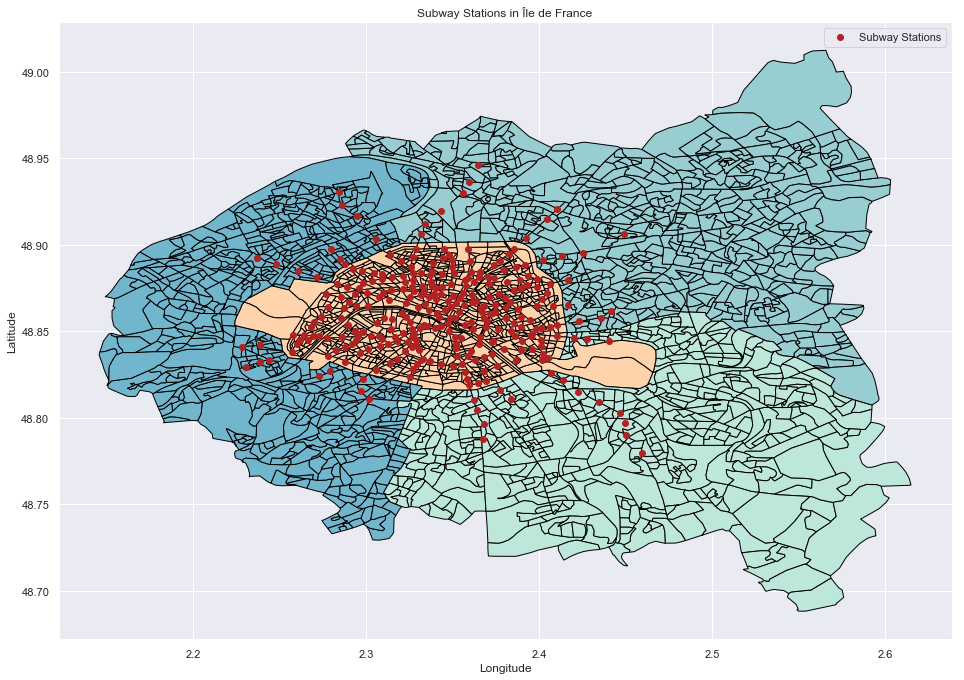

In [13]:
f, ax = plt.subplots(1, figsize=(16, 12))
ax = contour_iris[contour_iris['dep'].isin([75, 92, 93, 94])].plot(
    ax=ax, edgecolor='black', column='dep', cmap='icefire_r')
ax.scatter(station_data[station_data['id'].isin(subway_stations)]['x'],
           station_data[station_data['id'].isin(subway_stations)]['y'], color='firebrick', label='Subway Stations')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Subway Stations in Île de France')
ax.legend()

plt.show();

### Min Max Normalization

Below we apply ``Min Max Normalization`` to data, with a scale range of $[0, 1]$.

In [14]:
data_matrix_6h = pd.Panel(normalize(matrix_6h), 
                         items=dates, 
                         major_axis=subway_stations, 
                         minor_axis=generate_times("6h")
                        )

data_matrix_2h = pd.Panel(normalize(matrix_2h), 
                         items=dates, 
                         major_axis=subway_stations, 
                         minor_axis=generate_times("2h")
                        )

data_matrix_15m_complete = pd.Panel(matrix_15m, 
                                    items=dates, 
                                    major_axis=subway_stations, 
                                    minor_axis=generate_times("15min")
                                   )

Delete the first $4$ hours, from $00.00.00$ to $04.00.00$ because it's useless, the number of validations in that range is mostly equal to 0.

In [15]:
del_hours = 4

In [16]:
data_matrix_15m = data_matrix_15m_complete.iloc[:, :, del_hours*4:]

In [17]:
data_matrix_15m.to_frame().head()

2015-10-01  2015-10-02  2015-10-03  2015-10-04  2015-10-05  \
major minor                                                                  
198   04:00:00         0.0         3.0         0.0         0.0         0.0   
      04:15:00         0.0         0.0         0.0         0.0         2.0   
      04:30:00         0.0         1.0         0.0         0.0         0.0   
      04:45:00         1.0         2.0         0.0         2.0         1.0   
      05:00:00         7.0        11.0         6.0        12.0        10.0   

                2015-10-06  2015-10-07  2015-10-08  2015-10-09  2015-10-10  \
major minor                                                                  
198   04:00:00         0.0         0.0         2.0         0.0         0.0   
      04:15:00         0.0         0.0         0.0         0.0         0.0   
      04:30:00         0.0         0.0         0.0         0.0         0.0   
      04:45:00         0.0         1.0         0.0         0.0         0.0   
      05:00:00         6.0         9.0        12.0         9.0        13.0   

                   ...      2015-12-22  2015-12-23  2015-12-24  2015-12-25  \
major minor        ...                                                       
198   04:00:00     ...             0.0         0.0         0.0         0.0   
      04:15:00     ...             0.0         0.0         0.0         0.0   
      04:30:00     ...             1.0         1.0         2.0         1.0   
      04:45:00     ...             2.0         0.0         0.0         2.0   
      05:00:00     ...            11.0         9.0         7.0         1.0   

                2015-12-26  2015-12-27  2015-12-28  2015-12-29  2015-12-30  \
major minor                                                                  
198   04:00:00         0.0         0.0         0.0         0.0         0.0   
      04:15:00         0.0         0.0         0.0         0.0         0.0   
      04:30:00         0.0         1.0         0.0         0.0         0.0   
      04:45:00         0.0         0.0         0.0         0.0         0.0   
      05:00:00         5.0        10.0        12.0        10.0        10.0   

                2015-12-31  
major minor                 
198   04:00:00         0.0  
      04:15:00         0.0  
      04:30:00         0.0  
      04:45:00         2.0  
      05:00:00         5.0  

[5 rows x 92 columns]

In [18]:
dmatrix_mean_6h = data_matrix_6h.mean()
dmatrix_mean_2h = data_matrix_2h.mean()
dmatrix_mean_15m = data_matrix_15m.mean()

dtmatrix_mean_6h = dmatrix_mean_6h.transpose()
dtmatrix_mean_2h = dmatrix_mean_2h.transpose()
dtmatrix_mean_15m = dmatrix_mean_15m.transpose()

Again, this is another way to print the stations with a small number of validations.

In [19]:
data_matrix_15m.mean(axis=0)[data_matrix_15m.mean(axis=0).sum(axis=1) < 810];

In [20]:
dmatrix_mean_15m.head()
dtmatrix_mean_15m.head()

,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,...,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-26,2015-12-27,2015-12-28,2015-12-29,2015-12-30,2015-12-31
04:00:00,0.112211,0.188119,0.036304,0.392739,0.072607,0.095710,0.099010,0.108911,0.108911,0.072607,...,0.066007,0.102310,0.066007,0.029703,0.036304,0.013201,0.062706,0.089109,0.069307,0.075908
04:15:00,0.138614,0.138614,0.029703,0.554455,0.092409,0.082508,0.145215,0.072607,0.108911,0.072607,...,0.075908,0.069307,0.056106,0.036304,0.013201,0.000000,0.085809,0.089109,0.062706,0.102310
04:30:00,0.174917,0.148515,0.059406,0.422442,0.075908,0.141914,0.141914,0.165017,0.105611,0.102310,...,0.135314,0.135314,0.128713,0.112211,0.099010,0.079208,0.161716,0.108911,0.099010,0.079208
04:45:00,0.376238,0.462046,0.481848,1.072607,0.396040,0.501650,0.491749,0.584158,0.590759,0.478548,...,0.468647,0.521452,0.442244,0.339934,0.346535,0.346535,0.432343,0.419142,0.409241,0.495050
05:00:00,2.643564,3.079208,2.458746,3.900990,2.973597,3.112211,3.293729,3.468647,3.254125,2.732673,...,2.696370,3.207921,2.920792,1.217822,2.019802,1.795380,2.805281,2.993399,3.112211,2.798680


,04:00:00,04:15:00,04:30:00,04:45:00,05:00:00,05:15:00,05:30:00,05:45:00,06:00:00,06:15:00,...,21:30:00,21:45:00,22:00:00,22:15:00,22:30:00,22:45:00,23:00:00,23:15:00,23:30:00,23:45:00
2015-10-01,0.112211,0.138614,0.174917,0.376238,2.643564,19.864686,31.471947,31.874587,40.541254,48.481848,...,70.927393,66.881188,65.399340,60.584158,60.755776,64.207921,75.128713,64.590759,52.138614,43.818482
2015-10-02,0.188119,0.138614,0.148515,0.462046,3.079208,22.399340,34.537954,34.650165,41.858086,50.056106,...,78.590759,73.495050,70.907591,65.983498,66.211221,62.917492,66.330033,63.188119,57.755776,54.673267
2015-10-03,0.036304,0.029703,0.059406,0.481848,2.458746,14.254125,20.429043,19.184818,22.465347,24.531353,...,82.211221,77.181518,73.755776,72.805281,74.570957,76.264026,83.947195,80.049505,76.587459,72.772277
2015-10-04,0.392739,0.554455,0.422442,1.072607,3.900990,15.920792,19.696370,16.963696,16.247525,17.610561,...,43.570957,43.818482,41.745875,37.462046,36.722772,37.283828,52.759076,37.158416,31.211221,25.254125
2015-10-05,0.072607,0.092409,0.075908,0.396040,2.973597,20.858086,32.630363,32.729373,39.689769,52.072607,...,61.039604,52.346535,53.125413,46.059406,45.498350,41.036304,41.254125,35.336634,28.003300,22.801980


ù### With Outliers

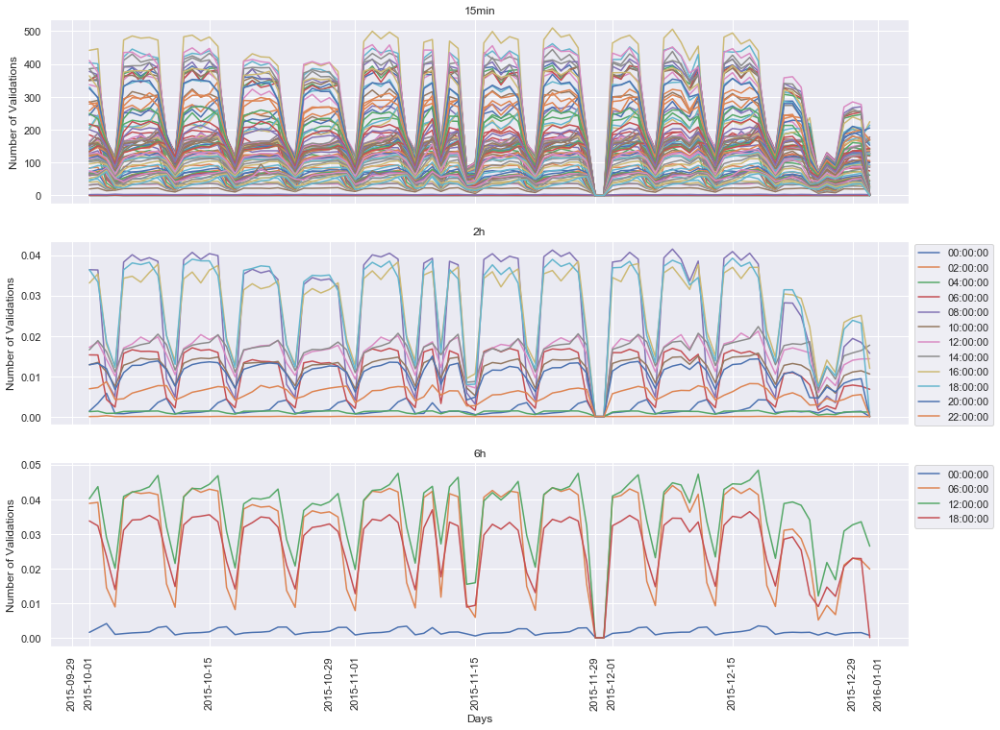

In [21]:
f, ax = plt.subplots(3, figsize=(16, 12))
ax1 = dtmatrix_mean_15m.plot(ax=ax[0], legend=False)
ax1.set_xticklabels([])
ax1.set_ylabel('Number of Validations')
ax1.set_title('15min')

ax2 = dtmatrix_mean_2h.plot(ax=ax[1])
ax2.set_xticklabels([])
ax2.set_ylabel('Number of Validations')
ax2.set_title('2h')
ax2.legend(bbox_to_anchor=(1., 1.01))

ax3 = dtmatrix_mean_6h.plot(ax=ax[2])
ax3.set_xlabel('Days')
ax3.set_ylabel('Number of Validations')
ax3.set_title('6h')
ax3.legend(bbox_to_anchor=(1., 1.01))

plt.xticks(rotation=90)
plt.show();

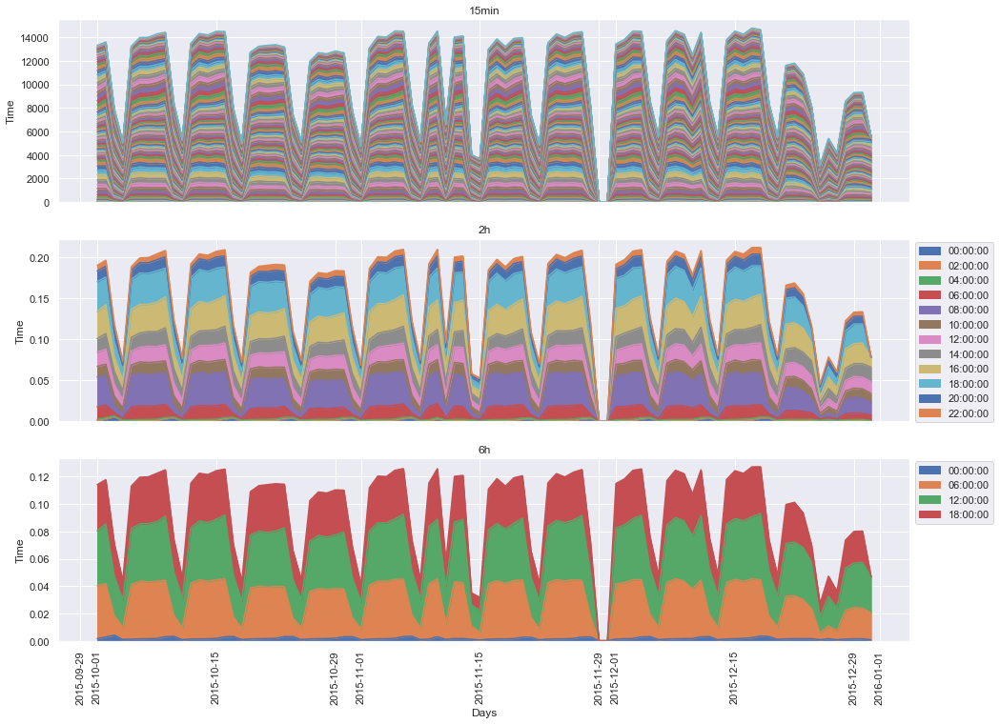

In [22]:
f, ax = plt.subplots(3, figsize=(16, 12))
ax1 = dtmatrix_mean_15m.plot.area(ax=ax[0], legend=False)
ax1.set_xticklabels([])
ax1.set_ylabel('Time')
ax1.set_title('15min')

ax2 = dtmatrix_mean_2h.plot.area(ax=ax[1])
ax2.set_xticklabels([])
ax2.set_ylabel('Time')
ax2.set_title('2h')
ax2.legend(bbox_to_anchor=(1., 1.01))

ax3 = dtmatrix_mean_6h.plot.area(ax=ax[2])
ax3.set_xlabel('Days')
ax3.set_ylabel('Time')
ax3.set_title('6h')
ax3.legend(bbox_to_anchor=(1., 1.01), loc=2)

plt.xticks(rotation=90)
plt.show();

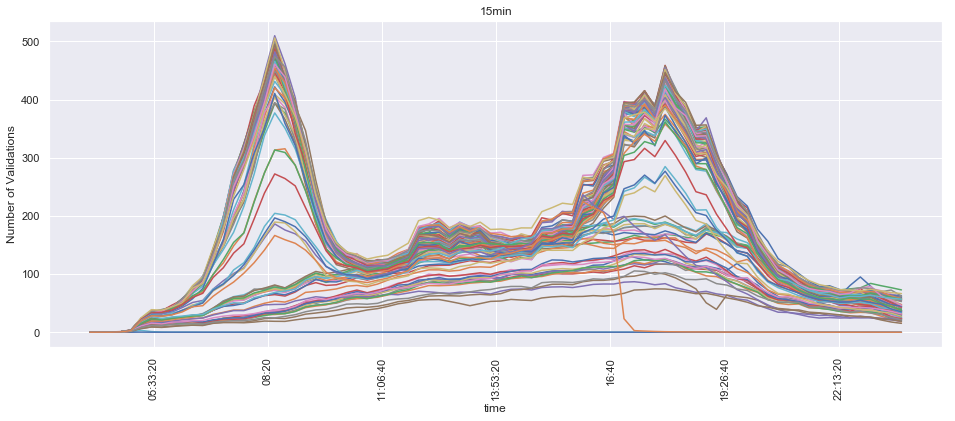

In [23]:
fig = plt.figure(figsize=(16, 6))
gs = gridspec.GridSpec(1, 1)
ax = fig.add_subplot(gs[0])
dmatrix_mean_15m.plot(ax=ax, legend=False)
plt.ylabel('Number of Validations')
plt.title('15min')

plt.xticks(rotation=90)
plt.show();

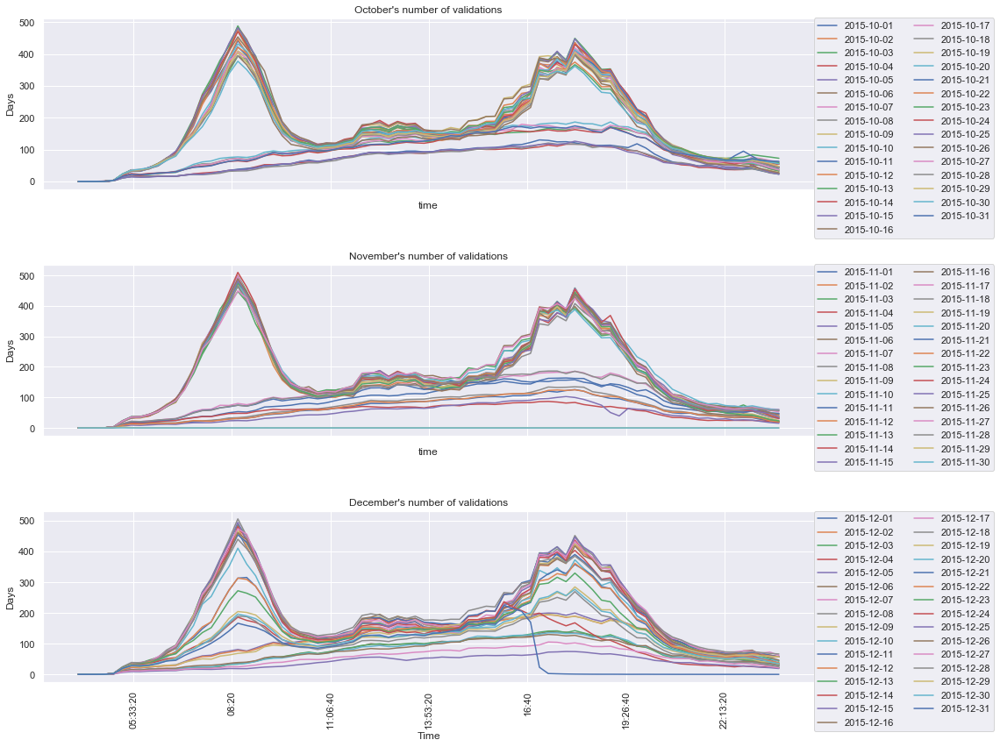

In [24]:
f, ax = plt.subplots(3, figsize=(16, 12))
ax1 = dmatrix_mean_15m.iloc[:, :31].plot(ax=ax[0])
ax1.set_xticklabels([])
ax1.set_ylabel('Days')
ax1.set_title('October\'s number of validations')
ax1.legend(bbox_to_anchor=(1., 0.9, 1.1, .102), ncol=2, loc=2,
           borderaxespad=0.)


ax2 = dmatrix_mean_15m.iloc[:, 31:61].plot(ax=ax[1])
ax2.set_xticklabels([])
ax2.set_ylabel('Days')
ax2.set_title('November\'s number of validations')
ax2.legend(bbox_to_anchor=(1., 0.9, 1.1, .102), ncol=2, loc=2,
           borderaxespad=0.)

ax3 = dmatrix_mean_15m.iloc[:, 61:].plot(ax=ax[2])
ax3.set_xlabel('Time')
ax3.set_ylabel('Days')
ax3.set_title('December\'s number of validations')
plt.legend(bbox_to_anchor=(1., 0.9, 1.1, .102), loc=2,
           ncol=2, borderaxespad=0.)

plt.xticks(rotation=90)
plt.tight_layout()

plt.show();

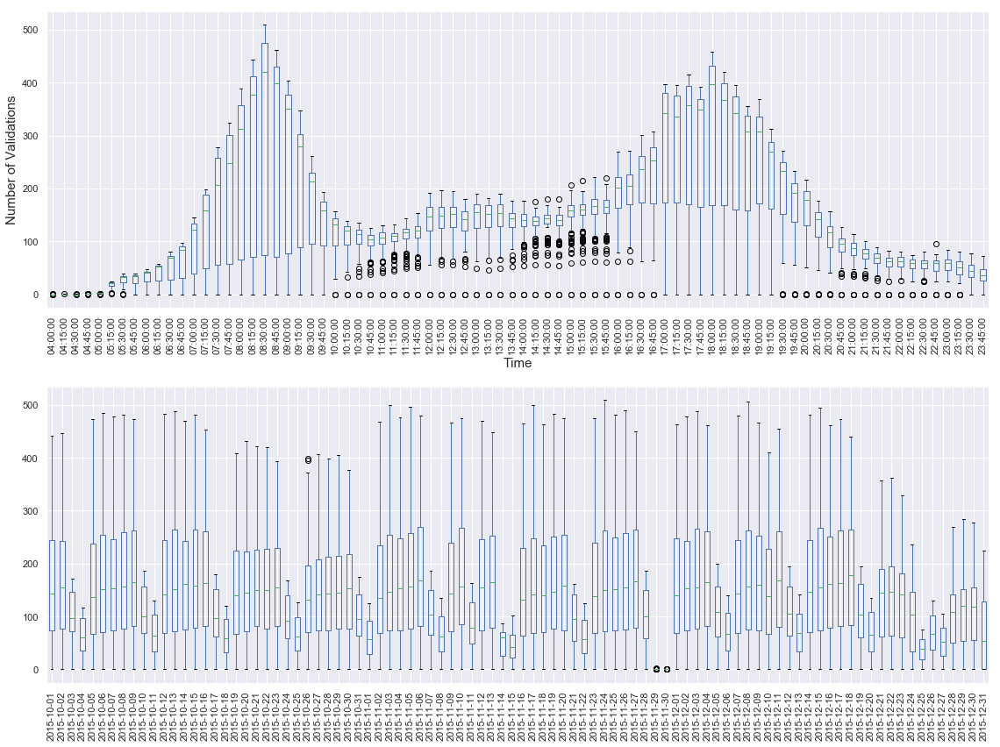

In [25]:
f, ax = plt.subplots(2, figsize=(16, 12))

ax1 = dtmatrix_mean_15m.boxplot(return_type='both', ax=ax[0])
ax[0].set_xlabel("Time", fontsize=15)
ax[0].set_ylabel("Number of Validations", fontsize=15)

for tick in ax[0].get_xticklabels():
    tick.set_rotation(90)

ax2 = dmatrix_mean_15m.boxplot(return_type='both', ax=ax[1])
plt.xticks(rotation=90)

plt.tight_layout()
plt.show();

### Defining useful variables

In [26]:
from __init__ import *

In [27]:
wd_15m = data_matrix_15m.loc[dict_w.values()]
wdm_15m = wd_15m.mean()
wdmt_15m = wdm_15m.transpose()

wd_15mf = data_matrix_15m.loc[dict_wd_final.values()]
wdm_15mf = wd_15mf.mean()
wdmt_15mf = wdm_15mf.transpose()

### Without outliers

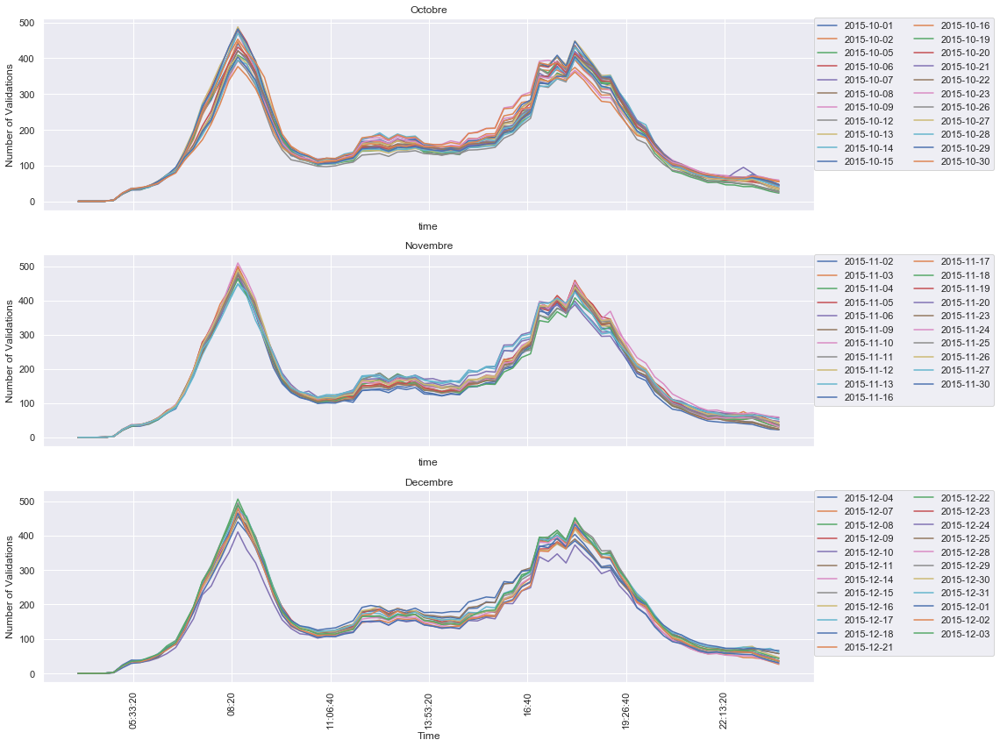

In [28]:
f, ax = plt.subplots(3, figsize=(16, 12))
ax1 = wdm_15m.loc[:, dict_wd_oct.values()].plot(ax=ax[0])
ax1.set_xticklabels([])
ax1.set_ylabel('Number of Validations')
ax1.set_title('Octobre')
ax1.legend(bbox_to_anchor=(1., 0.9, 1.1, .102), ncol=2, loc=2,
           borderaxespad=0.)

ax2 = wdm_15m.loc[:, dict_wd_nov.values()].plot(ax=ax[1])
ax2.set_xticklabels([])
ax2.set_ylabel('Number of Validations')
ax2.set_title('Novembre')
ax2.legend(bbox_to_anchor=(1., 0.9, 1.1, .102), ncol=2, loc=2,
           borderaxespad=0.)

ax3 = wdm_15m.loc[:, dict_wd_dec.values()].plot(ax=ax[2])
ax3.set_xlabel('Time')
ax3.set_ylabel('Number of Validations')
ax3.set_title('Decembre')
plt.legend(bbox_to_anchor=(1., 0.9, 1.1, .102), loc=2,
           ncol=2, borderaxespad=0.)

plt.xticks(rotation=90)
plt.tight_layout()

plt.show();

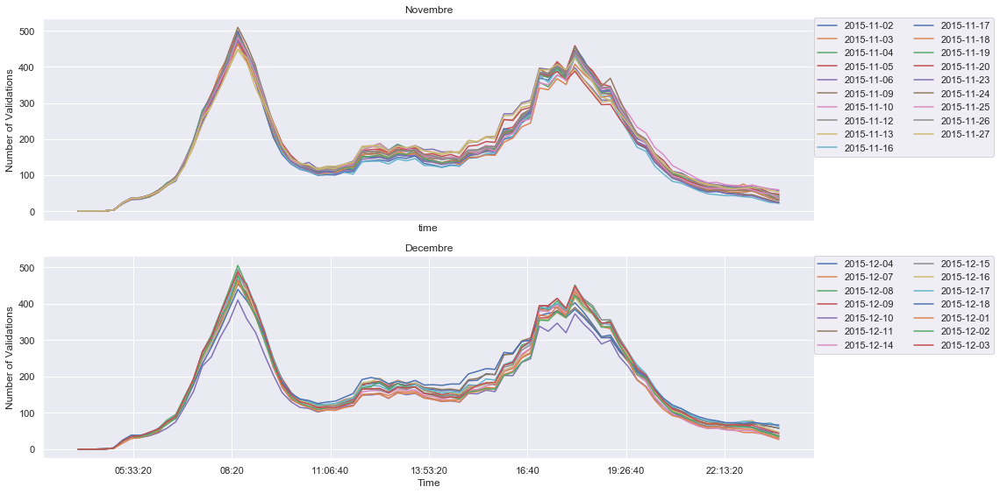

In [29]:
f, ax = plt.subplots(2, figsize=(16, 8))

ax1 = wdm_15mf.loc[:, dict_wd_novf.values()].plot(ax=ax[0])
ax1.set_xticks([])
ax1.set_ylabel('Number of Validations')
ax1.set_title('Novembre')
ax1.legend(bbox_to_anchor=(1., 0.9, 1.1, .102), ncol=2, loc=2,
           borderaxespad=0.)

ax2 = wdm_15mf.loc[:, dict_wd_decf.values()].plot(ax=ax[1])
ax2.set_xlabel('Time')
ax2.set_ylabel('Number of Validations')
ax2.set_title('Decembre')
plt.legend(bbox_to_anchor=(1., 0.9, 1.1, .102), loc=2,
           ncol=2, borderaxespad=0.)
plt.tight_layout()

plt.show();

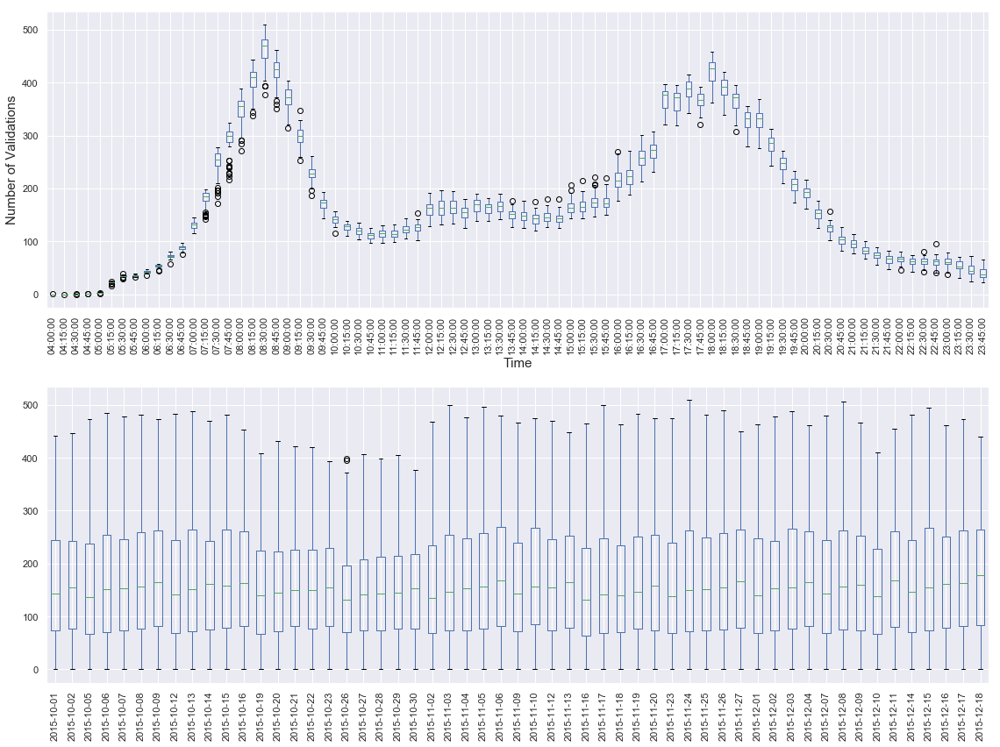

In [30]:
f, ax = plt.subplots(2, figsize=(16, 12))

ax1 = wdmt_15mf.boxplot(return_type='both', ax=ax[0])
ax[0].set_xlabel("Time", fontsize=15)
ax[0].set_ylabel("Number of Validations", fontsize=15)

for tick in ax[0].get_xticklabels():
    tick.set_rotation(90)

ax2 = wdm_15mf.boxplot(return_type='both', ax=ax[1])
plt.xticks(rotation=90)

plt.tight_layout()
plt.show();

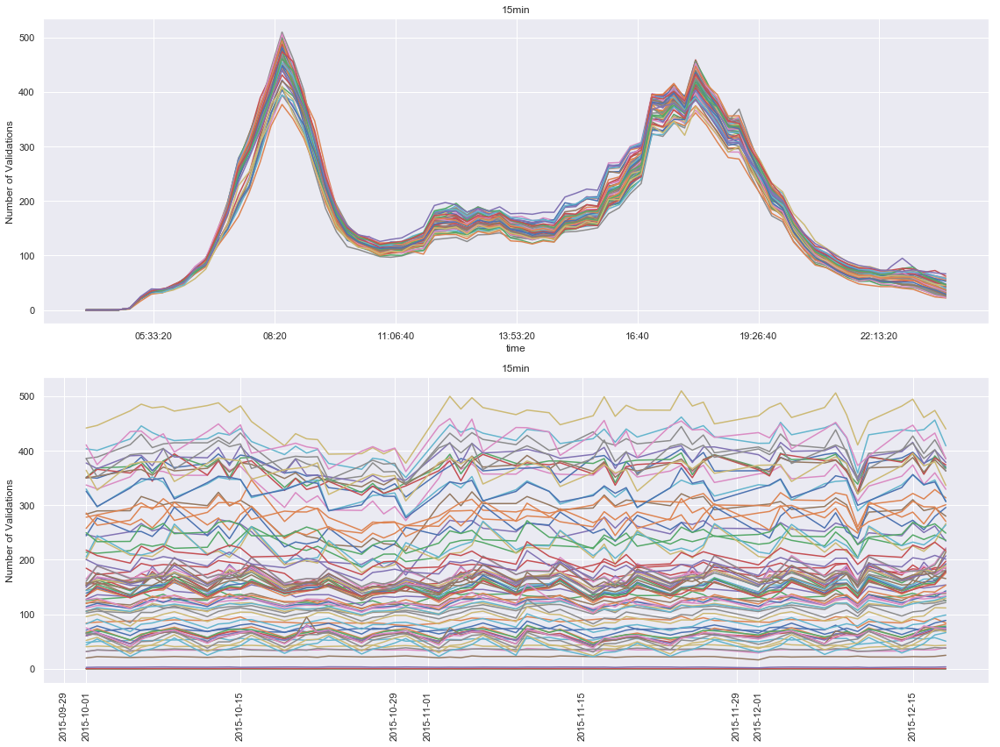

In [31]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(16, 12))

wdm_15mf.plot(ax=ax1, legend=False)
ax1.set_ylabel('Number of Validations'); ax1.set_title('15min')

ax2 = wdmt_15mf.plot(ax=ax2, legend=False)
ax2.set_ylabel('Number of Validations'); ax2.set_title('15min')

plt.xticks(rotation=90)
plt.tight_layout()

plt.show();

### Autocorrelation Plots

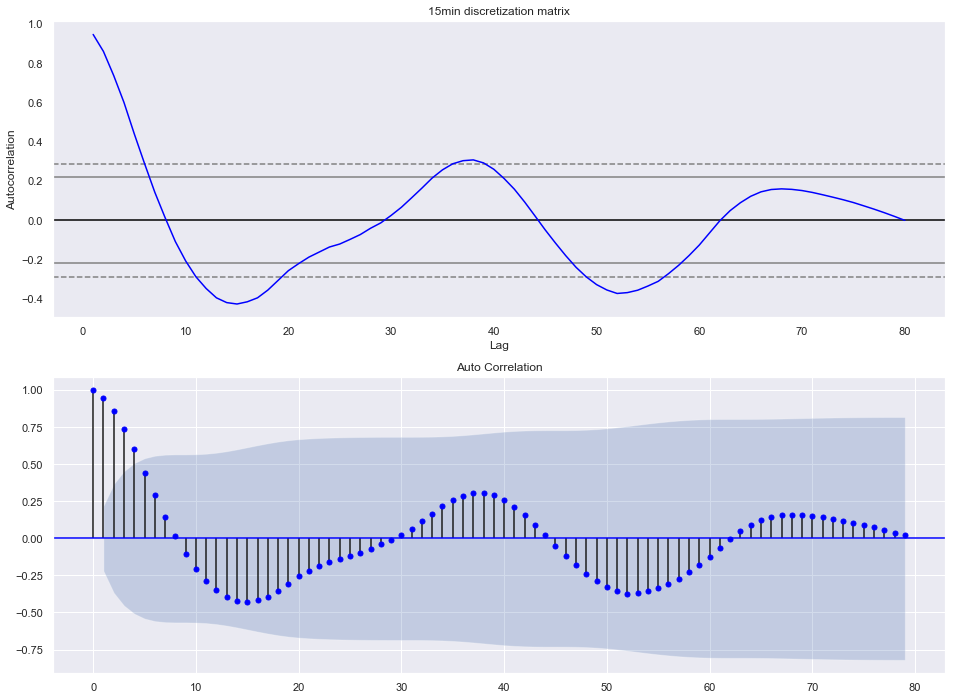

In [32]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(16, 12))

autocorrelation_plot(wdmt_15mf.mean(), ax=ax1, c='blue')
ax1.set_title('15min discretization matrix')

plot_acf(wdmt_15mf.mean(), ax=ax2, c='blue', title='Auto Correlation')

plt.show();

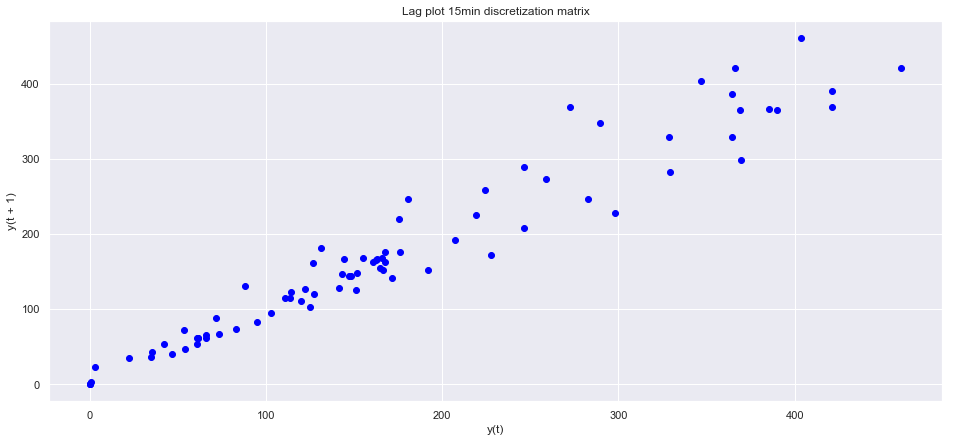

In [33]:
plt.figure(figsize=(16, 7))

lag_plot(wdmt_15mf.mean(), c='blue')
plt.title('Lag plot 15min discretization matrix')

# plot_pacf(wdmt_15mf.mean(), ax=ax[1], c='blue', title='Partial Auto Correlation')

plt.show();

### Splitting Data into Train and Test

In [46]:
# Without outliers with the weekend
dico = dict_w
# Without outliers and without weekend
# dico = dict_wd_final
size = 55

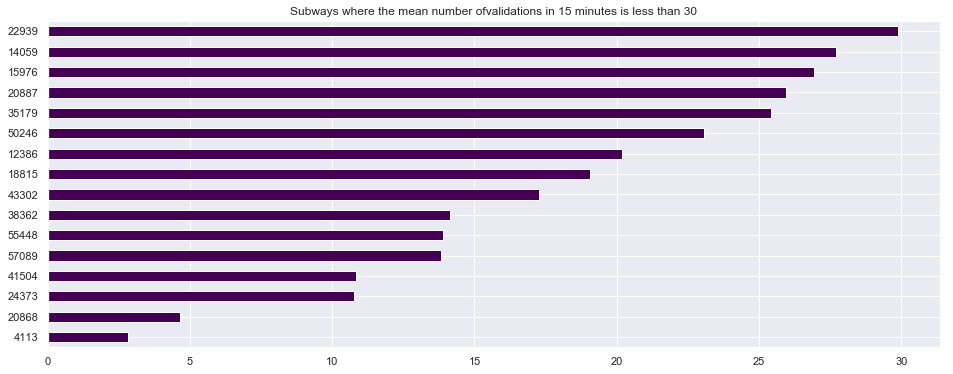

In [66]:
# Define X
X = data_matrix_15m.loc[dico.values()]

# Plot the station's id where the number of validations is less than the
# defined number 'nb_val' below
nb_val = 30
m = X.mean(axis=0).T.mean()
m[m < nb_val].sort_values().plot(kind='barh', grid=True, 
                                 cmap='viridis', 
                                 title="Subways where the mean number of"\
                                 "validations in 15 minutes is less than "\
                                 "{}".format(nb_val),
                                 figsize=(16, 6));

# Delete the stations where the mean number of validations is between 3 and 6
stations_to_del = [4113, 20868]
X.drop(columns=stations_to_del, inplace=True)

In [67]:
Xm = X.mean()
Xmt = Xm.transpose()

try:
    for s in stations_to_del:
        subway_stations.remove(s)
except:
    pass

In [68]:
kw = list(dico.keys())
np.random.shuffle(kw)

vw = [dico[i] for i in kw]

In [69]:
ind_train = vw[:size]
ind_test = vw[size:]
X_train = X[sorted(ind_train)]
X_test = X[sorted(ind_test)]

In [34]:
X_train
X_test

In [35]:
X_min_max = X_train.apply(lambda x: (x.min().min(), x.max().max()), axis=(0, 2))

In [36]:
def normalize(X, X_min_max, station_id, a=0, b=1):
    """
    """
    mini, maxi = X_min_max.loc[station_id]
    return (a + ((X.loc[:, station_id] - mini) * (b - a)) / (maxi - mini)).values

def denormalize(X, X_min_max, station_id, a=0, b=1):
    """
    """
    mini, maxi = X_min_max.loc[station_id]
    return (((X.loc[:, station_id] - a) * (maxi - mini)) / (b - a) + mini).values
    

In [37]:
a, b = -1, 1
Xn_train = X_train.apply(lambda x: a + ((x - x.min().min()) * (b - a)) /(x.max().max() - x.min().min()), 
                         axis=(0, 2)).transpose(2, 0, 1)

In [38]:
# Normalize X_test
Xn_test = pd.Panel(np.array(list(map(lambda station_id: normalize(X_test, 
                                                                  X_min_max, 
                                                                  station_id, a=a, b=b), 
                                     X_test.transpose(1, 0, 2)))).transpose(2, 0, 1),
                   items=list(X_test.items),
                   major_axis=subway_stations,
                   minor_axis=generate_times("15min")[(del_hours * 4):])

# Denormalize X_test to verify that it is working
Xdn_test = pd.Panel(np.array(list(map(lambda station_id: denormalize(Xn_test, 
                                                                     X_min_max, 
                                                                     station_id, a=a, b=b), 
                                     Xn_test.transpose(1, 0, 2)))).transpose(2, 0, 1),
                   items=list(Xn_test.items),
                   major_axis=subway_stations,
                   minor_axis=generate_times("15min")[(del_hours * 4):])

## Models

### Baseline

In [39]:
def baseline_plot_results(levels, X_train=X_train, X_test=X_test, first_ndays=7):
    """
    
    """
    
    baseline_scores = []
    baseline_preds = []
    for level in levels:
        b = Baseline(level=level, first_ndays=first_ndays)
        b.fit(X_train)
        baseline_preds.append(b.predict(X_test))
        baseline_scores.append(b.score(X_test))
    
    df_baseline_scores = pd.DataFrame(np.array(baseline_scores).T,
                                 index=['R2', 'RMSE', 'MSE', 'MAE', 'MAPE', 'MPE'],
                                 columns=levels)
    display(HTML(df_baseline_scores.to_html()))
    pd.DataFrame(df_baseline_scores.loc['RMSE'].values.repeat(4).reshape(-1, 4).T,
                 columns=levels).plot(figsize=(16, 4), kind='line');
    
    return df_baseline_scores, baseline_preds

In [40]:
levels = ["None", "s"]
df_baseline_scores, baseline_preds = baseline_plot_results(levels)

In [41]:
from cost_functions import mse, mse_g
from sklearn.linear_model import LinearRegression, Lasso

class myAR(Regressor):
    def __init__(self, order=4, level=None, loss=mse, loss_g=mse_g, max_iter=1000,
                 eps=0.01):
        """ Initialisation des paramètres du perceptron

        :param order: Taille de la fenêtre glissante
        :param loss: fonction de coût
        :param loss_g: gradient de la fonction coût
        :param max_iter: nombre maximum d'itération de la fonction coût
        :param eps: pas du gradient


        """

        self.order = order
        self.level = level
        self.max_iter, self.eps = max_iter, eps
        self.loss, self.loss_g = loss, loss_g
        self.w = np.random.random(self.order)
                      
    
    @Regressor.datax_decorator
    def analytic_fit(self, datax):
        """ Finds the optimal weigths analytically 
        
        :param datax: contient tous les exemples du dataset
        :returns: void
        :rtype: None
        
        """
        
        self.reg = LinearRegression()
        _, self.X, self.y = datax
        A, B = self.X.T.dot(self.X), self.X.T.dot(self.y)
        self.w1 = np.linalg.solve(A, B).ravel()
        self.reg.fit(self.X, self.y)
        self.w = self.reg.coef_.squeeze()
        display(HTML(pd.DataFrame(self.w.reshape(1, -1), index=['Weights'], 
                                  columns=range(1, len(self.w)+1)).to_html()))
        return self

    def minibatch_fit(self, datax):
        """ Mini-Batch gradient descent Learning

        :param datax: contient tous les exemples du dataset
        
        """

        for _ in range(self.max_iter):
            for d in range(datax.shape[0]):
                for t in range(datax.shape[2] - self.order):
                    batchx = datax.iloc[d, :, t:t + self.order].values
                    batchy = datax.iloc[d, :, t + self.order].values
                    self.w -= (self.eps * self.loss_g(batchx, batchy, self.w))
    
    def reshaped(self, y_pred, datax):
        """
        """
        
        if datax.ndim == 3:
            return y_pred.reshape((datax.shape[0] * datax.shape[1], 
                                datax.shape[2] - self.order), 
                                order='F').reshape((datax.shape[0],
                                                   datax.shape[1],
                                                   datax.shape[2] - self.order))
        elif datax.ndim == 2:
            return y_pred.reshape((datax.shape[0], datax.shape[1] - self.order),
                                order='F')
    
    @Regressor.datax_decorator
    def forecast(self, datax, tplus):
        """
        
        """
        
        datax, self.X_test, self.y_test = datax
        
        if tplus == 1:
            return self.reshaped(self.reg.predict(self.X_test), datax)
            
        else:
            self.X_test = self.X_test.reshape(datax.shape[-1] - self.order, -1, self.order)
        
            tmp = self.X_test[0]
            y_pred = self.reg.predict(tmp)
            pred = y_pred.copy()

            for x in self.X_test[1:]:
                x[:, -1] = pred.squeeze()
                x[:, -tplus:-1] = tmp[:, -tplus+1:]
                tmp = x.copy()
                pred = self.reg.predict(tmp)
                y_pred = np.vstack((y_pred, pred))

            return self.reshaped(y_pred, datax)

In [42]:
class ARMA2(myAR):
    def __init__(self, p, q, tplus, level=None, loss=mse, loss_g=mse_g, max_iter=1000,
                 eps=0.01, fit_intercept=True):
        """
        
        """
        
        super().__init__(p, level, loss, loss_g, max_iter, eps)
        self.p = p
        self.q = q
        self.tplus = tplus
        
        # q cannot be greater than t-1
        if self.q > self.tplus - 1:
            self.q = self.tplus - 1
            
        # For bias
        self.fit_intercept = fit_intercept
    
    @Regressor.datax_decorator
    def decorate_shape(self, datax):
        """
        """
        
        return datax
    
    @Regressor.datax_decorator
    def fit(self, datax):
        """
        
        """
        
        datax, self.X_train, self.y_train = datax
        
        # Fit on train data
        super().analytic_fit(datax)
        
        # Predict on train data
        y_pred_train = super().forecast(datax, self.tplus)
        
        # Compute residuals
        
        if datax.ndim == 3:
            residuals = y_pred_train - datax.iloc[:, :, self.p:].values

            # Add zeros to the residuals and convert it into panel to match datax
            zeros = np.zeros((residuals.shape[0], residuals.shape[1], self.p))
            residuals = np.concatenate((zeros, residuals), axis=2)
            pd_residuals =  pd.Panel(residuals,
                                     items=list(datax.items),
                                     major_axis=list(datax.major_axis),
                                     minor_axis=list(datax.minor_axis))
        elif datax.ndim == 2:
            residuals = y_pred_train - datax.iloc[:, self.p:].values

            # Add zeros to the residuals and convert it into panel to match datax
            zeros = np.zeros((residuals.shape[0], self.p))
            residuals = np.concatenate((zeros, residuals), axis=1)
            pd_residuals =  pd.DataFrame(residuals,
                                         index=list(datax.index),
                                         columns=list(datax.columns))
                                             
        # Reshaping X_err_train to match X_train
        residuals, X_err_train, y_err_train = self.decorate_shape(pd_residuals)
        
        # Add self.q errors to X_train
        self.X_train = self.X_train if self.q == 0 else np.concatenate(
            (self.X_train, X_err_train[:, -self.q:]), axis=1)
        
        # Fit new training data (with residuals)
        self.reg = LinearRegression(fit_intercept=self.fit_intercept)
        self.reg.fit(self.X_train, self.y_train)
        self.w = self.reg.coef_.squeeze()
        display(HTML(pd.DataFrame(self.w.reshape(1, -1), index=['Weights'], 
                                  columns=range(1, len(self.w)+1)).to_html()))
        
        return self

    @Regressor.datax_decorator
    def forecast(self, datax):
        """
        
        """
        
        datax, self.X_test, self.y_test = datax
        zeros = np.zeros((self.X_test.shape[0], self.q))
        if self.tplus == 1:
            self.X_test = np.concatenate((self.X_test, zeros), axis=1)
            return self.reshaped(self.reg.predict(self.X_test), datax)
            
        else:
            zeros = zeros.reshape(datax.shape[-1] - self.order, -1, self.q)
            self.X_test = self.X_test.reshape(datax.shape[-1] - self.order, -1, self.order)
            self.X_test = np.concatenate((self.X_test, zeros), axis=2)
        
            tmp = self.X_test[0]
            y_pred = self.reg.predict(tmp)
            pred = y_pred.copy()

            for x in self.X_test[1:]:
                x[:, -1-self.q] = pred.squeeze()
                x[:, -self.tplus-self.q:-1-self.q] = tmp[:, -self.tplus+1-self.q:-self.q]
                tmp = x.copy()
                pred = self.reg.predict(tmp)
                y_pred = np.vstack((y_pred, pred))

            return self.reshaped(y_pred, datax)
        
class ARMA(myAR):
    def __init__(self, p, q, tplus, level=None, loss=mse, loss_g=mse_g, max_iter=1000,
                 eps=0.01, fit_intercept=True):
        """
        
        """
        
        super().__init__(p, level, loss, loss_g, max_iter, eps)
        self.p = p
        self.q = q
        self.tplus = tplus
        
        # q cannot be greater than p
        if self.q > self.p:
            self.q = self.p
            
        # For bias
        self.fit_intercept = fit_intercept
    
    @Regressor.datax_decorator
    def decorate_shape(self, datax):
        """
        """
        
        return datax
    
    @Regressor.datax_decorator
    def fit(self, datax):
        """
        
        """
        
        datax, self.X_train, self.y_train = datax
        
        # Fit on train data
        super().analytic_fit(datax)
        
        # Predict on train data
        y_pred_train = super().forecast(datax, self.tplus)
        
        # Compute residuals
        
        if datax.ndim == 3:
            residuals = y_pred_train - datax.iloc[:, :, self.p:].values

            # Add zeros to the residuals and convert it into panel to match datax
            zeros = np.zeros((residuals.shape[0], residuals.shape[1], self.p))
            residuals = np.concatenate((zeros, residuals), axis=2)
            pd_residuals =  pd.Panel(residuals,
                                     items=list(datax.items),
                                     major_axis=list(datax.major_axis),
                                     minor_axis=list(datax.minor_axis))
        elif datax.ndim == 2:
            residuals = y_pred_train - datax.iloc[:, self.p:].values

            # Add zeros to the residuals and convert it into panel to match datax
            zeros = np.zeros((residuals.shape[0], self.p))
            residuals = np.concatenate((zeros, residuals), axis=1)
            pd_residuals =  pd.DataFrame(residuals,
                                         index=list(datax.index),
                                         columns=list(datax.columns))
                                             
        # Reshaping X_err_train to match X_train
        residuals, X_err_train, y_err_train = self.decorate_shape(pd_residuals)
        
        # Add self.q errors to X_train
        self.X_train = self.X_train if self.q == 0 else np.concatenate(
            (self.X_train, X_err_train[:, :self.q]), axis=1)
        
        # Fit new training data (with residuals)
        self.reg = LinearRegression(fit_intercept=self.fit_intercept)
        self.reg.fit(self.X_train, self.y_train)
        self.w = self.reg.coef_.squeeze()
        display(HTML(pd.DataFrame(self.w.reshape(1, -1), index=['Weights'], 
                                  columns=range(1, len(self.w)+1)).to_html()))
        
        return self

    @Regressor.datax_decorator
    def forecast(self, datax):
        """
        
        """
        
        datax, self.X_test, self.y_test = datax
        zeros = np.zeros((self.X_test.shape[0], self.q))
        if self.tplus == 1:
            self.X_test = np.concatenate((self.X_test, zeros), axis=1)
            return self.reshaped(self.reg.predict(self.X_test), datax)
            
        else:
            zeros = zeros.reshape(datax.shape[-1] - self.order, -1, self.q)
            self.X_test = self.X_test.reshape(datax.shape[-1] - self.order, -1, self.order)
            self.X_test = np.concatenate((self.X_test, zeros), axis=2)
        
            tmp = self.X_test[0]
            y_pred = self.reg.predict(tmp)
            pred = y_pred.copy()

            for x in self.X_test[1:]:
                x[:, -1-self.q] = pred.squeeze()
                x[:, -self.tplus - self.q:-1 - self.q] = tmp[:, -self.tplus + 1 - self.q:-self.q]
                tmp = x.copy()
                pred = self.reg.predict(tmp)
                y_pred = np.vstack((y_pred, pred))

            return self.reshaped(y_pred, datax)

In [43]:
def panelIt(X_pred, X_test, order, subway_stations, del_hours=0):
    """

    """

    wd_testorder_15m = X_test.iloc[:, :, order:]
    minor_axis = generate_times("15min")[(del_hours * 4) + order:]
    
    return pd.Panel(X_pred,
                    items=list(wd_testorder_15m.items),
                    major_axis=subway_stations,
                    minor_axis=minor_axis)

In [44]:
class theAR(Baseline):
    station_id = 0
    def __init__(self, level=None, first_ndays=7, **kwargs):
        """
        
        """
        
        super().__init__(level, first_ndays)
        self.kwargs = kwargs
        
    def fit(self, datax):
        """
        
        """
        
        if self.level is None:
            self.model = myAR(**self.kwargs)
            self.model.analytic_fit(datax)
            
        elif self.level.lower() == "s":
            
            self.models = []            
            
            datax.apply(lambda station: self.models.append(
                myAR(**self.kwargs).analytic_fit(station.T)), 
                        axis=(0, 2))
        
        elif self.level.lower() == "j":
            # TODO
            self.mean = []
            for d in range(self.first_ndays):
                exist_ind = list(set(ddict_days[d].values()) & set(datax.items))
                self.mean.append(datax[exist_ind].mean().mean(axis=1))      
                
        elif self.level.lower() == "sj":
            # TODO
            self.mean = []
            for d in range(self.first_ndays):
                exist_ind = list(set(ddict_days[d].values()) & set(datax.items))
                self.mean.append(datax[exist_ind].mean(axis=0))
        else:
            raise ValueError("Unknown value for level attribute, \
            try: s, j, sj or None")
    
    
    def predict(self, datax, tplus=None):
        """
        
        """
        
        def predict_for_station(x, tplus):
            """
            """
            
            station_pred = self.models[self.station_id].forecast(x, tplus)
            self.station_id += 1
            
            return station_pred
        
        if self.level is None:
            
            X_pred = self.model.forecast(datax, tplus)
            return panelIt(X_pred, datax, self.model.order, subway_stations, del_hours)
            
        elif self.level.lower() == "s":
            
            X_pred = datax.apply(lambda x: predict_for_station(x.T, tplus), 
                                 axis=(0, 2)).transpose(1, 0, 2)
            self.station_id = 0
            
            return panelIt(X_pred.values, datax, self.models[0].order, subway_stations, del_hours)
        
        elif self.level.lower() == "j":
            # TODO
            pass
        elif self.level.lower() == "sj":
            # TODO
            pass
        else:
            raise ValueError("Unknown value for level attribute, \
            try: s, j, sj or None")
    
    
    def score(self, datax, X_pred, level):
        """
        """
        
        if level == None:
            self.scores = super().metrics_score(
                datax.iloc[:, :, self.model.order:], X_pred.values)
        elif level == 's':
            self.scores = super().metrics_score(
                datax.iloc[:, :, self.models[0].order:], X_pred.values)
            
        return self.scores
    

In [45]:
class theARMA(theAR):
    station_id = 0
    def __init__(self, p, q, tplus, level=None, first_ndays=7, **kwargs):
        """
        
        """
        
        super().__init__(level, first_ndays, **kwargs)
        self.p = p
        self.q = q
        self.tplus = tplus
        self.kwargs = kwargs
        
    def fit(self, datax):
        """
        
        """
        
        if self.level is None:
            self.model = ARMA(p=self.p, q=self.q, tplus=self.tplus)
            self.model.fit(datax)
            
        elif self.level.lower() == "s":
            
            self.models = []            
            
            datax.apply(lambda station: self.models.append(
                ARMA(p=self.p, q=self.q, tplus=self.tplus).fit(station.T)), 
                        axis=(0, 2))
        
        elif self.level.lower() == "j":
            # TODO
            self.mean = []
            for d in range(self.first_ndays):
                exist_ind = list(set(ddict_days[d].values()) & set(datax.items))
                self.mean.append(datax[exist_ind].mean().mean(axis=1))      
                
        elif self.level.lower() == "sj":
            # TODO
            self.mean = []
            for d in range(self.first_ndays):
                exist_ind = list(set(ddict_days[d].values()) & set(datax.items))
                self.mean.append(datax[exist_ind].mean(axis=0))
        else:
            raise ValueError("Unknown value for level attribute, \
            try: s, j, sj or None")
    
    
    def predict(self, datax):
        """
        
        """
        
        def predict_for_station(x):
            """
            """
            
            station_pred = self.models[self.station_id].forecast(x)
            self.station_id += 1
            
            return station_pred
        
        if self.level is None:
            
            X_pred = self.model.forecast(datax)
            return panelIt(X_pred, datax, self.model.order, subway_stations, del_hours)
            
        elif self.level.lower() == "s":
            
            X_pred = datax.apply(lambda x: predict_for_station(x.T), 
                                 axis=(0, 2)).transpose(1, 0, 2)
            self.station_id = 0
            
            return panelIt(X_pred.values, datax, self.models[0].order, subway_stations, del_hours)
        
        elif self.level.lower() == "j":
            # TODO
            pass
        elif self.level.lower() == "sj":
            # TODO
            pass
        else:
            raise ValueError("Unknown value for level attribute, \
            try: s, j, sj or None")

In [46]:
def ar_plot_results(level, order, limit_t, X_train=Xn_train, X_test=Xn_test, 
                    X_min_max=X_min_max, a=a, b=b):
    """
    
    """
    
    ar_scores = []
    ar_preds = []
    ar = theAR(level=level, order=order)
    
    print("Fitting...")
    ar.fit(X_train)
    
    
    Xdn_test = pd.Panel(np.array(list(map(lambda station_id: 
                                          denormalize(X_test, 
                                                      X_min_max, 
                                                      station_id, a=a, b=b), 
                                     X_test.transpose(1, 0, 2)))).transpose(2, 0, 1),
                   items=list(X_test.items),
                   major_axis=subway_stations,
                   minor_axis=generate_times("15min")[(del_hours * 4):])
    
    print("Predicting...")

    for t in range(1, limit_t+1):
        X_pred = ar.predict(X_test, t)
        
        Xdn_pred = pd.Panel(np.array(list(map(lambda station_id: 
                                              denormalize(X_pred, 
                                                         X_min_max, 
                                                         station_id, a=a, b=b),
                                              X_pred.transpose(1, 0, 2)))).transpose(2, 0, 1),
                                     items=list(X_pred.items),
                                     major_axis=list(X_pred.major_axis),
                                     minor_axis=list(X_pred.minor_axis))
        
        ar_preds.append(Xdn_pred)
        
        ar_scores.append(ar.score(Xdn_test, Xdn_pred, level))
    
    display(HTML((pd.DataFrame(np.array(ar_scores).T, 
                               index=['R2', 'RMSE', 'MSE', 'MAE', 'MAPE', 'MPE'], 
                               columns=list(map(
                                   lambda x: "t+"+str(x),
                                   range(1, len(ar_scores)+1))))).to_html()))
    
    
    return ar_preds, ar_scores

def arma_plot_results(level, p, q, limit_t, X_train=Xn_train, X_test=Xn_test, 
                    X_min_max=X_min_max, a=a, b=b):
    """
    
    """
    
    ar_scores = []
    ar_preds = []
    
    Xdn_test = pd.Panel(np.array(list(map(lambda station_id: 
                                          denormalize(X_test, 
                                                      X_min_max, 
                                                      station_id, a=a, b=b), 
                                     X_test.transpose(1, 0, 2)))).transpose(2, 0, 1),
                   items=list(X_test.items),
                   major_axis=subway_stations,
                   minor_axis=generate_times("15min")[(del_hours * 4):])
    
    for t in range(1, limit_t+1):

        arma = theARMA(p, q, t, level=level)

        print("Fitting t+{}...".format(t))
        arma.fit(X_train)
        
        print("Predicting t+{}...".format(t))
        X_pred = arma.predict(X_test)
        
        Xdn_pred = pd.Panel(np.array(list(map(lambda station_id: 
                                              denormalize(X_pred, 
                                                         X_min_max, 
                                                         station_id, a=a, b=b),
                                              X_pred.transpose(1, 0, 2)))).transpose(2, 0, 1),
                                     items=list(X_pred.items),
                                     major_axis=list(X_pred.major_axis),
                                     minor_axis=list(X_pred.minor_axis))
        
        ar_preds.append(Xdn_pred)
        
        ar_scores.append(arma.score(Xdn_test, Xdn_pred, level))
    
    display(HTML((pd.DataFrame(np.array(ar_scores).T, 
                               index=['R2', 'RMSE', 'MSE', 'MAE', 'MAPE', 'MPE'], 
                               columns=list(map(
                                   lambda x: "t+"+str(x),
                                   range(1, len(ar_scores)+1))))).to_html()))
    
    
    return ar_preds, ar_scores


def plot_qualitative_analysis(ar_preds, X_test, limit_t, order, subway_stations, del_hours):
    """
    
    """
    
    fig, ax = plt.subplots(limit_t+1, figsize=(16, limit_t*4))

    wd_testorder_15m = X_test.iloc[:, :, order:]
    wdm_testorder_15m = wd_testorder_15m.mean()

    wdm_testorder_15m.plot(ax=ax[0])
    ax[0].set_ylabel('Number of Validations')
    ax[0].set_title('Test')
    ax[0].legend(bbox_to_anchor=(1., 0.9, 1.1, .102), ncol=2, loc=2,
               borderaxespad=0.)

    for i in range(limit_t):
        pred_t = ar_preds[i].mean()
        pred_t.plot(ax=ax[i+1])
        ax[i+1].set_ylabel('Number of Validations')
        ax[i+1].set_title("Predict t+{}".format(i+1))
        ax[i+1].legend(bbox_to_anchor=(1., 0.9, 1.1, .102), ncol=2, loc=2,
                     borderaxespad=0.)

    plt.tight_layout()
    plt.show();
    
def plot_specific(X_test, baseline_preds, ar_preds, ar_preds_s, order, limit_t, j, s):
    
    fig, ax = plt.subplots(limit_t, figsize=(16, limit_t*5))

    for t in range(limit_t):
        ar_preds[t].iloc[j, s].plot(ax=ax[t], label='General AR')
        ar_preds_s[t].iloc[j, s].plot(ax=ax[t], label='AR By Station')
        X_test.iloc[j, s].plot(ax=ax[t], label="Real values")
        baseline_preds[0].iloc[j, s].plot(ax=ax[t], style=['.--'], label='General Baseline')
        baseline_preds[1].iloc[j, s].plot(ax=ax[t], style=['.--'], label='Baseline per station')
        ax[t].set_ylabel('Number of Validations')
        ax[t].set_title("AR models at t+{} with an order of {}".format(t+1, order))
        ax[t].legend(bbox_to_anchor=(1., 0.9, 1.1, .102), ncol=1, loc=2,
                     borderaxespad=0.)

    plt.tight_layout()
    plt.show();
    
def plot_bispecific(X_test, baseline_preds, ar_preds, ar_preds_s, order, limit_t, j, s):
    
    fig, ax = plt.subplots(limit_t, 2, figsize=(16, limit_t*5))

    for t in range(limit_t):
        ar_preds[t].iloc[j, s].plot(ax=ax[t][0], label='General AR')
        ar_preds_s[t].iloc[j, s].plot(ax=ax[t][1], label='AR By Station')
        for c in range(2):
            X_test.iloc[j, s].plot(ax=ax[t][c], label="Real values")
            baseline_preds[0].iloc[j, s].plot(ax=ax[t][c], style=['.--'], label='General Baseline')
            baseline_preds[1].iloc[j, s].plot(ax=ax[t][c], style=['.--'], label='Baseline per station')
            ax[t][c].set_ylabel('Number of Validations')
            ax[t][c].set_title("AR models at t+{} with an order of {}".format(t+1, order))
            ax[t][c].legend(bbox_to_anchor=(0.68, 0.9, 1.1, .102), ncol=1, loc=2,
                            borderaxespad=0.)
        

    plt.tight_layout()
    plt.show();
    
def plot_diff_along_time(X_test, ar_preds):
    
    order = X_test.shape[2] - ar_preds[0].shape[2]    
    res = []
    for t in range(len(ar_preds)):
        res.append(np.sqrt(((X_test.iloc[:, :, order:].values - 
                           ar_preds[t].values)**2).mean(axis=(0, 1))))
    
    pd_res = pd.DataFrame(np.array(res).T, index=list(ar_preds[t].minor_axis),
                          columns=list(map(lambda x: "t+"+str(x),
                                           range(1, len(ar_preds)+1))))
    pd_res.plot(subplots=True, figsize=(16, len(ar_preds)*2), 
                title='Plot of RMSE between predicted and real values along days')
                                                    

# Must solve it !

### AR

In [47]:
order, limit_t = 4, 4

In [48]:
%%time
ar_preds, ar_scores = ar_plot_results(None, order, limit_t)

In [49]:
plot_diff_along_time(X_test, ar_preds)

In [50]:
%%time
ar_preds_s, ar_scores_s = ar_plot_results("s", order, limit_t)

,t+1,t+2,t+3,t+4
R2,0.961795,-1.235142e+13,-4.302728e+04,0.545317
RMSE,70.365877,1.265203e+09,7.467564e+04,242.748334
MSE,4951.356617,1.600740e+18,5.576451e+09,58926.753468
MAE,0.364859,5.232028e+05,9.440463e+01,1.277999
MAPE,36.485896,5.232028e+07,9.440463e+03,127.799938
MPE,-21.618353,-4.453959e+07,4.483658e+03,-96.850569


CPU times: user 1min 16s, sys: 37.9 s, total: 1min 53s
Wall time: 1min 2s


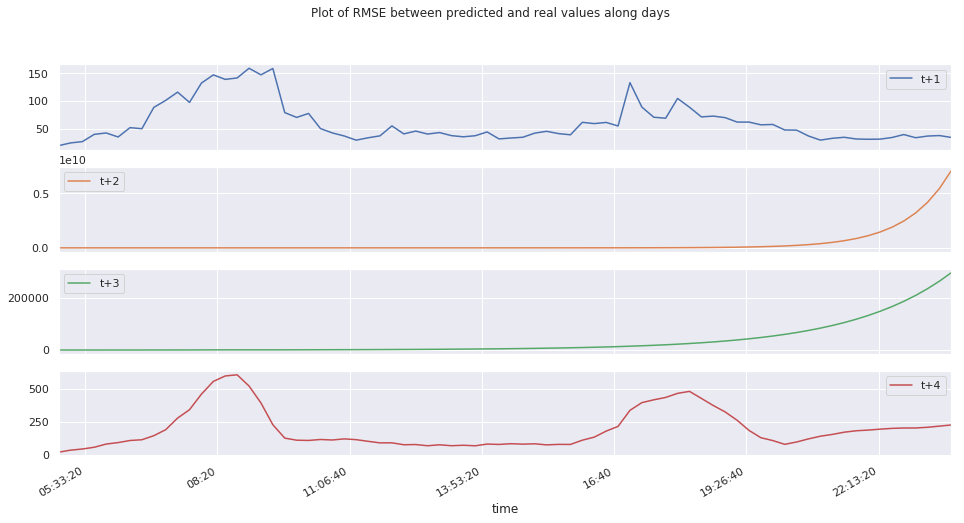

In [51]:
plot_diff_along_time(X_test, ar_preds_s)

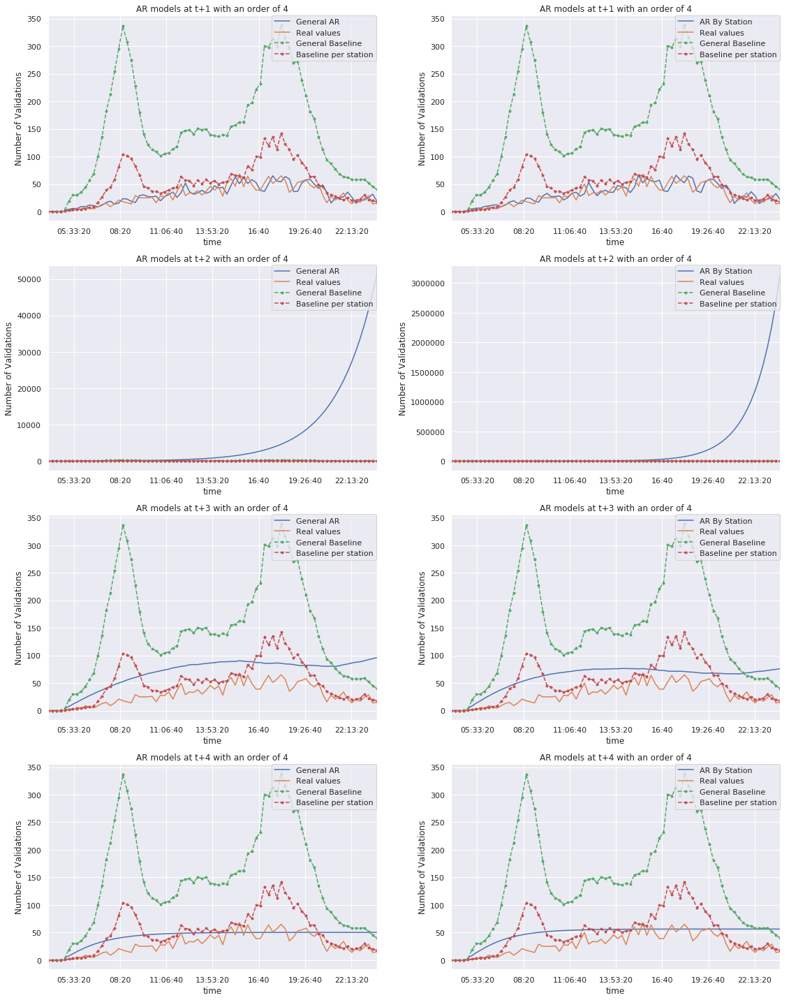

In [52]:
j, s = 2, 100
plot_bispecific(X_test, baseline_preds, ar_preds, ar_preds_s, order, limit_t, j, s)

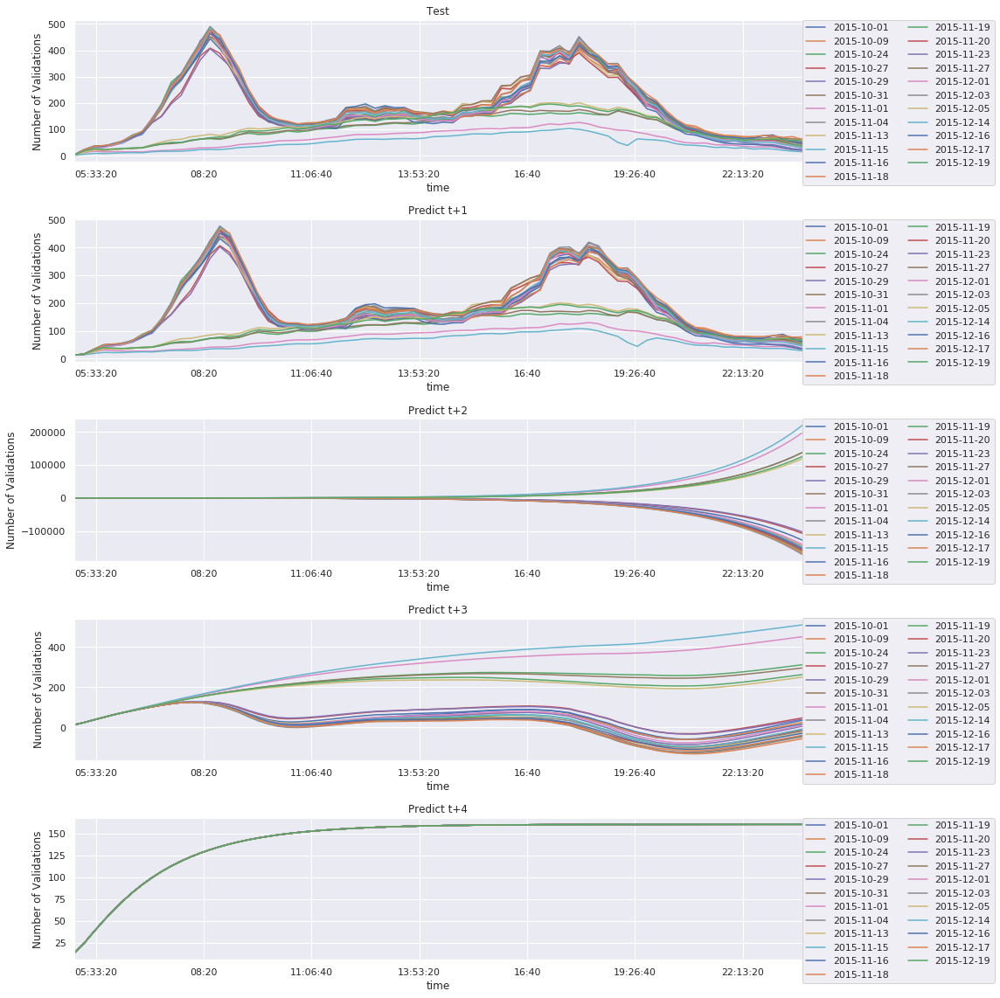

In [53]:
plot_qualitative_analysis(ar_preds, X_test, limit_t, order, subway_stations, del_hours)

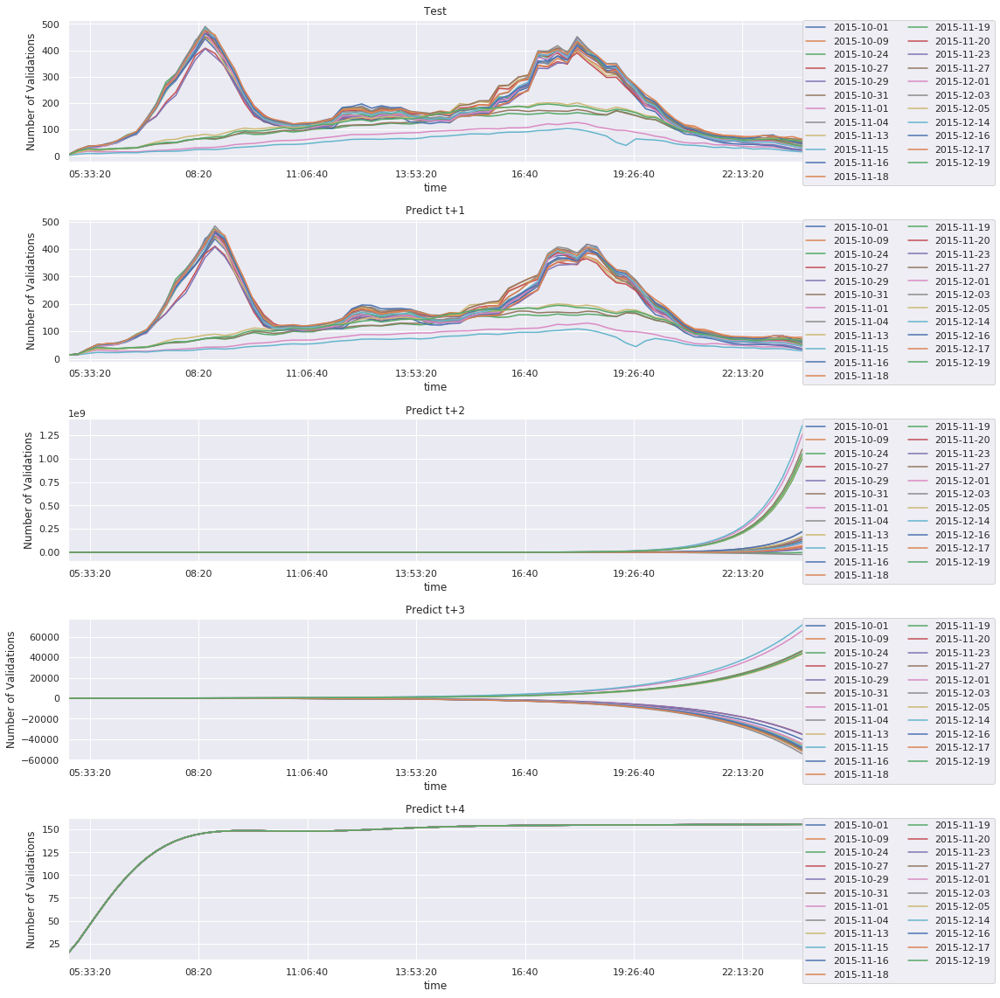

In [54]:
plot_qualitative_analysis(ar_preds_s, X_test, limit_t, order, subway_stations, del_hours)

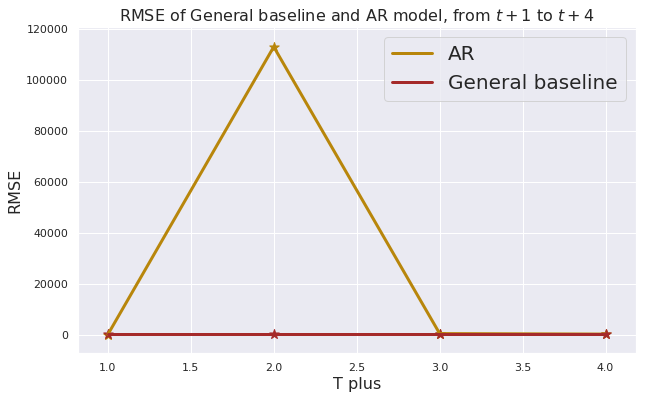

In [55]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 'None'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(ar_scores).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="AR")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="General baseline")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.legend(prop={'size': 20})
plt.title("RMSE of General baseline and AR model, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

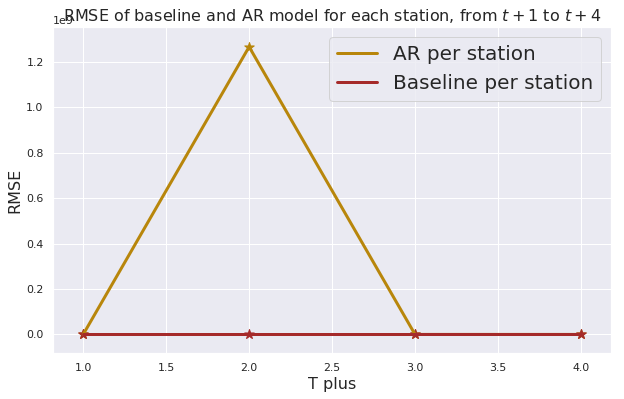

In [56]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 's'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(ar_scores_s).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="AR per station")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="Baseline per station")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.legend(prop={'size': 20})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

#### Compute and Compare 

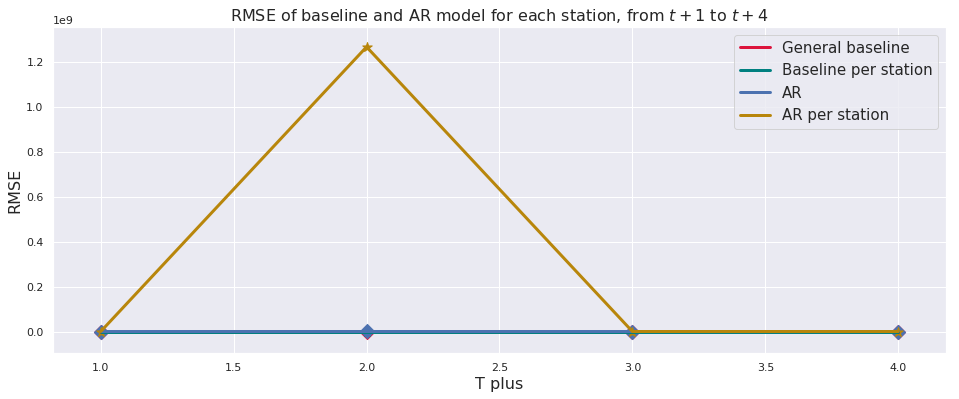

In [57]:
fig, ax = plt.subplots(1, figsize=(16, 6))
ax.set_prop_cycle(color=['crimson', 'teal', 'b', 'darkgoldenrod'])
x = range(1, limit_t+1)
baseline_scores = df_baseline_scores.loc['RMSE'].values.repeat(limit_t).reshape(-1, limit_t).T
model_scores = np.vstack((np.array(ar_scores).T[1], np.array(ar_scores_s).T[1])).T
baselineObjects = plt.plot(x, baseline_scores, linewidth=3)
labels = ["General baseline", "Baseline per station", "AR", "AR per station"]
arlineObjects = plt.plot(x, model_scores, linewidth=3)

# ['D', '*', '|', 'X']
# labels = ["Full baseline", "Baseline per station", "Baseline per day",
#                    "Baseline per station and day", "Full AR", "AR per station"]
for i, m in zip(range(4), ['D', '*']):
    ax = plt.scatter(x, baseline_scores[:, i], marker=m, s=100)

for i, m in zip(range(2), ['D', '*']):
    ax = plt.scatter(x, model_scores[:, i], marker=m, s=100)
    
plt.legend(baselineObjects+arlineObjects, labels, prop={'size': 15})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

### AR + Baseline

In [58]:
def baseline_sub(X, baseline):
    
    return X.apply(lambda x: x - baseline.iloc[0], axis=(1, 2))
    
def baseline_add(X, baseline):
    
    return X.apply(lambda x: x + baseline.iloc[0], axis=(1, 2))
    

In [59]:
order, limit_t = 4, 4

In [60]:
# Minus Baseline per station
Xb_train = baseline_sub(X_train, baseline_preds[1])
Xb_test = baseline_sub(X_test, baseline_preds[1])

# Minus Baseline per station
Xb_train_s = baseline_sub(X_train, baseline_preds[1])
Xb_test_s = baseline_sub(X_test, baseline_preds[1])

In [61]:
Xb_min_max_s = Xb_train_s.apply(lambda x: (x.min().min(), x.max().max()), axis=(0, 2))

In [62]:
Xbn_train_s = Xb_train_s.apply(lambda x: a + ((x - x.min().min()) * (b - a)) / (x.max().max() - x.min().min()), 
                               axis=(0, 2)).transpose(2, 0, 1)
# Normalize Xb_test
Xbn_test_s = pd.Panel(np.array(list(map(lambda station_id: normalize(
    Xb_test_s, Xb_min_max_s, station_id, a=a, b=b), 
                                        Xb_test_s.transpose(1, 0, 2)))).transpose(2, 0, 1),
                      items=list(Xb_test_s.items),
                      major_axis=subway_stations,
                      minor_axis=generate_times("15min")[(del_hours * 4):])

# Denormalize Xb_test
Xbdn_test_s = pd.Panel(np.array(list(map(lambda station_id: denormalize(
    Xbn_test_s, Xb_min_max_s, station_id, a=a, b=b), 
                                        Xb_test_s.transpose(1, 0, 2)))).transpose(2, 0, 1),
                      items=list(Xb_test_s.items),
                      major_axis=subway_stations,
                      minor_axis=generate_times("15min")[(del_hours * 4):])

In [63]:
%%time
arb_preds, arb_scores = ar_plot_results(None, order, limit_t, X_train=Xbn_train_s, 
                                      X_test=Xbn_test_s, X_min_max=Xb_min_max_s, a=a, b=b)
for t in range(limit_t):
    arb_preds[t] = baseline_add(arb_preds[t], baseline_preds[1])

Fitting...


,1,2,3,4
Weights,-0.026365,-0.001003,0.286753,0.689693


Predicting...


,t+1,t+2,t+3,t+4
R2,8.533149e-01,-9.054803e-01,-8.581566e-01,-1.754370e-01
RMSE,5.881985e+01,2.119987e+02,2.093496e+02,1.665063e+02
MSE,3.459775e+03,4.494345e+04,4.382725e+04,2.772435e+04
MAE,4.466713e+09,2.772686e+10,2.714103e+10,1.574484e+10
MAPE,4.466713e+11,2.772686e+12,2.714103e+12,1.574484e+12
MPE,-2.637295e+11,-1.406069e+12,-1.401829e+12,-1.295124e+12


CPU times: user 29.9 s, sys: 2.65 s, total: 32.5 s
Wall time: 28.9 s


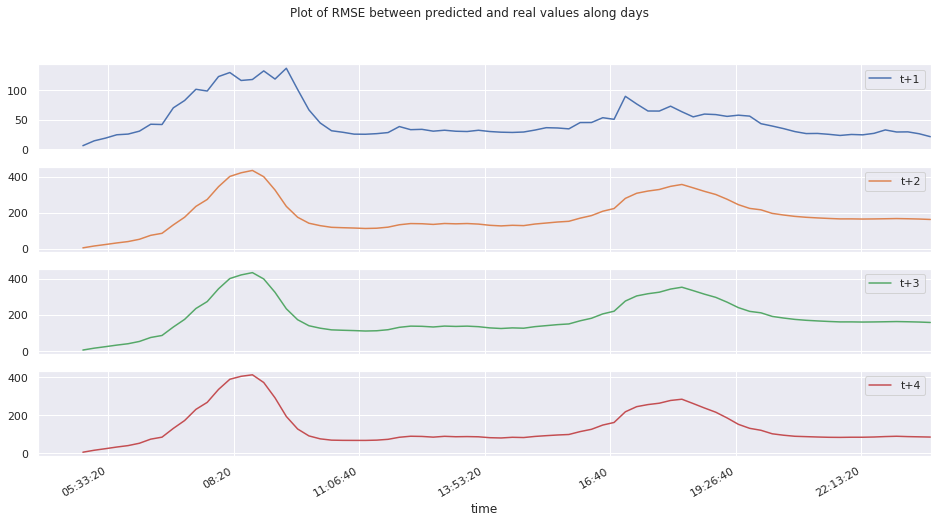

In [64]:
plot_diff_along_time(X_test, arb_preds)

In [65]:
%%time
arb_preds_s, arb_scores_s = ar_plot_results("s", order, limit_t,  
                                          X_train=Xbn_train_s, 
                                          X_test=Xbn_test_s,
                                          X_min_max=Xb_min_max_s, a=a, b=b)
for t in range(limit_t):
    arb_preds_s[t] = baseline_add(arb_preds_s[t], baseline_preds[1]) 

Fitting...


,1,2,3,4
Weights,-0.163168,0.139783,0.305386,0.589474


,1,2,3,4
Weights,0.040824,0.073202,0.188442,0.533194


,1,2,3,4
Weights,-0.120551,-0.1372,0.258646,0.887109


,1,2,3,4
Weights,-0.031678,-0.035899,0.383099,0.574166


,1,2,3,4
Weights,0.133378,0.089053,0.158756,0.570975


,1,2,3,4
Weights,-0.135447,-0.038887,0.218936,0.841153


,1,2,3,4
Weights,-0.025879,0.03796,0.313591,0.597737


,1,2,3,4
Weights,-0.157876,-0.005171,0.233699,0.825575


,1,2,3,4
Weights,-0.141208,-0.023049,0.208845,0.863171


,1,2,3,4
Weights,-0.137775,-0.115388,0.152779,1.002728


,1,2,3,4
Weights,-0.068301,-0.10694,0.488742,0.558645


,1,2,3,4
Weights,0.01215,0.02157,0.225992,0.624557


,1,2,3,4
Weights,0.318573,-0.099056,0.292544,0.397092


,1,2,3,4
Weights,0.033923,-0.019136,0.362386,0.553317


,1,2,3,4
Weights,0.031044,-0.016259,0.267605,0.664011


,1,2,3,4
Weights,-0.100553,-0.060078,0.254674,0.813133


,1,2,3,4
Weights,-0.064586,0.011985,0.245068,0.718942


,1,2,3,4
Weights,0.069086,0.14725,0.218388,0.447663


,1,2,3,4
Weights,-0.07331,0.051139,0.277927,0.652531


,1,2,3,4
Weights,-0.053653,-0.174041,0.261608,0.86739


,1,2,3,4
Weights,-0.125934,-0.033282,0.305351,0.746493


,1,2,3,4
Weights,-0.12654,-0.058031,0.287107,0.775309


,1,2,3,4
Weights,-0.112021,-0.156692,0.25801,0.894012


,1,2,3,4
Weights,-0.162407,-0.009473,0.145402,0.951486


,1,2,3,4
Weights,0.027716,-0.065838,0.357172,0.617065


,1,2,3,4
Weights,0.076269,-0.03371,0.324052,0.552417


,1,2,3,4
Weights,-0.097957,0.101558,0.303971,0.578316


,1,2,3,4
Weights,0.069862,-0.023592,0.319654,0.557946


,1,2,3,4
Weights,0.004052,0.028244,0.266467,0.576687


,1,2,3,4
Weights,0.083827,-0.175654,0.280837,0.727442


,1,2,3,4
Weights,-0.130465,-0.139542,0.398393,0.814664


,1,2,3,4
Weights,-0.085941,-0.111443,0.188449,0.903266


,1,2,3,4
Weights,-0.049372,-0.022319,0.249784,0.72788


,1,2,3,4
Weights,-0.04405,-0.082469,0.307528,0.736966


,1,2,3,4
Weights,0.217632,0.139641,0.036651,0.497132


,1,2,3,4
Weights,0.028554,-0.032307,0.283675,0.661193


,1,2,3,4
Weights,0.021746,0.097254,0.184031,0.591184


,1,2,3,4
Weights,-0.057152,0.003938,0.276457,0.640018


,1,2,3,4
Weights,-0.023414,-0.141679,0.264009,0.835112


,1,2,3,4
Weights,-0.092254,-0.15412,0.30602,0.874179


,1,2,3,4
Weights,0.148738,0.141518,0.228893,0.355461


,1,2,3,4
Weights,0.157556,0.112416,0.037278,0.577946


,1,2,3,4
Weights,0.021421,0.133821,0.244314,0.514341


,1,2,3,4
Weights,-0.044783,0.05859,0.209487,0.651227


,1,2,3,4
Weights,-0.059611,0.007397,0.29808,0.663404


,1,2,3,4
Weights,-0.072598,-0.269049,0.30812,0.935745


,1,2,3,4
Weights,0.002877,0.035467,0.212501,0.646621


,1,2,3,4
Weights,-0.116065,-0.033263,0.226056,0.85311


,1,2,3,4
Weights,-0.146126,-0.063277,0.449092,0.675458


,1,2,3,4
Weights,0.273245,0.111592,0.114872,0.413482


,1,2,3,4
Weights,-0.056179,-0.099041,0.177369,0.909403


,1,2,3,4
Weights,0.043018,0.049323,0.293303,0.491777


,1,2,3,4
Weights,-0.03421,0.06371,0.255651,0.632465


,1,2,3,4
Weights,0.032932,-0.161464,0.253534,0.81205


,1,2,3,4
Weights,-0.067877,0.229233,0.38907,0.32094


,1,2,3,4
Weights,0.160783,0.205442,0.091553,0.392409


,1,2,3,4
Weights,-0.130322,-0.03634,0.214475,0.871506


,1,2,3,4
Weights,0.123159,0.001653,0.165158,0.594091


,1,2,3,4
Weights,-0.034225,-0.2134,0.19928,0.931948


,1,2,3,4
Weights,-0.001989,0.045736,0.294543,0.567698


,1,2,3,4
Weights,-0.076689,-0.039468,0.138243,0.895177


,1,2,3,4
Weights,0.205668,0.118765,0.086873,0.472094


,1,2,3,4
Weights,0.202375,0.050414,0.224781,0.436269


,1,2,3,4
Weights,-0.076309,0.108868,0.382431,0.466912


,1,2,3,4
Weights,0.133305,0.05807,-0.0689,0.775613


,1,2,3,4
Weights,-0.102533,-0.116373,0.12405,1.001731


,1,2,3,4
Weights,-0.10645,0.042202,0.291986,0.628718


,1,2,3,4
Weights,-0.151837,-0.104476,0.153665,1.024788


,1,2,3,4
Weights,0.111271,0.031625,0.126646,0.653312


,1,2,3,4
Weights,-0.115789,-0.110418,0.127004,0.977676


,1,2,3,4
Weights,0.008065,0.159127,0.315042,0.387537


,1,2,3,4
Weights,-0.101501,-0.009728,0.387697,0.627481


,1,2,3,4
Weights,-0.090102,-0.017748,0.107298,0.919776


,1,2,3,4
Weights,-0.107863,0.085083,0.331543,0.537591


,1,2,3,4
Weights,0.142863,0.118016,0.219722,0.416105


,1,2,3,4
Weights,0.261869,0.116844,0.054314,0.315604


,1,2,3,4
Weights,-0.030618,-0.105798,0.498363,0.578299


,1,2,3,4
Weights,-0.119424,0.007598,0.349798,0.68905


,1,2,3,4
Weights,-0.152358,-0.048526,0.31957,0.776516


,1,2,3,4
Weights,0.045987,0.120999,0.220588,0.463176


,1,2,3,4
Weights,-0.048062,0.03882,0.296843,0.594148


,1,2,3,4
Weights,-0.051072,-0.208337,0.351206,0.814621


,1,2,3,4
Weights,-0.095798,0.01662,0.033672,0.944745


,1,2,3,4
Weights,0.075729,-0.005686,0.069334,0.746867


,1,2,3,4
Weights,-0.132397,-0.06476,0.23646,0.863143


,1,2,3,4
Weights,-0.073587,-0.144814,0.263857,0.831731


,1,2,3,4
Weights,-0.181233,0.016972,0.386028,0.692044


,1,2,3,4
Weights,-0.048221,0.078205,0.221747,0.636409


,1,2,3,4
Weights,-0.121629,-0.120624,0.359081,0.781437


,1,2,3,4
Weights,-0.016949,0.030855,0.340401,0.535817


,1,2,3,4
Weights,-0.113803,-0.166442,0.233521,0.952534


,1,2,3,4
Weights,-0.083416,-0.204398,0.312403,0.876977


,1,2,3,4
Weights,-0.111443,0.027981,0.309098,0.653673


,1,2,3,4
Weights,-0.006351,-0.054508,0.224007,0.772933


,1,2,3,4
Weights,-0.097795,-0.087237,0.355921,0.716223


,1,2,3,4
Weights,-0.042013,-0.060152,0.277459,0.732866


,1,2,3,4
Weights,-0.170965,-0.04564,0.201804,0.905225


,1,2,3,4
Weights,-0.171363,-0.131193,0.376831,0.824297


,1,2,3,4
Weights,-0.067342,-0.049013,0.359235,0.68533


,1,2,3,4
Weights,-0.057126,-0.245311,0.452498,0.76241


,1,2,3,4
Weights,-0.056566,-0.030434,0.387711,0.614807


,1,2,3,4
Weights,0.090352,0.017326,0.30925,0.512797


,1,2,3,4
Weights,-0.129058,0.046599,0.248919,0.735247


,1,2,3,4
Weights,-0.028243,-0.024825,0.208669,0.787153


,1,2,3,4
Weights,0.005913,0.042618,0.153688,0.699794


,1,2,3,4
Weights,-0.050743,0.031986,0.165179,0.764787


,1,2,3,4
Weights,0.026108,0.049422,0.220706,0.564881


,1,2,3,4
Weights,-0.171059,-0.101815,0.315644,0.857759


,1,2,3,4
Weights,0.020944,0.085221,0.300306,0.478486


,1,2,3,4
Weights,-0.168822,0.00184,0.427745,0.617825


,1,2,3,4
Weights,-0.037459,0.101848,0.208541,0.611458


,1,2,3,4
Weights,-0.049563,-0.166042,0.463123,0.702707


,1,2,3,4
Weights,0.085867,0.051011,0.314174,0.43009


,1,2,3,4
Weights,-0.045741,0.02448,0.174697,0.705025


,1,2,3,4
Weights,-0.113513,0.045107,0.261945,0.728719


,1,2,3,4
Weights,0.010013,0.03334,0.257681,0.624891


,1,2,3,4
Weights,-0.086986,0.019183,0.256796,0.709076


,1,2,3,4
Weights,0.028709,0.091092,0.267055,0.437139


,1,2,3,4
Weights,-0.079737,-0.050429,0.249534,0.74224


,1,2,3,4
Weights,0.100982,-0.179346,0.251852,0.744391


,1,2,3,4
Weights,-0.086774,0.073356,0.220357,0.669774


,1,2,3,4
Weights,0.005248,-0.093192,0.284398,0.695947


,1,2,3,4
Weights,-0.07785,-0.11489,0.329913,0.780904


,1,2,3,4
Weights,0.146298,0.210899,0.081854,0.510196


,1,2,3,4
Weights,-0.065304,-0.006841,0.271362,0.721615


,1,2,3,4
Weights,0.052504,0.091556,0.216056,0.563832


,1,2,3,4
Weights,-0.010652,0.005509,0.379987,0.554929


,1,2,3,4
Weights,-0.046061,-0.138078,0.487839,0.63674


,1,2,3,4
Weights,-0.076201,-0.124359,0.318228,0.786835


,1,2,3,4
Weights,0.189379,0.205214,0.036501,0.477505


,1,2,3,4
Weights,-0.147583,-0.028676,0.307322,0.762734


,1,2,3,4
Weights,-0.09212,-0.154725,0.338824,0.841488


,1,2,3,4
Weights,-0.094645,0.08194,0.211724,0.717417


,1,2,3,4
Weights,0.096719,-0.127648,0.289796,0.633688


,1,2,3,4
Weights,-0.00849,0.045441,0.175334,0.749691


,1,2,3,4
Weights,-0.161574,-0.148669,0.356202,0.840478


,1,2,3,4
Weights,0.043955,-0.005748,0.25683,0.64254


,1,2,3,4
Weights,0.089541,0.083087,0.234238,0.493623


,1,2,3,4
Weights,0.071111,-0.01632,0.160262,0.700895


,1,2,3,4
Weights,-0.178209,-0.063966,0.258795,0.877233


,1,2,3,4
Weights,-0.022227,-0.012202,0.272253,0.681415


,1,2,3,4
Weights,-0.118193,-0.021356,0.285698,0.732814


,1,2,3,4
Weights,-0.139183,-0.025212,0.342005,0.719277


,1,2,3,4
Weights,0.088111,0.039264,0.232645,0.53153


,1,2,3,4
Weights,-0.030879,0.093559,0.261561,0.57876


,1,2,3,4
Weights,-0.044429,-0.038129,0.311482,0.710191


,1,2,3,4
Weights,-0.110928,-0.00193,0.155824,0.872411


,1,2,3,4
Weights,-0.041557,-0.115928,0.377524,0.706133


,1,2,3,4
Weights,-0.181508,-0.029376,0.419781,0.701913


,1,2,3,4
Weights,-0.045961,-0.08928,0.226587,0.819282


,1,2,3,4
Weights,0.166949,-0.105889,0.291533,0.546349


,1,2,3,4
Weights,-0.072916,0.052223,0.353072,0.574845


,1,2,3,4
Weights,-0.081106,0.039325,0.394671,0.552702


,1,2,3,4
Weights,0.040936,0.065258,0.305593,0.425195


,1,2,3,4
Weights,0.12729,0.027291,0.251747,0.523827


,1,2,3,4
Weights,-0.204263,-0.062937,0.254341,0.900464


,1,2,3,4
Weights,-0.078444,0.017001,0.181439,0.763324


,1,2,3,4
Weights,-0.015315,0.108925,0.218059,0.630201


,1,2,3,4
Weights,0.038768,-0.119713,0.274841,0.752848


,1,2,3,4
Weights,-0.074918,-0.108467,0.307469,0.777948


,1,2,3,4
Weights,-0.081651,0.086807,0.138836,0.753948


,1,2,3,4
Weights,-0.143281,0.070336,0.322943,0.642291


,1,2,3,4
Weights,0.031899,-0.01308,0.346083,0.561344


,1,2,3,4
Weights,-0.085493,-0.014835,0.272539,0.725069


,1,2,3,4
Weights,0.070236,0.035719,0.254989,0.583213


,1,2,3,4
Weights,0.017894,0.133146,0.344633,0.392695


,1,2,3,4
Weights,-0.10467,-0.012527,0.321993,0.717379


,1,2,3,4
Weights,-0.072047,0.011271,0.273428,0.670424


,1,2,3,4
Weights,-0.149629,0.007893,0.284301,0.766318


,1,2,3,4
Weights,-0.211953,-0.020859,0.348062,0.794688


,1,2,3,4
Weights,-0.139639,-0.070043,0.23631,0.880751


,1,2,3,4
Weights,-0.197036,-0.10465,0.400118,0.800014


,1,2,3,4
Weights,-0.043461,-0.005079,0.211207,0.712032


,1,2,3,4
Weights,-0.200867,-0.068999,0.261972,0.932241


,1,2,3,4
Weights,0.02061,0.023323,0.215552,0.632932


,1,2,3,4
Weights,-0.121661,-0.029213,0.34564,0.715495


,1,2,3,4
Weights,-0.046463,-0.059726,0.327198,0.731364


,1,2,3,4
Weights,-0.22502,-0.044502,0.500696,0.663112


,1,2,3,4
Weights,0.033374,0.180707,-0.413184,1.015846


,1,2,3,4
Weights,-0.135787,-0.001389,0.468875,0.539434


,1,2,3,4
Weights,0.172096,-0.145858,0.478863,0.427825


,1,2,3,4
Weights,-0.17038,-0.037544,0.341466,0.744311


,1,2,3,4
Weights,0.015668,0.0903,0.285752,0.520948


,1,2,3,4
Weights,0.130361,0.001393,-0.012573,0.45812


,1,2,3,4
Weights,0.025462,-0.119486,0.334228,0.649088


,1,2,3,4
Weights,-0.118793,-0.18538,0.118294,1.138532


,1,2,3,4
Weights,-0.071894,0.013355,0.260978,0.702725


,1,2,3,4
Weights,-0.063335,-0.085849,0.411891,0.651295


,1,2,3,4
Weights,0.055067,0.028607,0.133197,0.684488


,1,2,3,4
Weights,-0.112886,0.007342,0.194678,0.818095


,1,2,3,4
Weights,-0.0536,0.047952,0.24152,0.703953


,1,2,3,4
Weights,-0.068462,0.052176,0.217378,0.692022


,1,2,3,4
Weights,-0.031147,0.072573,0.189382,0.655971


,1,2,3,4
Weights,0.011043,0.079562,0.192641,0.666311


,1,2,3,4
Weights,-0.013471,-0.102426,0.347204,0.689418


,1,2,3,4
Weights,-0.103043,0.039308,0.304202,0.654616


,1,2,3,4
Weights,-0.135393,0.009318,0.320729,0.678128


,1,2,3,4
Weights,0.113415,0.113146,0.042567,0.506881


,1,2,3,4
Weights,-0.173671,-0.060907,0.320792,0.827901


,1,2,3,4
Weights,-0.120747,0.009024,0.341403,0.683016


,1,2,3,4
Weights,-0.061735,-0.158922,0.367487,0.804251


,1,2,3,4
Weights,-0.118198,-0.079508,0.16633,0.931591


,1,2,3,4
Weights,-0.053279,-0.027789,0.384059,0.62347


,1,2,3,4
Weights,-0.011877,-0.153245,0.391189,0.718958


,1,2,3,4
Weights,-0.164267,-0.006856,0.349372,0.697819


,1,2,3,4
Weights,0.068907,0.091454,0.205706,0.433848


,1,2,3,4
Weights,0.099156,-0.045365,0.236008,0.643637


,1,2,3,4
Weights,-0.128185,0.048599,0.437289,0.523274


,1,2,3,4
Weights,-0.126416,-0.028291,0.312642,0.747917


,1,2,3,4
Weights,0.349396,0.098547,0.059785,0.417501


,1,2,3,4
Weights,-0.015147,-0.305022,0.484982,0.78623


,1,2,3,4
Weights,-0.053693,-0.054996,0.354539,0.679459


,1,2,3,4
Weights,-0.115971,-0.121559,0.304326,0.868375


,1,2,3,4
Weights,0.030288,-0.005751,0.234134,0.650469


,1,2,3,4
Weights,0.037816,-0.133824,0.357987,0.647213


,1,2,3,4
Weights,0.121206,0.143428,0.117982,0.459808


,1,2,3,4
Weights,0.075372,0.029446,0.22508,0.581801


,1,2,3,4
Weights,-0.100155,-0.112445,0.389132,0.757801


,1,2,3,4
Weights,-0.188353,-0.050409,0.30376,0.854506


,1,2,3,4
Weights,-0.084897,-0.154196,0.382803,0.767434


,1,2,3,4
Weights,-0.05806,0.017555,0.249165,0.702009


,1,2,3,4
Weights,-0.114818,-0.012037,0.268331,0.761399


,1,2,3,4
Weights,-0.059124,-0.153795,0.454688,0.694451


,1,2,3,4
Weights,0.063604,0.093103,0.102084,0.526329


,1,2,3,4
Weights,0.156844,-0.028166,0.241552,0.552988


,1,2,3,4
Weights,-0.097978,0.023269,0.16469,0.801966


,1,2,3,4
Weights,-0.02008,-0.208192,0.402404,0.773022


,1,2,3,4
Weights,-0.125066,0.058469,0.209434,0.770069


,1,2,3,4
Weights,-0.168351,0.03284,0.404946,0.646654


,1,2,3,4
Weights,-0.016726,0.043266,0.278463,0.63779


,1,2,3,4
Weights,-0.192199,-0.0442,0.407957,0.715149


,1,2,3,4
Weights,-0.013256,0.060024,0.288563,0.602416


,1,2,3,4
Weights,-0.013367,-0.146441,0.245169,0.768982


,1,2,3,4
Weights,0.039073,-0.016359,0.21285,0.651603


,1,2,3,4
Weights,-0.184056,0.002106,0.462865,0.637382


,1,2,3,4
Weights,0.105818,-0.067221,0.407476,0.470633


,1,2,3,4
Weights,-0.005039,0.09927,0.194427,0.632432


,1,2,3,4
Weights,-0.165827,-0.108603,0.339184,0.841585


,1,2,3,4
Weights,-0.130873,0.025998,0.238911,0.769338


,1,2,3,4
Weights,-0.045818,-0.100028,0.251611,0.818119


,1,2,3,4
Weights,-0.077762,0.026126,0.338825,0.595463


,1,2,3,4
Weights,-0.050808,0.058971,0.321678,0.567507


,1,2,3,4
Weights,0.192699,0.036191,0.141603,0.558895


,1,2,3,4
Weights,-0.043788,-0.069398,0.252196,0.747844


,1,2,3,4
Weights,-0.020091,-0.003848,0.385678,0.56072


,1,2,3,4
Weights,0.070377,0.052867,0.177533,0.598877


,1,2,3,4
Weights,-0.073035,-0.058214,0.265993,0.782718


,1,2,3,4
Weights,-0.036776,-0.145259,0.367712,0.763757


,1,2,3,4
Weights,-0.119919,0.031422,0.365733,0.638674


,1,2,3,4
Weights,-0.048869,-0.148288,0.399796,0.697212


,1,2,3,4
Weights,-0.173495,-0.014135,0.273947,0.805638


,1,2,3,4
Weights,0.001247,0.050427,0.231533,0.622107


,1,2,3,4
Weights,0.111269,0.097031,0.127006,0.573837


,1,2,3,4
Weights,-0.029411,0.051335,0.309223,0.576959


,1,2,3,4
Weights,-0.1504,0.000054,0.393149,0.665692


,1,2,3,4
Weights,0.115846,0.100608,0.188505,0.498844


,1,2,3,4
Weights,-0.114026,-0.143998,0.262855,0.899626


,1,2,3,4
Weights,0.048592,0.040917,0.157942,0.682117


,1,2,3,4
Weights,0.075345,-0.146406,0.368245,0.648075


,1,2,3,4
Weights,-0.13526,-0.078996,0.186647,0.920278


,1,2,3,4
Weights,0.047311,0.072865,0.275066,0.463964


,1,2,3,4
Weights,0.009469,-0.097716,0.307835,0.70612


,1,2,3,4
Weights,0.051702,0.093975,0.107269,0.580356


,1,2,3,4
Weights,-0.072821,-0.184497,0.334782,0.843406


,1,2,3,4
Weights,-0.153585,0.007515,0.237625,0.800888


,1,2,3,4
Weights,-0.006327,-0.02769,0.307106,0.621354


,1,2,3,4
Weights,-0.027229,-0.106106,0.425236,0.644509


,1,2,3,4
Weights,-0.113568,-0.089043,0.236283,0.873551


,1,2,3,4
Weights,-0.091203,0.055765,0.287629,0.677423


,1,2,3,4
Weights,-0.091152,-0.085314,0.150925,0.962675


,1,2,3,4
Weights,-0.130835,-0.141054,0.32911,0.845678


,1,2,3,4
Weights,-0.105467,-0.136116,0.15714,0.995278


,1,2,3,4
Weights,-0.0807,0.134036,0.176109,0.666289


,1,2,3,4
Weights,-0.100375,0.05492,0.29968,0.639111


,1,2,3,4
Weights,-0.110836,-0.05597,0.388277,0.670908


,1,2,3,4
Weights,-0.168817,-0.026473,0.28059,0.820042


,1,2,3,4
Weights,-0.096911,0.066075,0.196371,0.735149


,1,2,3,4
Weights,-0.084971,0.078254,0.385062,0.601619


,1,2,3,4
Weights,0.087049,0.026579,0.247681,0.600615


,1,2,3,4
Weights,0.01036,0.086093,0.236612,0.526103


,1,2,3,4
Weights,0.07376,-0.046709,0.195835,0.66055


,1,2,3,4
Weights,-0.091847,-0.049661,0.257357,0.778581


,1,2,3,4
Weights,-0.197839,-0.026783,0.330308,0.813373


,1,2,3,4
Weights,-0.095765,-0.266628,0.464772,0.844244


,1,2,3,4
Weights,-0.000072,0.193264,0.251061,0.336622


,1,2,3,4
Weights,0.02122,-0.020952,0.249117,0.65336


,1,2,3,4
Weights,-0.19244,-0.063917,0.37446,0.8177


,1,2,3,4
Weights,-0.021962,-0.018193,0.14086,0.833303


,1,2,3,4
Weights,-0.035175,-0.217839,0.461381,0.738558


,1,2,3,4
Weights,-0.061918,0.056292,0.389394,0.497809


,1,2,3,4
Weights,0.011174,0.114987,0.161841,0.607394


,1,2,3,4
Weights,0.103246,0.112418,0.181061,0.53353


,1,2,3,4
Weights,-0.046678,-0.014019,0.290621,0.679489


,1,2,3,4
Weights,0.082353,0.015764,0.297912,0.528514


,1,2,3,4
Weights,-0.066476,0.057937,0.225355,0.683596


,1,2,3,4
Weights,0.057449,0.069716,0.076516,0.65311


,1,2,3,4
Weights,0.058242,-0.023374,0.275795,0.606636


,1,2,3,4
Weights,-0.131108,-0.144808,0.365092,0.810216


,1,2,3,4
Weights,-0.129808,-0.156911,0.307525,0.873051


,1,2,3,4
Weights,0.103249,0.090109,0.237348,0.491242


,1,2,3,4
Weights,-0.190366,-0.113146,0.396139,0.8341


Predicting...


,t+1,t+2,t+3,t+4
R2,8.652857e-01,-1.681076e+08,-1.225673e+05,-1.194237e-03
RMSE,5.636868e+01,1.991245e+06,5.376752e+04,1.536704e+02
MSE,3.177428e+03,3.965055e+12,2.890946e+09,2.361458e+04
MAE,5.702519e+09,-3.655332e+12,-6.470317e+11,2.871487e+07
MAPE,5.702519e+11,-3.655332e+14,-6.470317e+13,2.871487e+09
MPE,-1.485996e+11,3.727112e+14,6.817312e+13,2.872184e+09


CPU times: user 1min 10s, sys: 36.5 s, total: 1min 46s
Wall time: 57.3 s


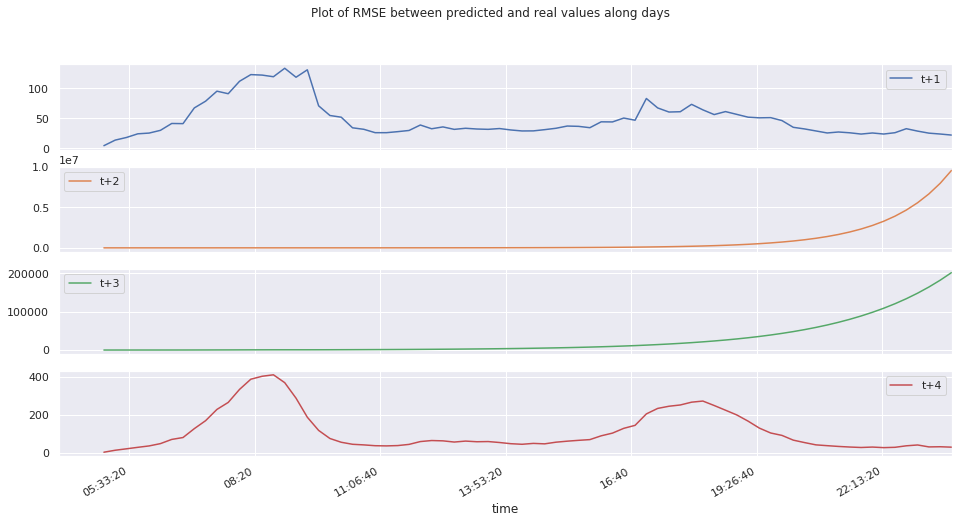

In [66]:
plot_diff_along_time(X_test, arb_preds_s)

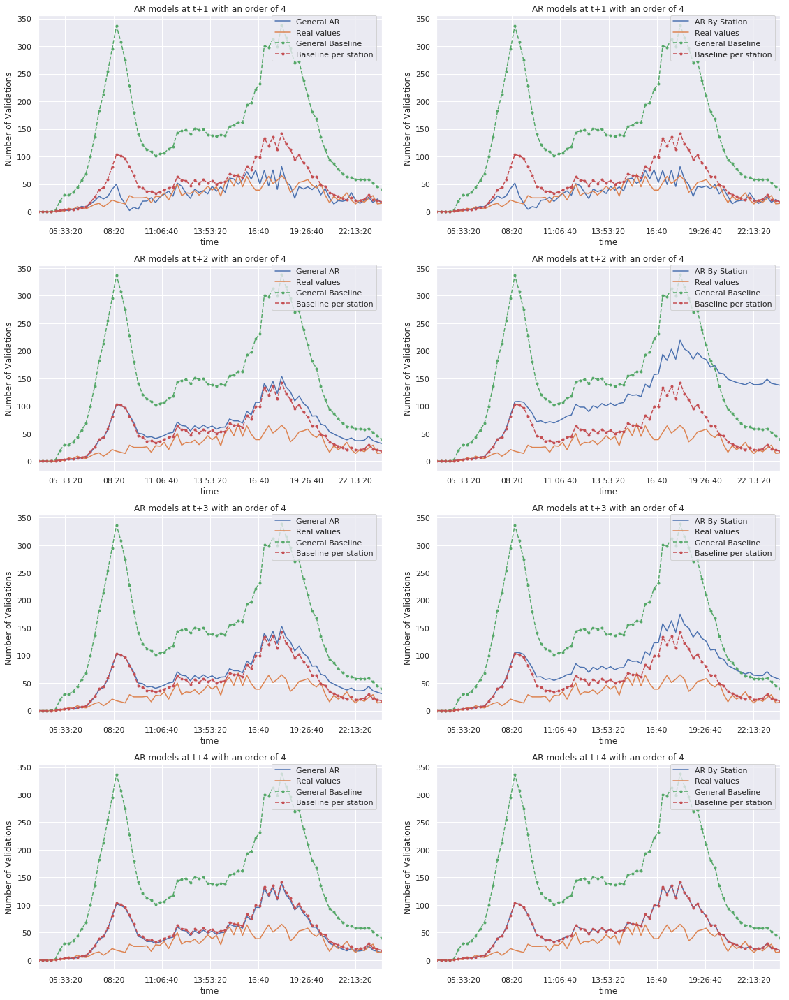

In [67]:
plot_bispecific(X_test, baseline_preds, arb_preds, arb_preds_s, order, limit_t, j, s)

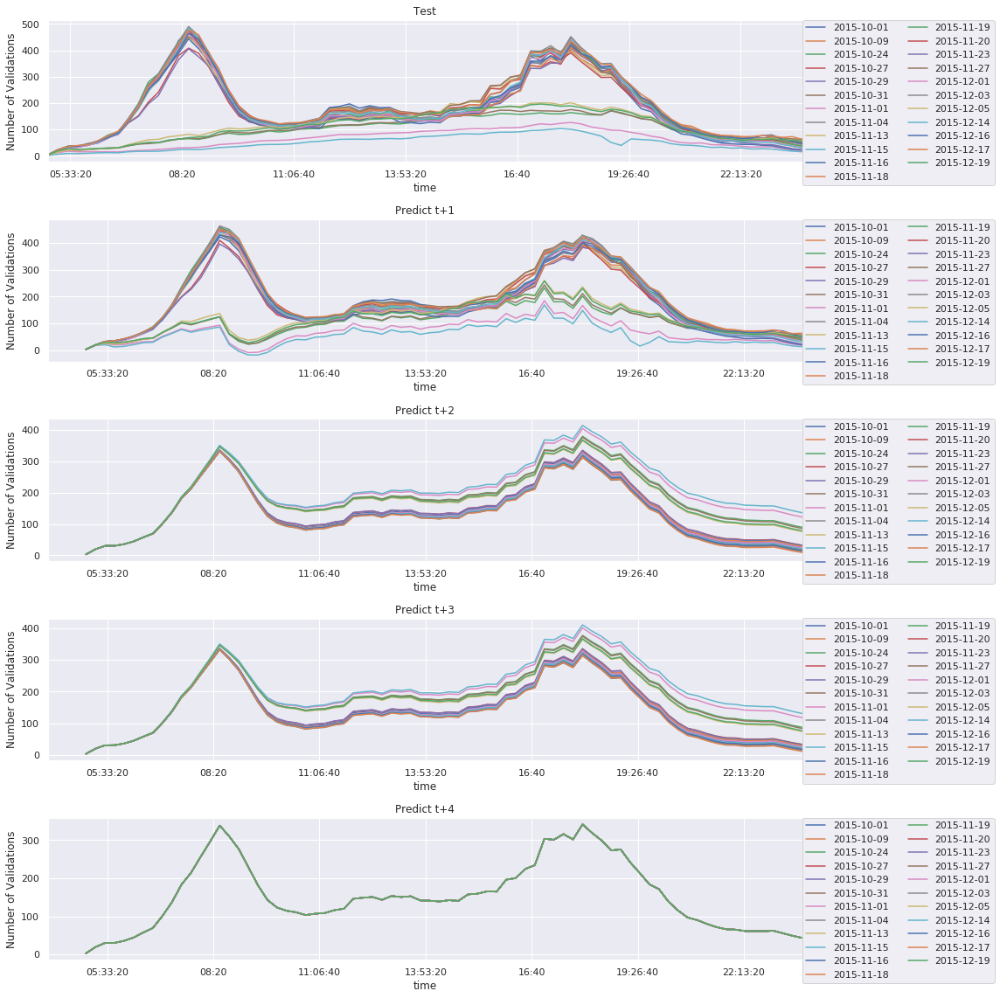

In [68]:
plot_qualitative_analysis(arb_preds, X_test, limit_t, order, subway_stations, del_hours)

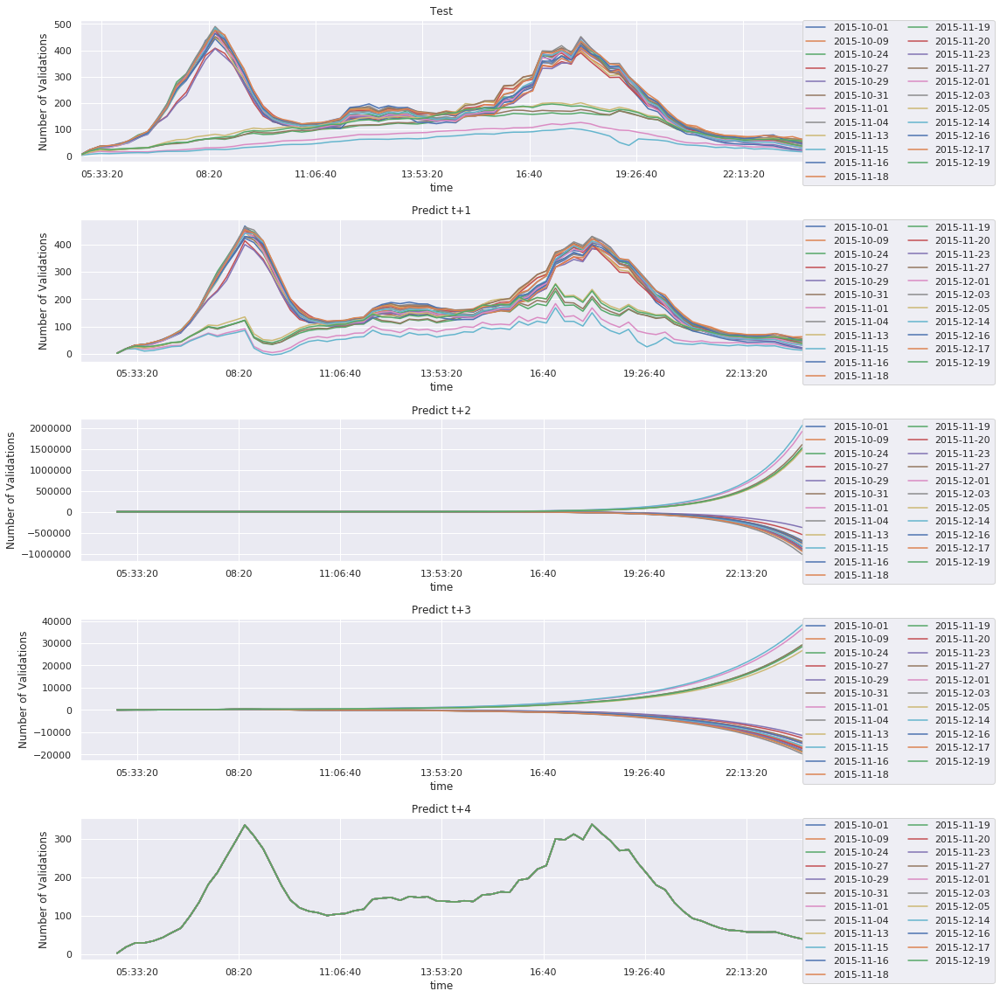

In [69]:
plot_qualitative_analysis(arb_preds_s, X_test, limit_t, order, subway_stations, del_hours)

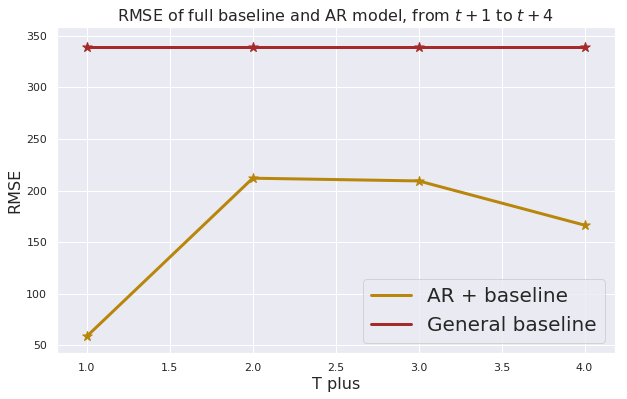

In [70]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 'None'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(arb_scores).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="AR + baseline")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="General baseline")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.legend(prop={'size': 20})
plt.title("RMSE of full baseline and AR model, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

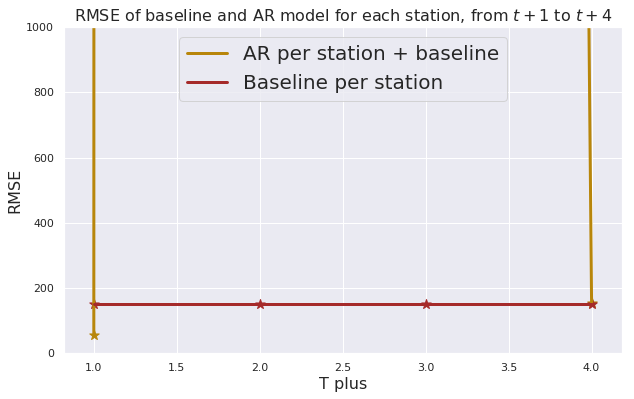

In [71]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 's'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(arb_scores_s).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="AR per station + baseline")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="Baseline per station")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.ylim((0, 1000))
plt.legend(prop={'size': 20})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

#### Compute and Compare 

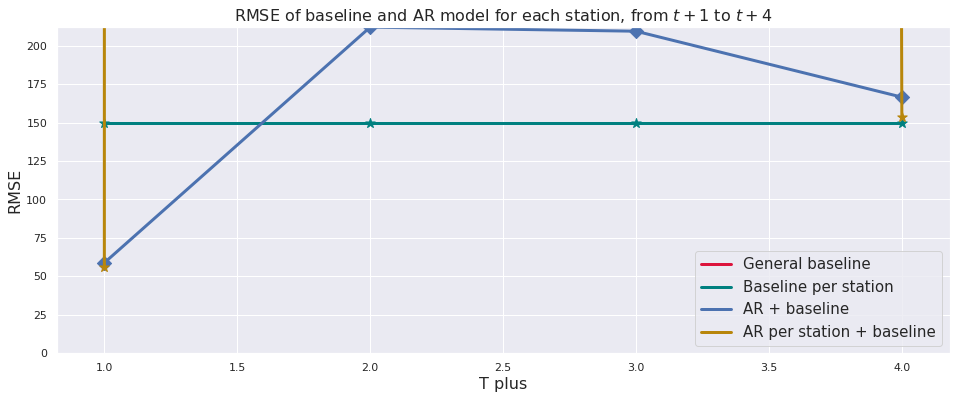

In [72]:
fig, ax = plt.subplots(1, figsize=(16, 6))
ax.set_prop_cycle(color=['crimson', 'teal', 'b', 'darkgoldenrod'])

x = range(1, limit_t+1)
baseline_scores = df_baseline_scores.loc['RMSE'].values.repeat(limit_t).reshape(-1, limit_t).T
model_scores = np.vstack((np.array(arb_scores).T[1], np.array(arb_scores_s).T[1])).T

baselineObjects = plt.plot(x, baseline_scores, linewidth=3)
labels = ["General baseline", "Baseline per station", "AR + baseline", "AR per station + baseline"]

arlineObjects = plt.plot(x, model_scores, linewidth=3)

for i, m in zip(range(4), ['D', '*']):
    ax = plt.scatter(x, baseline_scores[:, i], marker=m, s=100)

for i, m in zip(range(2), ['D', '*']):
    ax = plt.scatter(x, model_scores[:, i], marker=m, s=100)

plt.ylim((0, model_scores[:, 0].max()))
plt.legend(baselineObjects+arlineObjects, labels, prop={'size': 15})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

## AR per t

In [73]:
from cost_functions import mse, mse_g
from sklearn.linear_model import LinearRegression, Lasso

class myARt(Regressor):
    def __init__(self, order=4, tplus=1, level=None, loss=mse, loss_g=mse_g, max_iter=1000,
                 eps=0.01):
        """ Initialisation des paramètres du perceptron

        :param order: Taille de la fenêtre glissante
        :param loss: fonction de coût
        :param loss_g: gradient de la fonction coût
        :param max_iter: nombre maximum d'itération de la fonction coût
        :param eps: pas du gradient


        """

        self.order = order
        self.level = level
        self.tplus = tplus              
    
    @Regressor.datax_t_decorator
    def fit(self, datax, tplus):
        """ Finds the optimal weigths analytically 
        
        :param datax: contient tous les exemples du dataset
        :returns: void
        :rtype: None
        
        """
        
        self.reg = LinearRegression()
        _, self.X, self.y = datax
       
        self.reg.fit(self.X, self.y)
        self.w = self.reg.coef_.squeeze()
        display(HTML(pd.DataFrame(self.w.reshape(1, -1), index=['Weights'], 
                                  columns=range(1, len(self.w)+1)).to_html()))
        return self

    
    def reshaped(self, y_pred, datax):
        """
        """
        
        if datax.ndim == 3:
            return y_pred.reshape((datax.shape[0] * datax.shape[1], 
                                datax.shape[2] - self.order - self.tplus + 1), 
                                order='F').reshape((datax.shape[0],
                                                   datax.shape[1],
                                                   datax.shape[2] - self.order - self.tplus + 1))
        elif datax.ndim == 2:
            return y_pred.reshape((datax.shape[0], datax.shape[1] - self.order - self.tplus + 1),
                                order='F')
    
    @Regressor.datax_t_decorator
    def forecast(self, datax, tplus):
        """
        
        """
        
        datax, self.X_test, self.y_test = datax
        
        return self.reshaped(self.reg.predict(self.X_test), datax)

In [74]:
class theARt(Baseline):
    station_id = 0
    def __init__(self, order, tplus,  level=None, first_ndays=7):
        """
        
        """
        
        super().__init__(level, first_ndays)
        self.level = level
        self.order = order
        self.tplus = tplus
        
    def fit(self, datax):
        """
        
        """
        
        if self.level is None:
            self.model = myARt(order=self.order, tplus=self.tplus, level=self.level)
            self.model.fit(datax, self.tplus)
            
        elif self.level.lower() == "s":
            
            self.models = []            
            
            datax.apply(lambda station: self.models.append(
                myARt(order=self.order, tplus=self.tplus, level=self.level).fit(station.T, self.tplus)), 
                        axis=(0, 2))
        
        elif self.level.lower() == "j":
            # TODO
            self.mean = []
            for d in range(self.first_ndays):
                exist_ind = list(set(ddict_days[d].values()) & set(datax.items))
                self.mean.append(datax[exist_ind].mean().mean(axis=1))      
                
        elif self.level.lower() == "sj":
            # TODO
            self.mean = []
            for d in range(self.first_ndays):
                exist_ind = list(set(ddict_days[d].values()) & set(datax.items))
                self.mean.append(datax[exist_ind].mean(axis=0))
        else:
            raise ValueError("Unknown value for level attribute, \
            try: s, j, sj or None")
    
    
    def predict(self, datax, tplus=None):
        """
        
        """
        
        def predict_for_station(x, tplus):
            """
            """
            
            station_pred = self.models[self.station_id].forecast(x, tplus)
            self.station_id += 1
            
            return station_pred
        
        if self.level is None:
            
            X_pred = self.model.forecast(datax, tplus)
            return panelIt(X_pred, datax, self.model.order + tplus - 1, subway_stations, del_hours)
            
        elif self.level.lower() == "s":
            
            X_pred = datax.apply(lambda x: predict_for_station(x.T, tplus), 
                                 axis=(0, 2)).transpose(1, 0, 2)
            self.station_id = 0
            
            return panelIt(X_pred.values, datax, self.models[0].order + tplus - 1, subway_stations, del_hours)
        
        elif self.level.lower() == "j":
            # TODO
            pass
        elif self.level.lower() == "sj":
            # TODO
            pass
        else:
            raise ValueError("Unknown value for level attribute, \
            try: s, j, sj or None")
    
    
    def score(self, datax, X_pred, level):
        """
        """
        
        if level == None:
            self.scores = super().metrics_score(
                datax.iloc[:, :, self.model.order + self.tplus - 1:], X_pred.values)
        elif level == 's':
            self.scores = super().metrics_score(
                datax.iloc[:, :, self.models[0].order + self.tplus - 1:], X_pred.values)
            
        return self.scores
    

In [75]:
def art_plot_results(level, order, limit_t, X_train=Xn_train, X_test=Xn_test, 
                    X_min_max=X_min_max, a=a, b=b):
    """
    
    """
    
    ar_scores = []
    ar_preds = []
    
    Xdn_test = pd.Panel(np.array(list(map(lambda station_id: 
                                          denormalize(X_test, 
                                                      X_min_max, 
                                                      station_id, a=a, b=b), 
                                     X_test.transpose(1, 0, 2)))).transpose(2, 0, 1),
                   items=list(X_test.items),
                   major_axis=subway_stations,
                   minor_axis=generate_times("15min")[(del_hours * 4):])
    
    print("Predicting...")

    for t in range(1, limit_t+1):
        
        ar = theARt(level=level, order=order, tplus=t)

        print("Fitting t+{}...".format(t))
        ar.fit(X_train)
        
        print("Predicting t+{}...".format(t))
        X_pred = ar.predict(X_test, t)
        
        Xdn_pred = pd.Panel(np.array(list(map(lambda station_id: 
                                              denormalize(X_pred, 
                                                         X_min_max, 
                                                         station_id, a=a, b=b),
                                              X_pred.transpose(1, 0, 2)))).transpose(2, 0, 1),
                                     items=list(X_pred.items),
                                     major_axis=list(X_pred.major_axis),
                                     minor_axis=list(X_pred.minor_axis))
        
        ar_preds.append(Xdn_pred)
        
        ar_scores.append(ar.score(Xdn_test, Xdn_pred, level))
    
    display(HTML((pd.DataFrame(np.array(ar_scores).T, 
                               index=['R2', 'RMSE', 'MSE', 'MAE', 'MAPE', 'MPE'], 
                               columns=list(map(
                                   lambda x: "t+"+str(x),
                                   range(1, len(ar_scores)+1))))).to_html()))
    
    
    return ar_preds, ar_scores

def plot_diff_along_time_per_t(X_test, ar_preds):
    
    for t in range(len(ar_preds)):
        res = []
        order = X_test.shape[2] - ar_preds[t].shape[2]    
        
        res.append(np.sqrt(((X_test.iloc[:, :, order:].values - 
                             ar_preds[t].values)**2).mean(axis=(0, 1))))

        pd_res = pd.DataFrame(np.array(res).T, index=list(ar_preds[t].minor_axis),
                              columns=['t+{}'.format(t)])
        pd_res.plot(figsize=(16, 2), 
                    title='Plot of RMSE between predicted and real values along days')

In [76]:
order, limit_t = 4, 4

In [77]:
%%time
art_preds, art_scores = art_plot_results(None, order=order, limit_t=limit_t)

Predicting...
Fitting t+1...


,1,2,3,4
Weights,-0.071429,-0.149182,0.288468,0.851003


Predicting t+1...
Fitting t+2...


,1,2,3,4
Weights,-0.299643,0.009974,0.160727,0.960267


Predicting t+2...
Fitting t+3...


,1,2,3,4
Weights,-0.261237,-0.276962,0.341329,0.934143


Predicting t+3...
Fitting t+4...


,1,2,3,4
Weights,-0.256385,-0.239937,0.047203,1.092847


Predicting t+4...


,t+1,t+2,t+3,t+4
R2,0.956234,0.914773,0.852686,0.787579
RMSE,75.312987,105.662973,139.700341,168.713818
MSE,5672.045941,11164.663894,19516.185150,28464.352353
MAE,0.373883,0.541586,0.699392,0.846691
MAPE,37.388309,54.158601,69.939203,84.669123
MPE,-22.706380,-36.920572,-50.229535,-62.920459


CPU times: user 30.1 s, sys: 3.73 s, total: 33.8 s
Wall time: 29 s


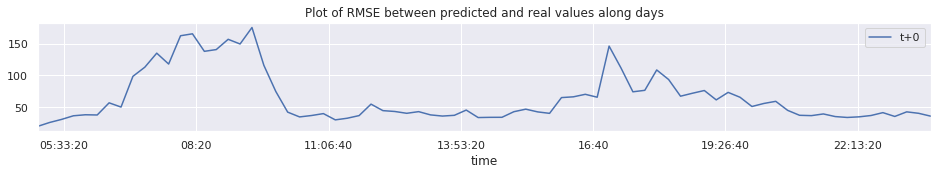

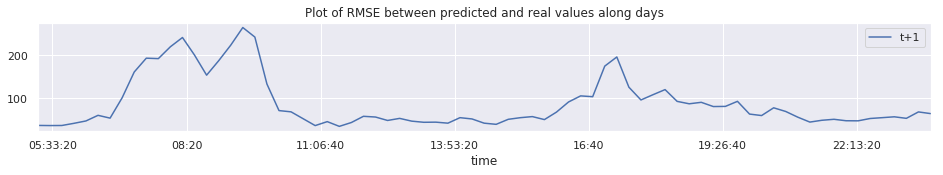

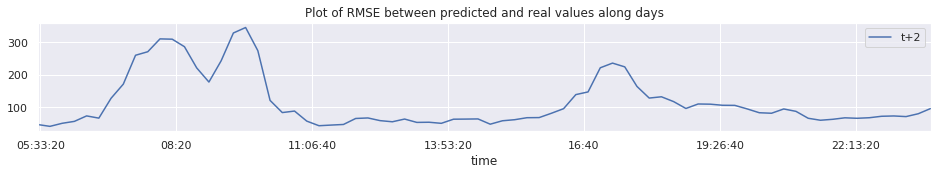

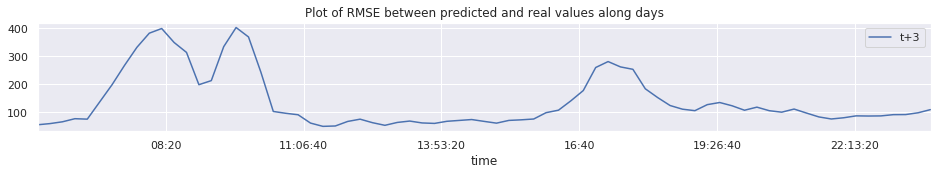

In [78]:
plot_diff_along_time_per_t(X_test, art_preds)

In [79]:
%%time
art_preds_s, art_scores_s = art_plot_results("s", order, limit_t)

Predicting...
Fitting t+1...


,1,2,3,4
Weights,-0.266436,0.011483,0.308568,0.808834


,1,2,3,4
Weights,-0.057957,0.055764,0.136914,0.737013


,1,2,3,4
Weights,-0.081876,-0.293176,0.203205,1.064301


,1,2,3,4
Weights,-0.066,-0.268369,0.544492,0.672295


,1,2,3,4
Weights,0.032489,-0.043498,0.166097,0.795383


,1,2,3,4
Weights,-0.089699,-0.204074,0.159601,1.015317


,1,2,3,4
Weights,-0.090893,-0.143983,0.41245,0.742541


,1,2,3,4
Weights,-0.184856,-0.044291,0.066096,1.062452


,1,2,3,4
Weights,-0.136179,-0.078143,0.066819,1.05206


,1,2,3,4
Weights,-0.058452,-0.210961,-0.070097,1.243916


,1,2,3,4
Weights,-0.156027,-0.199337,0.618152,0.590507


,1,2,3,4
Weights,-0.030705,-0.107995,0.239695,0.801055


,1,2,3,4
Weights,0.301438,-0.25134,0.422168,0.448294


,1,2,3,4
Weights,-0.020398,-0.235839,0.48212,0.70098


,1,2,3,4
Weights,0.012508,-0.161105,0.24952,0.838789


,1,2,3,4
Weights,-0.071227,-0.21142,0.195535,0.988444


,1,2,3,4
Weights,-0.082047,-0.148349,0.224415,0.915326


,1,2,3,4
Weights,-0.040003,0.08592,0.21898,0.624011


,1,2,3,4
Weights,-0.129165,-0.024052,0.158166,0.917845


,1,2,3,4
Weights,0.03323,-0.403992,0.25028,1.018712


,1,2,3,4
Weights,-0.132644,-0.177219,0.263642,0.939968


,1,2,3,4
Weights,-0.115846,-0.195202,0.290571,0.906028


,1,2,3,4
Weights,-0.046749,-0.309844,0.167859,1.070969


,1,2,3,4
Weights,-0.179176,-0.072154,0.020938,1.141867


,1,2,3,4
Weights,0.023016,-0.309985,0.477805,0.738472


,1,2,3,4
Weights,0.004988,-0.182518,0.344295,0.766897


,1,2,3,4
Weights,-0.241431,0.063537,0.290661,0.815489


,1,2,3,4
Weights,0.059942,-0.241183,0.377644,0.731327


,1,2,3,4
Weights,-0.062018,-0.021199,0.220647,0.742444


,1,2,3,4
Weights,0.117964,-0.379777,0.32783,0.847141


,1,2,3,4
Weights,-0.078332,-0.393183,0.468547,0.939412


,1,2,3,4
Weights,-0.028457,-0.345415,0.220371,1.046153


,1,2,3,4
Weights,-0.109333,-0.12429,0.217727,0.919296


,1,2,3,4
Weights,-0.067159,-0.218938,0.361783,0.84623


,1,2,3,4
Weights,0.131975,0.149706,-0.058915,0.67119


,1,2,3,4
Weights,-0.051018,-0.095442,0.285062,0.800604


,1,2,3,4
Weights,-0.05552,0.005504,0.160822,0.786161


,1,2,3,4
Weights,-0.104498,-0.131711,0.280585,0.822518


,1,2,3,4
Weights,0.038735,-0.39543,0.336204,0.957209


,1,2,3,4
Weights,-0.047305,-0.349081,0.330678,0.993379


,1,2,3,4
Weights,-0.012467,0.014254,0.312604,0.617281


,1,2,3,4
Weights,0.127076,0.111379,-0.003529,0.648052


,1,2,3,4
Weights,-0.122514,0.074066,0.221651,0.741875


,1,2,3,4
Weights,-0.165754,0.012534,0.19127,0.842568


,1,2,3,4
Weights,-0.127971,-0.109152,0.272052,0.879732


,1,2,3,4
Weights,0.06409,-0.561787,0.327431,1.076387


,1,2,3,4
Weights,-0.035228,-0.079116,0.214682,0.798128


,1,2,3,4
Weights,-0.069149,-0.178008,0.13187,1.048992


,1,2,3,4
Weights,-0.191521,-0.203944,0.406193,0.891527


,1,2,3,4
Weights,0.271786,0.067892,0.070144,0.52382


,1,2,3,4
Weights,-0.010577,-0.271761,0.165951,1.037883


,1,2,3,4
Weights,-0.055179,-0.114386,0.382555,0.678941


,1,2,3,4
Weights,-0.10231,-0.03338,0.194323,0.867152


,1,2,3,4
Weights,0.064626,-0.330601,0.280569,0.920956


,1,2,3,4
Weights,-0.229986,0.100381,0.4108,0.602944


,1,2,3,4
Weights,0.0596,0.227568,0.015239,0.55453


,1,2,3,4
Weights,-0.146877,-0.115509,0.109142,1.080128


,1,2,3,4
Weights,0.096891,-0.087191,0.164003,0.723345


,1,2,3,4
Weights,-0.003152,-0.311254,0.076748,1.128476


,1,2,3,4
Weights,-0.090938,-0.084792,0.344617,0.744901


,1,2,3,4
Weights,-0.095203,-0.090884,0.076185,1.027055


,1,2,3,4
Weights,0.128325,0.126113,0.033469,0.614905


,1,2,3,4
Weights,0.195656,-0.102571,0.262216,0.578796


,1,2,3,4
Weights,-0.203539,0.021655,0.365251,0.714275


,1,2,3,4
Weights,0.102584,0.046281,-0.105013,0.860353


,1,2,3,4
Weights,-0.058358,-0.216294,0.016644,1.156807


,1,2,3,4
Weights,-0.205231,-0.05583,0.325096,0.797552


,1,2,3,4
Weights,-0.108785,-0.140788,-0.060917,1.229635


,1,2,3,4
Weights,0.058983,-0.004615,0.055342,0.80943


,1,2,3,4
Weights,-0.020963,-0.249339,-0.03042,1.182361


,1,2,3,4
Weights,-0.141795,0.053305,0.349568,0.625668


,1,2,3,4
Weights,-0.155761,-0.180738,0.44802,0.790366


,1,2,3,4
Weights,-0.100215,-0.02967,-0.091554,1.132357


,1,2,3,4
Weights,-0.163524,-0.046251,0.277509,0.782071


,1,2,3,4
Weights,0.001842,0.008104,0.301909,0.613616


,1,2,3,4
Weights,0.295419,0.06217,0.019852,0.402222


,1,2,3,4
Weights,-0.047813,-0.34259,0.622273,0.701721


,1,2,3,4
Weights,-0.222317,-0.088101,0.351757,0.886413


,1,2,3,4
Weights,-0.158014,-0.171408,0.241676,0.982247


,1,2,3,4
Weights,-0.002573,-0.012888,0.281877,0.602152


,1,2,3,4
Weights,-0.152663,-0.097776,0.325114,0.82543


,1,2,3,4
Weights,0.011202,-0.442331,0.375345,0.949037


,1,2,3,4
Weights,-0.091238,-0.028298,-0.092388,1.110587


,1,2,3,4
Weights,0.075469,-0.073817,-0.002992,0.868977


,1,2,3,4
Weights,-0.172064,-0.121407,0.141528,1.050579


,1,2,3,4
Weights,-0.036646,-0.31802,0.219551,1.010079


,1,2,3,4
Weights,-0.219276,-0.033611,0.265497,0.896653


,1,2,3,4
Weights,-0.110502,-0.075689,0.288339,0.7885


,1,2,3,4
Weights,-0.104451,-0.295359,0.336248,0.955216


,1,2,3,4
Weights,-0.052785,-0.136804,0.376964,0.701837


,1,2,3,4
Weights,-0.001696,-0.373822,0.153974,1.128361


,1,2,3,4
Weights,0.014631,-0.500478,0.35266,1.026943


,1,2,3,4
Weights,-0.189966,-0.092064,0.304457,0.84914


,1,2,3,4
Weights,-0.043446,-0.195996,0.316247,0.873625


,1,2,3,4
Weights,-0.062845,-0.299231,0.386885,0.849699


,1,2,3,4
Weights,-0.055058,-0.216697,0.295797,0.872118


,1,2,3,4
Weights,-0.097801,-0.23632,0.153719,1.069246


,1,2,3,4
Weights,-0.141547,-0.238958,0.223136,1.050946


,1,2,3,4
Weights,-0.061908,-0.252997,0.438355,0.795302


,1,2,3,4
Weights,-0.028271,-0.476849,0.546604,0.863498


,1,2,3,4
Weights,-0.043394,-0.286812,0.470571,0.775652


,1,2,3,4
Weights,0.012212,-0.185951,0.45749,0.652868


,1,2,3,4
Weights,-0.207786,0.002581,0.139136,0.955982


,1,2,3,4
Weights,-0.013886,-0.237103,0.233924,0.972033


,1,2,3,4
Weights,-0.054252,-0.036911,0.12464,0.842501


,1,2,3,4
Weights,-0.100747,-0.039029,0.065295,0.981054


,1,2,3,4
Weights,-0.130804,0.010915,0.235235,0.796551


,1,2,3,4
Weights,-0.134508,-0.254316,0.248453,1.041693


,1,2,3,4
Weights,-0.079229,-0.075583,0.385883,0.653371


,1,2,3,4
Weights,-0.212633,-0.06925,0.303948,0.846784


,1,2,3,4
Weights,-0.136265,0.077425,0.094436,0.852499


,1,2,3,4
Weights,-0.011138,-0.398352,0.541607,0.813543


,1,2,3,4
Weights,-0.012172,-0.12282,0.425691,0.616503


,1,2,3,4
Weights,-0.085918,-0.106616,0.184327,0.873463


,1,2,3,4
Weights,-0.207657,0.009894,0.196478,0.921655


,1,2,3,4
Weights,-0.060509,-0.107975,0.314353,0.786049


,1,2,3,4
Weights,-0.086233,-0.134683,0.2354,0.890934


,1,2,3,4
Weights,-0.091176,-0.010744,0.324808,0.624842


,1,2,3,4
Weights,-0.051061,-0.209586,0.196211,0.929821


,1,2,3,4
Weights,0.101078,-0.324736,0.278538,0.850831


,1,2,3,4
Weights,-0.203347,0.035656,0.169106,0.876103


,1,2,3,4
Weights,-0.015648,-0.222257,0.290939,0.833777


,1,2,3,4
Weights,-0.048212,-0.347875,0.400112,0.909176


,1,2,3,4
Weights,0.072167,0.143533,0.039758,0.698468


,1,2,3,4
Weights,-0.10349,-0.134316,0.257647,0.89454


,1,2,3,4
Weights,-0.074551,-0.026997,0.218869,0.83558


,1,2,3,4
Weights,-0.076218,-0.257992,0.536979,0.727666


,1,2,3,4
Weights,-0.042729,-0.365772,0.609377,0.734798


,1,2,3,4
Weights,-0.021626,-0.319685,0.321311,0.918575


,1,2,3,4
Weights,0.191115,0.198528,0.025504,0.498724


,1,2,3,4
Weights,-0.145459,-0.180415,0.279824,0.942811


,1,2,3,4
Weights,-0.076133,-0.249985,0.261821,0.9887


,1,2,3,4
Weights,-0.187676,0.017538,0.149809,0.930362


,1,2,3,4
Weights,0.095807,-0.393605,0.400279,0.825562


,1,2,3,4
Weights,-0.122873,-0.034142,0.162077,0.958391


,1,2,3,4
Weights,-0.092979,-0.393852,0.395649,0.973776


,1,2,3,4
Weights,-0.028891,-0.171749,0.228353,0.926821


,1,2,3,4
Weights,0.013903,-0.064137,0.311998,0.647478


,1,2,3,4
Weights,0.021768,-0.173189,0.209335,0.870627


,1,2,3,4
Weights,-0.122922,-0.233548,0.178463,1.070175


,1,2,3,4
Weights,-0.120032,-0.090442,0.283633,0.853317


,1,2,3,4
Weights,-0.107586,-0.186432,0.296706,0.880674


,1,2,3,4
Weights,-0.129193,-0.188148,0.277705,0.932265


,1,2,3,4
Weights,-0.015745,-0.141932,0.370667,0.674829


,1,2,3,4
Weights,-0.086899,-0.050554,0.180946,0.859399


,1,2,3,4
Weights,-0.05576,-0.258423,0.348897,0.901873


,1,2,3,4
Weights,-0.190008,0.050025,-0.05722,1.106988


,1,2,3,4
Weights,-0.015769,-0.35757,0.467485,0.822671


,1,2,3,4
Weights,-0.193688,-0.107937,0.28687,0.92341


,1,2,3,4
Weights,-0.025441,-0.260367,0.195124,0.999265


,1,2,3,4
Weights,0.114546,-0.245031,0.324588,0.695141


,1,2,3,4
Weights,-0.154547,-0.075757,0.301964,0.847145


,1,2,3,4
Weights,-0.149951,-0.063616,0.350063,0.763668


,1,2,3,4
Weights,-0.037626,-0.073822,0.323651,0.676427


,1,2,3,4
Weights,0.006043,-0.090937,0.307058,0.712484


,1,2,3,4
Weights,-0.124697,-0.230779,0.136136,1.10548


,1,2,3,4
Weights,-0.116247,-0.033856,0.102485,0.924486


,1,2,3,4
Weights,-0.151231,0.097219,0.092719,0.900552


,1,2,3,4
Weights,0.048869,-0.264989,0.293304,0.873282


,1,2,3,4
Weights,-0.053982,-0.3111,0.330483,0.948127


,1,2,3,4
Weights,-0.136771,0.042678,0.065715,0.953266


,1,2,3,4
Weights,-0.211472,-0.046616,0.351231,0.808888


,1,2,3,4
Weights,-0.015353,-0.241601,0.486054,0.701637


,1,2,3,4
Weights,-0.080009,-0.179722,0.230984,0.950936


,1,2,3,4
Weights,0.004522,-0.143823,0.307668,0.780158


,1,2,3,4
Weights,-0.139155,0.03037,0.367787,0.639742


,1,2,3,4
Weights,-0.124767,-0.159228,0.257369,0.963783


,1,2,3,4
Weights,-0.106975,-0.125126,0.274944,0.85285


,1,2,3,4
Weights,-0.193615,-0.086282,0.224386,0.954862


,1,2,3,4
Weights,-0.222159,-0.130364,0.265536,0.995875


,1,2,3,4
Weights,-0.128538,-0.140712,0.121181,1.051849


,1,2,3,4
Weights,-0.193953,-0.170384,0.265997,1.000809


,1,2,3,4
Weights,-0.082988,-0.102745,0.138781,0.927338


,1,2,3,4
Weights,-0.159172,-0.193588,0.13511,1.133008


,1,2,3,4
Weights,-0.037161,-0.089857,0.23082,0.800799


,1,2,3,4
Weights,-0.162445,-0.142391,0.293599,0.922304


,1,2,3,4
Weights,-0.038613,-0.278152,0.367103,0.892286


,1,2,3,4
Weights,-0.222496,-0.202925,0.427239,0.881788


,1,2,3,4
Weights,-0.050371,0.221077,-0.461802,1.136107


,1,2,3,4
Weights,-0.178608,-0.182207,0.470792,0.749101


,1,2,3,4
Weights,0.097835,-0.353155,0.632032,0.547604


,1,2,3,4
Weights,-0.138268,-0.240695,0.340569,0.918738


,1,2,3,4
Weights,-0.076173,-0.058897,0.344611,0.729539


,1,2,3,4
Weights,0.156257,0.024172,0.009638,0.544055


,1,2,3,4
Weights,-0.002531,-0.298217,0.397787,0.790424


,1,2,3,4
Weights,-0.054573,-0.291379,0.0575,1.234407


,1,2,3,4
Weights,-0.099477,-0.14947,0.273223,0.883806


,1,2,3,4
Weights,-0.059448,-0.328607,0.487233,0.798855


,1,2,3,4
Weights,-0.031112,-0.010356,0.05973,0.880267


,1,2,3,4
Weights,-0.187348,-0.035612,0.120651,1.011392


,1,2,3,4
Weights,-0.146248,-0.098497,0.26453,0.934012


,1,2,3,4
Weights,-0.091744,-0.029347,0.138441,0.862437


,1,2,3,4
Weights,-0.117503,-0.023343,0.171606,0.842441


,1,2,3,4
Weights,-0.091621,-0.139999,0.303285,0.880844


,1,2,3,4
Weights,-0.005874,-0.31924,0.419444,0.821796


,1,2,3,4
Weights,-0.138113,-0.111589,0.327315,0.822457


,1,2,3,4
Weights,-0.154752,-0.152864,0.319527,0.86184


,1,2,3,4
Weights,0.004941,0.080462,0.0492,0.689914


,1,2,3,4
Weights,-0.131003,-0.197957,0.217202,1.028912


,1,2,3,4
Weights,-0.122017,-0.188598,0.398203,0.834335


,1,2,3,4
Weights,-0.002531,-0.36223,0.377238,0.940306


,1,2,3,4
Weights,-0.113791,-0.107297,-0.003671,1.124771


,1,2,3,4
Weights,-0.072069,-0.224712,0.471208,0.751769


,1,2,3,4
Weights,-0.013059,-0.329219,0.441124,0.83958


,1,2,3,4
Weights,-0.169508,-0.150336,0.322069,0.879647


,1,2,3,4
Weights,-0.021542,0.018302,0.194286,0.647057


,1,2,3,4
Weights,0.092132,-0.174263,0.309734,0.703865


,1,2,3,4
Weights,-0.209289,-0.131911,0.520014,0.689076


,1,2,3,4
Weights,-0.158388,-0.091238,0.23647,0.919495


,1,2,3,4
Weights,0.387505,0.060788,0.053139,0.427164


,1,2,3,4
Weights,0.032149,-0.450763,0.511744,0.850496


,1,2,3,4
Weights,-0.051147,-0.238419,0.398823,0.805977


,1,2,3,4
Weights,-0.075889,-0.233952,0.187146,1.047431


,1,2,3,4
Weights,0.009608,-0.122319,0.16894,0.852564


,1,2,3,4
Weights,0.026678,-0.332837,0.413096,0.807076


,1,2,3,4
Weights,0.041732,0.152555,0.039882,0.624653


,1,2,3,4
Weights,-0.034632,-0.12351,0.329875,0.773422


,1,2,3,4
Weights,-0.074602,-0.304639,0.429131,0.879523


,1,2,3,4
Weights,-0.176976,-0.152674,0.152762,1.085941


,1,2,3,4
Weights,-0.042274,-0.390527,0.459516,0.875205


,1,2,3,4
Weights,-0.118181,-0.083357,0.202154,0.933593


,1,2,3,4
Weights,-0.158216,-0.072405,0.16374,0.97191


,1,2,3,4
Weights,-0.01571,-0.389987,0.523868,0.816417


,1,2,3,4
Weights,0.015185,0.029358,0.161534,0.641847


,1,2,3,4
Weights,0.132459,-0.124793,0.243605,0.681943


,1,2,3,4
Weights,-0.154554,-0.056389,0.132793,0.969492


,1,2,3,4
Weights,0.017972,-0.336426,0.397007,0.863492


,1,2,3,4
Weights,-0.187337,0.004375,0.159871,0.93532


,1,2,3,4
Weights,-0.220192,-0.075769,0.324174,0.881773


,1,2,3,4
Weights,-0.015481,-0.157228,0.314093,0.801286


,1,2,3,4
Weights,-0.21595,-0.153514,0.34133,0.910298


,1,2,3,4
Weights,-0.084639,-0.102876,0.340599,0.776809


,1,2,3,4
Weights,-0.035898,-0.228776,0.169693,0.959587


,1,2,3,4
Weights,0.036117,-0.16244,0.228856,0.762137


,1,2,3,4
Weights,-0.251404,-0.141031,0.483445,0.82053


,1,2,3,4
Weights,-0.00232,-0.254685,0.596063,0.57325


,1,2,3,4
Weights,-0.113648,0.029328,0.154018,0.854379


,1,2,3,4
Weights,-0.104697,-0.264249,0.22389,1.051658


,1,2,3,4
Weights,-0.135843,-0.056184,0.143496,0.94539


,1,2,3,4
Weights,-0.049462,-0.203115,0.216097,0.947785


,1,2,3,4
Weights,-0.16482,-0.121477,0.37789,0.795986


,1,2,3,4
Weights,-0.15913,0.017072,0.240456,0.81172


,1,2,3,4
Weights,0.237881,-0.088923,0.128605,0.669382


,1,2,3,4
Weights,-0.047679,-0.173307,0.203719,0.892759


,1,2,3,4
Weights,-0.089628,-0.194507,0.468673,0.732141


,1,2,3,4
Weights,-0.02066,-0.036266,0.196803,0.791716


,1,2,3,4
Weights,-0.060633,-0.218573,0.253143,0.958201


,1,2,3,4
Weights,-0.025188,-0.363725,0.423142,0.913063


,1,2,3,4
Weights,-0.204163,-0.087513,0.385644,0.804406


,1,2,3,4
Weights,-0.035518,-0.366589,0.453962,0.834252


,1,2,3,4
Weights,-0.185539,-0.112414,0.182163,1.010549


,1,2,3,4
Weights,-0.054298,-0.067261,0.217575,0.821078


,1,2,3,4
Weights,0.046815,0.06789,0.068224,0.748174


,1,2,3,4
Weights,-0.168879,-0.016742,0.277239,0.800864


,1,2,3,4
Weights,-0.212227,-0.115811,0.346722,0.884245


,1,2,3,4
Weights,-0.027035,-0.010842,0.268069,0.720678


,1,2,3,4
Weights,-0.031947,-0.351717,0.218662,1.064755


,1,2,3,4
Weights,0.018562,-0.046713,0.140179,0.807791


,1,2,3,4
Weights,0.062735,-0.340813,0.391834,0.843334


,1,2,3,4
Weights,-0.035454,-0.324281,0.155761,1.091112


,1,2,3,4
Weights,-0.054156,-0.033088,0.320521,0.645941


,1,2,3,4
Weights,-0.023379,-0.328147,0.466022,0.816329


,1,2,3,4
Weights,-0.013095,0.024873,0.130464,0.710457


,1,2,3,4
Weights,-0.003997,-0.385505,0.323833,0.976391


,1,2,3,4
Weights,-0.177663,-0.085231,0.200139,0.956984


,1,2,3,4
Weights,-0.009262,-0.226651,0.361715,0.764572


,1,2,3,4
Weights,0.00386,-0.341876,0.496185,0.774407


,1,2,3,4
Weights,-0.122154,-0.157386,0.119284,1.060157


,1,2,3,4
Weights,-0.1621,-0.027415,0.204499,0.914267


,1,2,3,4
Weights,-0.079753,-0.146383,0.080671,1.071972


,1,2,3,4
Weights,-0.032411,-0.409654,0.33941,1.000152


,1,2,3,4
Weights,-0.051452,-0.23182,0.028214,1.159806


,1,2,3,4
Weights,-0.158741,0.045488,0.127365,0.883743


,1,2,3,4
Weights,-0.15838,-0.078704,0.322873,0.80076


,1,2,3,4
Weights,-0.131464,-0.251914,0.45341,0.810544


,1,2,3,4
Weights,-0.138557,-0.20457,0.269228,0.980327


,1,2,3,4
Weights,-0.201713,-0.005393,0.169514,0.944355


,1,2,3,4
Weights,-0.10901,0.047167,0.403097,0.635244


,1,2,3,4
Weights,-0.049651,-0.178947,0.329772,0.859


,1,2,3,4
Weights,-0.0303,-0.018875,0.239582,0.695498


,1,2,3,4
Weights,0.065979,-0.212533,0.264769,0.772849


,1,2,3,4
Weights,-0.095837,-0.176866,0.184808,0.985496


,1,2,3,4
Weights,-0.213541,-0.119809,0.219472,1.024005


,1,2,3,4
Weights,-0.026651,-0.4741,0.502791,0.94143


,1,2,3,4
Weights,-0.155313,0.227366,0.28252,0.467089


,1,2,3,4
Weights,-0.063908,-0.190815,0.360202,0.821114


,1,2,3,4
Weights,-0.192214,-0.194378,0.350393,0.970288


,1,2,3,4
Weights,-0.122899,-0.049135,0.051886,1.063749


,1,2,3,4
Weights,0.033341,-0.413993,0.480759,0.848882


,1,2,3,4
Weights,-0.119094,-0.064539,0.368982,0.686642


,1,2,3,4
Weights,-0.075981,0.031472,0.148982,0.79038


,1,2,3,4
Weights,0.052363,0.008976,0.206107,0.675117


,1,2,3,4
Weights,-0.060522,-0.15747,0.259006,0.86635


,1,2,3,4
Weights,0.044408,-0.175727,0.372252,0.68405


,1,2,3,4
Weights,-0.154621,0.056644,0.129158,0.879655


,1,2,3,4
Weights,-0.022405,0.013057,0.025915,0.867306


,1,2,3,4
Weights,-0.019849,-0.189727,0.378403,0.754644


,1,2,3,4
Weights,-0.06243,-0.360412,0.339288,0.978088


,1,2,3,4
Weights,-0.128799,-0.247817,0.252498,1.02713


,1,2,3,4
Weights,-0.002856,-0.086975,0.339254,0.686094


,1,2,3,4
Weights,-0.149793,-0.328824,0.410629,0.980809


Predicting t+1...
Fitting t+2...


,1,2,3,4
Weights,-0.341299,-0.145246,0.287347,0.934553


,1,2,3,4
Weights,-0.253985,0.13945,0.184062,0.679129


,1,2,3,4
Weights,-0.181047,-0.291947,-0.058681,1.298746


,1,2,3,4
Weights,-0.257711,-0.09576,0.205947,0.927189


,1,2,3,4
Weights,-0.251402,0.229254,0.123957,0.801303


,1,2,3,4
Weights,-0.237477,-0.145717,-0.019781,1.144033


,1,2,3,4
Weights,-0.356423,0.026195,0.271463,0.898263


,1,2,3,4
Weights,-0.354123,-0.057116,0.033713,1.153972


,1,2,3,4
Weights,-0.321545,-0.022311,-0.000622,1.131286


,1,2,3,4
Weights,-0.10436,-0.282003,-0.300558,1.467031


,1,2,3,4
Weights,-0.24996,-0.172126,0.249295,0.916545


,1,2,3,4
Weights,-0.190332,0.018427,0.121707,0.855978


,1,2,3,4
Weights,-0.001836,0.245894,0.020864,0.605009


,1,2,3,4
Weights,-0.170429,-0.075914,0.175611,0.933473


,1,2,3,4
Weights,-0.319682,0.157236,0.131879,0.901007


,1,2,3,4
Weights,-0.336576,-0.011899,0.030631,1.094506


,1,2,3,4
Weights,-0.24533,-0.058065,0.092509,1.020304


,1,2,3,4
Weights,-0.268089,0.168025,0.275118,0.620253


,1,2,3,4
Weights,-0.36981,0.086576,0.155363,0.959788


,1,2,3,4
Weights,-0.124444,-0.213435,-0.111901,1.227156


,1,2,3,4
Weights,-0.2467,-0.179119,0.098118,1.107209


,1,2,3,4
Weights,-0.283543,-0.124876,0.114107,1.054588


,1,2,3,4
Weights,-0.126676,-0.296519,-0.117178,1.285496


,1,2,3,4
Weights,-0.228532,-0.234389,-0.046633,1.316181


,1,2,3,4
Weights,-0.324215,0.04557,0.21012,0.921717


,1,2,3,4
Weights,-0.433027,0.202931,0.232688,0.851902


,1,2,3,4
Weights,-0.359635,-0.049072,0.338344,0.931571


,1,2,3,4
Weights,-0.21199,0.072436,0.1379,0.85997


,1,2,3,4
Weights,-0.337742,0.142714,0.203178,0.748623


,1,2,3,4
Weights,-0.154999,0.00435,-0.007615,0.970823


,1,2,3,4
Weights,-0.284498,-0.241011,0.13801,1.251219


,1,2,3,4
Weights,-0.134747,-0.279439,-0.092805,1.27284


,1,2,3,4
Weights,-0.397044,0.057529,0.133661,0.991846


,1,2,3,4
Weights,-0.319556,-0.024706,0.176114,1.004336


,1,2,3,4
Weights,-0.295946,0.506631,0.083318,0.484459


,1,2,3,4
Weights,-0.394637,0.166337,0.236788,0.867454


,1,2,3,4
Weights,-0.305467,0.157708,0.170613,0.766113


,1,2,3,4
Weights,-0.238952,-0.083243,0.14006,0.920497


,1,2,3,4
Weights,-0.254738,-0.056367,0.026442,1.144173


,1,2,3,4
Weights,-0.335816,-0.10096,0.070926,1.200905


,1,2,3,4
Weights,-0.234065,0.140512,0.276845,0.694057


,1,2,3,4
Weights,0.088081,0.194598,0.108411,0.41407


,1,2,3,4
Weights,-0.405829,0.169677,0.30034,0.764476


,1,2,3,4
Weights,-0.355486,0.031585,0.208024,0.871437


,1,2,3,4
Weights,-0.278632,-0.072478,0.17051,1.005234


,1,2,3,4
Weights,0.004389,-0.47356,-0.186161,1.451504


,1,2,3,4
Weights,-0.1962,0.037335,0.127201,0.830626


,1,2,3,4
Weights,-0.240537,-0.074096,-0.018888,1.186299


,1,2,3,4
Weights,-0.302529,-0.245879,0.203191,1.14689


,1,2,3,4
Weights,-0.186684,0.502027,0.13686,0.419729


,1,2,3,4
Weights,-0.325794,0.035689,-0.048323,1.152523


,1,2,3,4
Weights,-0.24739,0.013966,0.220488,0.810654


,1,2,3,4
Weights,-0.218714,-0.017135,0.15771,0.927867


,1,2,3,4
Weights,-0.33839,0.121219,0.047959,1.021533


,1,2,3,4
Weights,-0.2625,-0.093581,0.388322,0.767023


,1,2,3,4
Weights,-0.188737,0.311397,0.238799,0.379411


,1,2,3,4
Weights,-0.374949,-0.026954,0.024339,1.209839


,1,2,3,4
Weights,-0.117923,0.17019,0.065401,0.682396


,1,2,3,4
Weights,0.028638,-0.392526,-0.226333,1.358848


,1,2,3,4
Weights,-0.260008,-0.006429,0.232234,0.868032


,1,2,3,4
Weights,-0.457579,0.189331,0.011684,1.05974


,1,2,3,4
Weights,-0.134468,0.343215,0.155078,0.455267


,1,2,3,4
Weights,-0.168108,0.302116,0.141438,0.600323


,1,2,3,4
Weights,-0.376806,-0.015607,0.351994,0.842999


,1,2,3,4
Weights,-0.073998,0.284684,-0.063417,0.656792


,1,2,3,4
Weights,-0.225456,-0.123197,-0.194595,1.307822


,1,2,3,4
Weights,-0.299104,-0.135765,0.239909,0.928123


,1,2,3,4
Weights,-0.351812,-0.007012,-0.227665,1.388534


,1,2,3,4
Weights,-0.331212,0.364984,0.061677,0.726189


,1,2,3,4
Weights,-0.06927,-0.264224,-0.286528,1.353515


,1,2,3,4
Weights,-0.228076,-0.020216,0.314286,0.733647


,1,2,3,4
Weights,-0.357271,-0.10226,0.264479,0.99732


,1,2,3,4
Weights,-0.317219,0.100911,-0.151126,1.158932


,1,2,3,4
Weights,-0.283906,-0.073346,0.207788,0.860642


,1,2,3,4
Weights,-0.148768,0.103776,0.238581,0.67715


,1,2,3,4
Weights,-0.012244,0.379203,0.083357,0.203778


,1,2,3,4
Weights,-0.410519,-0.015127,0.318294,0.970754


,1,2,3,4
Weights,-0.399519,-0.106763,0.282176,1.07481


,1,2,3,4
Weights,-0.272445,-0.205347,0.090015,1.165157


,1,2,3,4
Weights,-0.190446,0.103008,0.209173,0.640115


,1,2,3,4
Weights,-0.254727,-0.122021,0.205977,0.974144


,1,2,3,4
Weights,-0.129874,-0.276052,-0.032689,1.213222


,1,2,3,4
Weights,-0.331183,0.138462,-0.15234,1.108689


,1,2,3,4
Weights,0.008154,0.060793,-0.07643,0.750942


,1,2,3,4
Weights,-0.368558,-0.092345,0.049792,1.184473


,1,2,3,4
Weights,-0.110174,-0.284343,-0.080421,1.211927


,1,2,3,4
Weights,-0.421321,-0.033688,0.251326,1.012012


,1,2,3,4
Weights,-0.307904,0.009588,0.207489,0.871374


,1,2,3,4
Weights,-0.210824,-0.275981,0.059231,1.201973


,1,2,3,4
Weights,-0.195871,-0.03574,0.184136,0.840546


,1,2,3,4
Weights,-0.114571,-0.299596,-0.17721,1.379679


,1,2,3,4
Weights,-0.013581,-0.471231,-0.128527,1.391706


,1,2,3,4
Weights,-0.331191,-0.117343,0.213749,0.975477


,1,2,3,4
Weights,-0.325645,0.042276,0.166449,1.010916


,1,2,3,4
Weights,-0.172529,-0.212945,0.070804,1.065944


,1,2,3,4
Weights,-0.271739,-0.040156,0.101705,0.994282


,1,2,3,4
Weights,-0.173632,-0.275053,-0.062275,1.270272


,1,2,3,4
Weights,-0.224547,-0.309793,0.010552,1.295866


,1,2,3,4
Weights,-0.350599,-0.013001,0.218381,0.9767


,1,2,3,4
Weights,-0.225383,-0.262995,0.101806,1.189754


,1,2,3,4
Weights,-0.268251,-0.077312,0.183142,0.99477


,1,2,3,4
Weights,-0.268274,0.078044,0.242888,0.830428


,1,2,3,4
Weights,-0.362827,-0.04144,0.155002,1.01678


,1,2,3,4
Weights,-0.398557,0.131686,0.087644,1.07686


,1,2,3,4
Weights,-0.285233,0.124353,0.095975,0.809203


,1,2,3,4
Weights,-0.280663,0.044206,0.035171,0.999102


,1,2,3,4
Weights,-0.278217,0.021319,0.238158,0.849487


,1,2,3,4
Weights,-0.17693,-0.360207,0.013219,1.317167


,1,2,3,4
Weights,-0.287234,0.031812,0.25995,0.780915


,1,2,3,4
Weights,-0.38755,-0.082739,0.244335,0.959399


,1,2,3,4
Weights,-0.371659,0.149887,0.178348,0.807989


,1,2,3,4
Weights,-0.367645,-0.039679,0.234505,1.055912


,1,2,3,4
Weights,-0.188283,0.025843,0.215571,0.780286


,1,2,3,4
Weights,-0.235823,-0.034477,0.080698,0.914472


,1,2,3,4
Weights,-0.448872,0.050238,0.23172,0.994476


,1,2,3,4
Weights,-0.232049,0.001875,0.193362,0.902813


,1,2,3,4
Weights,-0.277097,-0.022764,0.117611,0.982924


,1,2,3,4
Weights,-0.19122,-0.013713,0.231672,0.703876


,1,2,3,4
Weights,-0.226651,-0.077204,0.005903,1.012363


,1,2,3,4
Weights,-0.383645,0.215822,0.057297,0.887121


,1,2,3,4
Weights,-0.34652,-0.019682,0.209802,0.907276


,1,2,3,4
Weights,-0.273482,0.018314,0.094423,0.922221


,1,2,3,4
Weights,-0.285005,-0.136946,0.105325,1.13058


,1,2,3,4
Weights,-0.416785,0.507785,0.191688,0.618271


,1,2,3,4
Weights,-0.259613,-0.068811,0.134386,1.016832


,1,2,3,4
Weights,-0.342423,0.146757,0.205839,0.89375


,1,2,3,4
Weights,-0.282406,-0.092426,0.245616,0.993933


,1,2,3,4
Weights,-0.352247,-0.066408,0.269121,1.019412


,1,2,3,4
Weights,-0.278357,-0.075202,0.056606,1.074578


,1,2,3,4
Weights,-0.203524,0.457786,0.22083,0.365368


,1,2,3,4
Weights,-0.301313,-0.153052,0.123028,1.113346


,1,2,3,4
Weights,-0.487291,0.096428,0.108499,1.102165


,1,2,3,4
Weights,-0.360238,0.007987,0.180714,0.980937


,1,2,3,4
Weights,-0.193026,-0.007814,0.056979,0.992964


,1,2,3,4
Weights,-0.252041,-0.022772,0.139784,1.058576


,1,2,3,4
Weights,-0.111049,-0.456736,-0.000968,1.331511


,1,2,3,4
Weights,-0.394721,0.160917,0.11875,1.013615


,1,2,3,4
Weights,-0.141673,0.073945,0.185787,0.721147


,1,2,3,4
Weights,-0.174256,0.038663,0.052215,0.935135


,1,2,3,4
Weights,-0.211935,-0.284178,-0.02927,1.291792


,1,2,3,4
Weights,-0.430462,0.092358,0.234328,0.944984


,1,2,3,4
Weights,-0.339724,-0.048754,0.139763,1.000235


,1,2,3,4
Weights,-0.223187,-0.201626,0.093383,1.111684


,1,2,3,4
Weights,-0.283251,0.079325,0.206877,0.782643


,1,2,3,4
Weights,-0.198346,-0.02325,0.125178,0.9011


,1,2,3,4
Weights,-0.235262,-0.118247,0.117528,1.103126


,1,2,3,4
Weights,-0.428692,0.114476,-0.024603,1.129586


,1,2,3,4
Weights,-0.312759,-0.05915,0.164368,1.030939


,1,2,3,4
Weights,-0.337522,-0.135796,0.194802,1.091473


,1,2,3,4
Weights,-0.211133,-0.09746,-0.030589,1.137976


,1,2,3,4
Weights,-0.306269,0.208491,0.122574,0.741242


,1,2,3,4
Weights,-0.386436,0.00963,0.246479,0.965465


,1,2,3,4
Weights,-0.354574,-0.00798,0.276859,0.887594


,1,2,3,4
Weights,-0.153139,0.001126,0.184294,0.767067


,1,2,3,4
Weights,-0.224183,0.10643,0.198364,0.794784


,1,2,3,4
Weights,-0.117492,-0.405055,-0.08133,1.363732


,1,2,3,4
Weights,-0.259639,-0.003758,0.074272,0.932645


,1,2,3,4
Weights,-0.357669,0.139209,0.197138,0.891763


,1,2,3,4
Weights,-0.408006,0.211933,0.129636,0.953953


,1,2,3,4
Weights,-0.237934,-0.166493,0.06168,1.157324


,1,2,3,4
Weights,-0.360009,0.128715,0.119465,0.948777


,1,2,3,4
Weights,-0.324029,-0.116185,0.281018,0.966167


,1,2,3,4
Weights,-0.246244,-0.01856,0.213304,0.9181


,1,2,3,4
Weights,-0.227834,-0.103001,0.075063,1.092547


,1,2,3,4
Weights,-0.291647,0.126444,0.188316,0.872543


,1,2,3,4
Weights,-0.307075,0.023494,0.33566,0.759761


,1,2,3,4
Weights,-0.310883,-0.08262,0.128243,1.131619


,1,2,3,4
Weights,-0.230281,-0.088213,0.143282,0.966828


,1,2,3,4
Weights,-0.357489,-0.099833,0.15997,1.083894


,1,2,3,4
Weights,-0.31256,-0.255597,0.156194,1.219851


,1,2,3,4
Weights,-0.268659,-0.130185,-0.000335,1.187498


,1,2,3,4
Weights,-0.23427,-0.32247,0.105485,1.25068


,1,2,3,4
Weights,-0.319519,0.050902,0.056235,0.952748


,1,2,3,4
Weights,-0.146769,-0.420045,-0.043578,1.430028


,1,2,3,4
Weights,-0.312232,0.112778,0.177885,0.828718


,1,2,3,4
Weights,-0.294815,-0.152904,0.166264,1.09596


,1,2,3,4
Weights,-0.320603,-0.025065,0.151498,1.070441


,1,2,3,4
Weights,-0.248559,-0.351372,0.192469,1.181174


,1,2,3,4
Weights,-0.136312,0.308003,-0.346984,0.833935


,1,2,3,4
Weights,-0.213289,-0.255386,0.208708,1.00051


,1,2,3,4
Weights,-0.296331,0.086696,0.238461,0.82497


,1,2,3,4
Weights,-0.195384,-0.293731,0.092252,1.157102


,1,2,3,4
Weights,-0.354163,0.106669,0.288056,0.839338


,1,2,3,4
Weights,0.166515,0.138124,0.021341,0.292922


,1,2,3,4
Weights,-0.287799,-0.01121,0.129662,0.933764


,1,2,3,4
Weights,-0.311023,-0.10895,-0.206681,1.492713


,1,2,3,4
Weights,-0.273552,-0.06087,0.13635,1.00834


,1,2,3,4
Weights,-0.247227,-0.157696,0.151846,1.048945


,1,2,3,4
Weights,-0.325072,0.224938,0.056958,0.82149


,1,2,3,4
Weights,-0.341232,-0.062499,0.100996,1.105442


,1,2,3,4
Weights,-0.343775,-0.034905,0.196084,1.084568


,1,2,3,4
Weights,-0.296293,0.078281,0.119651,0.851958


,1,2,3,4
Weights,-0.248519,-0.013117,0.14845,0.858105


,1,2,3,4
Weights,-0.337306,0.018985,0.200424,1.018175


,1,2,3,4
Weights,-0.257285,-0.054567,0.130267,1.009197


,1,2,3,4
Weights,-0.377394,-0.002418,0.232556,0.939878


,1,2,3,4
Weights,-0.268449,-0.164223,0.159311,1.019599


,1,2,3,4
Weights,-0.095866,0.143979,0.132304,0.505968


,1,2,3,4
Weights,-0.246952,-0.214241,0.047033,1.233803


,1,2,3,4
Weights,-0.239148,-0.158749,0.193489,1.050854


,1,2,3,4
Weights,-0.52974,0.155405,0.194309,1.065354


,1,2,3,4
Weights,-0.283727,-0.055775,-0.111679,1.220779


,1,2,3,4
Weights,-0.343808,-0.017196,0.256713,0.954136


,1,2,3,4
Weights,-0.456097,0.087059,0.234108,0.99398


,1,2,3,4
Weights,-0.249358,-0.2084,0.159929,1.061845


,1,2,3,4
Weights,-0.103594,0.049996,0.160709,0.61339


,1,2,3,4
Weights,-0.379255,0.282733,0.196688,0.754391


,1,2,3,4
Weights,-0.320271,-0.166956,0.304343,0.938678


,1,2,3,4
Weights,-0.348074,-0.047774,0.167116,1.030645


,1,2,3,4
Weights,-0.140149,0.582282,0.112097,0.320102


,1,2,3,4
Weights,-0.410217,0.01599,0.216512,1.048474


,1,2,3,4
Weights,-0.391113,0.045433,0.215947,0.947207


,1,2,3,4
Weights,-0.321013,-0.061048,0.003243,1.206981


,1,2,3,4
Weights,-0.18409,0.072073,0.054154,0.87146


,1,2,3,4
Weights,-0.262527,-0.009431,0.121154,0.971954


,1,2,3,4
Weights,-0.143455,0.243573,0.183484,0.459078


,1,2,3,4
Weights,-0.299337,0.088452,0.205213,0.89612


,1,2,3,4
Weights,-0.417482,-0.022652,0.213249,1.069965


,1,2,3,4
Weights,-0.279782,-0.242301,0.024903,1.298175


,1,2,3,4
Weights,-0.334376,-0.11626,0.141392,1.095733


,1,2,3,4
Weights,-0.364419,0.047711,0.153328,1.022202


,1,2,3,4
Weights,-0.356089,-0.024776,0.115827,1.059126


,1,2,3,4
Weights,-0.36487,-0.042649,0.218651,1.048463


,1,2,3,4
Weights,-0.018339,0.051318,0.136426,0.572093


,1,2,3,4
Weights,-0.186404,0.236987,0.119408,0.697935


,1,2,3,4
Weights,-0.356927,-0.00083,0.095357,1.026613


,1,2,3,4
Weights,-0.459979,0.138532,0.197733,0.989106


,1,2,3,4
Weights,-0.447085,0.080675,0.190522,0.983516


,1,2,3,4
Weights,-0.320725,-0.167863,0.243548,1.064176


,1,2,3,4
Weights,-0.262345,0.060438,0.171287,0.912068


,1,2,3,4
Weights,-0.315701,-0.239025,0.191545,1.123986


,1,2,3,4
Weights,-0.340772,0.056324,0.245786,0.897268


,1,2,3,4
Weights,-0.116014,-0.177292,-0.052839,1.067321


,1,2,3,4
Weights,-0.248795,0.126272,0.076991,0.770359


,1,2,3,4
Weights,-0.384832,-0.203808,0.32555,1.087007


,1,2,3,4
Weights,-0.253394,-0.002984,0.236641,0.859099


,1,2,3,4
Weights,-0.277651,0.067987,0.185636,0.868784


,1,2,3,4
Weights,-0.180155,-0.307335,-0.013882,1.300955


,1,2,3,4
Weights,-0.279836,-0.041939,0.098637,1.006186


,1,2,3,4
Weights,-0.398076,0.096192,0.073414,1.024992


,1,2,3,4
Weights,-0.301807,-0.119309,0.234602,0.965515


,1,2,3,4
Weights,-0.330561,0.025142,0.254733,0.86916


,1,2,3,4
Weights,-0.235276,0.452051,0.064726,0.605797


,1,2,3,4
Weights,-0.369872,0.094283,0.071329,0.927613


,1,2,3,4
Weights,-0.21224,-0.12165,0.211255,0.964441


,1,2,3,4
Weights,-0.334509,0.208956,0.181429,0.804325


,1,2,3,4
Weights,-0.27615,-0.052022,0.077257,1.103379


,1,2,3,4
Weights,-0.348398,-0.05506,0.156812,1.129847


,1,2,3,4
Weights,-0.283484,-0.171066,0.260912,0.99788


,1,2,3,4
Weights,-0.209342,-0.18625,0.08918,1.07659


,1,2,3,4
Weights,-0.276819,-0.203444,0.083801,1.1745


,1,2,3,4
Weights,-0.307127,0.106503,0.170221,0.861914


,1,2,3,4
Weights,-0.007138,0.130864,0.120732,0.63013


,1,2,3,4
Weights,-0.301351,-0.040372,0.243559,0.888784


,1,2,3,4
Weights,-0.335306,-0.174244,0.233017,1.078103


,1,2,3,4
Weights,-0.183887,0.087668,0.225118,0.780819


,1,2,3,4
Weights,-0.136904,-0.295402,-0.097702,1.309929


,1,2,3,4
Weights,-0.438468,0.351535,0.131018,0.776516


,1,2,3,4
Weights,-0.499457,0.239965,0.217723,0.94324


,1,2,3,4
Weights,-0.055715,-0.371709,-0.151738,1.33812


,1,2,3,4
Weights,-0.187246,0.024572,0.219839,0.726284


,1,2,3,4
Weights,-0.355592,-0.014208,0.206955,1.015822


,1,2,3,4
Weights,-0.175505,0.131743,0.134761,0.632384


,1,2,3,4
Weights,-0.264167,-0.122624,0.012715,1.173767


,1,2,3,4
Weights,-0.322741,-0.10576,0.131353,1.07376


,1,2,3,4
Weights,-0.299664,0.044717,0.153903,0.87569


,1,2,3,4
Weights,-0.39563,0.052527,0.241292,0.957922


,1,2,3,4
Weights,-0.296298,-0.106428,-0.01398,1.19321


,1,2,3,4
Weights,-0.408724,0.060722,0.204515,0.989654


,1,2,3,4
Weights,-0.475747,0.189522,-0.031274,1.137952


,1,2,3,4
Weights,-0.140946,-0.33165,-0.034647,1.28897


,1,2,3,4
Weights,-0.213692,-0.138594,-0.195647,1.32571


,1,2,3,4
Weights,-0.301274,0.027794,0.1744,0.889959


,1,2,3,4
Weights,-0.350519,-0.032406,0.241751,0.913286


,1,2,3,4
Weights,-0.32896,-0.14317,0.204767,1.02588


,1,2,3,4
Weights,-0.271958,-0.198428,0.089874,1.18025


,1,2,3,4
Weights,-0.284229,-0.114944,0.173086,1.035214


,1,2,3,4
Weights,-0.258116,0.039839,0.371746,0.803853


,1,2,3,4
Weights,-0.342958,0.062773,0.19957,1.000107


,1,2,3,4
Weights,-0.166246,0.064572,0.182084,0.713444


,1,2,3,4
Weights,-0.205166,0.099307,0.064231,0.817219


,1,2,3,4
Weights,-0.252078,-0.111383,0.032472,1.109267


,1,2,3,4
Weights,-0.287885,-0.261541,0.120003,1.239567


,1,2,3,4
Weights,-0.321567,-0.188018,0.144429,1.239333


,1,2,3,4
Weights,-0.226902,0.018532,0.396305,0.52393


,1,2,3,4
Weights,-0.344296,0.025685,0.203919,0.960127


,1,2,3,4
Weights,-0.29777,-0.263865,0.17772,1.246837


,1,2,3,4
Weights,-0.310881,0.023464,0.012564,1.148378


,1,2,3,4
Weights,-0.416359,0.058606,0.214479,1.028252


,1,2,3,4
Weights,-0.332798,0.014766,0.270688,0.801271


,1,2,3,4
Weights,-0.249834,0.101211,0.173694,0.76753


,1,2,3,4
Weights,-0.100974,0.153036,0.176909,0.667026


,1,2,3,4
Weights,-0.254299,-0.015355,0.114739,0.963229


,1,2,3,4
Weights,-0.29138,0.147874,0.203386,0.792208


,1,2,3,4
Weights,-0.477015,0.203845,0.206421,0.870905


,1,2,3,4
Weights,-0.2339,0.181874,0.039536,0.773119


,1,2,3,4
Weights,-0.267105,0.026976,0.202253,0.88979


,1,2,3,4
Weights,-0.250741,-0.223219,0.030341,1.214067


,1,2,3,4
Weights,-0.167869,-0.346262,0.01984,1.292229


,1,2,3,4
Weights,-0.150155,0.03969,0.195675,0.795923


,1,2,3,4
Weights,-0.242331,-0.372391,0.109878,1.323231


Predicting t+2...
Fitting t+3...


,1,2,3,4
Weights,-0.373667,-0.219214,0.168795,1.013772


,1,2,3,4
Weights,-0.30002,-0.024181,0.26528,0.682366


,1,2,3,4
Weights,-0.117304,-0.552274,-0.024522,1.316705


,1,2,3,4
Weights,-0.131929,-0.459263,0.444169,0.806367


,1,2,3,4
Weights,-0.267478,-0.0399,0.399467,0.76193


,1,2,3,4
Weights,-0.130426,-0.447225,0.043926,1.128569


,1,2,3,4
Weights,-0.201586,-0.396278,0.442832,0.908312


,1,2,3,4
Weights,-0.425222,-0.16957,0.02991,1.205596


,1,2,3,4
Weights,-0.238288,-0.321493,0.059694,1.164037


,1,2,3,4
Weights,-0.042629,-0.473435,-0.37804,1.532472


,1,2,3,4
Weights,-0.193504,-0.401903,0.420136,0.770128


,1,2,3,4
Weights,-0.182515,-0.156646,0.258602,0.781006


,1,2,3,4
Weights,0.266591,-0.190252,0.448671,0.300901


,1,2,3,4
Weights,-0.09853,-0.336646,0.411432,0.808816


,1,2,3,4
Weights,-0.30225,-0.20148,0.465487,0.834323


,1,2,3,4
Weights,-0.279026,-0.366412,0.23841,1.052721


,1,2,3,4
Weights,-0.256532,-0.236365,0.207634,0.981255


,1,2,3,4
Weights,-0.265698,-0.064401,0.356131,0.672945


,1,2,3,4
Weights,-0.441458,-0.090796,0.282901,0.985475


,1,2,3,4
Weights,-0.000011,-0.583345,0.109156,1.116974


,1,2,3,4
Weights,-0.193207,-0.401698,0.12953,1.116592


,1,2,3,4
Weights,-0.281383,-0.341476,0.222936,1.0168


,1,2,3,4
Weights,-0.129341,-0.45594,-0.063916,1.229751


,1,2,3,4
Weights,-0.24094,-0.320132,-0.204775,1.451645


,1,2,3,4
Weights,-0.286144,-0.38426,0.638544,0.796012


,1,2,3,4
Weights,-0.396241,-0.277241,0.63594,0.813691


,1,2,3,4
Weights,-0.445466,-0.107702,0.273777,1.068542


,1,2,3,4
Weights,-0.186863,-0.243188,0.49422,0.713399


,1,2,3,4
Weights,-0.304575,-0.160461,0.36151,0.735199


,1,2,3,4
Weights,-0.007195,-0.424449,0.367867,0.77797


,1,2,3,4
Weights,-0.211509,-0.666402,0.395464,1.257975


,1,2,3,4
Weights,0.006462,-0.623033,-0.007823,1.250301


,1,2,3,4
Weights,-0.347527,-0.294835,0.320273,0.98607


,1,2,3,4
Weights,-0.248175,-0.383751,0.398968,0.975762


,1,2,3,4
Weights,-0.321853,0.051586,0.451281,0.500828


,1,2,3,4
Weights,-0.332712,-0.235806,0.487359,0.890888


,1,2,3,4
Weights,-0.283454,-0.110636,0.317553,0.75734


,1,2,3,4
Weights,-0.221995,-0.261683,0.221223,0.863452


,1,2,3,4
Weights,-0.139211,-0.528664,0.391364,1.051681


,1,2,3,4
Weights,-0.290825,-0.519344,0.371942,1.166715


,1,2,3,4
Weights,-0.293075,-0.043822,0.4458,0.706209


,1,2,3,4
Weights,0.271201,-0.015385,0.193136,0.33166


,1,2,3,4
Weights,-0.397043,-0.120799,0.399117,0.859383


,1,2,3,4
Weights,-0.34432,-0.170555,0.230108,0.915906


,1,2,3,4
Weights,-0.30371,-0.229066,0.242852,1.011081


,1,2,3,4
Weights,0.179002,-0.908501,-0.023577,1.413154


,1,2,3,4
Weights,-0.204549,-0.121865,0.251005,0.767368


,1,2,3,4
Weights,-0.15051,-0.38096,0.09617,1.200464


,1,2,3,4
Weights,-0.319759,-0.441779,0.255768,1.180718


,1,2,3,4
Weights,-0.19087,0.021636,0.560752,0.425687


,1,2,3,4
Weights,-0.284025,-0.356471,0.271147,1.068611


,1,2,3,4
Weights,-0.20517,-0.230305,0.38144,0.744595


,1,2,3,4
Weights,-0.280211,-0.079224,0.197476,0.94504


,1,2,3,4
Weights,-0.305396,-0.342223,0.529102,0.882448


,1,2,3,4
Weights,-0.345267,-0.081446,0.276994,0.841177


,1,2,3,4
Weights,-0.230866,0.043176,0.321543,0.515964


,1,2,3,4
Weights,-0.41278,-0.248553,0.127833,1.258406


,1,2,3,4
Weights,-0.134018,-0.033867,0.319055,0.552072


,1,2,3,4
Weights,0.031618,-0.437612,-0.290378,1.316245


,1,2,3,4
Weights,-0.291416,-0.172102,0.36127,0.842737


,1,2,3,4
Weights,-0.402893,-0.235775,0.289976,1.041048


,1,2,3,4
Weights,-0.267063,0.13256,0.370852,0.501751


,1,2,3,4
Weights,-0.102995,-0.100278,0.531546,0.490866


,1,2,3,4
Weights,-0.435607,-0.161112,0.371673,0.916677


,1,2,3,4
Weights,-0.007545,0.02138,0.206498,0.510647


,1,2,3,4
Weights,-0.149749,-0.425257,-0.09741,1.292175


,1,2,3,4
Weights,-0.302644,-0.258615,0.196563,0.951416


,1,2,3,4
Weights,-0.25842,-0.415148,-0.093483,1.444856


,1,2,3,4
Weights,-0.317682,-0.040703,0.424836,0.663403


,1,2,3,4
Weights,0.045013,-0.497634,-0.302229,1.33075


,1,2,3,4
Weights,-0.330117,-0.046378,0.304943,0.760836


,1,2,3,4
Weights,-0.333451,-0.390357,0.413714,0.993871


,1,2,3,4
Weights,-0.268642,-0.177998,-0.016473,1.134685


,1,2,3,4
Weights,-0.295636,-0.198683,0.202075,0.852059


,1,2,3,4
Weights,-0.13031,-0.059169,0.349638,0.651235


,1,2,3,4
Weights,-0.108179,0.076388,0.398936,0.194496


,1,2,3,4
Weights,-0.287768,-0.569577,0.73301,0.905884


,1,2,3,4
Weights,-0.478251,-0.26248,0.341027,1.163601


,1,2,3,4
Weights,-0.22652,-0.430182,0.085557,1.216275


,1,2,3,4
Weights,-0.117486,-0.131128,0.314457,0.590485


,1,2,3,4
Weights,-0.265045,-0.251311,0.228004,0.978894


,1,2,3,4
Weights,0.016265,-0.672119,0.179301,1.117442


,1,2,3,4
Weights,-0.239101,-0.207689,0.024681,1.056087


,1,2,3,4
Weights,0.046998,-0.033967,0.058782,0.580858


,1,2,3,4
Weights,-0.37145,-0.328277,0.09704,1.238868


,1,2,3,4
Weights,-0.077263,-0.46649,-0.008025,1.127822


,1,2,3,4
Weights,-0.447248,-0.235817,0.283793,1.105723


,1,2,3,4
Weights,-0.217776,-0.277319,0.291499,0.87036


,1,2,3,4
Weights,-0.1724,-0.522499,0.145203,1.183147


,1,2,3,4
Weights,-0.177561,-0.216904,0.328064,0.747204


,1,2,3,4
Weights,-0.027841,-0.615225,-0.0693,1.364715


,1,2,3,4
Weights,0.162943,-0.861235,-0.029206,1.365948


,1,2,3,4
Weights,-0.308139,-0.314322,0.212051,1.007046


,1,2,3,4
Weights,-0.340833,-0.262017,0.458359,0.973163


,1,2,3,4
Weights,-0.109658,-0.457686,0.214507,0.960642


,1,2,3,4
Weights,-0.22882,-0.330286,0.301464,0.919292


,1,2,3,4
Weights,-0.068218,-0.541941,-0.082975,1.308206


,1,2,3,4
Weights,-0.179312,-0.539443,-0.021731,1.372666


,1,2,3,4
Weights,-0.292964,-0.407893,0.515758,0.916574


,1,2,3,4
Weights,-0.141258,-0.698098,0.444346,1.071899


,1,2,3,4
Weights,-0.19555,-0.437147,0.466462,0.898896


,1,2,3,4
Weights,-0.207573,-0.276302,0.565731,0.738463


,1,2,3,4
Weights,-0.375111,-0.198608,0.119854,1.088425


,1,2,3,4
Weights,-0.388302,-0.299839,0.501863,1.021801


,1,2,3,4
Weights,-0.252683,-0.135945,0.2513,0.753592


,1,2,3,4
Weights,-0.210462,-0.212105,0.116953,0.994143


,1,2,3,4
Weights,-0.343284,-0.077237,0.280736,0.896161


,1,2,3,4
Weights,-0.134466,-0.562275,-0.039618,1.39914


,1,2,3,4
Weights,-0.226894,-0.234783,0.39117,0.745188


,1,2,3,4
Weights,-0.387859,-0.289127,0.25726,1.001518


,1,2,3,4
Weights,-0.401861,-0.058805,0.248868,0.851061


,1,2,3,4
Weights,-0.363583,-0.499187,0.721217,0.948102


,1,2,3,4
Weights,-0.144044,-0.201874,0.414639,0.67607


,1,2,3,4
Weights,-0.11088,-0.315922,0.15522,0.862188


,1,2,3,4
Weights,-0.549208,-0.107602,0.30082,1.078904


,1,2,3,4
Weights,-0.249386,-0.175161,0.343873,0.87091


,1,2,3,4
Weights,-0.281098,-0.229354,0.251304,0.948403


,1,2,3,4
Weights,-0.181836,-0.125608,0.24879,0.661158


,1,2,3,4
Weights,-0.154072,-0.344168,0.140406,0.917728


,1,2,3,4
Weights,-0.301229,-0.348,0.583735,0.713683


,1,2,3,4
Weights,-0.382314,-0.136604,0.163071,0.970481


,1,2,3,4
Weights,-0.187173,-0.334717,0.336355,0.818343


,1,2,3,4
Weights,-0.240169,-0.50706,0.388228,1.055839


,1,2,3,4
Weights,-0.408522,-0.003139,0.552133,0.710777


,1,2,3,4
Weights,-0.206574,-0.304519,0.217166,1.016266


,1,2,3,4
Weights,-0.400465,-0.074825,0.402164,0.923516


,1,2,3,4
Weights,-0.242496,-0.414358,0.525344,0.914077


,1,2,3,4
Weights,-0.383576,-0.468136,0.758912,0.875847


,1,2,3,4
Weights,-0.151462,-0.504624,0.310071,0.995372


,1,2,3,4
Weights,-0.104971,-0.033547,0.472416,0.455556


,1,2,3,4
Weights,-0.322277,-0.34439,0.197996,1.117977


,1,2,3,4
Weights,-0.446643,-0.39377,0.473746,1.075108


,1,2,3,4
Weights,-0.458082,-0.078622,0.190006,1.04291


,1,2,3,4
Weights,-0.049264,-0.469629,0.455474,0.826358


,1,2,3,4
Weights,-0.333316,-0.087735,0.177965,1.121195


,1,2,3,4
Weights,-0.009547,-0.755865,0.028923,1.34812


,1,2,3,4
Weights,-0.429777,-0.191123,0.482244,0.975438


,1,2,3,4
Weights,-0.073207,-0.133194,0.327313,0.644034


,1,2,3,4
Weights,-0.164931,-0.177565,0.276043,0.835532


,1,2,3,4
Weights,-0.143962,-0.533713,-0.054363,1.354272


,1,2,3,4
Weights,-0.471791,-0.196129,0.451392,0.970935


,1,2,3,4
Weights,-0.251408,-0.3982,0.285727,0.976017


,1,2,3,4
Weights,-0.191161,-0.387675,0.118984,1.110208


,1,2,3,4
Weights,-0.212306,-0.257309,0.443187,0.701737


,1,2,3,4
Weights,-0.308524,-0.038189,0.178772,0.873123


,1,2,3,4
Weights,-0.181358,-0.411305,0.306649,1.072115


,1,2,3,4
Weights,-0.469576,-0.079635,0.035519,1.181513


,1,2,3,4
Weights,-0.246165,-0.491587,0.529521,0.922881


,1,2,3,4
Weights,-0.381725,-0.281365,0.218782,1.155496


,1,2,3,4
Weights,-0.146721,-0.390594,0.148196,1.067142


,1,2,3,4
Weights,-0.231589,-0.273183,0.565602,0.580465


,1,2,3,4
Weights,-0.454619,-0.183315,0.381941,1.003517


,1,2,3,4
Weights,-0.405345,-0.191201,0.387425,0.907467


,1,2,3,4
Weights,-0.131895,-0.139339,0.278876,0.692323


,1,2,3,4
Weights,-0.259068,-0.109632,0.436861,0.739562


,1,2,3,4
Weights,-0.037696,-0.58782,-0.23381,1.472523


,1,2,3,4
Weights,-0.166835,-0.238549,0.097786,0.923886


,1,2,3,4
Weights,-0.419426,-0.009884,0.24596,0.986523


,1,2,3,4
Weights,-0.408605,-0.26461,0.636082,0.856631


,1,2,3,4
Weights,-0.145176,-0.521712,0.246445,1.119719


,1,2,3,4
Weights,-0.357246,-0.097566,0.202294,1.001118


,1,2,3,4
Weights,-0.34738,-0.244643,0.264692,1.025384


,1,2,3,4
Weights,-0.266801,-0.291406,0.551746,0.792126


,1,2,3,4
Weights,-0.252766,-0.284596,0.216535,1.057949


,1,2,3,4
Weights,-0.332772,-0.150814,0.499083,0.819348


,1,2,3,4
Weights,-0.342935,-0.125451,0.380648,0.806892


,1,2,3,4
Weights,-0.330242,-0.297937,0.246135,1.166347


,1,2,3,4
Weights,-0.163894,-0.299171,0.195194,0.945685


,1,2,3,4
Weights,-0.381345,-0.276774,0.176269,1.13913


,1,2,3,4
Weights,-0.27667,-0.468652,0.071229,1.365093


,1,2,3,4
Weights,-0.245822,-0.337559,0.026375,1.215519


,1,2,3,4
Weights,-0.19816,-0.494022,-0.000131,1.375163


,1,2,3,4
Weights,-0.32951,-0.1819,0.214089,0.889742


,1,2,3,4
Weights,-0.148506,-0.52186,-0.233092,1.603011


,1,2,3,4
Weights,-0.31855,-0.157518,0.377671,0.806651


,1,2,3,4
Weights,-0.227855,-0.4063,0.183712,1.155033


,1,2,3,4
Weights,-0.238127,-0.440544,0.441528,1.038494


,1,2,3,4
Weights,-0.253354,-0.498735,0.149557,1.235811


,1,2,3,4
Weights,-0.283882,0.357081,-0.165158,0.602538


,1,2,3,4
Weights,-0.234449,-0.360301,0.242991,0.937456


,1,2,3,4
Weights,-0.2253,-0.429324,0.822681,0.59535


,1,2,3,4
Weights,-0.128782,-0.506095,0.091057,1.165431


,1,2,3,4
Weights,-0.339051,-0.199923,0.488991,0.863466


,1,2,3,4
Weights,0.049625,0.17654,0.149282,0.172092


,1,2,3,4
Weights,-0.210727,-0.403117,0.442514,0.800014


,1,2,3,4
Weights,-0.311983,-0.457745,-0.009718,1.55136


,1,2,3,4
Weights,-0.245292,-0.292028,0.249355,0.988524


,1,2,3,4
Weights,-0.155374,-0.51716,0.395531,0.952787


,1,2,3,4
Weights,-0.380061,-0.018931,0.292727,0.762355


,1,2,3,4
Weights,-0.38365,-0.193695,0.088171,1.174162


,1,2,3,4
Weights,-0.394973,-0.217823,0.305246,1.14916


,1,2,3,4
Weights,-0.278724,-0.142866,0.224636,0.823498


,1,2,3,4
Weights,-0.294975,-0.109223,0.166348,0.842644


,1,2,3,4
Weights,-0.27548,-0.315093,0.380008,1.053304


,1,2,3,4
Weights,-0.21102,-0.412316,0.46633,0.880715


,1,2,3,4
Weights,-0.316713,-0.323112,0.361617,0.958393


,1,2,3,4
Weights,-0.199478,-0.389297,0.170851,1.021628


,1,2,3,4
Weights,-0.227291,0.130462,0.204388,0.473191


,1,2,3,4
Weights,-0.247136,-0.399119,0.069636,1.284031


,1,2,3,4
Weights,-0.172752,-0.402163,0.277666,1.054154


,1,2,3,4
Weights,-0.474133,-0.479702,0.754294,1.012324


,1,2,3,4
Weights,-0.24173,-0.299766,-0.058441,1.230655


,1,2,3,4
Weights,-0.387351,-0.313012,0.572066,0.882959


,1,2,3,4
Weights,-0.482874,-0.386237,0.729121,0.907848


,1,2,3,4
Weights,-0.211557,-0.381752,0.142328,1.078792


,1,2,3,4
Weights,-0.195383,0.029018,0.205431,0.559651


,1,2,3,4
Weights,-0.308913,-0.244531,0.64684,0.683138


,1,2,3,4
Weights,-0.274735,-0.387791,0.357971,0.922882


,1,2,3,4
Weights,-0.346299,-0.263231,0.233032,1.071206


,1,2,3,4
Weights,-0.127122,0.017587,0.622814,0.317417


,1,2,3,4
Weights,-0.43026,-0.49531,0.800859,0.908499


,1,2,3,4
Weights,-0.360906,-0.361832,0.543214,0.886449


,1,2,3,4
Weights,-0.289517,-0.389937,0.198729,1.201595


,1,2,3,4
Weights,-0.121223,-0.18084,0.241627,0.779181


,1,2,3,4
Weights,-0.228386,-0.379435,0.500417,0.821542


,1,2,3,4
Weights,-0.195767,0.061011,0.269306,0.506376


,1,2,3,4
Weights,-0.260045,-0.226166,0.444488,0.872377


,1,2,3,4
Weights,-0.398238,-0.453136,0.564288,1.035358


,1,2,3,4
Weights,-0.272634,-0.431043,-0.037011,1.414541


,1,2,3,4
Weights,-0.219844,-0.607705,0.464021,1.021683


,1,2,3,4
Weights,-0.397804,-0.182032,0.30337,1.053147


,1,2,3,4
Weights,-0.375941,-0.218727,0.176943,1.099147


,1,2,3,4
Weights,-0.273429,-0.561565,0.640868,0.967979


,1,2,3,4
Weights,-0.010507,0.008654,0.145342,0.500371


,1,2,3,4
Weights,-0.155858,-0.104025,0.476896,0.584456


,1,2,3,4
Weights,-0.35671,-0.21469,0.156434,1.047138


,1,2,3,4
Weights,-0.39594,-0.436856,0.699703,0.916894


,1,2,3,4
Weights,-0.445443,-0.187254,0.272514,1.063581


,1,2,3,4
Weights,-0.422632,-0.223789,0.226403,1.12638


,1,2,3,4
Weights,-0.232788,-0.22981,0.414875,0.862515


,1,2,3,4
Weights,-0.354907,-0.379869,0.177596,1.17045


,1,2,3,4
Weights,-0.317137,-0.239849,0.43773,0.8974


,1,2,3,4
Weights,-0.141899,-0.262218,0.021153,0.940279


,1,2,3,4
Weights,-0.225375,-0.178017,0.361676,0.626996


,1,2,3,4
Weights,-0.399902,-0.422845,0.372585,1.163832


,1,2,3,4
Weights,-0.240911,-0.335722,0.651175,0.665854


,1,2,3,4
Weights,-0.332859,-0.04974,0.234014,0.907463


,1,2,3,4
Weights,-0.163133,-0.496154,-0.008459,1.341821


,1,2,3,4
Weights,-0.320677,-0.155549,0.123641,1.014212


,1,2,3,4
Weights,-0.34252,-0.325171,0.376915,0.97043


,1,2,3,4
Weights,-0.282046,-0.317345,0.285989,0.969689


,1,2,3,4
Weights,-0.406096,-0.092802,0.302922,0.925284


,1,2,3,4
Weights,-0.225506,-0.033116,0.592671,0.496497


,1,2,3,4
Weights,-0.233876,-0.360211,0.31906,0.855235


,1,2,3,4
Weights,-0.166818,-0.340478,0.364141,0.893341


,1,2,3,4
Weights,-0.342143,-0.098573,0.432609,0.794081


,1,2,3,4
Weights,-0.249819,-0.335129,0.273047,1.078394


,1,2,3,4
Weights,-0.262863,-0.541271,0.519751,1.09677


,1,2,3,4
Weights,-0.270277,-0.316442,0.238088,1.04051


,1,2,3,4
Weights,-0.045884,-0.602145,0.308516,0.979557


,1,2,3,4
Weights,-0.244117,-0.379671,0.012405,1.263147


,1,2,3,4
Weights,-0.305453,-0.153707,0.350726,0.850353


,1,2,3,4
Weights,-0.077801,0.118378,0.181396,0.598842


,1,2,3,4
Weights,-0.373545,-0.127321,0.258127,0.915572


,1,2,3,4
Weights,-0.363367,-0.333327,0.23731,1.139557


,1,2,3,4
Weights,-0.229383,-0.038296,0.352061,0.779752


,1,2,3,4
Weights,0.010621,-0.658471,-0.016833,1.313183


,1,2,3,4
Weights,-0.415853,-0.123971,0.521439,0.741272


,1,2,3,4
Weights,-0.472709,-0.374616,0.833481,0.855797


,1,2,3,4
Weights,0.016471,-0.564131,-0.171644,1.328141


,1,2,3,4
Weights,-0.156444,-0.131708,0.291063,0.67494


,1,2,3,4
Weights,-0.307473,-0.458994,0.60086,0.928529


,1,2,3,4
Weights,-0.247104,0.01248,0.265082,0.565916


,1,2,3,4
Weights,-0.115938,-0.608551,0.294559,1.109186


,1,2,3,4
Weights,-0.282828,-0.322844,0.123774,1.132259


,1,2,3,4
Weights,-0.236738,-0.321266,0.441702,0.765315


,1,2,3,4
Weights,-0.328961,-0.463236,0.695751,0.865812


,1,2,3,4
Weights,-0.273583,-0.34514,0.04836,1.211275


,1,2,3,4
Weights,-0.476704,-0.13333,0.318762,1.050047


,1,2,3,4
Weights,-0.409601,-0.294243,0.304019,1.112816


,1,2,3,4
Weights,-0.007364,-0.710453,0.101503,1.264049


,1,2,3,4
Weights,-0.095465,-0.492564,-0.096699,1.32911


,1,2,3,4
Weights,-0.209388,-0.201868,0.15089,0.947923


,1,2,3,4
Weights,-0.298332,-0.295049,0.305386,0.934504


,1,2,3,4
Weights,-0.189038,-0.543498,0.344746,1.010994


,1,2,3,4
Weights,-0.231387,-0.44643,0.135413,1.219148


,1,2,3,4
Weights,-0.335382,-0.179122,0.096772,1.115533


,1,2,3,4
Weights,-0.238753,-0.126502,0.419961,0.880595


,1,2,3,4
Weights,-0.322612,-0.274329,0.483001,0.988448


,1,2,3,4
Weights,-0.161782,-0.076655,0.276584,0.662715


,1,2,3,4
Weights,-0.185634,-0.193618,0.383556,0.654005


,1,2,3,4
Weights,-0.265736,-0.287224,0.120594,1.079833


,1,2,3,4
Weights,-0.313232,-0.386225,0.022133,1.366319


,1,2,3,4
Weights,-0.260516,-0.692288,0.548875,1.194499


,1,2,3,4
Weights,-0.158925,-0.074814,0.184241,0.65181


,1,2,3,4
Weights,-0.333339,-0.296093,0.464944,0.924314


,1,2,3,4
Weights,-0.268211,-0.511768,0.183248,1.37376


,1,2,3,4
Weights,-0.318354,-0.175795,0.09665,1.193872


,1,2,3,4
Weights,-0.3467,-0.523784,0.757625,0.92618


,1,2,3,4
Weights,-0.451646,-0.132238,0.427938,0.763911


,1,2,3,4
Weights,-0.275112,-0.052473,0.243129,0.77257


,1,2,3,4
Weights,-0.060097,-0.029489,0.310993,0.629344


,1,2,3,4
Weights,-0.215051,-0.268264,0.27394,0.908778


,1,2,3,4
Weights,-0.357602,-0.158113,0.59654,0.683021


,1,2,3,4
Weights,-0.547624,-0.056076,0.362016,0.930618


,1,2,3,4
Weights,-0.246342,-0.016824,0.204521,0.701791


,1,2,3,4
Weights,-0.123549,-0.366017,0.411085,0.856441


,1,2,3,4
Weights,-0.171805,-0.593948,0.220853,1.173284


,1,2,3,4
Weights,-0.153757,-0.502177,-0.023116,1.351845


,1,2,3,4
Weights,-0.110662,-0.145282,0.345755,0.730797


,1,2,3,4
Weights,-0.182274,-0.697684,0.168227,1.410857


Predicting t+3...
Fitting t+4...


,1,2,3,4
Weights,-0.388009,-0.261141,0.11496,0.963147


,1,2,3,4
Weights,-0.230478,-0.121172,0.092386,0.763944


,1,2,3,4
Weights,-0.064058,-0.556476,-0.288132,1.389394


,1,2,3,4
Weights,-0.231017,-0.225636,0.069554,0.927882


,1,2,3,4
Weights,-0.237401,-0.088052,0.126872,1.006066


,1,2,3,4
Weights,-0.118568,-0.349322,-0.263237,1.178835


,1,2,3,4
Weights,-0.292949,-0.174095,0.058635,1.066749


,1,2,3,4
Weights,-0.329175,-0.364102,-0.083688,1.279497


,1,2,3,4
Weights,-0.215961,-0.271651,-0.240677,1.265892


,1,2,3,4
Weights,0.006653,-0.495576,-0.569443,1.550675


,1,2,3,4
Weights,-0.274431,-0.25045,0.154439,0.821671


,1,2,3,4
Weights,-0.194801,-0.127444,0.067892,0.857436


,1,2,3,4
Weights,-0.158651,0.294481,0.087875,0.550229


,1,2,3,4
Weights,-0.205742,-0.159801,0.146472,0.926467


,1,2,3,4
Weights,-0.280698,-0.194716,0.083389,1.11553


,1,2,3,4
Weights,-0.297826,-0.278678,-0.121303,1.211496


,1,2,3,4
Weights,-0.222388,-0.272748,0.014259,1.066159


,1,2,3,4
Weights,-0.179253,-0.114687,0.115555,0.779993


,1,2,3,4
Weights,-0.504498,-0.102721,0.118148,1.133048


,1,2,3,4
Weights,0.004175,-0.428581,-0.29053,1.230136


,1,2,3,4
Weights,-0.196139,-0.352014,-0.092861,1.156686


,1,2,3,4
Weights,-0.242216,-0.367967,-0.013195,1.100006


,1,2,3,4
Weights,-0.053033,-0.526114,-0.242949,1.249732


,1,2,3,4
Weights,-0.219532,-0.397971,-0.287901,1.459985


,1,2,3,4
Weights,-0.346329,-0.267071,0.177313,1.113797


,1,2,3,4
Weights,-0.453549,-0.191266,0.161234,1.174324


,1,2,3,4
Weights,-0.484144,-0.182924,0.254368,1.109134


,1,2,3,4
Weights,-0.248198,-0.14507,0.144399,0.951041


,1,2,3,4
Weights,-0.289468,-0.140654,0.053838,0.882601


,1,2,3,4
Weights,-0.212983,-0.054652,-0.056698,0.935728


,1,2,3,4
Weights,-0.21616,-0.593922,-0.024243,1.51864


,1,2,3,4
Weights,-0.045977,-0.421609,-0.341365,1.28755


,1,2,3,4
Weights,-0.287242,-0.301836,-0.045103,1.180741


,1,2,3,4
Weights,-0.255252,-0.298809,0.032578,1.171383


,1,2,3,4
Weights,-0.200378,-0.058934,0.001869,0.849438


,1,2,3,4
Weights,-0.306003,-0.202738,0.085114,1.166802


,1,2,3,4
Weights,-0.278151,-0.094793,0.047071,0.897567


,1,2,3,4
Weights,-0.17972,-0.281171,0.021017,0.912334


,1,2,3,4
Weights,-0.132561,-0.392198,-0.109923,1.329068


,1,2,3,4
Weights,-0.270986,-0.483469,-0.061785,1.439531


,1,2,3,4
Weights,-0.336655,-0.074762,0.276195,0.882447


,1,2,3,4
Weights,0.364298,0.087997,-0.016455,0.342159


,1,2,3,4
Weights,-0.422155,-0.092678,0.132776,1.031077


,1,2,3,4
Weights,-0.370611,-0.143928,0.038359,0.970153


,1,2,3,4
Weights,-0.285732,-0.27256,0.082709,1.091739


,1,2,3,4
Weights,0.157038,-0.695722,-0.461987,1.522234


,1,2,3,4
Weights,-0.174189,-0.14863,0.072997,0.844236


,1,2,3,4
Weights,-0.120935,-0.328287,-0.213501,1.336875


,1,2,3,4
Weights,-0.329458,-0.464558,0.074541,1.260633


,1,2,3,4
Weights,-0.11926,-0.023844,0.073331,0.835972


,1,2,3,4
Weights,-0.277388,-0.298487,-0.136484,1.301824


,1,2,3,4
Weights,-0.237409,-0.156081,0.124221,0.853083


,1,2,3,4
Weights,-0.414646,-0.02891,0.161282,0.974878


,1,2,3,4
Weights,-0.270226,-0.310113,0.023226,1.244277


,1,2,3,4
Weights,-0.381635,-0.14297,0.326155,0.77411


,1,2,3,4
Weights,-0.134136,-0.020554,0.052769,0.649293


,1,2,3,4
Weights,-0.40926,-0.303157,-0.091199,1.417996


,1,2,3,4
Weights,-0.156669,-0.031137,0.093111,0.711183


,1,2,3,4
Weights,0.018932,-0.408741,-0.336502,1.198231


,1,2,3,4
Weights,-0.335233,-0.165919,0.198096,0.947189


,1,2,3,4
Weights,-0.321243,-0.263512,-0.142506,1.310895


,1,2,3,4
Weights,-0.248605,-0.002807,0.160614,0.742879


,1,2,3,4
Weights,-0.149715,-0.007133,0.107802,0.816546


,1,2,3,4
Weights,-0.451574,-0.216129,0.254598,0.990202


,1,2,3,4
Weights,0.087458,-0.016078,-0.028658,0.639275


,1,2,3,4
Weights,-0.089541,-0.419165,-0.399152,1.386334


,1,2,3,4
Weights,-0.306507,-0.265079,0.080331,0.926007


,1,2,3,4
Weights,-0.150213,-0.476729,-0.497666,1.678076


,1,2,3,4
Weights,-0.167084,-0.153784,0.006236,0.968373


,1,2,3,4
Weights,0.025778,-0.356966,-0.533908,1.280419


,1,2,3,4
Weights,-0.355115,-0.133636,0.294374,0.766712


,1,2,3,4
Weights,-0.379652,-0.326332,0.142286,1.12522


,1,2,3,4
Weights,-0.200952,-0.206528,-0.286458,1.24852


,1,2,3,4
Weights,-0.275063,-0.226037,0.069753,0.842725


,1,2,3,4
Weights,-0.192671,-0.001435,0.196451,0.747803


,1,2,3,4
Weights,-0.148837,-0.001443,0.099365,0.513441


,1,2,3,4
Weights,-0.377225,-0.358204,0.193037,1.239022


,1,2,3,4
Weights,-0.546739,-0.30391,0.2302,1.283844


,1,2,3,4
Weights,-0.219523,-0.410446,-0.12968,1.265071


,1,2,3,4
Weights,-0.163492,-0.030869,0.078183,0.663681


,1,2,3,4
Weights,-0.247589,-0.279781,0.093671,1.008203


,1,2,3,4
Weights,-0.001186,-0.470702,-0.244762,1.229504


,1,2,3,4
Weights,-0.162954,-0.199989,-0.3083,1.179595


,1,2,3,4
Weights,-0.087041,0.119748,-0.035991,0.563549


,1,2,3,4
Weights,-0.321323,-0.406053,-0.138147,1.359803


,1,2,3,4
Weights,-0.104267,-0.377956,-0.202936,1.10349


,1,2,3,4
Weights,-0.422158,-0.312486,0.095175,1.229628


,1,2,3,4
Weights,-0.312282,-0.104873,0.022553,0.936021


,1,2,3,4
Weights,-0.162157,-0.48872,-0.111446,1.252852


,1,2,3,4
Weights,-0.202401,-0.166057,0.122945,0.818906


,1,2,3,4
Weights,0.046795,-0.610055,-0.407804,1.489988


,1,2,3,4
Weights,0.203305,-0.717789,-0.440114,1.455814


,1,2,3,4
Weights,-0.360617,-0.256081,0.03955,1.01722


,1,2,3,4
Weights,-0.444743,-0.178426,0.172193,1.210041


,1,2,3,4
Weights,-0.095437,-0.371915,-0.074762,1.016746


,1,2,3,4
Weights,-0.212716,-0.286869,-0.010426,1.055381


,1,2,3,4
Weights,-0.040525,-0.48434,-0.347463,1.336181


,1,2,3,4
Weights,-0.088739,-0.62825,-0.251853,1.457961


,1,2,3,4
Weights,-0.301302,-0.328293,0.096483,1.16575


,1,2,3,4
Weights,-0.160108,-0.540651,-0.041373,1.298677


,1,2,3,4
Weights,-0.24992,-0.293669,0.08523,1.091951


,1,2,3,4
Weights,-0.300192,-0.139743,0.213213,0.986375


,1,2,3,4
Weights,-0.338735,-0.264992,-0.031955,1.130695


,1,2,3,4
Weights,-0.403795,-0.271877,0.073097,1.377296


,1,2,3,4
Weights,-0.153217,-0.186434,-0.026122,0.869751


,1,2,3,4
Weights,-0.148616,-0.205267,-0.145079,1.079937


,1,2,3,4
Weights,-0.394342,-0.11297,0.201121,0.96456


,1,2,3,4
Weights,-0.076285,-0.616428,-0.23774,1.461002


,1,2,3,4
Weights,-0.248546,-0.162363,0.130212,0.843455


,1,2,3,4
Weights,-0.340277,-0.345793,0.048956,1.06462


,1,2,3,4
Weights,-0.305039,-0.177244,0.03522,0.961103


,1,2,3,4
Weights,-0.314677,-0.492822,0.178319,1.366516


,1,2,3,4
Weights,-0.216987,-0.098093,0.17355,0.800582


,1,2,3,4
Weights,-0.158843,-0.146735,-0.127826,0.886036


,1,2,3,4
Weights,-0.55683,-0.212858,0.157232,1.231505


,1,2,3,4
Weights,-0.300345,-0.147655,0.171391,0.988582


,1,2,3,4
Weights,-0.314964,-0.194625,0.04358,1.043355


,1,2,3,4
Weights,-0.187725,-0.111012,0.125168,0.649427


,1,2,3,4
Weights,-0.137553,-0.265857,-0.147239,0.964318


,1,2,3,4
Weights,-0.21943,-0.292741,-0.059361,1.116495


,1,2,3,4
Weights,-0.284515,-0.273081,0.041047,0.995196


,1,2,3,4
Weights,-0.205666,-0.211787,-0.041013,0.966382


,1,2,3,4
Weights,-0.20761,-0.465747,-0.024431,1.283682


,1,2,3,4
Weights,-0.37089,-0.003595,0.042142,1.129269


,1,2,3,4
Weights,-0.270243,-0.191548,-0.004208,1.08456


,1,2,3,4
Weights,-0.42184,-0.12008,0.189192,1.146802


,1,2,3,4
Weights,-0.362172,-0.259914,0.223742,1.095317


,1,2,3,4
Weights,-0.337837,-0.479484,0.244792,1.278403


,1,2,3,4
Weights,-0.144191,-0.35971,-0.145495,1.175602


,1,2,3,4
Weights,-0.137737,0.110568,-0.015509,0.766916


,1,2,3,4
Weights,-0.285278,-0.405406,-0.001562,1.209029


,1,2,3,4
Weights,-0.450023,-0.340899,-0.02095,1.412017


,1,2,3,4
Weights,-0.450514,-0.190386,0.108426,1.11617


,1,2,3,4
Weights,-0.136219,-0.202658,-0.043427,1.064149


,1,2,3,4
Weights,-0.425557,-0.086953,0.134245,1.205357


,1,2,3,4
Weights,-0.005995,-0.668413,-0.263194,1.395625


,1,2,3,4
Weights,-0.429768,-0.220084,0.120652,1.304735


,1,2,3,4
Weights,-0.111191,-0.035816,0.109383,0.730562


,1,2,3,4
Weights,-0.340103,0.0011,0.076229,0.944905


,1,2,3,4
Weights,-0.079081,-0.563211,-0.3037,1.421372


,1,2,3,4
Weights,-0.450304,-0.265945,0.163752,1.209192


,1,2,3,4
Weights,-0.232163,-0.321988,-0.074978,1.103431


,1,2,3,4
Weights,-0.174587,-0.38067,-0.063643,1.138086


,1,2,3,4
Weights,-0.230614,-0.165912,0.091715,0.876815


,1,2,3,4
Weights,-0.415051,-0.053814,0.176195,0.884765


,1,2,3,4
Weights,-0.232278,-0.301588,0.020514,1.215241


,1,2,3,4
Weights,-0.400846,-0.205563,-0.159259,1.313831


,1,2,3,4
Weights,-0.260942,-0.374486,0.05354,1.19245


,1,2,3,4
Weights,-0.342231,-0.389158,0.080149,1.247634


,1,2,3,4
Weights,-0.165182,-0.287333,-0.156997,1.16918


,1,2,3,4
Weights,-0.167026,-0.217154,0.000293,0.924397


,1,2,3,4
Weights,-0.468474,-0.249769,0.200705,1.164724


,1,2,3,4
Weights,-0.448842,-0.21311,0.222366,1.022934


,1,2,3,4
Weights,-0.135215,-0.109695,0.115542,0.734189


,1,2,3,4
Weights,-0.292862,-0.116236,0.213581,0.936383


,1,2,3,4
Weights,-0.019423,-0.573351,-0.402732,1.448783


,1,2,3,4
Weights,-0.199968,-0.114743,-0.136087,0.932907


,1,2,3,4
Weights,-0.351222,-0.140235,0.095087,1.122328


,1,2,3,4
Weights,-0.375599,-0.274787,0.118441,1.289001


,1,2,3,4
Weights,-0.161393,-0.401439,-0.115115,1.260571


,1,2,3,4
Weights,-0.368806,-0.087237,-0.020909,1.135257


,1,2,3,4
Weights,-0.358068,-0.275688,0.156501,1.05231


,1,2,3,4
Weights,-0.320722,-0.242159,0.243819,1.028397


,1,2,3,4
Weights,-0.307116,-0.245595,0.022996,1.16518


,1,2,3,4
Weights,-0.407671,-0.125229,0.228985,1.07835


,1,2,3,4
Weights,-0.342998,-0.165908,0.246363,0.879353


,1,2,3,4
Weights,-0.305259,-0.355009,0.034798,1.324233


,1,2,3,4
Weights,-0.129311,-0.261824,-0.028825,0.98711


,1,2,3,4
Weights,-0.363611,-0.338715,0.010456,1.215761


,1,2,3,4
Weights,-0.258076,-0.509475,-0.112521,1.440505


,1,2,3,4
Weights,-0.195956,-0.380569,-0.181416,1.28677


,1,2,3,4
Weights,-0.144642,-0.566253,-0.154264,1.419555


,1,2,3,4
Weights,-0.256188,-0.252957,-0.03362,0.999826


,1,2,3,4
Weights,-0.158724,-0.579235,-0.313193,1.614398


,1,2,3,4
Weights,-0.311888,-0.185725,0.138879,0.971233


,1,2,3,4
Weights,-0.191013,-0.394595,-0.064561,1.240174


,1,2,3,4
Weights,-0.250728,-0.342186,0.022974,1.294438


,1,2,3,4
Weights,-0.24934,-0.531692,0.020793,1.245836


,1,2,3,4
Weights,-0.341035,0.149909,0.03278,0.558465


,1,2,3,4
Weights,-0.207531,-0.382769,0.103526,0.929025


,1,2,3,4
Weights,-0.244666,-0.279125,0.158698,1.054588


,1,2,3,4
Weights,-0.149833,-0.427646,-0.110727,1.160575


,1,2,3,4
Weights,-0.408266,-0.137072,0.209831,1.077253


,1,2,3,4
Weights,0.043538,0.038003,0.181739,0.244116


,1,2,3,4
Weights,-0.181467,-0.309789,-0.014381,1.015162


,1,2,3,4
Weights,-0.173767,-0.654006,-0.362357,1.870776


,1,2,3,4
Weights,-0.246454,-0.262051,0.0172,1.079576


,1,2,3,4
Weights,-0.177537,-0.371714,0.00314,1.107142


,1,2,3,4
Weights,-0.297291,-0.146927,0.038925,0.947717


,1,2,3,4
Weights,-0.360363,-0.277466,-0.039689,1.23761


,1,2,3,4
Weights,-0.44164,-0.238228,0.147181,1.309022


,1,2,3,4
Weights,-0.211061,-0.185448,-0.007977,0.914044


,1,2,3,4
Weights,-0.272715,-0.181342,0.082841,0.837706


,1,2,3,4
Weights,-0.333739,-0.208169,0.073008,1.251073


,1,2,3,4
Weights,-0.194008,-0.345002,0.048404,1.119957


,1,2,3,4
Weights,-0.347689,-0.241774,0.052751,1.096637


,1,2,3,4
Weights,-0.194057,-0.330182,-0.052456,1.0335


,1,2,3,4
Weights,-0.264105,0.002875,0.222349,0.523583


,1,2,3,4
Weights,-0.242423,-0.425206,-0.10253,1.357649


,1,2,3,4
Weights,-0.205066,-0.311127,0.046317,1.131935


,1,2,3,4
Weights,-0.437695,-0.442809,0.084532,1.538411


,1,2,3,4
Weights,-0.161933,-0.350927,-0.304081,1.316895


,1,2,3,4
Weights,-0.426521,-0.307227,0.262581,1.131351


,1,2,3,4
Weights,-0.467285,-0.396906,0.212008,1.335465


,1,2,3,4
Weights,-0.188726,-0.372735,-0.030759,1.081802


,1,2,3,4
Weights,-0.183793,-0.076524,0.167697,0.565217


,1,2,3,4
Weights,-0.305756,-0.168997,0.094945,1.084489


,1,2,3,4
Weights,-0.307201,-0.315422,0.143855,0.95172


,1,2,3,4
Weights,-0.288871,-0.331422,0.014382,1.184856


,1,2,3,4
Weights,-0.14647,0.039962,0.059493,0.831986


,1,2,3,4
Weights,-0.329007,-0.542897,0.163235,1.418145


,1,2,3,4
Weights,-0.328327,-0.342566,0.100016,1.173671


,1,2,3,4
Weights,-0.194952,-0.463965,-0.138984,1.413889


,1,2,3,4
Weights,-0.154625,-0.079073,-0.021288,0.883669


,1,2,3,4
Weights,-0.244525,-0.285481,0.074092,1.074058


,1,2,3,4
Weights,-0.143343,-0.016508,0.085669,0.61186


,1,2,3,4
Weights,-0.365502,-0.1005,0.160288,1.072775


,1,2,3,4
Weights,-0.404496,-0.416656,0.121891,1.350614


,1,2,3,4
Weights,-0.245601,-0.498175,-0.213155,1.495422


,1,2,3,4
Weights,-0.213752,-0.467147,-0.06351,1.28121


,1,2,3,4
Weights,-0.401949,-0.220862,0.083245,1.229831


,1,2,3,4
Weights,-0.339739,-0.287054,-0.015969,1.206473


,1,2,3,4
Weights,-0.231943,-0.475643,0.06183,1.340141


,1,2,3,4
Weights,-0.05995,0.04537,0.098479,0.46412


,1,2,3,4
Weights,-0.217147,-0.02812,0.120901,0.862745


,1,2,3,4
Weights,-0.351933,-0.227252,-0.053768,1.125675


,1,2,3,4
Weights,-0.292056,-0.440722,0.052818,1.391215


,1,2,3,4
Weights,-0.455435,-0.193997,0.017083,1.216944


,1,2,3,4
Weights,-0.405983,-0.360827,0.182233,1.170588


,1,2,3,4
Weights,-0.323009,-0.119865,0.136912,1.049478


,1,2,3,4
Weights,-0.250959,-0.540294,0.020022,1.240366


,1,2,3,4
Weights,-0.355142,-0.191762,0.160696,1.078256


,1,2,3,4
Weights,-0.13161,-0.265796,-0.086635,0.892476


,1,2,3,4
Weights,-0.175904,-0.174952,0.010832,0.808969


,1,2,3,4
Weights,-0.482394,-0.390404,0.215323,1.249113


,1,2,3,4
Weights,-0.186694,-0.305579,0.170742,0.983494


,1,2,3,4
Weights,-0.350864,-0.089322,0.124352,0.991044


,1,2,3,4
Weights,-0.10216,-0.56366,-0.200898,1.412739


,1,2,3,4
Weights,-0.324511,-0.19742,0.012493,1.04227


,1,2,3,4
Weights,-0.334355,-0.264503,-0.057893,1.22121


,1,2,3,4
Weights,-0.274677,-0.306944,0.086657,1.024835


,1,2,3,4
Weights,-0.449653,-0.139051,0.200822,1.020346


,1,2,3,4
Weights,-0.260293,-0.007875,0.094849,0.951392


,1,2,3,4
Weights,-0.162543,-0.275669,-0.16354,1.051176


,1,2,3,4
Weights,-0.213368,-0.241146,0.134675,0.979488


,1,2,3,4
Weights,-0.342574,-0.111557,0.127835,1.037827


,1,2,3,4
Weights,-0.263096,-0.288413,-0.013969,1.246408


,1,2,3,4
Weights,-0.373673,-0.342158,0.069883,1.381841


,1,2,3,4
Weights,-0.26343,-0.323724,0.103905,1.054248


,1,2,3,4
Weights,-0.077017,-0.375148,-0.139003,1.104736


,1,2,3,4
Weights,-0.178745,-0.4469,-0.160815,1.303705


,1,2,3,4
Weights,-0.265358,-0.19074,0.090584,1.020525


,1,2,3,4
Weights,-0.136259,0.086305,0.172231,0.640528


,1,2,3,4
Weights,-0.360141,-0.216178,0.17438,0.955451


,1,2,3,4
Weights,-0.335282,-0.406649,0.086647,1.212673


,1,2,3,4
Weights,-0.305271,-0.022905,0.243377,0.900211


,1,2,3,4
Weights,-0.02903,-0.473669,-0.369619,1.378306


,1,2,3,4
Weights,-0.319881,-0.179096,0.025785,1.106092


,1,2,3,4
Weights,-0.430174,-0.360473,0.16475,1.412946


,1,2,3,4
Weights,-0.027257,-0.442766,-0.357526,1.278571


,1,2,3,4
Weights,-0.20828,-0.070583,0.146138,0.703951


,1,2,3,4
Weights,-0.349229,-0.353855,0.140926,1.236746


,1,2,3,4
Weights,-0.229522,-0.091983,0.138285,0.663587


,1,2,3,4
Weights,-0.059412,-0.495911,-0.227174,1.348053


,1,2,3,4
Weights,-0.263688,-0.320678,-0.086079,1.186342


,1,2,3,4
Weights,-0.272823,-0.205711,0.049361,0.958829


,1,2,3,4
Weights,-0.308988,-0.380994,0.123943,1.254893


,1,2,3,4
Weights,-0.244713,-0.361591,-0.189644,1.299272


,1,2,3,4
Weights,-0.523667,-0.168925,0.141894,1.210352


,1,2,3,4
Weights,-0.320748,-0.320699,-0.187183,1.439983


,1,2,3,4
Weights,-0.040865,-0.534744,-0.276038,1.359619


,1,2,3,4
Weights,-0.000039,-0.490812,-0.454226,1.459215


,1,2,3,4
Weights,-0.193704,-0.132979,-0.075773,0.976974


,1,2,3,4
Weights,-0.333904,-0.218524,0.059867,1.007342


,1,2,3,4
Weights,-0.243357,-0.35406,-0.037752,1.116201


,1,2,3,4
Weights,-0.241106,-0.41034,-0.100754,1.300747


,1,2,3,4
Weights,-0.315914,-0.285893,0.031279,1.148848


,1,2,3,4
Weights,-0.313218,-0.057715,0.307499,0.973956


,1,2,3,4
Weights,-0.400442,-0.208627,0.207986,1.229396


,1,2,3,4
Weights,-0.101297,-0.122082,0.11517,0.726735


,1,2,3,4
Weights,-0.188699,-0.145481,0.045116,0.84826


,1,2,3,4
Weights,-0.23529,-0.327814,-0.065396,1.143052


,1,2,3,4
Weights,-0.294328,-0.478236,-0.082686,1.414642


,1,2,3,4
Weights,-0.177615,-0.689988,-0.017391,1.597518


,1,2,3,4
Weights,-0.213637,0.036699,0.134579,0.503946


,1,2,3,4
Weights,-0.412603,-0.209732,0.156857,1.133057


,1,2,3,4
Weights,-0.27569,-0.52482,-0.026646,1.50844


,1,2,3,4
Weights,-0.384631,-0.121096,-0.102,1.318496


,1,2,3,4
Weights,-0.309017,-0.44898,0.100159,1.405639


,1,2,3,4
Weights,-0.332342,-0.331189,0.228552,0.913047


,1,2,3,4
Weights,-0.228125,-0.117393,0.082774,0.846379


,1,2,3,4
Weights,-0.180085,0.091757,0.145621,0.744017


,1,2,3,4
Weights,-0.200193,-0.233836,0.003663,1.023387


,1,2,3,4
Weights,-0.380624,-0.195624,0.257876,0.999415


,1,2,3,4
Weights,-0.544769,-0.133217,0.107551,1.143516


,1,2,3,4
Weights,-0.161823,-0.103607,-0.000502,0.805247


,1,2,3,4
Weights,-0.202617,-0.152196,0.036038,1.019862


,1,2,3,4
Weights,-0.165845,-0.505386,-0.165538,1.324943


,1,2,3,4
Weights,-0.130813,-0.53771,-0.170753,1.379849


,1,2,3,4
Weights,-0.152572,-0.071639,0.153389,0.83133


,1,2,3,4
Weights,-0.197743,-0.664413,-0.120263,1.553324


Predicting t+4...


,t+1,t+2,t+3,t+4
R2,0.961795,0.926226,0.871523,0.811212
RMSE,70.365877,98.307341,130.463595,159.051998
MSE,4951.356617,9664.333258,17020.749506,25297.538048
MAE,0.364859,0.511008,0.649937,0.780945
MAPE,36.485896,51.100759,64.993663,78.094499
MPE,-21.618353,-33.514309,-44.622311,-55.468377


CPU times: user 1min 5s, sys: 292 ms, total: 1min 5s
Wall time: 1min 5s


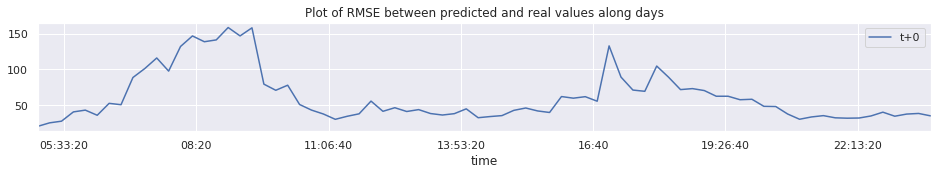

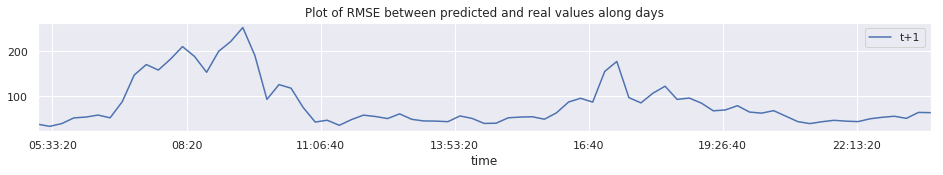

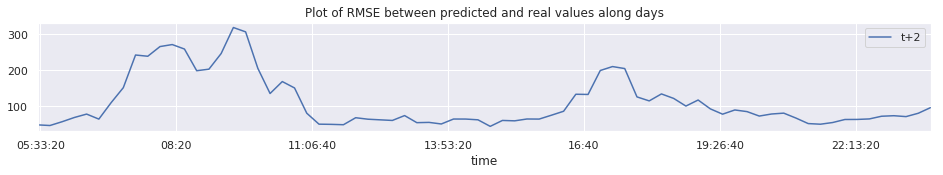

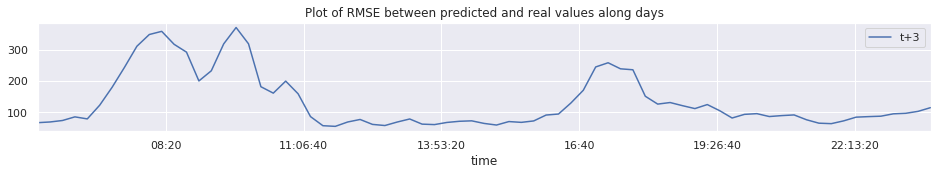

In [80]:
plot_diff_along_time_per_t(X_test, art_preds_s)

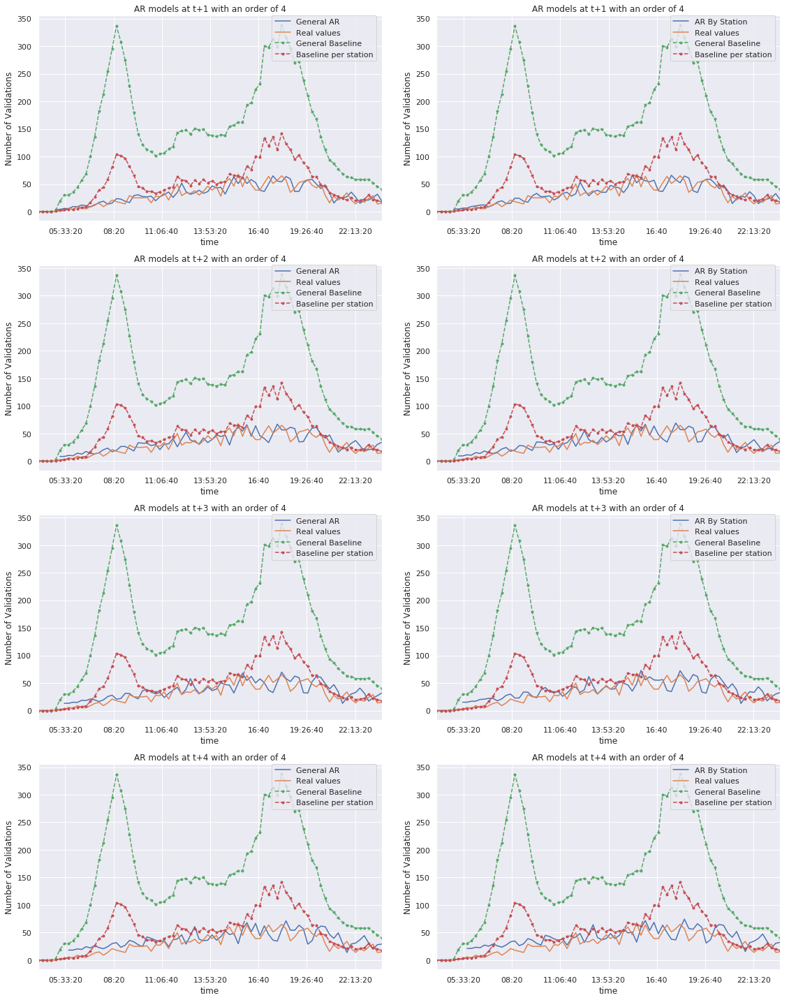

In [81]:
j, s = 2, 100
plot_bispecific(X_test, baseline_preds, art_preds, art_preds_s, order, limit_t, j, s)

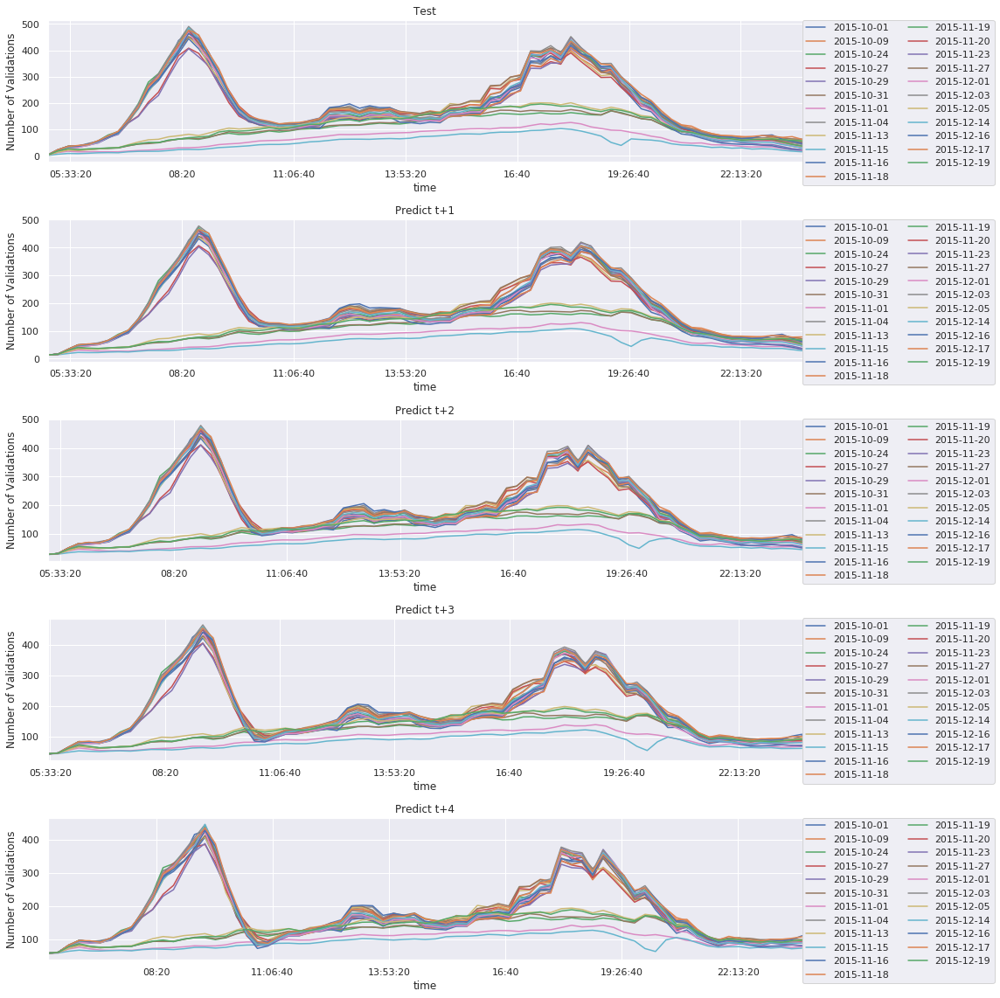

In [82]:
plot_qualitative_analysis(art_preds, X_test, limit_t, order, subway_stations, del_hours)

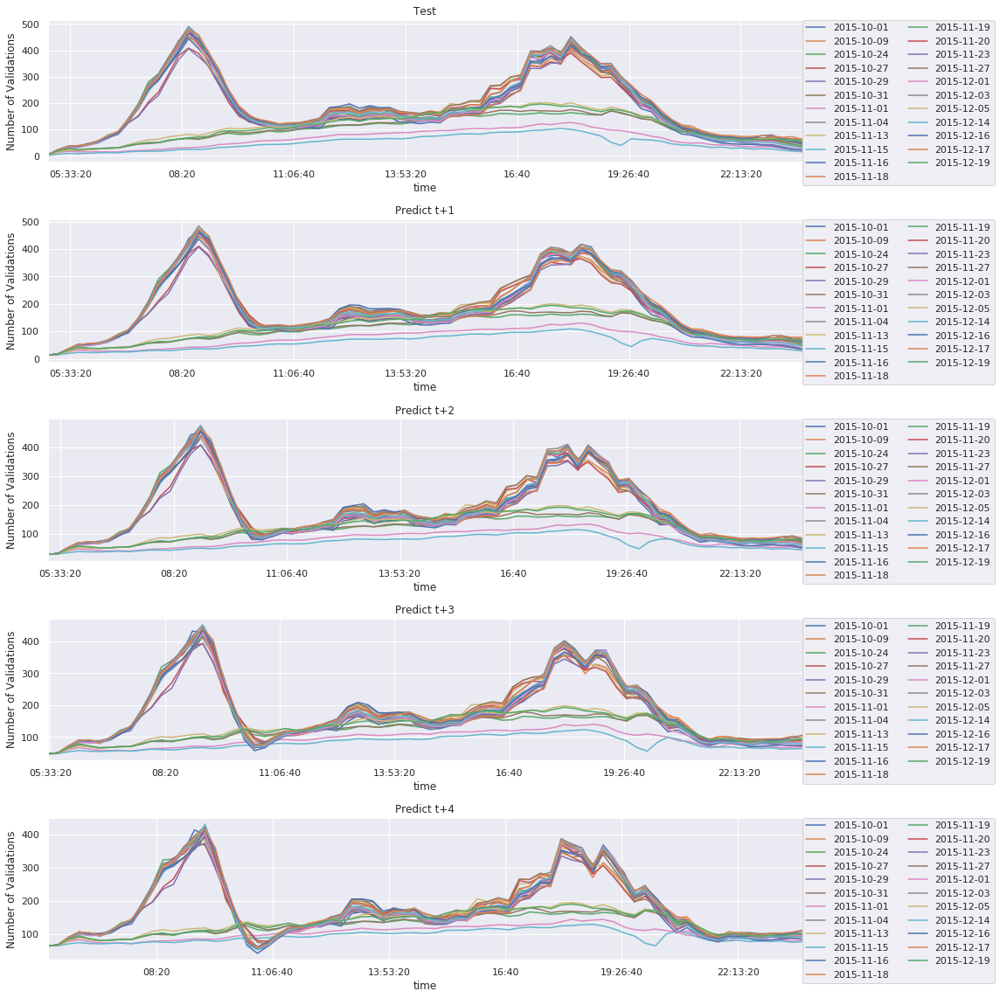

In [83]:
plot_qualitative_analysis(art_preds_s, X_test, limit_t, order, subway_stations, del_hours)

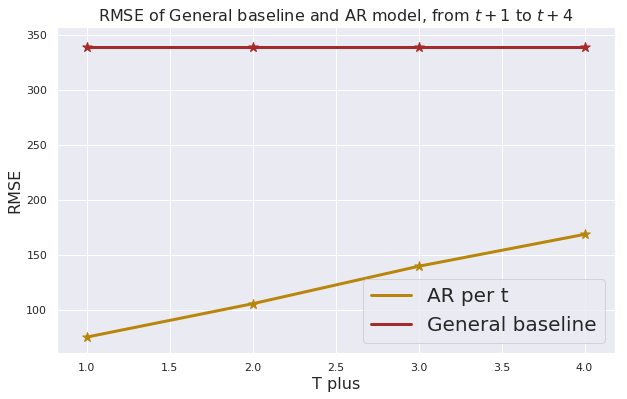

In [84]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 'None'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(art_scores).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="AR per t")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="General baseline")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.legend(prop={'size': 20})
plt.title("RMSE of General baseline and AR model, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

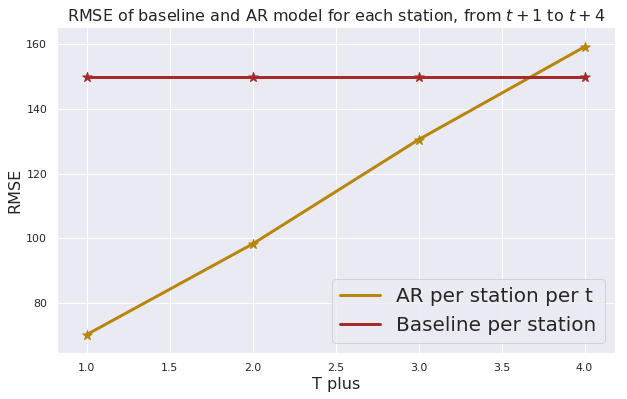

In [85]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 's'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(art_scores_s).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="AR per station per t")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="Baseline per station")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.legend(prop={'size': 20})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

#### Compute and Compare 

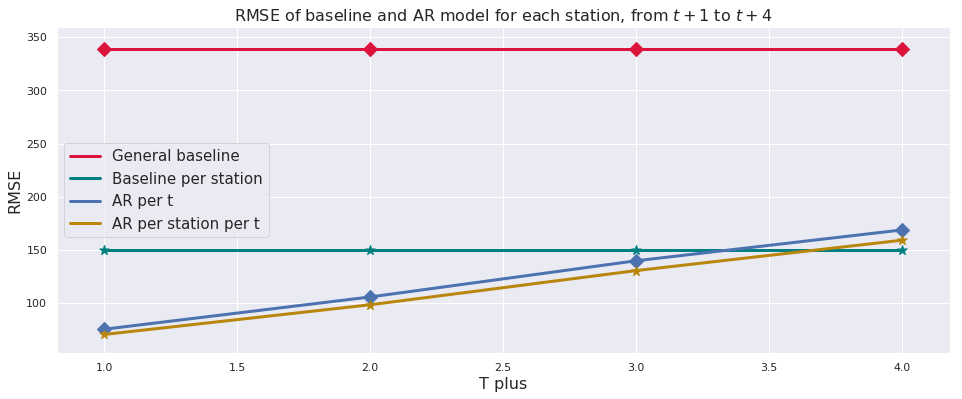

In [86]:
fig, ax = plt.subplots(1, figsize=(16, 6))
ax.set_prop_cycle(color=['crimson', 'teal', 'b', 'darkgoldenrod'])
x = range(1, limit_t+1)
baseline_scores = df_baseline_scores.loc['RMSE'].values.repeat(limit_t).reshape(-1, limit_t).T
model_scores = np.vstack((np.array(art_scores).T[1], np.array(art_scores_s).T[1])).T
baselineObjects = plt.plot(x, baseline_scores, linewidth=3)
labels = ["General baseline", "Baseline per station", "AR per t", "AR per station per t"]
arlineObjects = plt.plot(x, model_scores, linewidth=3)

# ['D', '*', '|', 'X']
# labels = ["Full baseline", "Baseline per station", "Baseline per day",
#                    "Baseline per station and day", "Full AR", "AR per station"]
for i, m in zip(range(4), ['D', '*']):
    ax = plt.scatter(x, baseline_scores[:, i], marker=m, s=100)

for i, m in zip(range(2), ['D', '*']):
    ax = plt.scatter(x, model_scores[:, i], marker=m, s=100)
    
plt.legend(baselineObjects+arlineObjects, labels, prop={'size': 15})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

## AR per t + Baseline

In [87]:
def baseline_sub(X, baseline):
    
    return X.apply(lambda x: x - baseline.iloc[0], axis=(1, 2))
    
def baseline_add(X, baseline):
    
    return X.apply(lambda x: x + baseline.iloc[0], axis=(1, 2))
    

In [88]:
order, limit_t = 4, 4

In [89]:
# Minus Baseline per station
Xb_train = baseline_sub(X_train, baseline_preds[1])
Xb_test = baseline_sub(X_test, baseline_preds[1])

# Minus Baseline per station
Xb_train_s = baseline_sub(X_train, baseline_preds[1])
Xb_test_s = baseline_sub(X_test, baseline_preds[1])

In [90]:
Xb_min_max_s = Xb_train_s.apply(lambda x: (x.min().min(), x.max().max()), axis=(0, 2))

In [91]:
Xbn_train_s = Xb_train_s.apply(lambda x: a + ((x - x.min().min()) * (b - a)) / (x.max().max() - x.min().min()), 
                               axis=(0, 2)).transpose(2, 0, 1)
# Normalize Xb_test
Xbn_test_s = pd.Panel(np.array(list(map(lambda station_id: normalize(
    Xb_test_s, Xb_min_max_s, station_id, a=a, b=b), 
                                        Xb_test_s.transpose(1, 0, 2)))).transpose(2, 0, 1),
                      items=list(Xb_test_s.items),
                      major_axis=subway_stations,
                      minor_axis=generate_times("15min")[(del_hours * 4):])

# Denormalize Xb_test
Xbdn_test_s = pd.Panel(np.array(list(map(lambda station_id: denormalize(
    Xbn_test_s, Xb_min_max_s, station_id, a=a, b=b), 
                                        Xb_test_s.transpose(1, 0, 2)))).transpose(2, 0, 1),
                      items=list(Xb_test_s.items),
                      major_axis=subway_stations,
                      minor_axis=generate_times("15min")[(del_hours * 4):])

In [92]:
%%time
artb_preds, artb_scores = art_plot_results(None, order=order, limit_t=limit_t, X_train=Xbn_train_s,
                                           X_test=Xbn_test_s, X_min_max=Xb_min_max_s, a=a, b=b)

for t in range(limit_t):
    artb_preds[t] = baseline_add(artb_preds[t], baseline_preds[1])

Predicting...
Fitting t+1...


,1,2,3,4
Weights,-0.026365,-0.001003,0.286753,0.689693


Predicting t+1...
Fitting t+2...


,1,2,3,4
Weights,-0.144195,0.059483,0.232163,0.759729


Predicting t+2...
Fitting t+3...


,1,2,3,4
Weights,-0.12366,-0.075252,0.307523,0.753903


Predicting t+3...
Fitting t+4...


,1,2,3,4
Weights,-0.112848,-0.063793,0.169138,0.825873


Predicting t+4...


,t+1,t+2,t+3,t+4
R2,8.533149e-01,7.652416e-01,6.432250e-01,5.154617e-01
RMSE,5.881985e+01,7.490505e+01,9.295702e+01,1.090536e+02
MSE,3.459775e+03,5.610767e+03,8.641007e+03,1.189270e+04
MAE,4.466713e+09,5.888284e+09,1.009986e+10,1.309480e+10
MAPE,4.466713e+11,5.888284e+11,1.009986e+12,1.309480e+12
MPE,-2.637295e+11,2.003576e+10,-2.480128e+11,-3.129422e+11


CPU times: user 30.5 s, sys: 3.84 s, total: 34.3 s
Wall time: 29.5 s


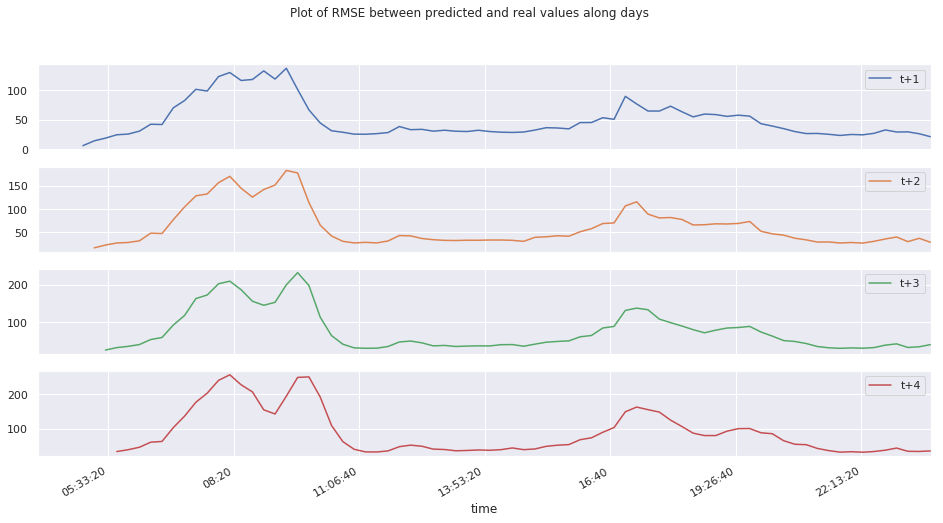

In [93]:
plot_diff_along_time(X_test, artb_preds)

In [94]:
%%time
artb_preds_s, artb_scores_s = art_plot_results("s", order, limit_t,  
                                               X_train=Xbn_train_s, 
                                               X_test=Xbn_test_s,
                                               X_min_max=Xb_min_max_s, a=a, b=b)
for t in range(limit_t):
    artb_preds_s[t] = baseline_add(artb_preds_s[t], baseline_preds[1]) 

Predicting...
Fitting t+1...


,1,2,3,4
Weights,-0.163168,0.139783,0.305386,0.589474


,1,2,3,4
Weights,0.040824,0.073202,0.188442,0.533194


,1,2,3,4
Weights,-0.120551,-0.1372,0.258646,0.887109


,1,2,3,4
Weights,-0.031678,-0.035899,0.383099,0.574166


,1,2,3,4
Weights,0.133378,0.089053,0.158756,0.570975


,1,2,3,4
Weights,-0.135447,-0.038887,0.218936,0.841153


,1,2,3,4
Weights,-0.025879,0.03796,0.313591,0.597737


,1,2,3,4
Weights,-0.157876,-0.005171,0.233699,0.825575


,1,2,3,4
Weights,-0.141208,-0.023049,0.208845,0.863171


,1,2,3,4
Weights,-0.137775,-0.115388,0.152779,1.002728


,1,2,3,4
Weights,-0.068301,-0.10694,0.488742,0.558645


,1,2,3,4
Weights,0.01215,0.02157,0.225992,0.624557


,1,2,3,4
Weights,0.318573,-0.099056,0.292544,0.397092


,1,2,3,4
Weights,0.033923,-0.019136,0.362386,0.553317


,1,2,3,4
Weights,0.031044,-0.016259,0.267605,0.664011


,1,2,3,4
Weights,-0.100553,-0.060078,0.254674,0.813133


,1,2,3,4
Weights,-0.064586,0.011985,0.245068,0.718942


,1,2,3,4
Weights,0.069086,0.14725,0.218388,0.447663


,1,2,3,4
Weights,-0.07331,0.051139,0.277927,0.652531


,1,2,3,4
Weights,-0.053653,-0.174041,0.261608,0.86739


,1,2,3,4
Weights,-0.125934,-0.033282,0.305351,0.746493


,1,2,3,4
Weights,-0.12654,-0.058031,0.287107,0.775309


,1,2,3,4
Weights,-0.112021,-0.156692,0.25801,0.894012


,1,2,3,4
Weights,-0.162407,-0.009473,0.145402,0.951486


,1,2,3,4
Weights,0.027716,-0.065838,0.357172,0.617065


,1,2,3,4
Weights,0.076269,-0.03371,0.324052,0.552417


,1,2,3,4
Weights,-0.097957,0.101558,0.303971,0.578316


,1,2,3,4
Weights,0.069862,-0.023592,0.319654,0.557946


,1,2,3,4
Weights,0.004052,0.028244,0.266467,0.576687


,1,2,3,4
Weights,0.083827,-0.175654,0.280837,0.727442


,1,2,3,4
Weights,-0.130465,-0.139542,0.398393,0.814664


,1,2,3,4
Weights,-0.085941,-0.111443,0.188449,0.903266


,1,2,3,4
Weights,-0.049372,-0.022319,0.249784,0.72788


,1,2,3,4
Weights,-0.04405,-0.082469,0.307528,0.736966


,1,2,3,4
Weights,0.217632,0.139641,0.036651,0.497132


,1,2,3,4
Weights,0.028554,-0.032307,0.283675,0.661193


,1,2,3,4
Weights,0.021746,0.097254,0.184031,0.591184


,1,2,3,4
Weights,-0.057152,0.003938,0.276457,0.640018


,1,2,3,4
Weights,-0.023414,-0.141679,0.264009,0.835112


,1,2,3,4
Weights,-0.092254,-0.15412,0.30602,0.874179


,1,2,3,4
Weights,0.148738,0.141518,0.228893,0.355461


,1,2,3,4
Weights,0.157556,0.112416,0.037278,0.577946


,1,2,3,4
Weights,0.021421,0.133821,0.244314,0.514341


,1,2,3,4
Weights,-0.044783,0.05859,0.209487,0.651227


,1,2,3,4
Weights,-0.059611,0.007397,0.29808,0.663404


,1,2,3,4
Weights,-0.072598,-0.269049,0.30812,0.935745


,1,2,3,4
Weights,0.002877,0.035467,0.212501,0.646621


,1,2,3,4
Weights,-0.116065,-0.033263,0.226056,0.85311


,1,2,3,4
Weights,-0.146126,-0.063277,0.449092,0.675458


,1,2,3,4
Weights,0.273245,0.111592,0.114872,0.413482


,1,2,3,4
Weights,-0.056179,-0.099041,0.177369,0.909403


,1,2,3,4
Weights,0.043018,0.049323,0.293303,0.491777


,1,2,3,4
Weights,-0.03421,0.06371,0.255651,0.632465


,1,2,3,4
Weights,0.032932,-0.161464,0.253534,0.81205


,1,2,3,4
Weights,-0.067877,0.229233,0.38907,0.32094


,1,2,3,4
Weights,0.160783,0.205442,0.091553,0.392409


,1,2,3,4
Weights,-0.130322,-0.03634,0.214475,0.871506


,1,2,3,4
Weights,0.123159,0.001653,0.165158,0.594091


,1,2,3,4
Weights,-0.034225,-0.2134,0.19928,0.931948


,1,2,3,4
Weights,-0.001989,0.045736,0.294543,0.567698


,1,2,3,4
Weights,-0.076689,-0.039468,0.138243,0.895177


,1,2,3,4
Weights,0.205668,0.118765,0.086873,0.472094


,1,2,3,4
Weights,0.202375,0.050414,0.224781,0.436269


,1,2,3,4
Weights,-0.076309,0.108868,0.382431,0.466912


,1,2,3,4
Weights,0.133305,0.05807,-0.0689,0.775613


,1,2,3,4
Weights,-0.102533,-0.116373,0.12405,1.001731


,1,2,3,4
Weights,-0.10645,0.042202,0.291986,0.628718


,1,2,3,4
Weights,-0.151837,-0.104476,0.153665,1.024788


,1,2,3,4
Weights,0.111271,0.031625,0.126646,0.653312


,1,2,3,4
Weights,-0.115789,-0.110418,0.127004,0.977676


,1,2,3,4
Weights,0.008065,0.159127,0.315042,0.387537


,1,2,3,4
Weights,-0.101501,-0.009728,0.387697,0.627481


,1,2,3,4
Weights,-0.090102,-0.017748,0.107298,0.919776


,1,2,3,4
Weights,-0.107863,0.085083,0.331543,0.537591


,1,2,3,4
Weights,0.142863,0.118016,0.219722,0.416105


,1,2,3,4
Weights,0.261869,0.116844,0.054314,0.315604


,1,2,3,4
Weights,-0.030618,-0.105798,0.498363,0.578299


,1,2,3,4
Weights,-0.119424,0.007598,0.349798,0.68905


,1,2,3,4
Weights,-0.152358,-0.048526,0.31957,0.776516


,1,2,3,4
Weights,0.045987,0.120999,0.220588,0.463176


,1,2,3,4
Weights,-0.048062,0.03882,0.296843,0.594148


,1,2,3,4
Weights,-0.051072,-0.208337,0.351206,0.814621


,1,2,3,4
Weights,-0.095798,0.01662,0.033672,0.944745


,1,2,3,4
Weights,0.075729,-0.005686,0.069334,0.746867


,1,2,3,4
Weights,-0.132397,-0.06476,0.23646,0.863143


,1,2,3,4
Weights,-0.073587,-0.144814,0.263857,0.831731


,1,2,3,4
Weights,-0.181233,0.016972,0.386028,0.692044


,1,2,3,4
Weights,-0.048221,0.078205,0.221747,0.636409


,1,2,3,4
Weights,-0.121629,-0.120624,0.359081,0.781437


,1,2,3,4
Weights,-0.016949,0.030855,0.340401,0.535817


,1,2,3,4
Weights,-0.113803,-0.166442,0.233521,0.952534


,1,2,3,4
Weights,-0.083416,-0.204398,0.312403,0.876977


,1,2,3,4
Weights,-0.111443,0.027981,0.309098,0.653673


,1,2,3,4
Weights,-0.006351,-0.054508,0.224007,0.772933


,1,2,3,4
Weights,-0.097795,-0.087237,0.355921,0.716223


,1,2,3,4
Weights,-0.042013,-0.060152,0.277459,0.732866


,1,2,3,4
Weights,-0.170965,-0.04564,0.201804,0.905225


,1,2,3,4
Weights,-0.171363,-0.131193,0.376831,0.824297


,1,2,3,4
Weights,-0.067342,-0.049013,0.359235,0.68533


,1,2,3,4
Weights,-0.057126,-0.245311,0.452498,0.76241


,1,2,3,4
Weights,-0.056566,-0.030434,0.387711,0.614807


,1,2,3,4
Weights,0.090352,0.017326,0.30925,0.512797


,1,2,3,4
Weights,-0.129058,0.046599,0.248919,0.735247


,1,2,3,4
Weights,-0.028243,-0.024825,0.208669,0.787153


,1,2,3,4
Weights,0.005913,0.042618,0.153688,0.699794


,1,2,3,4
Weights,-0.050743,0.031986,0.165179,0.764787


,1,2,3,4
Weights,0.026108,0.049422,0.220706,0.564881


,1,2,3,4
Weights,-0.171059,-0.101815,0.315644,0.857759


,1,2,3,4
Weights,0.020944,0.085221,0.300306,0.478486


,1,2,3,4
Weights,-0.168822,0.00184,0.427745,0.617825


,1,2,3,4
Weights,-0.037459,0.101848,0.208541,0.611458


,1,2,3,4
Weights,-0.049563,-0.166042,0.463123,0.702707


,1,2,3,4
Weights,0.085867,0.051011,0.314174,0.43009


,1,2,3,4
Weights,-0.045741,0.02448,0.174697,0.705025


,1,2,3,4
Weights,-0.113513,0.045107,0.261945,0.728719


,1,2,3,4
Weights,0.010013,0.03334,0.257681,0.624891


,1,2,3,4
Weights,-0.086986,0.019183,0.256796,0.709076


,1,2,3,4
Weights,0.028709,0.091092,0.267055,0.437139


,1,2,3,4
Weights,-0.079737,-0.050429,0.249534,0.74224


,1,2,3,4
Weights,0.100982,-0.179346,0.251852,0.744391


,1,2,3,4
Weights,-0.086774,0.073356,0.220357,0.669774


,1,2,3,4
Weights,0.005248,-0.093192,0.284398,0.695947


,1,2,3,4
Weights,-0.07785,-0.11489,0.329913,0.780904


,1,2,3,4
Weights,0.146298,0.210899,0.081854,0.510196


,1,2,3,4
Weights,-0.065304,-0.006841,0.271362,0.721615


,1,2,3,4
Weights,0.052504,0.091556,0.216056,0.563832


,1,2,3,4
Weights,-0.010652,0.005509,0.379987,0.554929


,1,2,3,4
Weights,-0.046061,-0.138078,0.487839,0.63674


,1,2,3,4
Weights,-0.076201,-0.124359,0.318228,0.786835


,1,2,3,4
Weights,0.189379,0.205214,0.036501,0.477505


,1,2,3,4
Weights,-0.147583,-0.028676,0.307322,0.762734


,1,2,3,4
Weights,-0.09212,-0.154725,0.338824,0.841488


,1,2,3,4
Weights,-0.094645,0.08194,0.211724,0.717417


,1,2,3,4
Weights,0.096719,-0.127648,0.289796,0.633688


,1,2,3,4
Weights,-0.00849,0.045441,0.175334,0.749691


,1,2,3,4
Weights,-0.161574,-0.148669,0.356202,0.840478


,1,2,3,4
Weights,0.043955,-0.005748,0.25683,0.64254


,1,2,3,4
Weights,0.089541,0.083087,0.234238,0.493623


,1,2,3,4
Weights,0.071111,-0.01632,0.160262,0.700895


,1,2,3,4
Weights,-0.178209,-0.063966,0.258795,0.877233


,1,2,3,4
Weights,-0.022227,-0.012202,0.272253,0.681415


,1,2,3,4
Weights,-0.118193,-0.021356,0.285698,0.732814


,1,2,3,4
Weights,-0.139183,-0.025212,0.342005,0.719277


,1,2,3,4
Weights,0.088111,0.039264,0.232645,0.53153


,1,2,3,4
Weights,-0.030879,0.093559,0.261561,0.57876


,1,2,3,4
Weights,-0.044429,-0.038129,0.311482,0.710191


,1,2,3,4
Weights,-0.110928,-0.00193,0.155824,0.872411


,1,2,3,4
Weights,-0.041557,-0.115928,0.377524,0.706133


,1,2,3,4
Weights,-0.181508,-0.029376,0.419781,0.701913


,1,2,3,4
Weights,-0.045961,-0.08928,0.226587,0.819282


,1,2,3,4
Weights,0.166949,-0.105889,0.291533,0.546349


,1,2,3,4
Weights,-0.072916,0.052223,0.353072,0.574845


,1,2,3,4
Weights,-0.081106,0.039325,0.394671,0.552702


,1,2,3,4
Weights,0.040936,0.065258,0.305593,0.425195


,1,2,3,4
Weights,0.12729,0.027291,0.251747,0.523827


,1,2,3,4
Weights,-0.204263,-0.062937,0.254341,0.900464


,1,2,3,4
Weights,-0.078444,0.017001,0.181439,0.763324


,1,2,3,4
Weights,-0.015315,0.108925,0.218059,0.630201


,1,2,3,4
Weights,0.038768,-0.119713,0.274841,0.752848


,1,2,3,4
Weights,-0.074918,-0.108467,0.307469,0.777948


,1,2,3,4
Weights,-0.081651,0.086807,0.138836,0.753948


,1,2,3,4
Weights,-0.143281,0.070336,0.322943,0.642291


,1,2,3,4
Weights,0.031899,-0.01308,0.346083,0.561344


,1,2,3,4
Weights,-0.085493,-0.014835,0.272539,0.725069


,1,2,3,4
Weights,0.070236,0.035719,0.254989,0.583213


,1,2,3,4
Weights,0.017894,0.133146,0.344633,0.392695


,1,2,3,4
Weights,-0.10467,-0.012527,0.321993,0.717379


,1,2,3,4
Weights,-0.072047,0.011271,0.273428,0.670424


,1,2,3,4
Weights,-0.149629,0.007893,0.284301,0.766318


,1,2,3,4
Weights,-0.211953,-0.020859,0.348062,0.794688


,1,2,3,4
Weights,-0.139639,-0.070043,0.23631,0.880751


,1,2,3,4
Weights,-0.197036,-0.10465,0.400118,0.800014


,1,2,3,4
Weights,-0.043461,-0.005079,0.211207,0.712032


,1,2,3,4
Weights,-0.200867,-0.068999,0.261972,0.932241


,1,2,3,4
Weights,0.02061,0.023323,0.215552,0.632932


,1,2,3,4
Weights,-0.121661,-0.029213,0.34564,0.715495


,1,2,3,4
Weights,-0.046463,-0.059726,0.327198,0.731364


,1,2,3,4
Weights,-0.22502,-0.044502,0.500696,0.663112


,1,2,3,4
Weights,0.033374,0.180707,-0.413184,1.015846


,1,2,3,4
Weights,-0.135787,-0.001389,0.468875,0.539434


,1,2,3,4
Weights,0.172096,-0.145858,0.478863,0.427825


,1,2,3,4
Weights,-0.17038,-0.037544,0.341466,0.744311


,1,2,3,4
Weights,0.015668,0.0903,0.285752,0.520948


,1,2,3,4
Weights,0.130361,0.001393,-0.012573,0.45812


,1,2,3,4
Weights,0.025462,-0.119486,0.334228,0.649088


,1,2,3,4
Weights,-0.118793,-0.18538,0.118294,1.138532


,1,2,3,4
Weights,-0.071894,0.013355,0.260978,0.702725


,1,2,3,4
Weights,-0.063335,-0.085849,0.411891,0.651295


,1,2,3,4
Weights,0.055067,0.028607,0.133197,0.684488


,1,2,3,4
Weights,-0.112886,0.007342,0.194678,0.818095


,1,2,3,4
Weights,-0.0536,0.047952,0.24152,0.703953


,1,2,3,4
Weights,-0.068462,0.052176,0.217378,0.692022


,1,2,3,4
Weights,-0.031147,0.072573,0.189382,0.655971


,1,2,3,4
Weights,0.011043,0.079562,0.192641,0.666311


,1,2,3,4
Weights,-0.013471,-0.102426,0.347204,0.689418


,1,2,3,4
Weights,-0.103043,0.039308,0.304202,0.654616


,1,2,3,4
Weights,-0.135393,0.009318,0.320729,0.678128


,1,2,3,4
Weights,0.113415,0.113146,0.042567,0.506881


,1,2,3,4
Weights,-0.173671,-0.060907,0.320792,0.827901


,1,2,3,4
Weights,-0.120747,0.009024,0.341403,0.683016


,1,2,3,4
Weights,-0.061735,-0.158922,0.367487,0.804251


,1,2,3,4
Weights,-0.118198,-0.079508,0.16633,0.931591


,1,2,3,4
Weights,-0.053279,-0.027789,0.384059,0.62347


,1,2,3,4
Weights,-0.011877,-0.153245,0.391189,0.718958


,1,2,3,4
Weights,-0.164267,-0.006856,0.349372,0.697819


,1,2,3,4
Weights,0.068907,0.091454,0.205706,0.433848


,1,2,3,4
Weights,0.099156,-0.045365,0.236008,0.643637


,1,2,3,4
Weights,-0.128185,0.048599,0.437289,0.523274


,1,2,3,4
Weights,-0.126416,-0.028291,0.312642,0.747917


,1,2,3,4
Weights,0.349396,0.098547,0.059785,0.417501


,1,2,3,4
Weights,-0.015147,-0.305022,0.484982,0.78623


,1,2,3,4
Weights,-0.053693,-0.054996,0.354539,0.679459


,1,2,3,4
Weights,-0.115971,-0.121559,0.304326,0.868375


,1,2,3,4
Weights,0.030288,-0.005751,0.234134,0.650469


,1,2,3,4
Weights,0.037816,-0.133824,0.357987,0.647213


,1,2,3,4
Weights,0.121206,0.143428,0.117982,0.459808


,1,2,3,4
Weights,0.075372,0.029446,0.22508,0.581801


,1,2,3,4
Weights,-0.100155,-0.112445,0.389132,0.757801


,1,2,3,4
Weights,-0.188353,-0.050409,0.30376,0.854506


,1,2,3,4
Weights,-0.084897,-0.154196,0.382803,0.767434


,1,2,3,4
Weights,-0.05806,0.017555,0.249165,0.702009


,1,2,3,4
Weights,-0.114818,-0.012037,0.268331,0.761399


,1,2,3,4
Weights,-0.059124,-0.153795,0.454688,0.694451


,1,2,3,4
Weights,0.063604,0.093103,0.102084,0.526329


,1,2,3,4
Weights,0.156844,-0.028166,0.241552,0.552988


,1,2,3,4
Weights,-0.097978,0.023269,0.16469,0.801966


,1,2,3,4
Weights,-0.02008,-0.208192,0.402404,0.773022


,1,2,3,4
Weights,-0.125066,0.058469,0.209434,0.770069


,1,2,3,4
Weights,-0.168351,0.03284,0.404946,0.646654


,1,2,3,4
Weights,-0.016726,0.043266,0.278463,0.63779


,1,2,3,4
Weights,-0.192199,-0.0442,0.407957,0.715149


,1,2,3,4
Weights,-0.013256,0.060024,0.288563,0.602416


,1,2,3,4
Weights,-0.013367,-0.146441,0.245169,0.768982


,1,2,3,4
Weights,0.039073,-0.016359,0.21285,0.651603


,1,2,3,4
Weights,-0.184056,0.002106,0.462865,0.637382


,1,2,3,4
Weights,0.105818,-0.067221,0.407476,0.470633


,1,2,3,4
Weights,-0.005039,0.09927,0.194427,0.632432


,1,2,3,4
Weights,-0.165827,-0.108603,0.339184,0.841585


,1,2,3,4
Weights,-0.130873,0.025998,0.238911,0.769338


,1,2,3,4
Weights,-0.045818,-0.100028,0.251611,0.818119


,1,2,3,4
Weights,-0.077762,0.026126,0.338825,0.595463


,1,2,3,4
Weights,-0.050808,0.058971,0.321678,0.567507


,1,2,3,4
Weights,0.192699,0.036191,0.141603,0.558895


,1,2,3,4
Weights,-0.043788,-0.069398,0.252196,0.747844


,1,2,3,4
Weights,-0.020091,-0.003848,0.385678,0.56072


,1,2,3,4
Weights,0.070377,0.052867,0.177533,0.598877


,1,2,3,4
Weights,-0.073035,-0.058214,0.265993,0.782718


,1,2,3,4
Weights,-0.036776,-0.145259,0.367712,0.763757


,1,2,3,4
Weights,-0.119919,0.031422,0.365733,0.638674


,1,2,3,4
Weights,-0.048869,-0.148288,0.399796,0.697212


,1,2,3,4
Weights,-0.173495,-0.014135,0.273947,0.805638


,1,2,3,4
Weights,0.001247,0.050427,0.231533,0.622107


,1,2,3,4
Weights,0.111269,0.097031,0.127006,0.573837


,1,2,3,4
Weights,-0.029411,0.051335,0.309223,0.576959


,1,2,3,4
Weights,-0.1504,0.000054,0.393149,0.665692


,1,2,3,4
Weights,0.115846,0.100608,0.188505,0.498844


,1,2,3,4
Weights,-0.114026,-0.143998,0.262855,0.899626


,1,2,3,4
Weights,0.048592,0.040917,0.157942,0.682117


,1,2,3,4
Weights,0.075345,-0.146406,0.368245,0.648075


,1,2,3,4
Weights,-0.13526,-0.078996,0.186647,0.920278


,1,2,3,4
Weights,0.047311,0.072865,0.275066,0.463964


,1,2,3,4
Weights,0.009469,-0.097716,0.307835,0.70612


,1,2,3,4
Weights,0.051702,0.093975,0.107269,0.580356


,1,2,3,4
Weights,-0.072821,-0.184497,0.334782,0.843406


,1,2,3,4
Weights,-0.153585,0.007515,0.237625,0.800888


,1,2,3,4
Weights,-0.006327,-0.02769,0.307106,0.621354


,1,2,3,4
Weights,-0.027229,-0.106106,0.425236,0.644509


,1,2,3,4
Weights,-0.113568,-0.089043,0.236283,0.873551


,1,2,3,4
Weights,-0.091203,0.055765,0.287629,0.677423


,1,2,3,4
Weights,-0.091152,-0.085314,0.150925,0.962675


,1,2,3,4
Weights,-0.130835,-0.141054,0.32911,0.845678


,1,2,3,4
Weights,-0.105467,-0.136116,0.15714,0.995278


,1,2,3,4
Weights,-0.0807,0.134036,0.176109,0.666289


,1,2,3,4
Weights,-0.100375,0.05492,0.29968,0.639111


,1,2,3,4
Weights,-0.110836,-0.05597,0.388277,0.670908


,1,2,3,4
Weights,-0.168817,-0.026473,0.28059,0.820042


,1,2,3,4
Weights,-0.096911,0.066075,0.196371,0.735149


,1,2,3,4
Weights,-0.084971,0.078254,0.385062,0.601619


,1,2,3,4
Weights,0.087049,0.026579,0.247681,0.600615


,1,2,3,4
Weights,0.01036,0.086093,0.236612,0.526103


,1,2,3,4
Weights,0.07376,-0.046709,0.195835,0.66055


,1,2,3,4
Weights,-0.091847,-0.049661,0.257357,0.778581


,1,2,3,4
Weights,-0.197839,-0.026783,0.330308,0.813373


,1,2,3,4
Weights,-0.095765,-0.266628,0.464772,0.844244


,1,2,3,4
Weights,-0.000072,0.193264,0.251061,0.336622


,1,2,3,4
Weights,0.02122,-0.020952,0.249117,0.65336


,1,2,3,4
Weights,-0.19244,-0.063917,0.37446,0.8177


,1,2,3,4
Weights,-0.021962,-0.018193,0.14086,0.833303


,1,2,3,4
Weights,-0.035175,-0.217839,0.461381,0.738558


,1,2,3,4
Weights,-0.061918,0.056292,0.389394,0.497809


,1,2,3,4
Weights,0.011174,0.114987,0.161841,0.607394


,1,2,3,4
Weights,0.103246,0.112418,0.181061,0.53353


,1,2,3,4
Weights,-0.046678,-0.014019,0.290621,0.679489


,1,2,3,4
Weights,0.082353,0.015764,0.297912,0.528514


,1,2,3,4
Weights,-0.066476,0.057937,0.225355,0.683596


,1,2,3,4
Weights,0.057449,0.069716,0.076516,0.65311


,1,2,3,4
Weights,0.058242,-0.023374,0.275795,0.606636


,1,2,3,4
Weights,-0.131108,-0.144808,0.365092,0.810216


,1,2,3,4
Weights,-0.129808,-0.156911,0.307525,0.873051


,1,2,3,4
Weights,0.103249,0.090109,0.237348,0.491242


,1,2,3,4
Weights,-0.190366,-0.113146,0.396139,0.8341


Predicting t+1...
Fitting t+2...


,1,2,3,4
Weights,-0.230435,0.000016,0.352092,0.659622


,1,2,3,4
Weights,-0.047737,0.117046,0.187811,0.478935


,1,2,3,4
Weights,-0.239783,-0.120729,0.122954,1.012967


,1,2,3,4
Weights,-0.184934,0.043921,0.246193,0.703244


,1,2,3,4
Weights,0.058107,0.19626,0.180958,0.48915


,1,2,3,4
Weights,-0.221821,-0.0755,0.166183,0.909986


,1,2,3,4
Weights,-0.181051,0.09637,0.27539,0.674513


,1,2,3,4
Weights,-0.256366,-0.05527,0.212854,0.89802


,1,2,3,4
Weights,-0.242057,-0.05434,0.177339,0.937555


,1,2,3,4
Weights,-0.195508,-0.194051,0.044575,1.144623


,1,2,3,4
Weights,-0.205597,-0.032945,0.242875,0.776435


,1,2,3,4
Weights,-0.028677,0.047947,0.170966,0.617405


,1,2,3,4
Weights,0.125717,0.279471,0.017433,0.450314


,1,2,3,4
Weights,-0.071097,0.073023,0.215129,0.668511


,1,2,3,4
Weights,-0.14283,0.128498,0.206663,0.709518


,1,2,3,4
Weights,-0.243688,-0.015358,0.184214,0.892949


,1,2,3,4
Weights,-0.135547,0.007874,0.208877,0.759148


,1,2,3,4
Weights,-0.063694,0.178719,0.267891,0.435131


,1,2,3,4
Weights,-0.149619,0.026569,0.258532,0.704274


,1,2,3,4
Weights,-0.150351,-0.112714,0.075988,0.992921


,1,2,3,4
Weights,-0.209816,-0.062514,0.225976,0.847866


,1,2,3,4
Weights,-0.196454,-0.093504,0.189848,0.872459


,1,2,3,4
Weights,-0.1808,-0.179052,0.093305,1.03697


,1,2,3,4
Weights,-0.19879,-0.128133,0.134392,1.043331


,1,2,3,4
Weights,-0.188166,0.113557,0.230144,0.727729


,1,2,3,4
Weights,-0.180382,0.180793,0.222976,0.631141


,1,2,3,4
Weights,-0.187758,0.035924,0.313702,0.644428


,1,2,3,4
Weights,-0.055822,0.109287,0.187269,0.632638


,1,2,3,4
Weights,-0.137482,0.100757,0.219264,0.603548


,1,2,3,4
Weights,-0.060559,0.04322,0.065903,0.796015


,1,2,3,4
Weights,-0.284422,-0.09347,0.247726,1.017842


,1,2,3,4
Weights,-0.166545,-0.104721,0.073627,0.987816


,1,2,3,4
Weights,-0.261256,0.099071,0.212997,0.766537


,1,2,3,4
Weights,-0.178146,0.00341,0.186694,0.834208


,1,2,3,4
Weights,-0.08863,0.396423,0.166659,0.335084


,1,2,3,4
Weights,-0.166533,0.129617,0.210127,0.717139


,1,2,3,4
Weights,-0.129471,0.163948,0.232941,0.549095


,1,2,3,4
Weights,-0.144681,0.006558,0.211977,0.68525


,1,2,3,4
Weights,-0.202771,0.009249,0.125981,0.932644


,1,2,3,4
Weights,-0.284944,-0.044407,0.170883,1.021987


,1,2,3,4
Weights,0.069185,0.193121,0.21865,0.351426


,1,2,3,4
Weights,0.166264,0.176716,0.130451,0.355659


,1,2,3,4
Weights,-0.184946,0.191867,0.308094,0.537253


,1,2,3,4
Weights,-0.171375,0.085716,0.223307,0.638058


,1,2,3,4
Weights,-0.11287,-0.005975,0.22597,0.73572


,1,2,3,4
Weights,-0.098672,-0.295755,0.02827,1.173986


,1,2,3,4
Weights,-0.068696,0.07137,0.187975,0.633461


,1,2,3,4
Weights,-0.184286,-0.070692,0.176998,0.942477


,1,2,3,4
Weights,-0.246604,-0.085337,0.297898,0.880933


,1,2,3,4
Weights,0.023603,0.362301,0.17315,0.307594


,1,2,3,4
Weights,-0.243607,0.031064,0.093462,0.975939


,1,2,3,4
Weights,-0.064208,0.108911,0.218968,0.542524


,1,2,3,4
Weights,-0.129189,0.073975,0.251845,0.66033


,1,2,3,4
Weights,-0.214104,0.092625,0.107521,0.883171


,1,2,3,4
Weights,-0.1068,0.031846,0.385008,0.509784


,1,2,3,4
Weights,-0.046803,0.289443,0.253301,0.275849


,1,2,3,4
Weights,-0.226964,-0.061109,0.171556,0.957423


,1,2,3,4
Weights,0.011363,0.161397,0.111667,0.522401


,1,2,3,4
Weights,-0.009741,-0.254177,-0.032147,1.073755


,1,2,3,4
Weights,-0.103594,0.081672,0.244018,0.62108


,1,2,3,4
Weights,-0.288447,0.087013,0.111143,0.916668


,1,2,3,4
Weights,0.027112,0.297866,0.167459,0.32569


,1,2,3,4
Weights,0.045364,0.244494,0.160503,0.421274


,1,2,3,4
Weights,-0.159444,0.031774,0.331294,0.609543


,1,2,3,4
Weights,0.055445,0.216622,0.000635,0.540674


,1,2,3,4
Weights,-0.17649,-0.143515,0.015913,1.111491


,1,2,3,4
Weights,-0.195437,0.00128,0.259804,0.683907


,1,2,3,4
Weights,-0.305666,-0.099026,0.072583,1.16435


,1,2,3,4
Weights,-0.133494,0.269253,0.143107,0.575666


,1,2,3,4
Weights,-0.132651,-0.204282,0.014929,1.079593


,1,2,3,4
Weights,-0.02151,0.079143,0.289092,0.469358


,1,2,3,4
Weights,-0.239872,0.004059,0.296424,0.767837


,1,2,3,4
Weights,-0.189975,-0.006844,0.091052,0.942782


,1,2,3,4
Weights,-0.211668,0.020061,0.309301,0.624756


,1,2,3,4
Weights,0.079673,0.183916,0.204384,0.388136


,1,2,3,4
Weights,0.088338,0.298204,0.13932,0.15108


,1,2,3,4
Weights,-0.262726,0.05062,0.301217,0.8024


,1,2,3,4
Weights,-0.196847,-0.034292,0.284408,0.816005


,1,2,3,4
Weights,-0.227989,-0.101978,0.229872,0.903993


,1,2,3,4
Weights,-0.0408,0.13128,0.237498,0.444016


,1,2,3,4
Weights,-0.129847,0.034941,0.244015,0.651072


,1,2,3,4
Weights,-0.159053,-0.124164,0.117337,0.985661


,1,2,3,4
Weights,-0.267732,0.089035,0.052602,0.913834


,1,2,3,4
Weights,0.086252,0.049206,0.043777,0.625702


,1,2,3,4
Weights,-0.274885,-0.04568,0.172173,0.952816


,1,2,3,4
Weights,-0.137648,-0.129941,0.093407,0.940434


,1,2,3,4
Weights,-0.267069,-0.06849,0.330121,0.84928


,1,2,3,4
Weights,-0.137149,0.069565,0.241143,0.63209


,1,2,3,4
Weights,-0.211154,-0.122004,0.197083,0.944383


,1,2,3,4
Weights,-0.092017,0.043494,0.24101,0.629922


,1,2,3,4
Weights,-0.171793,-0.213607,0.073296,1.123101


,1,2,3,4
Weights,-0.145414,-0.197803,0.090024,1.061938


,1,2,3,4
Weights,-0.212666,-0.00105,0.26883,0.730145


,1,2,3,4
Weights,0.059125,-0.098674,0.104645,0.825695


,1,2,3,4
Weights,-0.157932,-0.096627,0.194896,0.857348


,1,2,3,4
Weights,-0.163322,0.011372,0.17708,0.802824


,1,2,3,4
Weights,-0.207319,-0.163339,0.145819,1.011021


,1,2,3,4
Weights,-0.234768,-0.197909,0.209439,1.03011


,1,2,3,4
Weights,-0.220888,0.020039,0.256291,0.811829


,1,2,3,4
Weights,-0.212849,-0.112506,0.171968,0.985071


,1,2,3,4
Weights,-0.172454,0.009689,0.258357,0.757012


,1,2,3,4
Weights,-0.036963,0.143167,0.204139,0.575051


,1,2,3,4
Weights,-0.224678,0.00135,0.258118,0.783412


,1,2,3,4
Weights,-0.19266,0.083573,0.180824,0.817031


,1,2,3,4
Weights,-0.14372,0.135398,0.17259,0.647093


,1,2,3,4
Weights,-0.174231,0.077766,0.178794,0.749622


,1,2,3,4
Weights,-0.000636,0.062804,0.178799,0.539408


,1,2,3,4
Weights,-0.277676,-0.140543,0.204333,1.017958


,1,2,3,4
Weights,-0.103688,0.11684,0.26283,0.540119


,1,2,3,4
Weights,-0.272507,-0.060607,0.328453,0.79101


,1,2,3,4
Weights,-0.162239,0.10981,0.257215,0.593449


,1,2,3,4
Weights,-0.277316,0.006449,0.266254,0.9084


,1,2,3,4
Weights,0.003144,0.122491,0.197686,0.502657


,1,2,3,4
Weights,-0.133508,0.044712,0.164317,0.669787


,1,2,3,4
Weights,-0.252249,0.043521,0.275747,0.786779


,1,2,3,4
Weights,-0.082645,0.086268,0.217472,0.651947


,1,2,3,4
Weights,-0.16022,-0.003064,0.224199,0.75578


,1,2,3,4
Weights,-0.040154,0.091641,0.22229,0.463783


,1,2,3,4
Weights,-0.183211,-0.024149,0.163401,0.78698


,1,2,3,4
Weights,-0.289001,0.234792,0.109963,0.767685


,1,2,3,4
Weights,-0.177534,0.041639,0.246423,0.670414


,1,2,3,4
Weights,-0.179258,0.067528,0.1571,0.752374


,1,2,3,4
Weights,-0.215288,-0.045193,0.188608,0.914552


,1,2,3,4
Weights,-0.122384,0.362882,0.271538,0.399581


,1,2,3,4
Weights,-0.151166,0.005369,0.214818,0.786908


,1,2,3,4
Weights,-0.000041,0.120995,0.219052,0.539138


,1,2,3,4
Weights,-0.104325,0.046907,0.253327,0.688127


,1,2,3,4
Weights,-0.254106,0.011699,0.276416,0.85585


,1,2,3,4
Weights,-0.236077,-0.033121,0.178046,0.904906


,1,2,3,4
Weights,-0.05401,0.36484,0.229076,0.30877


,1,2,3,4
Weights,-0.239347,-0.069915,0.238826,0.871519


,1,2,3,4
Weights,-0.343704,0.007435,0.212596,0.984951


,1,2,3,4
Weights,-0.136767,0.013421,0.24729,0.727255


,1,2,3,4
Weights,-0.037616,0.077413,0.086791,0.68489


,1,2,3,4
Weights,-0.034386,0.04585,0.181705,0.73915


,1,2,3,4
Weights,-0.226596,-0.206311,0.178324,1.03667


,1,2,3,4
Weights,-0.080269,0.109585,0.187718,0.672905


,1,2,3,4
Weights,0.05584,0.12647,0.194747,0.47557


,1,2,3,4
Weights,-0.005549,0.098326,0.10575,0.653458


,1,2,3,4
Weights,-0.263923,-0.135564,0.186427,1.004161


,1,2,3,4
Weights,-0.200091,0.095706,0.222431,0.731599


,1,2,3,4
Weights,-0.253058,-0.00976,0.230501,0.8046


,1,2,3,4
Weights,-0.213262,-0.073852,0.254394,0.845473


,1,2,3,4
Weights,-0.101561,0.189265,0.198471,0.527637


,1,2,3,4
Weights,-0.09331,0.066835,0.263961,0.602357


,1,2,3,4
Weights,-0.151831,0.013637,0.219251,0.807807


,1,2,3,4
Weights,-0.272676,0.043206,0.157669,0.900017


,1,2,3,4
Weights,-0.235057,0.023487,0.224645,0.846418


,1,2,3,4
Weights,-0.247555,-0.114432,0.308054,0.89305


,1,2,3,4
Weights,-0.18685,0.004264,0.128333,0.878904


,1,2,3,4
Weights,-0.153286,0.24199,0.139079,0.58615


,1,2,3,4
Weights,-0.205466,0.050945,0.308975,0.685323


,1,2,3,4
Weights,-0.202867,0.028086,0.315166,0.699254


,1,2,3,4
Weights,-0.00534,0.077853,0.203041,0.487667


,1,2,3,4
Weights,0.032231,0.160204,0.168439,0.529675


,1,2,3,4
Weights,-0.211666,-0.234367,0.171535,1.058329


,1,2,3,4
Weights,-0.128613,-0.013051,0.166821,0.761758


,1,2,3,4
Weights,-0.100653,0.110463,0.26585,0.624406


,1,2,3,4
Weights,-0.188799,0.111615,0.149997,0.821636


,1,2,3,4
Weights,-0.169209,-0.07186,0.162573,0.894232


,1,2,3,4
Weights,-0.151975,0.052077,0.203675,0.708788


,1,2,3,4
Weights,-0.204733,-0.025298,0.309214,0.733378


,1,2,3,4
Weights,-0.081154,0.079412,0.217465,0.661619


,1,2,3,4
Weights,-0.127357,-0.050631,0.201577,0.793514


,1,2,3,4
Weights,-0.047265,0.1428,0.208455,0.602361


,1,2,3,4
Weights,-0.078864,0.104175,0.298685,0.510818


,1,2,3,4
Weights,-0.20444,-0.019262,0.25405,0.826821


,1,2,3,4
Weights,-0.159416,0.010115,0.222355,0.719123


,1,2,3,4
Weights,-0.243563,-0.044364,0.25756,0.85896


,1,2,3,4
Weights,-0.293166,-0.124795,0.292463,0.954606


,1,2,3,4
Weights,-0.214376,-0.118815,0.15713,0.99464


,1,2,3,4
Weights,-0.211654,-0.234715,0.233488,1.025542


,1,2,3,4
Weights,-0.187945,0.064884,0.177058,0.712706


,1,2,3,4
Weights,-0.208634,-0.2441,0.179774,1.125442


,1,2,3,4
Weights,-0.139209,0.121409,0.214639,0.612209


,1,2,3,4
Weights,-0.221212,-0.044804,0.259545,0.841826


,1,2,3,4
Weights,-0.206112,0.035741,0.233756,0.846345


,1,2,3,4
Weights,-0.271543,-0.167793,0.337464,0.915509


,1,2,3,4
Weights,0.109233,0.174808,-0.228708,0.603949


,1,2,3,4
Weights,-0.188249,-0.075471,0.30284,0.750215


,1,2,3,4
Weights,-0.175537,0.212901,0.203551,0.643202


,1,2,3,4
Weights,-0.216256,-0.128891,0.241937,0.880909


,1,2,3,4
Weights,-0.078853,0.108576,0.264099,0.565668


,1,2,3,4
Weights,0.130202,0.108826,-0.006269,0.193638


,1,2,3,4
Weights,-0.191544,0.082504,0.168744,0.734112


,1,2,3,4
Weights,-0.298622,-0.137555,-0.033615,1.361636


,1,2,3,4
Weights,-0.16078,0.013846,0.222931,0.752603


,1,2,3,4
Weights,-0.214308,-0.005213,0.249226,0.81428


,1,2,3,4
Weights,-0.083394,0.157994,0.136367,0.610285


,1,2,3,4
Weights,-0.181135,-0.033084,0.181525,0.856682


,1,2,3,4
Weights,-0.117078,0.035512,0.236089,0.738079


,1,2,3,4
Weights,-0.157878,0.041199,0.228555,0.694377


,1,2,3,4
Weights,-0.096123,0.059679,0.212707,0.621052


,1,2,3,4
Weights,-0.033887,0.088828,0.216529,0.638522


,1,2,3,4
Weights,-0.170747,0.027657,0.191609,0.805102


,1,2,3,4
Weights,-0.213917,0.019019,0.27846,0.72873


,1,2,3,4
Weights,-0.212517,-0.045626,0.260097,0.771234


,1,2,3,4
Weights,0.09439,0.164779,0.135729,0.281498


,1,2,3,4
Weights,-0.218841,-0.159831,0.224954,0.991409


,1,2,3,4
Weights,-0.170353,-0.054848,0.269573,0.801905


,1,2,3,4
Weights,-0.353395,0.055221,0.250548,0.945894


,1,2,3,4
Weights,-0.183052,-0.122964,0.086618,1.020097


,1,2,3,4
Weights,-0.215633,0.043017,0.277825,0.761836


,1,2,3,4
Weights,-0.334996,0.113759,0.25317,0.855889


,1,2,3,4
Weights,-0.209788,-0.100781,0.265433,0.824599


,1,2,3,4
Weights,0.032918,0.107293,0.179836,0.393815


,1,2,3,4
Weights,-0.145176,0.204561,0.161522,0.653983


,1,2,3,4
Weights,-0.227146,-0.019134,0.34139,0.707174


,1,2,3,4
Weights,-0.246056,-0.031871,0.24733,0.853374


,1,2,3,4
Weights,0.037501,0.446692,0.132731,0.264107


,1,2,3,4
Weights,-0.328869,-0.004811,0.228889,1.00209


,1,2,3,4
Weights,-0.254367,0.058764,0.258518,0.796295


,1,2,3,4
Weights,-0.228991,-0.107179,0.177029,1.030489


,1,2,3,4
Weights,-0.071121,0.08447,0.169045,0.658817


,1,2,3,4
Weights,-0.146692,0.060834,0.161437,0.75831


,1,2,3,4
Weights,0.000823,0.213822,0.204956,0.340536


,1,2,3,4
Weights,-0.014653,0.122992,0.171903,0.575762


,1,2,3,4
Weights,-0.295687,-0.014767,0.260245,0.921634


,1,2,3,4
Weights,-0.286015,-0.119143,0.240276,1.007141


,1,2,3,4
Weights,-0.280004,-0.034047,0.214692,0.924722


,1,2,3,4
Weights,-0.156606,0.033149,0.222971,0.738739


,1,2,3,4
Weights,-0.263213,0.011816,0.234705,0.830338


,1,2,3,4
Weights,-0.306043,0.020752,0.274998,0.886347


,1,2,3,4
Weights,0.113924,0.069477,0.137931,0.368769


,1,2,3,4
Weights,0.002377,0.188874,0.129538,0.55227


,1,2,3,4
Weights,-0.237138,0.048827,0.178514,0.799452


,1,2,3,4
Weights,-0.319936,0.056323,0.221689,0.93243


,1,2,3,4
Weights,-0.27807,0.061066,0.253222,0.795549


,1,2,3,4
Weights,-0.221543,-0.072702,0.333613,0.814391


,1,2,3,4
Weights,-0.161501,0.106976,0.262212,0.690172


,1,2,3,4
Weights,-0.260288,-0.131745,0.289831,0.896192


,1,2,3,4
Weights,-0.159101,0.113874,0.276322,0.660161


,1,2,3,4
Weights,-0.039873,-0.103273,0.04928,0.831952


,1,2,3,4
Weights,-0.135741,0.133379,0.156778,0.638586


,1,2,3,4
Weights,-0.279565,-0.076111,0.360787,0.849887


,1,2,3,4
Weights,-0.150737,0.168464,0.215597,0.625534


,1,2,3,4
Weights,-0.084498,0.109068,0.237973,0.602153


,1,2,3,4
Weights,-0.229032,-0.178694,0.20289,1.025275


,1,2,3,4
Weights,-0.212032,-0.024103,0.232812,0.822934


,1,2,3,4
Weights,-0.267166,0.062062,0.16053,0.889486


,1,2,3,4
Weights,-0.187483,0.021911,0.272409,0.690604


,1,2,3,4
Weights,-0.130464,0.041556,0.273565,0.644996


,1,2,3,4
Weights,0.079481,0.229586,0.120377,0.458098


,1,2,3,4
Weights,-0.252924,0.070161,0.17178,0.78938


,1,2,3,4
Weights,-0.097098,0.025869,0.244859,0.698832


,1,2,3,4
Weights,-0.014748,0.136178,0.169352,0.542074


,1,2,3,4
Weights,-0.200678,-0.006071,0.186807,0.861364


,1,2,3,4
Weights,-0.215361,-0.003443,0.201642,0.918716


,1,2,3,4
Weights,-0.173435,-0.037791,0.29692,0.769152


,1,2,3,4
Weights,-0.197206,-0.037141,0.192344,0.856392


,1,2,3,4
Weights,-0.247428,-0.09507,0.231289,0.906198


,1,2,3,4
Weights,-0.118728,0.100257,0.226847,0.628115


,1,2,3,4
Weights,0.122567,0.13295,0.161089,0.446558


,1,2,3,4
Weights,-0.101642,0.048601,0.254886,0.644586


,1,2,3,4
Weights,-0.234311,-0.058983,0.307388,0.822803


,1,2,3,4
Weights,0.138034,0.125463,0.177692,0.424623


,1,2,3,4
Weights,-0.188773,-0.164288,0.11281,1.051379


,1,2,3,4
Weights,-0.247016,0.268945,0.194501,0.64424


,1,2,3,4
Weights,-0.256275,0.175956,0.211078,0.76001


,1,2,3,4
Weights,-0.180069,-0.155352,0.101033,1.023065


,1,2,3,4
Weights,-0.004681,0.093288,0.207924,0.493095


,1,2,3,4
Weights,-0.172289,0.06571,0.175626,0.79063


,1,2,3,4
Weights,0.001476,0.133352,0.15588,0.444034


,1,2,3,4
Weights,-0.237176,-0.077444,0.152159,1.003494


,1,2,3,4
Weights,-0.275543,-0.022896,0.228723,0.861855


,1,2,3,4
Weights,-0.176884,0.084482,0.214929,0.688092


,1,2,3,4
Weights,-0.263623,0.063291,0.26986,0.810418


,1,2,3,4
Weights,-0.225642,-0.078151,0.143507,0.976016


,1,2,3,4
Weights,-0.186115,0.030858,0.282864,0.746323


,1,2,3,4
Weights,-0.368673,0.102103,0.097776,1.02926


,1,2,3,4
Weights,-0.195507,-0.175853,0.16121,1.02364


,1,2,3,4
Weights,-0.205925,-0.13791,0.034111,1.123714


,1,2,3,4
Weights,-0.170559,0.08574,0.270167,0.629752


,1,2,3,4
Weights,-0.227637,0.038809,0.290962,0.707218


,1,2,3,4
Weights,-0.269774,-0.014731,0.272993,0.812621


,1,2,3,4
Weights,-0.255748,-0.091027,0.230618,0.934473


,1,2,3,4
Weights,-0.122054,-0.01296,0.225468,0.73323


,1,2,3,4
Weights,-0.210975,0.055964,0.366291,0.753025


,1,2,3,4
Weights,0.005832,0.134404,0.186979,0.608397


,1,2,3,4
Weights,-0.021996,0.070567,0.217601,0.516351


,1,2,3,4
Weights,-0.101836,0.142308,0.114282,0.632583


,1,2,3,4
Weights,-0.181538,-0.043868,0.17658,0.850442


,1,2,3,4
Weights,-0.247499,-0.14607,0.266084,0.974852


,1,2,3,4
Weights,-0.297757,-0.130578,0.217693,1.101567


,1,2,3,4
Weights,-0.05185,0.082468,0.290798,0.374379


,1,2,3,4
Weights,-0.142643,0.109622,0.181552,0.675107


,1,2,3,4
Weights,-0.263742,-0.152884,0.275248,1.019017


,1,2,3,4
Weights,-0.026758,-0.030702,0.100665,0.835418


,1,2,3,4
Weights,-0.315532,0.019131,0.252242,0.937003


,1,2,3,4
Weights,-0.197972,0.048956,0.311459,0.641572


,1,2,3,4
Weights,-0.097003,0.144774,0.229072,0.544045


,1,2,3,4
Weights,0.127233,0.123849,0.194351,0.453468


,1,2,3,4
Weights,-0.14638,0.021628,0.21508,0.747441


,1,2,3,4
Weights,-0.057429,0.143963,0.205559,0.584099


,1,2,3,4
Weights,-0.220777,0.093587,0.248232,0.694998


,1,2,3,4
Weights,-0.056726,0.165117,0.126996,0.511205


,1,2,3,4
Weights,-0.049729,0.08627,0.178863,0.643611


,1,2,3,4
Weights,-0.241466,-0.134955,0.194489,0.98778


,1,2,3,4
Weights,-0.152783,-0.231082,0.122193,1.059163


,1,2,3,4
Weights,0.059934,0.14273,0.204419,0.477289


,1,2,3,4
Weights,-0.273032,-0.183642,0.25575,1.059538


Predicting t+2...
Fitting t+3...


,1,2,3,4
Weights,-0.265976,-0.042063,0.239161,0.748669


,1,2,3,4
Weights,-0.083238,0.042653,0.227671,0.452869


,1,2,3,4
Weights,-0.214722,-0.295033,0.163499,0.999001


,1,2,3,4
Weights,-0.106109,-0.162546,0.344881,0.645674


,1,2,3,4
Weights,0.015217,0.134353,0.280925,0.466422


,1,2,3,4
Weights,-0.162535,-0.224175,0.131371,0.926367


,1,2,3,4
Weights,-0.093028,-0.111403,0.3304,0.682162


,1,2,3,4
Weights,-0.337618,-0.095102,0.193514,0.92779


,1,2,3,4
Weights,-0.191064,-0.212173,0.149933,0.980603


,1,2,3,4
Weights,-0.168384,-0.317766,-0.017818,1.19088


,1,2,3,4
Weights,-0.133482,-0.243189,0.384091,0.664697


,1,2,3,4
Weights,-0.009551,-0.005708,0.191357,0.557901


,1,2,3,4
Weights,0.394976,-0.021586,0.303525,0.188805


,1,2,3,4
Weights,-0.025954,-0.057131,0.333577,0.585115


,1,2,3,4
Weights,-0.153022,-0.038605,0.367391,0.678539


,1,2,3,4
Weights,-0.219564,-0.189935,0.241038,0.892867


,1,2,3,4
Weights,-0.164938,-0.043289,0.220564,0.751272


,1,2,3,4
Weights,-0.057612,0.039607,0.29588,0.478534


,1,2,3,4
Weights,-0.197467,-0.018458,0.259954,0.718698


,1,2,3,4
Weights,-0.087857,-0.294778,0.15287,0.934179


,1,2,3,4
Weights,-0.175092,-0.187271,0.217128,0.84941


,1,2,3,4
Weights,-0.198344,-0.177278,0.179368,0.852392


,1,2,3,4
Weights,-0.195516,-0.275414,0.111786,0.999799


,1,2,3,4
Weights,-0.221491,-0.157813,0.029977,1.118542


,1,2,3,4
Weights,-0.178565,-0.114302,0.447533,0.669271


,1,2,3,4
Weights,-0.130949,-0.1026,0.447991,0.572974


,1,2,3,4
Weights,-0.25634,-0.011691,0.285406,0.695337


,1,2,3,4
Weights,-0.029994,-0.029183,0.336835,0.541371


,1,2,3,4
Weights,-0.142224,-0.037342,0.300717,0.571693


,1,2,3,4
Weights,0.078207,-0.208909,0.263429,0.646407


,1,2,3,4
Weights,-0.258889,-0.320606,0.356623,1.046258


,1,2,3,4
Weights,-0.086327,-0.275539,0.080727,0.966758


,1,2,3,4
Weights,-0.241806,-0.12931,0.338758,0.759415


,1,2,3,4
Weights,-0.122451,-0.183759,0.284235,0.79315


,1,2,3,4
Weights,-0.144424,0.079467,0.418008,0.389928


,1,2,3,4
Weights,-0.149407,-0.077575,0.37761,0.688311


,1,2,3,4
Weights,-0.127788,0.007187,0.291826,0.572549


,1,2,3,4
Weights,-0.19329,-0.050561,0.242245,0.645528


,1,2,3,4
Weights,-0.168098,-0.213167,0.288868,0.884216


,1,2,3,4
Weights,-0.269,-0.286604,0.31795,1.022994


,1,2,3,4
Weights,0.044238,0.121719,0.275723,0.344526


,1,2,3,4
Weights,0.328883,0.039466,0.178031,0.279161


,1,2,3,4
Weights,-0.194212,-0.006447,0.374292,0.614176


,1,2,3,4
Weights,-0.181169,-0.035072,0.249674,0.643838


,1,2,3,4
Weights,-0.127242,-0.052359,0.236701,0.711962


,1,2,3,4
Weights,-0.006032,-0.493798,0.042832,1.157059


,1,2,3,4
Weights,-0.073462,0.002189,0.221293,0.601705


,1,2,3,4
Weights,-0.127597,-0.201718,0.14767,0.979041


,1,2,3,4
Weights,-0.263744,-0.208298,0.363807,0.870517


,1,2,3,4
Weights,0.012622,0.092223,0.408787,0.317829


,1,2,3,4
Weights,-0.24064,-0.16904,0.233484,0.954305


,1,2,3,4
Weights,-0.057847,0.001075,0.292662,0.49337


,1,2,3,4
Weights,-0.150064,-0.006538,0.274661,0.674514


,1,2,3,4
Weights,-0.220035,-0.160517,0.386214,0.791054


,1,2,3,4
Weights,-0.173482,0.0527,0.280735,0.577579


,1,2,3,4
Weights,-0.090428,0.068801,0.329332,0.398725


,1,2,3,4
Weights,-0.267233,-0.135165,0.170135,0.985702


,1,2,3,4
Weights,-0.005366,0.053895,0.261495,0.426943


,1,2,3,4
Weights,-0.012868,-0.261808,-0.045379,0.975535


,1,2,3,4
Weights,-0.128401,-0.00399,0.303693,0.602076


,1,2,3,4
Weights,-0.296106,-0.121408,0.242116,0.908665


,1,2,3,4
Weights,-0.083571,0.14385,0.342612,0.355188


,1,2,3,4
Weights,0.100074,0.060625,0.334934,0.341823


,1,2,3,4
Weights,-0.188604,-0.027295,0.315178,0.626445


,1,2,3,4
Weights,0.106256,0.059664,0.181798,0.414588


,1,2,3,4
Weights,-0.135545,-0.284698,-0.003134,1.125501


,1,2,3,4
Weights,-0.199443,-0.087348,0.235147,0.686814


,1,2,3,4
Weights,-0.27077,-0.327679,0.092003,1.241737


,1,2,3,4
Weights,-0.138537,0.019823,0.370044,0.54124


,1,2,3,4
Weights,-0.06834,-0.309177,-0.075529,1.085725


,1,2,3,4
Weights,-0.093529,0.090673,0.258204,0.486834


,1,2,3,4
Weights,-0.23238,-0.150296,0.356769,0.767484


,1,2,3,4
Weights,-0.158517,-0.139819,0.101958,0.95185


,1,2,3,4
Weights,-0.230691,-0.071192,0.276046,0.649667


,1,2,3,4
Weights,0.115336,0.100243,0.254394,0.353994


,1,2,3,4
Weights,0.016434,0.114811,0.314339,0.186625


,1,2,3,4
Weights,-0.188551,-0.253504,0.531135,0.745078


,1,2,3,4
Weights,-0.234225,-0.095198,0.293911,0.836394


,1,2,3,4
Weights,-0.213362,-0.211374,0.207726,0.919345


,1,2,3,4
Weights,0.0017,0.021558,0.233525,0.446185


,1,2,3,4
Weights,-0.142935,-0.038803,0.260076,0.632463


,1,2,3,4
Weights,-0.055688,-0.362154,0.224823,0.920173


,1,2,3,4
Weights,-0.215149,-0.13077,0.122111,0.90769


,1,2,3,4
Weights,0.119163,0.028766,0.087097,0.507586


,1,2,3,4
Weights,-0.327301,-0.158615,0.221321,0.95887


,1,2,3,4
Weights,-0.129583,-0.224749,0.134433,0.863852


,1,2,3,4
Weights,-0.321805,-0.133322,0.314171,0.899422


,1,2,3,4
Weights,-0.071731,-0.061433,0.21799,0.646001


,1,2,3,4
Weights,-0.213834,-0.245833,0.249196,0.913852


,1,2,3,4
Weights,-0.080822,-0.035829,0.282039,0.580558


,1,2,3,4
Weights,-0.131932,-0.365922,0.056287,1.147435


,1,2,3,4
Weights,-0.038785,-0.409204,0.120691,1.036


,1,2,3,4
Weights,-0.177325,-0.12958,0.250775,0.742908


,1,2,3,4
Weights,-0.000758,0.009253,0.086524,0.743529


,1,2,3,4
Weights,-0.116034,-0.211475,0.218304,0.807178


,1,2,3,4
Weights,-0.151797,-0.124818,0.262564,0.756298


,1,2,3,4
Weights,-0.17207,-0.255535,0.040251,1.062798


,1,2,3,4
Weights,-0.228608,-0.324497,0.20673,1.044273


,1,2,3,4
Weights,-0.191829,-0.166229,0.358585,0.799338


,1,2,3,4
Weights,-0.154927,-0.378405,0.375654,0.895014


,1,2,3,4
Weights,-0.135171,-0.140698,0.339899,0.717744


,1,2,3,4
Weights,0.012607,-0.003777,0.334792,0.497768


,1,2,3,4
Weights,-0.247113,-0.080167,0.22859,0.82739


,1,2,3,4
Weights,-0.193282,-0.088622,0.30066,0.815187


,1,2,3,4
Weights,-0.150319,-0.016281,0.260067,0.630728


,1,2,3,4
Weights,-0.127426,-0.081508,0.213927,0.753068


,1,2,3,4
Weights,-0.013899,0.039324,0.192511,0.484306


,1,2,3,4
Weights,-0.27814,-0.288155,0.208966,1.05132


,1,2,3,4
Weights,-0.080548,-0.01451,0.306676,0.531487


,1,2,3,4
Weights,-0.271548,-0.184374,0.329876,0.802785


,1,2,3,4
Weights,-0.210282,0.012814,0.271,0.635307


,1,2,3,4
Weights,-0.280335,-0.261203,0.530979,0.858123


,1,2,3,4
Weights,0.049991,0.025254,0.278307,0.414112


,1,2,3,4
Weights,-0.065692,-0.096316,0.176508,0.632782


,1,2,3,4
Weights,-0.33422,-0.037269,0.307396,0.839713


,1,2,3,4
Weights,-0.10737,0.009881,0.284232,0.629647


,1,2,3,4
Weights,-0.158168,-0.07969,0.212261,0.756725


,1,2,3,4
Weights,-0.041473,0.026094,0.230396,0.43118


,1,2,3,4
Weights,-0.132945,-0.170856,0.188381,0.740647


,1,2,3,4
Weights,-0.21173,-0.214576,0.50908,0.651186


,1,2,3,4
Weights,-0.242836,-0.005491,0.22755,0.698861


,1,2,3,4
Weights,-0.129164,-0.157109,0.319444,0.669351


,1,2,3,4
Weights,-0.217094,-0.205696,0.300282,0.879922


,1,2,3,4
Weights,-0.15819,0.08186,0.416311,0.538471


,1,2,3,4
Weights,-0.121591,-0.106009,0.236612,0.779436


,1,2,3,4
Weights,-0.027295,0.081193,0.248748,0.531153


,1,2,3,4
Weights,-0.101708,-0.048969,0.344813,0.63532


,1,2,3,4
Weights,-0.292501,-0.209648,0.548155,0.778927


,1,2,3,4
Weights,-0.143392,-0.289561,0.277146,0.876622


,1,2,3,4
Weights,0.002333,0.039464,0.378628,0.393732


,1,2,3,4
Weights,-0.299,-0.131091,0.243139,0.879823


,1,2,3,4
Weights,-0.327749,-0.292314,0.415368,0.986049


,1,2,3,4
Weights,-0.218543,0.029655,0.19672,0.77109


,1,2,3,4
Weights,0.06291,-0.12417,0.276772,0.520702


,1,2,3,4
Weights,-0.039171,0.022555,0.180993,0.738503


,1,2,3,4
Weights,-0.185185,-0.36556,0.166237,1.047361


,1,2,3,4
Weights,-0.082655,-0.013389,0.312496,0.623858


,1,2,3,4
Weights,0.057842,0.090241,0.232986,0.425697


,1,2,3,4
Weights,0.006055,0.011015,0.210629,0.56569


,1,2,3,4
Weights,-0.235547,-0.277013,0.13629,1.055783


,1,2,3,4
Weights,-0.236123,-0.058814,0.353091,0.71513


,1,2,3,4
Weights,-0.220572,-0.177557,0.252434,0.807072


,1,2,3,4
Weights,-0.200432,-0.176663,0.242223,0.854121


,1,2,3,4
Weights,-0.09119,-0.005851,0.345337,0.489617


,1,2,3,4
Weights,-0.143331,0.034832,0.256203,0.622111


,1,2,3,4
Weights,-0.138577,-0.110448,0.296355,0.786382


,1,2,3,4
Weights,-0.315199,-0.083549,0.212048,0.922429


,1,2,3,4
Weights,-0.191021,-0.222789,0.399511,0.800346


,1,2,3,4
Weights,-0.299938,-0.173316,0.309896,0.912397


,1,2,3,4
Weights,-0.133818,-0.187994,0.222761,0.837193


,1,2,3,4
Weights,-0.113154,-0.101567,0.487737,0.456016


,1,2,3,4
Weights,-0.246271,-0.057171,0.357644,0.705061


,1,2,3,4
Weights,-0.251793,-0.067549,0.375337,0.700673


,1,2,3,4
Weights,0.007797,0.031412,0.230308,0.411878


,1,2,3,4
Weights,-0.003362,0.083675,0.315582,0.451844


,1,2,3,4
Weights,-0.180825,-0.311737,0.026498,1.134307


,1,2,3,4
Weights,-0.080158,-0.100154,0.128189,0.748111


,1,2,3,4
Weights,-0.155177,0.05877,0.277951,0.673966


,1,2,3,4
Weights,-0.186542,-0.124465,0.400354,0.749243


,1,2,3,4
Weights,-0.119089,-0.226338,0.218051,0.850926


,1,2,3,4
Weights,-0.126933,-0.03943,0.158028,0.742606


,1,2,3,4
Weights,-0.239495,-0.066002,0.248491,0.778313


,1,2,3,4
Weights,-0.078289,-0.036001,0.345999,0.589514


,1,2,3,4
Weights,-0.16002,-0.083104,0.202349,0.769225


,1,2,3,4
Weights,-0.098759,0.056868,0.33458,0.571704


,1,2,3,4
Weights,-0.121018,0.040518,0.32588,0.517782


,1,2,3,4
Weights,-0.201658,-0.132976,0.277499,0.841822


,1,2,3,4
Weights,-0.13886,-0.094133,0.230577,0.700639


,1,2,3,4
Weights,-0.304149,-0.101989,0.24365,0.898017


,1,2,3,4
Weights,-0.279951,-0.249201,0.230303,1.036287


,1,2,3,4
Weights,-0.209202,-0.221903,0.131756,1.020274


,1,2,3,4
Weights,-0.203367,-0.318323,0.176161,1.053985


,1,2,3,4
Weights,-0.203278,-0.068631,0.2502,0.678581


,1,2,3,4
Weights,-0.220832,-0.291548,0.049439,1.230614


,1,2,3,4
Weights,-0.124369,-0.045229,0.29795,0.605029


,1,2,3,4
Weights,-0.193729,-0.180216,0.274898,0.851744


,1,2,3,4
Weights,-0.157879,-0.170897,0.350926,0.842098


,1,2,3,4
Weights,-0.285232,-0.256169,0.322871,0.928567


,1,2,3,4
Weights,0.014399,0.280884,-0.108386,0.385408


,1,2,3,4
Weights,-0.212729,-0.132747,0.326271,0.700614


,1,2,3,4
Weights,-0.0869,-0.188116,0.636229,0.463935


,1,2,3,4
Weights,-0.198602,-0.212337,0.185451,0.890564


,1,2,3,4
Weights,-0.050727,0.002016,0.289349,0.564605


,1,2,3,4
Weights,0.056221,0.118518,0.110954,0.080392


,1,2,3,4
Weights,-0.131459,-0.182699,0.379547,0.630208


,1,2,3,4
Weights,-0.317886,-0.367157,0.039242,1.466601


,1,2,3,4
Weights,-0.130342,-0.098317,0.227863,0.751458


,1,2,3,4
Weights,-0.149213,-0.220535,0.368325,0.767517


,1,2,3,4
Weights,-0.137447,0.052213,0.262452,0.566032


,1,2,3,4
Weights,-0.220287,-0.072406,0.154207,0.872758


,1,2,3,4
Weights,-0.161449,0.003941,0.240994,0.75768


,1,2,3,4
Weights,-0.176185,-0.036533,0.222712,0.706549


,1,2,3,4
Weights,-0.161301,0.031388,0.203636,0.626417


,1,2,3,4
Weights,-0.001128,0.019524,0.213484,0.641875


,1,2,3,4
Weights,-0.145388,-0.164973,0.3583,0.73244


,1,2,3,4
Weights,-0.19307,-0.108644,0.275018,0.751391


,1,2,3,4
Weights,-0.178287,-0.154459,0.221139,0.778687


,1,2,3,4
Weights,0.024203,0.138239,0.178774,0.278278


,1,2,3,4
Weights,-0.241215,-0.22062,0.176673,1.03261


,1,2,3,4
Weights,-0.147533,-0.129563,0.234161,0.815703


,1,2,3,4
Weights,-0.352019,-0.281914,0.530724,0.942792


,1,2,3,4
Weights,-0.1576,-0.229547,0.052491,1.030205


,1,2,3,4
Weights,-0.25725,-0.101959,0.414192,0.740296


,1,2,3,4
Weights,-0.353296,-0.218802,0.580242,0.814097


,1,2,3,4
Weights,-0.210815,-0.162365,0.210455,0.832165


,1,2,3,4
Weights,-0.045607,0.101399,0.204058,0.359839


,1,2,3,4
Weights,-0.101268,-0.068257,0.402416,0.585915


,1,2,3,4
Weights,-0.217724,-0.127146,0.341908,0.708989


,1,2,3,4
Weights,-0.260105,-0.153905,0.277009,0.86683


,1,2,3,4
Weights,0.016191,0.103026,0.468961,0.264037


,1,2,3,4
Weights,-0.349339,-0.37419,0.645557,0.910266


,1,2,3,4
Weights,-0.253821,-0.15389,0.412699,0.780021


,1,2,3,4
Weights,-0.253724,-0.234433,0.242174,1.042646


,1,2,3,4
Weights,-0.048394,-0.032843,0.256033,0.599895


,1,2,3,4
Weights,-0.132836,-0.146438,0.392554,0.635914


,1,2,3,4
Weights,-0.060589,0.099102,0.267463,0.382295


,1,2,3,4
Weights,0.031035,0.009934,0.254427,0.511129


,1,2,3,4
Weights,-0.297519,-0.240399,0.416829,0.91976


,1,2,3,4
Weights,-0.270259,-0.26427,0.206041,1.084263


,1,2,3,4
Weights,-0.214784,-0.316006,0.368022,0.894828


,1,2,3,4
Weights,-0.195682,-0.038568,0.254681,0.739539


,1,2,3,4
Weights,-0.252041,-0.152399,0.272208,0.851673


,1,2,3,4
Weights,-0.257592,-0.298864,0.512339,0.851537


,1,2,3,4
Weights,0.104866,0.104667,0.097919,0.321417


,1,2,3,4
Weights,0.043626,0.011215,0.334575,0.437573


,1,2,3,4
Weights,-0.254231,-0.076269,0.205596,0.810857


,1,2,3,4
Weights,-0.291791,-0.302334,0.538827,0.882535


,1,2,3,4
Weights,-0.305984,-0.071456,0.265529,0.858466


,1,2,3,4
Weights,-0.310364,-0.080438,0.316724,0.847103


,1,2,3,4
Weights,-0.137943,-0.051422,0.334177,0.706486


,1,2,3,4
Weights,-0.343273,-0.171772,0.292744,0.898526


,1,2,3,4
Weights,-0.170749,-0.022409,0.351631,0.682464


,1,2,3,4
Weights,-0.077457,-0.11079,0.116826,0.678808


,1,2,3,4
Weights,-0.130387,-0.044036,0.301597,0.573271


,1,2,3,4
Weights,-0.296267,-0.185771,0.37272,0.885184


,1,2,3,4
Weights,-0.113321,-0.108845,0.505672,0.506744


,1,2,3,4
Weights,-0.118332,0.047652,0.248548,0.629978


,1,2,3,4
Weights,-0.230744,-0.288088,0.187565,1.050944


,1,2,3,4
Weights,-0.239591,-0.087211,0.198406,0.857518


,1,2,3,4
Weights,-0.239604,-0.191991,0.333044,0.861334


,1,2,3,4
Weights,-0.174174,-0.097989,0.294313,0.681246


,1,2,3,4
Weights,-0.157461,-0.025012,0.293604,0.641563


,1,2,3,4
Weights,0.105488,0.086093,0.291351,0.373975


,1,2,3,4
Weights,-0.171123,-0.205083,0.301346,0.749231


,1,2,3,4
Weights,-0.05592,-0.076481,0.311396,0.636107


,1,2,3,4
Weights,-0.056547,0.072289,0.25047,0.501649


,1,2,3,4
Weights,-0.194078,-0.149025,0.255868,0.847369


,1,2,3,4
Weights,-0.177834,-0.238333,0.3858,0.878337


,1,2,3,4
Weights,-0.197508,-0.083025,0.278966,0.784054


,1,2,3,4
Weights,-0.082678,-0.298395,0.322054,0.78374


,1,2,3,4
Weights,-0.233862,-0.196502,0.170442,0.949955


,1,2,3,4
Weights,-0.102033,-0.029744,0.273767,0.626984


,1,2,3,4
Weights,0.079939,0.148602,0.184972,0.412548


,1,2,3,4
Weights,-0.149129,0.005419,0.285942,0.632141


,1,2,3,4
Weights,-0.270949,-0.134504,0.314239,0.841183


,1,2,3,4
Weights,0.097039,0.157741,0.194638,0.382321


,1,2,3,4
Weights,-0.114787,-0.347059,0.111429,1.061583


,1,2,3,4
Weights,-0.304634,0.010436,0.425286,0.659239


,1,2,3,4
Weights,-0.211004,-0.196788,0.562724,0.677932


,1,2,3,4
Weights,-0.142158,-0.258237,0.034732,1.04435


,1,2,3,4
Weights,0.019261,0.035915,0.229447,0.435928


,1,2,3,4
Weights,-0.139794,-0.147726,0.360417,0.717601


,1,2,3,4
Weights,-0.083094,0.112834,0.205578,0.414919


,1,2,3,4
Weights,-0.16134,-0.347497,0.28667,0.977211


,1,2,3,4
Weights,-0.247505,-0.175193,0.204929,0.906584


,1,2,3,4
Weights,-0.158054,-0.09967,0.341119,0.638621


,1,2,3,4
Weights,-0.212531,-0.228046,0.487962,0.769397


,1,2,3,4
Weights,-0.211797,-0.222389,0.172712,0.978406


,1,2,3,4
Weights,-0.228245,-0.036036,0.287111,0.788275


,1,2,3,4
Weights,-0.342888,-0.212043,0.290284,1.046122


,1,2,3,4
Weights,-0.131007,-0.343983,0.159469,1.030061


,1,2,3,4
Weights,-0.146635,-0.330476,0.041196,1.147553


,1,2,3,4
Weights,-0.129785,-0.034731,0.209998,0.696562


,1,2,3,4
Weights,-0.193101,-0.111382,0.284896,0.741815


,1,2,3,4
Weights,-0.18581,-0.250773,0.335222,0.805838


,1,2,3,4
Weights,-0.249293,-0.204742,0.192625,0.983971


,1,2,3,4
Weights,-0.152283,-0.022909,0.154112,0.767397


,1,2,3,4
Weights,-0.195398,-0.076159,0.39349,0.824723


,1,2,3,4
Weights,0.053286,0.029052,0.285884,0.544451


,1,2,3,4
Weights,-0.055926,0.054687,0.212013,0.492708


,1,2,3,4
Weights,-0.084855,-0.044551,0.293623,0.532741


,1,2,3,4
Weights,-0.207112,-0.122164,0.204781,0.823997


,1,2,3,4
Weights,-0.280057,-0.199559,0.199985,1.042262


,1,2,3,4
Weights,-0.271449,-0.447393,0.452058,1.090884


,1,2,3,4
Weights,-0.014523,0.025442,0.18008,0.41968


,1,2,3,4
Weights,-0.146346,-0.051665,0.319207,0.621175


,1,2,3,4
Weights,-0.259609,-0.274985,0.249045,1.094464


,1,2,3,4
Weights,-0.031948,-0.031903,0.08972,0.797063


,1,2,3,4
Weights,-0.264871,-0.348595,0.559365,0.88597


,1,2,3,4
Weights,-0.274811,-0.045031,0.385183,0.636587


,1,2,3,4
Weights,-0.142127,0.056604,0.255169,0.578684


,1,2,3,4
Weights,0.17436,0.108381,0.180395,0.414391


,1,2,3,4
Weights,-0.135327,-0.089367,0.267117,0.718815


,1,2,3,4
Weights,-0.141576,0.053087,0.378572,0.526217


,1,2,3,4
Weights,-0.296761,-0.009267,0.303269,0.726422


,1,2,3,4
Weights,-0.096056,0.06358,0.211627,0.472648


,1,2,3,4
Weights,0.026156,-0.06764,0.273152,0.574012


,1,2,3,4
Weights,-0.217902,-0.312215,0.255317,0.973484


,1,2,3,4
Weights,-0.15544,-0.302966,0.099246,1.042568


,1,2,3,4
Weights,0.085487,0.084475,0.246317,0.433907


,1,2,3,4
Weights,-0.273889,-0.329553,0.260425,1.119643


Predicting t+3...
Fitting t+4...


,1,2,3,4
Weights,-0.25237,-0.083429,0.214761,0.692161


,1,2,3,4
Weights,-0.079647,0.003087,0.147796,0.477762


,1,2,3,4
Weights,-0.16267,-0.315043,-0.025698,1.040129


,1,2,3,4
Weights,-0.176422,-0.040585,0.143271,0.707743


,1,2,3,4
Weights,0.061601,0.058706,0.210371,0.543991


,1,2,3,4
Weights,-0.11288,-0.210442,-0.024281,0.914212


,1,2,3,4
Weights,-0.114934,-0.010475,0.132406,0.741965


,1,2,3,4
Weights,-0.266907,-0.24087,0.145565,0.943849


,1,2,3,4
Weights,-0.167007,-0.189284,-0.004672,0.995562


,1,2,3,4
Weights,-0.107927,-0.367531,-0.14208,1.192835


,1,2,3,4
Weights,-0.187474,-0.124576,0.14769,0.734656


,1,2,3,4
Weights,-0.004981,0.008815,0.122262,0.541931


,1,2,3,4
Weights,0.01806,0.393283,0.051793,0.379777


,1,2,3,4
Weights,-0.097705,0.026473,0.20248,0.65547


,1,2,3,4
Weights,-0.158261,-0.046157,0.193731,0.8189


,1,2,3,4
Weights,-0.254378,-0.136805,0.073863,0.945091


,1,2,3,4
Weights,-0.132079,-0.097682,0.161391,0.758608


,1,2,3,4
Weights,-0.013989,0.033943,0.157052,0.517737


,1,2,3,4
Weights,-0.253948,-0.02944,0.233124,0.729993


,1,2,3,4
Weights,-0.067907,-0.238537,-0.047926,0.964946


,1,2,3,4
Weights,-0.171727,-0.156854,0.090945,0.844883


,1,2,3,4
Weights,-0.172662,-0.197242,0.08447,0.830204


,1,2,3,4
Weights,-0.121974,-0.350718,-0.009411,1.005265


,1,2,3,4
Weights,-0.216021,-0.198535,0.008976,1.088729


,1,2,3,4
Weights,-0.228709,-0.071513,0.217694,0.847824


,1,2,3,4
Weights,-0.216299,-0.006945,0.174287,0.766685


,1,2,3,4
Weights,-0.276469,-0.066549,0.257401,0.697497


,1,2,3,4
Weights,-0.088578,0.027166,0.187695,0.640895


,1,2,3,4
Weights,-0.155197,-0.036961,0.160405,0.634552


,1,2,3,4
Weights,-0.114679,0.085611,0.024557,0.714213


,1,2,3,4
Weights,-0.256466,-0.304711,0.13885,1.180213


,1,2,3,4
Weights,-0.101623,-0.176999,-0.091911,0.952212


,1,2,3,4
Weights,-0.187539,-0.149335,0.095858,0.883288


,1,2,3,4
Weights,-0.155245,-0.098836,0.094108,0.856819


,1,2,3,4
Weights,-0.076677,0.000403,0.100121,0.654484


,1,2,3,4
Weights,-0.124781,-0.083201,0.15862,0.838677


,1,2,3,4
Weights,-0.123801,0.00836,0.138864,0.645748


,1,2,3,4
Weights,-0.186236,-0.107559,0.17846,0.651835


,1,2,3,4
Weights,-0.109293,-0.222218,0.041788,1.016007


,1,2,3,4
Weights,-0.253366,-0.286642,0.073414,1.174751


,1,2,3,4
Weights,0.039059,0.097167,0.203742,0.400386


,1,2,3,4
Weights,0.421896,0.129144,0.03349,0.26062


,1,2,3,4
Weights,-0.193685,-0.004944,0.194857,0.720312


,1,2,3,4
Weights,-0.218632,-0.020042,0.13721,0.675201


,1,2,3,4
Weights,-0.13467,-0.061341,0.185705,0.707069


,1,2,3,4
Weights,0.003711,-0.40732,-0.160855,1.159349


,1,2,3,4
Weights,-0.029431,-0.032552,0.136253,0.612806


,1,2,3,4
Weights,-0.109086,-0.166781,0.020201,0.984766


,1,2,3,4
Weights,-0.273293,-0.217547,0.24049,0.928269


,1,2,3,4
Weights,0.078568,0.052162,0.129863,0.542414


,1,2,3,4
Weights,-0.24104,-0.162838,0.029618,1.075007


,1,2,3,4
Weights,-0.066079,0.008248,0.172171,0.543236


,1,2,3,4
Weights,-0.218259,0.015684,0.215145,0.709268


,1,2,3,4
Weights,-0.212124,-0.162318,0.120009,0.987214


,1,2,3,4
Weights,-0.195251,0.007211,0.33415,0.498464


,1,2,3,4
Weights,-0.004887,0.021657,0.112732,0.504932


,1,2,3,4
Weights,-0.293561,-0.155737,0.105017,1.006514


,1,2,3,4
Weights,-0.029812,0.044835,0.140054,0.521644


,1,2,3,4
Weights,-0.020858,-0.233782,-0.06993,0.867936


,1,2,3,4
Weights,-0.152731,-0.015996,0.218563,0.653378


,1,2,3,4
Weights,-0.227229,-0.190106,0.024111,1.039353


,1,2,3,4
Weights,-0.05837,0.026761,0.188949,0.540116


,1,2,3,4
Weights,0.069464,0.118685,0.137274,0.483299


,1,2,3,4
Weights,-0.21274,-0.044132,0.271086,0.61974


,1,2,3,4
Weights,0.189099,0.023633,0.041608,0.481582


,1,2,3,4
Weights,-0.059191,-0.325223,-0.153154,1.139771


,1,2,3,4
Weights,-0.212146,-0.08347,0.150492,0.664124


,1,2,3,4
Weights,-0.17623,-0.414116,-0.139551,1.369438


,1,2,3,4
Weights,-0.024562,-0.064996,0.09964,0.733407


,1,2,3,4
Weights,-0.019497,-0.295801,-0.186019,1.013763


,1,2,3,4
Weights,-0.114196,0.029482,0.282067,0.466026


,1,2,3,4
Weights,-0.267573,-0.120561,0.215239,0.824657


,1,2,3,4
Weights,-0.111568,-0.153836,-0.033712,0.975939


,1,2,3,4
Weights,-0.221017,-0.094713,0.189341,0.6295


,1,2,3,4
Weights,0.094243,0.139438,0.164933,0.393759


,1,2,3,4
Weights,-0.030981,0.0665,0.142383,0.379818


,1,2,3,4
Weights,-0.291361,-0.11272,0.249348,0.928838


,1,2,3,4
Weights,-0.300577,-0.087887,0.260124,0.855212


,1,2,3,4
Weights,-0.203877,-0.207304,0.099831,0.911636


,1,2,3,4
Weights,-0.02814,0.078451,0.13118,0.447526


,1,2,3,4
Weights,-0.117615,-0.067462,0.173949,0.637606


,1,2,3,4
Weights,-0.064436,-0.236162,-0.031208,0.971395


,1,2,3,4
Weights,-0.135949,-0.153783,-0.099816,0.977534


,1,2,3,4
Weights,0.03567,0.118346,0.064031,0.466505


,1,2,3,4
Weights,-0.291939,-0.243944,0.102291,1.020284


,1,2,3,4
Weights,-0.117673,-0.211569,0.01759,0.843615


,1,2,3,4
Weights,-0.333912,-0.185288,0.26967,0.918042


,1,2,3,4
Weights,-0.143134,0.054002,0.102399,0.634299


,1,2,3,4
Weights,-0.173107,-0.275153,0.10267,0.950571


,1,2,3,4
Weights,-0.089577,-0.021235,0.189152,0.595705


,1,2,3,4
Weights,-0.053931,-0.41177,-0.115725,1.186894


,1,2,3,4
Weights,0.012992,-0.343002,-0.11276,1.058565


,1,2,3,4
Weights,-0.208808,-0.075771,0.136453,0.73149


,1,2,3,4
Weights,-0.093493,0.024699,0.196547,0.658341


,1,2,3,4
Weights,-0.077031,-0.191001,0.07478,0.800668


,1,2,3,4
Weights,-0.156967,-0.107089,0.119185,0.805904


,1,2,3,4
Weights,-0.123288,-0.277965,-0.051563,1.017272


,1,2,3,4
Weights,-0.186973,-0.358719,0.071315,1.065693


,1,2,3,4
Weights,-0.212519,-0.121969,0.174503,0.892069


,1,2,3,4
Weights,-0.170583,-0.282624,0.078181,1.024203


,1,2,3,4
Weights,-0.162648,-0.085365,0.184982,0.775149


,1,2,3,4
Weights,-0.061256,0.075485,0.187729,0.594266


,1,2,3,4
Weights,-0.213613,-0.13008,0.149863,0.832134


,1,2,3,4
Weights,-0.233921,-0.068115,0.152034,0.928321


,1,2,3,4
Weights,-0.115981,-0.046194,0.101143,0.704149


,1,2,3,4
Weights,-0.087272,-0.065464,0.047984,0.791996


,1,2,3,4
Weights,-0.058794,0.046717,0.16737,0.470401


,1,2,3,4
Weights,-0.221007,-0.349398,0.05497,1.101434


,1,2,3,4
Weights,-0.073771,0.003181,0.173752,0.569485


,1,2,3,4
Weights,-0.300445,-0.16625,0.220558,0.808901


,1,2,3,4
Weights,-0.171084,-0.056234,0.174412,0.672047


,1,2,3,4
Weights,-0.296518,-0.243373,0.248988,1.083976


,1,2,3,4
Weights,-0.009468,0.090196,0.17121,0.461289


,1,2,3,4
Weights,-0.088392,-0.016703,0.034828,0.623444


,1,2,3,4
Weights,-0.353731,-0.107255,0.243741,0.909723


,1,2,3,4
Weights,-0.156513,0.014835,0.214203,0.685335


,1,2,3,4
Weights,-0.182557,-0.060165,0.141556,0.744315


,1,2,3,4
Weights,-0.026312,0.014562,0.151786,0.42356


,1,2,3,4
Weights,-0.102216,-0.139141,0.023989,0.734792


,1,2,3,4
Weights,-0.145768,-0.17355,0.008755,0.971738


,1,2,3,4
Weights,-0.180812,-0.111963,0.17389,0.697778


,1,2,3,4
Weights,-0.1416,-0.091439,0.075358,0.772654


,1,2,3,4
Weights,-0.194107,-0.220797,0.121961,0.969546


,1,2,3,4
Weights,-0.080851,0.043905,0.140968,0.737709


,1,2,3,4
Weights,-0.148185,-0.057699,0.130887,0.794555


,1,2,3,4
Weights,-0.068545,0.075483,0.214024,0.563993


,1,2,3,4
Weights,-0.174182,-0.00655,0.256636,0.697788


,1,2,3,4
Weights,-0.284353,-0.242014,0.287706,1.003802


,1,2,3,4
Weights,-0.127757,-0.204332,0.007436,0.95648


,1,2,3,4
Weights,0.014611,0.115322,0.05651,0.585068


,1,2,3,4
Weights,-0.261675,-0.222108,0.17406,0.897322


,1,2,3,4
Weights,-0.340834,-0.265877,0.120253,1.187064


,1,2,3,4
Weights,-0.231062,-0.042551,0.223651,0.752328


,1,2,3,4
Weights,-0.01693,0.037685,0.047507,0.602348


,1,2,3,4
Weights,-0.085281,0.052854,0.165591,0.738796


,1,2,3,4
Weights,-0.168733,-0.341979,0.00389,1.051137


,1,2,3,4
Weights,-0.105359,-0.004065,0.184345,0.71783


,1,2,3,4
Weights,0.052954,0.089404,0.187023,0.436976


,1,2,3,4
Weights,-0.107768,0.099861,0.127555,0.612627


,1,2,3,4
Weights,-0.176715,-0.314518,-0.007812,1.067767


,1,2,3,4
Weights,-0.222958,-0.103748,0.191046,0.835007


,1,2,3,4
Weights,-0.204455,-0.157799,0.081547,0.832701


,1,2,3,4
Weights,-0.186688,-0.177493,0.139328,0.851922


,1,2,3,4
Weights,-0.076078,-0.008758,0.140648,0.61354


,1,2,3,4
Weights,-0.184761,0.00992,0.239787,0.629151


,1,2,3,4
Weights,-0.148251,-0.089087,0.168743,0.847943


,1,2,3,4
Weights,-0.25736,-0.179639,0.08015,1.002804


,1,2,3,4
Weights,-0.215403,-0.154924,0.145071,0.939416


,1,2,3,4
Weights,-0.265499,-0.254585,0.24612,0.934124


,1,2,3,4
Weights,-0.101195,-0.156793,0.013905,0.902195


,1,2,3,4
Weights,-0.077865,-0.078694,0.086396,0.734452


,1,2,3,4
Weights,-0.259624,-0.089769,0.260142,0.765272


,1,2,3,4
Weights,-0.294292,-0.092923,0.295762,0.761313


,1,2,3,4
Weights,-0.007325,0.045059,0.164618,0.407879


,1,2,3,4
Weights,-0.015261,0.046888,0.220045,0.558448


,1,2,3,4
Weights,-0.146498,-0.333364,-0.04236,1.071007


,1,2,3,4
Weights,-0.094405,-0.040582,0.041146,0.698892


,1,2,3,4
Weights,-0.106173,-0.022017,0.225913,0.713266


,1,2,3,4
Weights,-0.204736,-0.102705,0.148954,0.944508


,1,2,3,4
Weights,-0.111482,-0.175104,0.049155,0.873516


,1,2,3,4
Weights,-0.118825,-0.020713,0.070339,0.722512


,1,2,3,4
Weights,-0.24037,-0.102466,0.222523,0.746331


,1,2,3,4
Weights,-0.121831,-0.00922,0.219939,0.678535


,1,2,3,4
Weights,-0.240292,-0.057317,0.176566,0.756459


,1,2,3,4
Weights,-0.148309,0.031833,0.253813,0.683805


,1,2,3,4
Weights,-0.118924,-0.001906,0.264506,0.547338


,1,2,3,4
Weights,-0.201717,-0.133158,0.169801,0.876105


,1,2,3,4
Weights,-0.096307,-0.102577,0.110906,0.699169


,1,2,3,4
Weights,-0.296709,-0.173379,0.193218,0.917077


,1,2,3,4
Weights,-0.272265,-0.258759,0.127361,1.043953


,1,2,3,4
Weights,-0.198178,-0.232686,0.032334,1.020505


,1,2,3,4
Weights,-0.148334,-0.365112,0.084022,1.035916


,1,2,3,4
Weights,-0.1571,-0.116265,0.101015,0.72912


,1,2,3,4
Weights,-0.22765,-0.325125,0.02627,1.202328


,1,2,3,4
Weights,-0.180741,-0.006983,0.17838,0.665353


,1,2,3,4
Weights,-0.169949,-0.172238,0.135638,0.877734


,1,2,3,4
Weights,-0.168428,-0.116054,0.148081,0.955017


,1,2,3,4
Weights,-0.293303,-0.266866,0.243143,0.921646


,1,2,3,4
Weights,-0.065106,0.156692,0.090761,0.332955


,1,2,3,4
Weights,-0.172895,-0.17547,0.233234,0.698595


,1,2,3,4
Weights,-0.157816,-0.056506,0.172427,0.816843


,1,2,3,4
Weights,-0.195511,-0.200406,0.104082,0.843641


,1,2,3,4
Weights,-0.066656,0.037041,0.186352,0.593079


,1,2,3,4
Weights,0.068249,0.028638,0.11668,0.147912


,1,2,3,4
Weights,-0.111309,-0.124936,0.071925,0.775798


,1,2,3,4
Weights,-0.202773,-0.556092,-0.191846,1.700898


,1,2,3,4
Weights,-0.144814,-0.058416,0.120178,0.75473


,1,2,3,4
Weights,-0.158779,-0.143985,0.139557,0.8545


,1,2,3,4
Weights,-0.107121,-0.025679,0.146056,0.65986


,1,2,3,4
Weights,-0.224309,-0.109394,0.117866,0.858748


,1,2,3,4
Weights,-0.190804,-0.019056,0.21962,0.777256


,1,2,3,4
Weights,-0.127395,-0.090839,0.139498,0.709848


,1,2,3,4
Weights,-0.15686,-0.036317,0.187797,0.613824


,1,2,3,4
Weights,-0.035992,0.075397,0.151926,0.643681


,1,2,3,4
Weights,-0.157437,-0.125024,0.146185,0.848669


,1,2,3,4
Weights,-0.207045,-0.080725,0.156795,0.764859


,1,2,3,4
Weights,-0.157069,-0.136702,0.109365,0.747038


,1,2,3,4
Weights,-0.025128,0.095375,0.167564,0.32275


,1,2,3,4
Weights,-0.230301,-0.264292,0.127638,1.021695


,1,2,3,4
Weights,-0.145821,-0.110261,0.162416,0.791947


,1,2,3,4
Weights,-0.382975,-0.262982,0.210978,1.215124


,1,2,3,4
Weights,-0.114576,-0.247666,-0.058988,1.014584


,1,2,3,4
Weights,-0.302502,-0.114626,0.278522,0.859855


,1,2,3,4
Weights,-0.388636,-0.204874,0.245255,1.105284


,1,2,3,4
Weights,-0.17871,-0.188222,0.142387,0.786765


,1,2,3,4
Weights,-0.034885,0.01369,0.188097,0.368304


,1,2,3,4
Weights,-0.103866,-0.02446,0.113518,0.782503


,1,2,3,4
Weights,-0.199345,-0.128691,0.228384,0.711025


,1,2,3,4
Weights,-0.222925,-0.198605,0.148683,0.911786


,1,2,3,4
Weights,0.023385,0.077942,0.124707,0.598262


,1,2,3,4
Weights,-0.298139,-0.408398,0.211262,1.26962


,1,2,3,4
Weights,-0.234144,-0.166165,0.187779,0.925975


,1,2,3,4
Weights,-0.191437,-0.32278,0.110173,1.129291


,1,2,3,4
Weights,-0.063634,-0.001322,0.128972,0.648197


,1,2,3,4
Weights,-0.15806,-0.103201,0.150507,0.784859


,1,2,3,4
Weights,-0.03249,0.032559,0.154511,0.459435


,1,2,3,4
Weights,-0.006523,0.070239,0.139674,0.5576


,1,2,3,4
Weights,-0.346296,-0.204267,0.208073,1.065616


,1,2,3,4
Weights,-0.264297,-0.270826,0.078823,1.120754


,1,2,3,4
Weights,-0.215757,-0.243967,0.075508,1.025451


,1,2,3,4
Weights,-0.220059,-0.061148,0.189984,0.771123


,1,2,3,4
Weights,-0.234258,-0.157825,0.109096,0.907962


,1,2,3,4
Weights,-0.24648,-0.253365,0.174491,1.067337


,1,2,3,4
Weights,0.083294,0.100906,0.130231,0.258923


,1,2,3,4
Weights,-0.045271,0.095644,0.149408,0.583534


,1,2,3,4
Weights,-0.250265,-0.097577,0.081945,0.847516


,1,2,3,4
Weights,-0.233591,-0.309964,0.138698,1.174631


,1,2,3,4
Weights,-0.286903,-0.116904,0.141148,0.920675


,1,2,3,4
Weights,-0.295888,-0.181422,0.315172,0.853148


,1,2,3,4
Weights,-0.172736,-0.005538,0.190264,0.78992


,1,2,3,4
Weights,-0.257555,-0.320223,0.224429,0.919774


,1,2,3,4
Weights,-0.182049,-0.027039,0.227148,0.771254


,1,2,3,4
Weights,-0.053658,-0.142744,0.06642,0.632125


,1,2,3,4
Weights,-0.109826,-0.052681,0.104841,0.675636


,1,2,3,4
Weights,-0.344545,-0.174758,0.295671,0.914613


,1,2,3,4
Weights,-0.109097,-0.071608,0.172229,0.741637


,1,2,3,4
Weights,-0.099934,0.004574,0.189098,0.656672


,1,2,3,4
Weights,-0.18737,-0.33547,0.073617,1.0695


,1,2,3,4
Weights,-0.222111,-0.131817,0.139798,0.851408


,1,2,3,4
Weights,-0.239783,-0.16077,0.072324,1.010951


,1,2,3,4
Weights,-0.150907,-0.09873,0.16435,0.698209


,1,2,3,4
Weights,-0.196038,-0.031529,0.237168,0.662838


,1,2,3,4
Weights,0.061453,0.125418,0.140945,0.502035


,1,2,3,4
Weights,-0.119637,-0.158243,0.003632,0.854565


,1,2,3,4
Weights,-0.100678,-0.00914,0.202283,0.666679


,1,2,3,4
Weights,-0.08364,0.03853,0.187103,0.56183


,1,2,3,4
Weights,-0.209202,-0.129037,0.112971,0.904003


,1,2,3,4
Weights,-0.267124,-0.126662,0.17087,1.014983


,1,2,3,4
Weights,-0.19936,-0.108,0.240399,0.775911


,1,2,3,4
Weights,-0.095247,-0.161863,0.037725,0.860281


,1,2,3,4
Weights,-0.186223,-0.229884,0.067813,0.933814


,1,2,3,4
Weights,-0.113956,-0.008451,0.155711,0.668105


,1,2,3,4
Weights,0.062116,0.110148,0.198982,0.419485


,1,2,3,4
Weights,-0.164842,-0.03318,0.244547,0.655035


,1,2,3,4
Weights,-0.251017,-0.186667,0.23801,0.862891


,1,2,3,4
Weights,0.071164,0.124356,0.223951,0.38024


,1,2,3,4
Weights,-0.106069,-0.284474,-0.07133,1.073091


,1,2,3,4
Weights,-0.214049,-0.108194,0.153578,0.89436


,1,2,3,4
Weights,-0.257302,-0.115922,0.177206,0.973285


,1,2,3,4
Weights,-0.129639,-0.236904,-0.067897,1.002447


,1,2,3,4
Weights,-0.02474,0.072988,0.173048,0.433904


,1,2,3,4
Weights,-0.205362,-0.06687,0.147467,0.848005


,1,2,3,4
Weights,-0.083209,0.011137,0.187536,0.460555


,1,2,3,4
Weights,-0.09848,-0.320744,-0.010632,1.10577


,1,2,3,4
Weights,-0.227912,-0.16864,0.056969,0.922837


,1,2,3,4
Weights,-0.173163,-0.06984,0.145998,0.734081


,1,2,3,4
Weights,-0.235075,-0.15702,0.190004,0.957047


,1,2,3,4
Weights,-0.183821,-0.234311,0.0232,1.015233


,1,2,3,4
Weights,-0.283221,-0.04112,0.24518,0.821225


,1,2,3,4
Weights,-0.277343,-0.253853,-0.030332,1.266801


,1,2,3,4
Weights,-0.149026,-0.265856,-0.00201,1.030402


,1,2,3,4
Weights,-0.04935,-0.377571,-0.161356,1.20349


,1,2,3,4
Weights,-0.095848,-0.011353,0.094771,0.678409


,1,2,3,4
Weights,-0.229831,-0.054958,0.155708,0.757477


,1,2,3,4
Weights,-0.226954,-0.138883,0.112614,0.857872


,1,2,3,4
Weights,-0.235993,-0.218755,0.087816,0.990895


,1,2,3,4
Weights,-0.137402,-0.078285,0.144428,0.741496


,1,2,3,4
Weights,-0.255848,-0.018834,0.307102,0.894474


,1,2,3,4
Weights,-0.007332,0.09728,0.195134,0.604693


,1,2,3,4
Weights,-0.019695,-0.002459,0.186905,0.471855


,1,2,3,4
Weights,-0.111314,-0.010393,0.091346,0.646145


,1,2,3,4
Weights,-0.182731,-0.16441,0.11423,0.835173


,1,2,3,4
Weights,-0.279457,-0.246131,0.165067,1.033883


,1,2,3,4
Weights,-0.245481,-0.442034,0.121683,1.325063


,1,2,3,4
Weights,-0.028094,0.076084,0.137864,0.326916


,1,2,3,4
Weights,-0.185339,-0.029377,0.153858,0.723508


,1,2,3,4
Weights,-0.291485,-0.261174,0.160582,1.126503


,1,2,3,4
Weights,-0.096963,0.01814,0.090636,0.754155


,1,2,3,4
Weights,-0.300762,-0.261221,0.186129,1.148154


,1,2,3,4
Weights,-0.243289,-0.137842,0.278064,0.707084


,1,2,3,4
Weights,-0.091531,-0.015723,0.164491,0.620284


,1,2,3,4
Weights,0.095497,0.19248,0.172559,0.392494


,1,2,3,4
Weights,-0.093018,-0.106944,0.137374,0.753663


,1,2,3,4
Weights,-0.160857,-0.02461,0.275702,0.669635


,1,2,3,4
Weights,-0.3025,-0.081539,0.207245,0.804754


,1,2,3,4
Weights,-0.064861,0.000835,0.104656,0.529217


,1,2,3,4
Weights,-0.06668,0.080385,0.116419,0.618936


,1,2,3,4
Weights,-0.223496,-0.28135,0.074429,1.02282


,1,2,3,4
Weights,-0.152641,-0.303563,0.021616,1.005761


,1,2,3,4
Weights,0.057157,0.117939,0.18442,0.457817


,1,2,3,4
Weights,-0.270373,-0.350919,0.133453,1.178983


Predicting t+4...


,t+1,t+2,t+3,t+4
R2,8.652857e-01,7.886149e-01,6.818991e-01,5.705641e-01
RMSE,5.636868e+01,7.107841e+01,8.777432e+01,1.026657e+02
MSE,3.177428e+03,5.052140e+03,7.704331e+03,1.054024e+04
MAE,5.702519e+09,7.472426e+09,1.089661e+10,8.386746e+09
MAPE,5.702519e+11,7.472426e+11,1.089661e+12,8.386746e+11
MPE,-1.485996e+11,-1.388122e+09,-7.726862e+10,1.995403e+11


CPU times: user 1min 9s, sys: 256 ms, total: 1min 9s
Wall time: 1min 9s


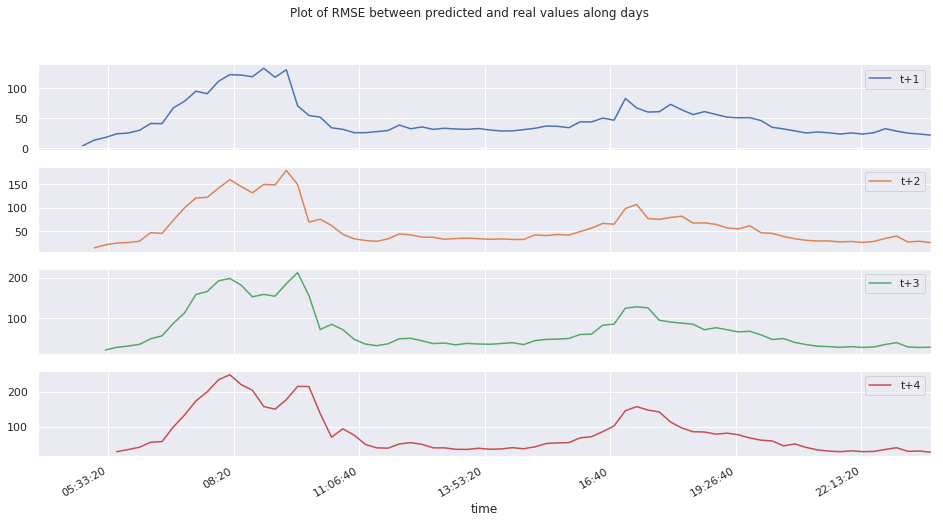

In [95]:
plot_diff_along_time(X_test, artb_preds_s)

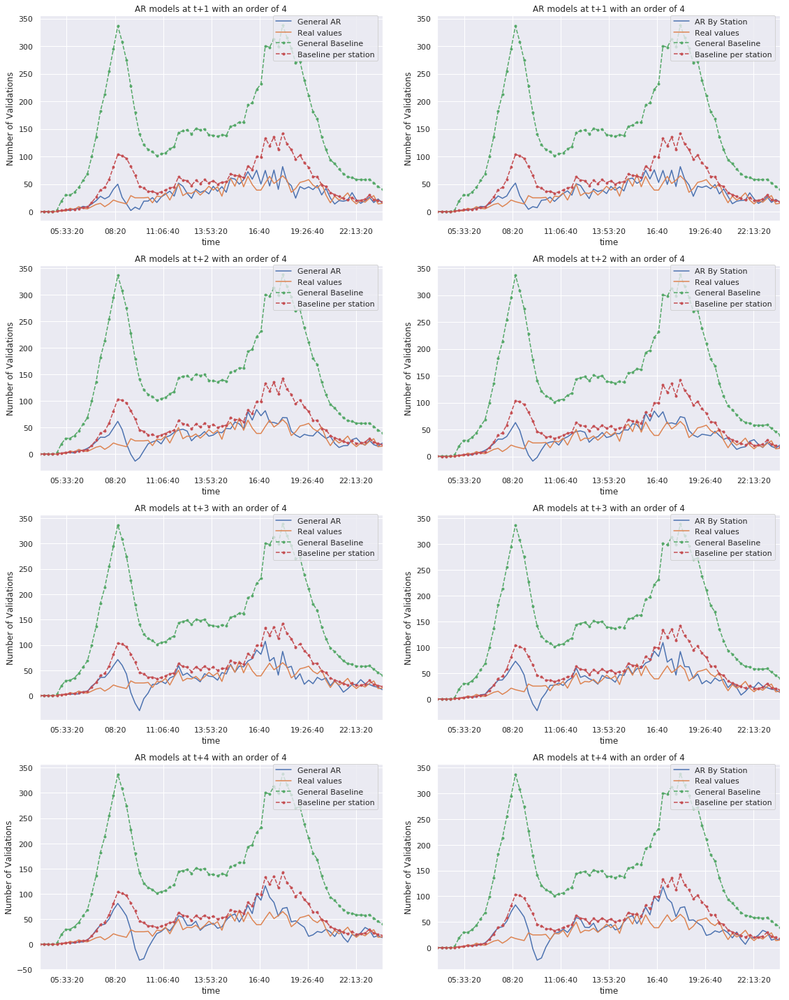

In [96]:
plot_bispecific(X_test, baseline_preds, artb_preds, artb_preds_s, order, limit_t, j, s)

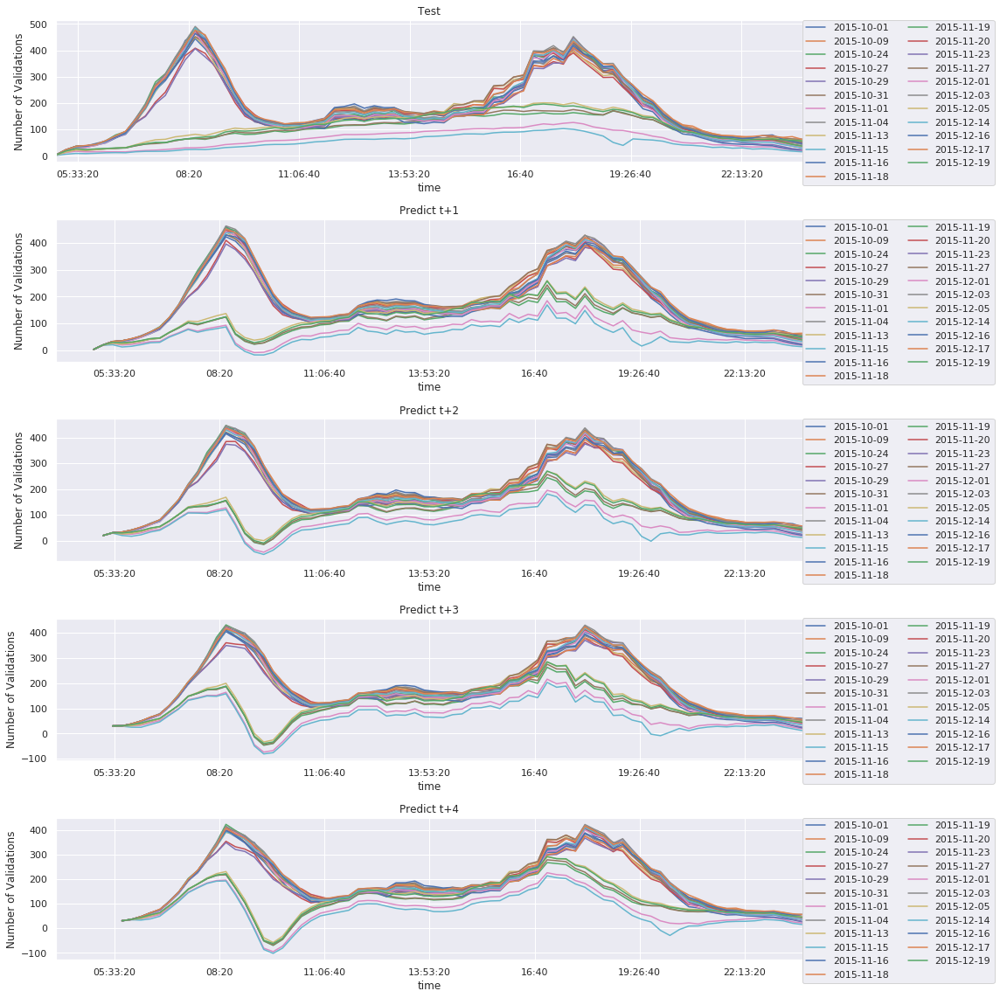

In [97]:
plot_qualitative_analysis(artb_preds, X_test, limit_t, order, subway_stations, del_hours)

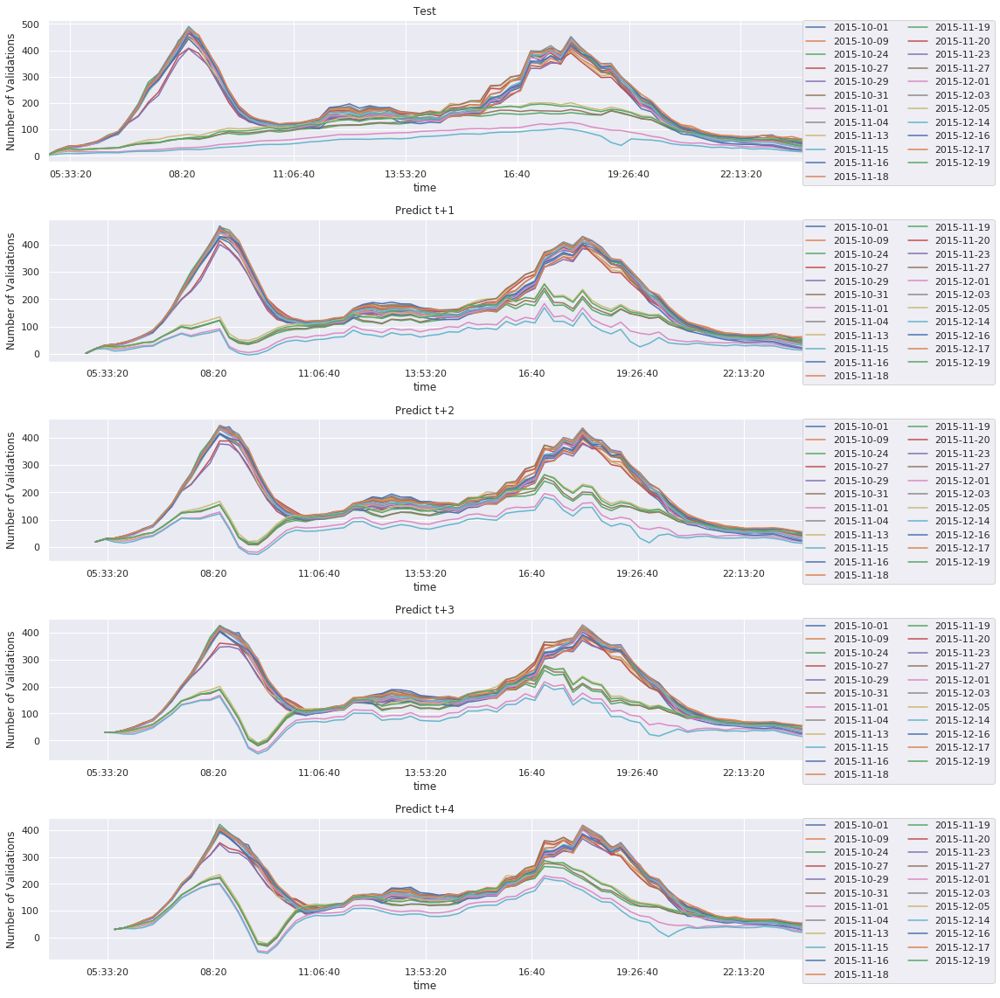

In [98]:
plot_qualitative_analysis(artb_preds_s, X_test, limit_t, order, subway_stations, del_hours)

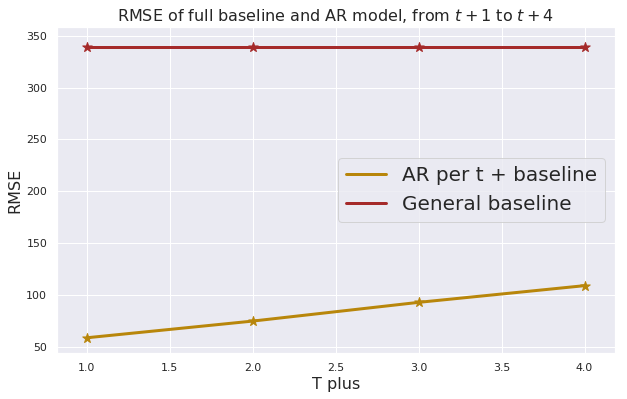

In [99]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 'None'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(artb_scores).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="AR per t + baseline")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="General baseline")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.legend(prop={'size': 20})
plt.title("RMSE of full baseline and AR model, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

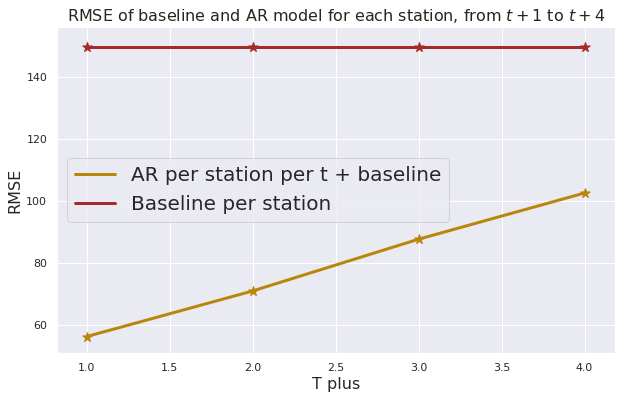

In [100]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 's'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(artb_scores_s).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="AR per station per t + baseline")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="Baseline per station")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

# plt.ylim((0, 1000))
plt.legend(prop={'size': 20})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

#### Compute and Compare 

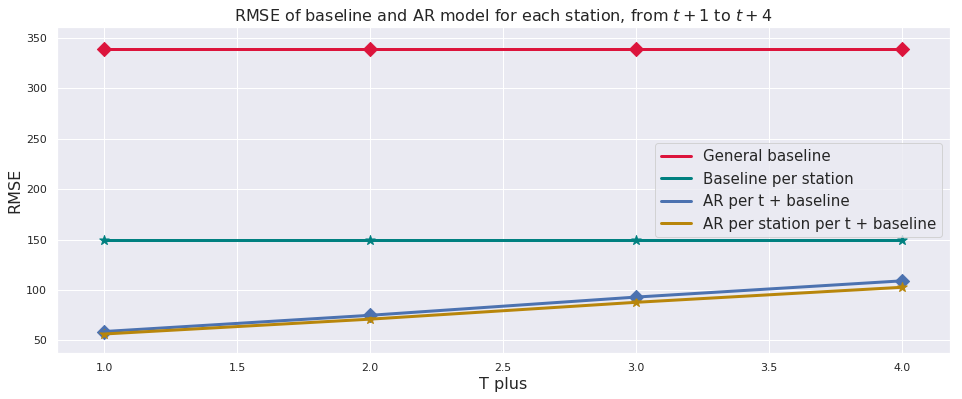

In [101]:
fig, ax = plt.subplots(1, figsize=(16, 6))
ax.set_prop_cycle(color=['crimson', 'teal', 'b', 'darkgoldenrod'])

x = range(1, limit_t+1)
baseline_scores = df_baseline_scores.loc['RMSE'].values.repeat(limit_t).reshape(-1, limit_t).T
model_scores = np.vstack((np.array(artb_scores).T[1], np.array(artb_scores_s).T[1])).T

baselineObjects = plt.plot(x, baseline_scores, linewidth=3)
labels = ["General baseline", "Baseline per station", "AR per t + baseline", "AR per station per t + baseline"]

arlineObjects = plt.plot(x, model_scores, linewidth=3)

for i, m in zip(range(4), ['D', '*']):
    ax = plt.scatter(x, baseline_scores[:, i], marker=m, s=100)

for i, m in zip(range(2), ['D', '*']):
    ax = plt.scatter(x, model_scores[:, i], marker=m, s=100)

# plt.ylim((0, model_scores[:, 0].max()))
plt.legend(baselineObjects+arlineObjects, labels, prop={'size': 15})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

## ARMA

In [102]:
p, q, limit_t = 4, 1, 4

In [103]:
%%time
arma_preds, arma_scores = arma_plot_results(None, p, q, limit_t)

Fitting t+1...


,1,2,3,4
Weights,-0.071429,-0.149182,0.288468,0.851003


,1,2,3,4,5
Weights,-0.125419,-0.086337,0.270404,0.827893,-0.263205


Predicting t+1...
Fitting t+2...


,1,2,3,4
Weights,-0.071429,-0.149182,0.288468,0.851003


,1,2,3,4,5
Weights,-0.070752,-0.149099,0.288282,0.850639,0.000025


Predicting t+2...
Fitting t+3...


,1,2,3,4
Weights,-0.071429,-0.149182,0.288468,0.851003


,1,2,3,4,5
Weights,-0.077828,-0.149087,0.289026,0.85101,-0.00457


Predicting t+3...
Fitting t+4...


,1,2,3,4
Weights,-0.071429,-0.149182,0.288468,0.851003


,1,2,3,4,5
Weights,-0.101669,-0.148165,0.287959,0.850262,-0.03497


Predicting t+4...


,t+1,t+2,t+3,t+4
R2,0.955964,-9.341222e+04,-0.838523,0.491750
RMSE,75.545015,1.100287e+05,488.131136,256.649728
MSE,5707.049345,1.210632e+10,238272.005555,65869.082988
MAE,0.434487,6.059104e+02,2.907566,1.610919
MAPE,43.448654,6.059104e+04,290.756648,161.091885
MPE,-29.545356,9.055587e+03,-116.742551,-128.213804


CPU times: user 42.4 s, sys: 10.8 s, total: 53.2 s
Wall time: 40.9 s


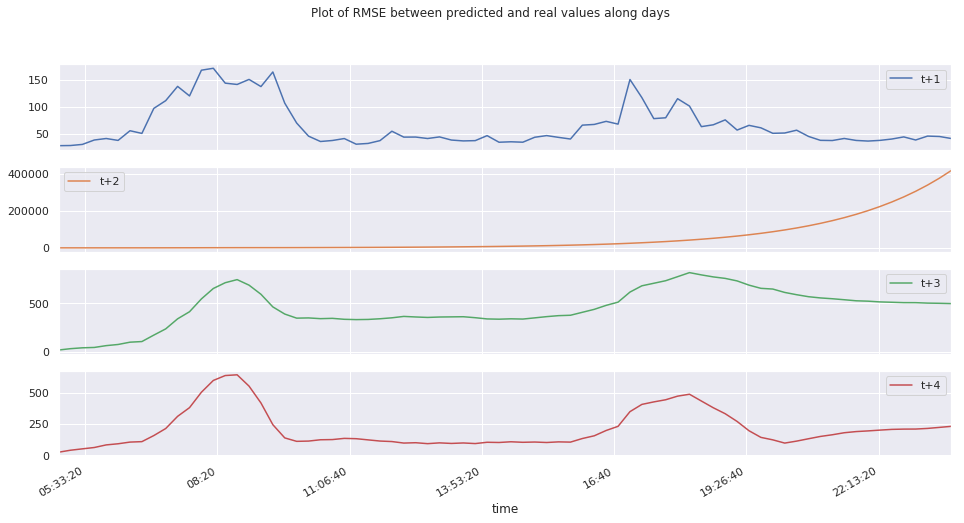

In [104]:
plot_diff_along_time(X_test, arma_preds)

In [105]:
%%time
arma_preds_s, arma_scores_s = arma_plot_results('s', p, q, limit_t)

Fitting t+1...


,1,2,3,4
Weights,-0.266436,0.011483,0.308568,0.808834


,1,2,3,4,5
Weights,-0.314378,0.061734,0.313548,0.772674,-0.165819


,1,2,3,4
Weights,-0.057957,0.055764,0.136914,0.737013


,1,2,3,4,5
Weights,-0.147979,0.091749,0.154836,0.71733,-0.255931


,1,2,3,4
Weights,-0.081876,-0.293176,0.203205,1.064301


,1,2,3,4,5
Weights,-0.097287,-0.257344,0.178257,1.051513,-0.153104


,1,2,3,4
Weights,-0.066,-0.268369,0.544492,0.672295


,1,2,3,4,5
Weights,-0.117412,-0.207304,0.527528,0.650158,-0.171179


,1,2,3,4
Weights,0.032489,-0.043498,0.166097,0.795383


,1,2,3,4,5
Weights,-0.026743,-0.004998,0.167623,0.793104,-0.296558


,1,2,3,4
Weights,-0.089699,-0.204074,0.159601,1.015317


,1,2,3,4,5
Weights,-0.111182,-0.172489,0.139503,0.999054,-0.182117


,1,2,3,4
Weights,-0.090893,-0.143983,0.41245,0.742541


,1,2,3,4,5
Weights,-0.17296,-0.044968,0.404862,0.698404,-0.281414


,1,2,3,4
Weights,-0.184856,-0.044291,0.066096,1.062452


,1,2,3,4,5
Weights,-0.200846,-0.026775,0.070431,1.035057,-0.197249


,1,2,3,4
Weights,-0.136179,-0.078143,0.066819,1.05206


,1,2,3,4,5
Weights,-0.151746,-0.057479,0.062676,1.026651,-0.218732


,1,2,3,4
Weights,-0.058452,-0.210961,-0.070097,1.243916


,1,2,3,4,5
Weights,-0.055774,-0.207476,-0.078948,1.239595,-0.077988


,1,2,3,4
Weights,-0.156027,-0.199337,0.618152,0.590507


,1,2,3,4,5
Weights,-0.196336,-0.152183,0.606108,0.572094,-0.113392


,1,2,3,4
Weights,-0.030705,-0.107995,0.239695,0.801055


,1,2,3,4,5
Weights,-0.07218,-0.074144,0.229239,0.794047,-0.175082


,1,2,3,4
Weights,0.301438,-0.25134,0.422168,0.448294


,1,2,3,4,5
Weights,0.307275,-0.252945,0.420444,0.44796,0.013333


,1,2,3,4
Weights,-0.020398,-0.235839,0.48212,0.70098


,1,2,3,4,5
Weights,-0.0535,-0.195304,0.467045,0.69259,-0.125329


,1,2,3,4
Weights,0.012508,-0.161105,0.24952,0.838789


,1,2,3,4,5
Weights,-0.050981,-0.100685,0.225609,0.830964,-0.351191


,1,2,3,4
Weights,-0.071227,-0.21142,0.195535,0.988444


,1,2,3,4,5
Weights,-0.103104,-0.166644,0.162451,0.97319,-0.285326


,1,2,3,4
Weights,-0.082047,-0.148349,0.224415,0.915326


,1,2,3,4,5
Weights,-0.112305,-0.110619,0.20619,0.90175,-0.195034


,1,2,3,4
Weights,-0.040003,0.08592,0.21898,0.624011


,1,2,3,4,5
Weights,-0.166432,0.155002,0.245881,0.595359,-0.298332


,1,2,3,4
Weights,-0.129165,-0.024052,0.158166,0.917845


,1,2,3,4,5
Weights,-0.169824,0.014714,0.162212,0.890363,-0.249335


,1,2,3,4
Weights,0.03323,-0.403992,0.25028,1.018712


,1,2,3,4,5
Weights,0.024838,-0.373357,0.205483,1.020652,-0.182277


,1,2,3,4
Weights,-0.132644,-0.177219,0.263642,0.939968


,1,2,3,4,5
Weights,-0.157539,-0.138064,0.249037,0.921166,-0.148939


,1,2,3,4
Weights,-0.115846,-0.195202,0.290571,0.906028


,1,2,3,4,5
Weights,-0.158217,-0.13906,0.267385,0.883462,-0.221441


,1,2,3,4
Weights,-0.046749,-0.309844,0.167859,1.070969


,1,2,3,4,5
Weights,-0.054561,-0.288484,0.142992,1.068323,-0.112937


,1,2,3,4
Weights,-0.179176,-0.072154,0.020938,1.141867


,1,2,3,4,5
Weights,-0.181076,-0.06717,0.021367,1.133356,-0.055715


,1,2,3,4
Weights,0.023016,-0.309985,0.477805,0.738472


,1,2,3,4,5
Weights,-0.057245,-0.218197,0.444471,0.719016,-0.349537


,1,2,3,4
Weights,0.004988,-0.182518,0.344295,0.766897


,1,2,3,4,5
Weights,-0.109387,-0.074006,0.333813,0.732292,-0.461553


,1,2,3,4
Weights,-0.241431,0.063537,0.290661,0.815489


,1,2,3,4,5
Weights,-0.293274,0.12521,0.304884,0.771554,-0.207483


,1,2,3,4
Weights,0.059942,-0.241183,0.377644,0.731327


,1,2,3,4,5
Weights,-0.000834,-0.183507,0.351974,0.731217,-0.258751


,1,2,3,4
Weights,-0.062018,-0.021199,0.220647,0.742444


,1,2,3,4,5
Weights,-0.173803,0.04576,0.229741,0.712009,-0.332509


,1,2,3,4
Weights,0.117964,-0.379777,0.32783,0.847141


,1,2,3,4,5
Weights,0.089534,-0.352746,0.293665,0.853157,-0.204114


,1,2,3,4
Weights,-0.078332,-0.393183,0.468547,0.939412


,1,2,3,4,5
Weights,-0.113457,-0.306861,0.425693,0.913452,-0.245956


,1,2,3,4
Weights,-0.028457,-0.345415,0.220371,1.046153


,1,2,3,4,5
Weights,-0.03862,-0.319815,0.197508,1.039539,-0.117055


,1,2,3,4
Weights,-0.109333,-0.12429,0.217727,0.919296


,1,2,3,4,5
Weights,-0.172871,-0.05623,0.207045,0.880333,-0.347053


,1,2,3,4
Weights,-0.067159,-0.218938,0.361783,0.84623


,1,2,3,4,5
Weights,-0.126101,-0.139666,0.335457,0.818085,-0.285494


,1,2,3,4
Weights,0.131975,0.149706,-0.058915,0.67119


,1,2,3,4,5
Weights,-0.031079,0.161558,-0.02537,0.685937,-0.437302


,1,2,3,4
Weights,-0.051018,-0.095442,0.285062,0.800604


,1,2,3,4,5
Weights,-0.134827,-0.005426,0.283525,0.763391,-0.381551


,1,2,3,4
Weights,-0.05552,0.005504,0.160822,0.786161


,1,2,3,4,5
Weights,-0.140463,0.051303,0.171578,0.76363,-0.294984


,1,2,3,4
Weights,-0.104498,-0.131711,0.280585,0.822518


,1,2,3,4,5
Weights,-0.14451,-0.089958,0.265711,0.806343,-0.176324


,1,2,3,4
Weights,0.038735,-0.39543,0.336204,0.957209


,1,2,3,4,5
Weights,0.02424,-0.342147,0.270948,0.96003,-0.317888


,1,2,3,4
Weights,-0.047305,-0.349081,0.330678,0.993379


,1,2,3,4,5
Weights,-0.07616,-0.275751,0.273281,0.979627,-0.324759


,1,2,3,4
Weights,-0.012467,0.014254,0.312604,0.617281


,1,2,3,4,5
Weights,-0.1257,0.099904,0.328052,0.593932,-0.298382


,1,2,3,4
Weights,0.127076,0.111379,-0.003529,0.648052


,1,2,3,4,5
Weights,0.139596,0.11085,-0.005701,0.643906,0.025519


,1,2,3,4
Weights,-0.122514,0.074066,0.221651,0.741875


,1,2,3,4,5
Weights,-0.246192,0.167751,0.258649,0.681379,-0.375968


,1,2,3,4
Weights,-0.165754,0.012534,0.19127,0.842568


,1,2,3,4,5
Weights,-0.229817,0.0612,0.200219,0.806349,-0.242851


,1,2,3,4
Weights,-0.127971,-0.109152,0.272052,0.879732


,1,2,3,4,5
Weights,-0.1642,-0.062429,0.261356,0.857867,-0.188051


,1,2,3,4
Weights,0.06409,-0.561787,0.327431,1.076387


,1,2,3,4,5
Weights,0.059407,-0.538173,0.301443,1.075255,-0.08731


,1,2,3,4
Weights,-0.035228,-0.079116,0.214682,0.798128


,1,2,3,4,5
Weights,-0.084212,-0.045098,0.207329,0.789194,-0.190044


,1,2,3,4
Weights,-0.069149,-0.178008,0.13187,1.048992


,1,2,3,4,5
Weights,-0.077151,-0.151244,0.110295,1.035875,-0.198113


,1,2,3,4
Weights,-0.191521,-0.203944,0.406193,0.891527


,1,2,3,4,5
Weights,-0.227515,-0.141656,0.389263,0.864589,-0.164343


,1,2,3,4
Weights,0.271786,0.067892,0.070144,0.52382


,1,2,3,4,5
Weights,0.109871,0.109293,0.096692,0.556615,-0.378168


,1,2,3,4
Weights,-0.010577,-0.271761,0.165951,1.037883


,1,2,3,4,5
Weights,-0.021251,-0.241129,0.10619,1.043656,-0.337173


,1,2,3,4
Weights,-0.055179,-0.114386,0.382555,0.678941


,1,2,3,4,5
Weights,-0.133406,-0.046384,0.373181,0.658492,-0.230742


,1,2,3,4
Weights,-0.10231,-0.03338,0.194323,0.867152


,1,2,3,4,5
Weights,-0.123093,-0.012229,0.190817,0.857972,-0.11154


,1,2,3,4
Weights,0.064626,-0.330601,0.280569,0.920956


,1,2,3,4,5
Weights,0.033262,-0.285002,0.204976,0.940986,-0.434733


,1,2,3,4
Weights,-0.229986,0.100381,0.4108,0.602944


,1,2,3,4,5
Weights,-0.301321,0.165165,0.419723,0.568429,-0.176685


,1,2,3,4
Weights,0.0596,0.227568,0.015239,0.55453


,1,2,3,4,5
Weights,-0.097518,0.255377,0.057848,0.545546,-0.300172


,1,2,3,4
Weights,-0.146877,-0.115509,0.109142,1.080128


,1,2,3,4,5
Weights,-0.157989,-0.087871,0.096959,1.059081,-0.231328


,1,2,3,4
Weights,0.096891,-0.087191,0.164003,0.723345


,1,2,3,4,5
Weights,0.026464,-0.063006,0.156627,0.734264,-0.212501


,1,2,3,4
Weights,-0.003152,-0.311254,0.076748,1.128476


,1,2,3,4,5
Weights,-0.001857,-0.31784,0.086921,1.128827,0.041437


,1,2,3,4
Weights,-0.090938,-0.084792,0.344617,0.744901


,1,2,3,4,5
Weights,-0.155064,-0.021299,0.33625,0.722874,-0.220665


,1,2,3,4
Weights,-0.095203,-0.090884,0.076185,1.027055


,1,2,3,4,5
Weights,-0.126208,-0.062797,0.06222,1.001316,-0.411554


,1,2,3,4
Weights,0.128325,0.126113,0.033469,0.614905


,1,2,3,4,5
Weights,-0.009175,0.156922,0.067742,0.618567,-0.315544


,1,2,3,4
Weights,0.195656,-0.102571,0.262216,0.578796


,1,2,3,4,5
Weights,0.080591,-0.054046,0.271277,0.595163,-0.300253


,1,2,3,4
Weights,-0.203539,0.021655,0.365251,0.714275


,1,2,3,4,5
Weights,-0.308887,0.126548,0.381181,0.653528,-0.298218


,1,2,3,4
Weights,0.102584,0.046281,-0.105013,0.860353


,1,2,3,4,5
Weights,0.06512,0.033908,-0.103179,0.877703,-0.161946


,1,2,3,4
Weights,-0.058358,-0.216294,0.016644,1.156807


,1,2,3,4,5
Weights,-0.057519,-0.203886,-0.012335,1.150189,-0.213695


,1,2,3,4
Weights,-0.205231,-0.05583,0.325096,0.797552


,1,2,3,4,5
Weights,-0.256458,-0.00238,0.321414,0.766769,-0.17278


,1,2,3,4
Weights,-0.108785,-0.140788,-0.060917,1.229635


,1,2,3,4,5
Weights,-0.09558,-0.138684,-0.080254,1.211456,-0.310044


,1,2,3,4
Weights,0.058983,-0.004615,0.055342,0.80943


,1,2,3,4,5
Weights,-0.036641,0.014642,0.059229,0.818959,-0.402459


,1,2,3,4
Weights,-0.020963,-0.249339,-0.03042,1.182361


,1,2,3,4,5
Weights,-0.020588,-0.244886,-0.042955,1.17982,-0.080852


,1,2,3,4
Weights,-0.141795,0.053305,0.349568,0.625668


,1,2,3,4,5
Weights,-0.22573,0.117005,0.35853,0.598182,-0.207319


,1,2,3,4
Weights,-0.155761,-0.180738,0.44802,0.790366


,1,2,3,4,5
Weights,-0.228384,-0.082662,0.430516,0.747771,-0.260649


,1,2,3,4
Weights,-0.100215,-0.02967,-0.091554,1.132357


,1,2,3,4,5
Weights,-0.094746,-0.044111,-0.095978,1.119702,-0.238646


,1,2,3,4
Weights,-0.163524,-0.046251,0.277509,0.782071


,1,2,3,4,5
Weights,-0.225675,0.002374,0.275551,0.753865,-0.191292


,1,2,3,4
Weights,0.001842,0.008104,0.301909,0.613616


,1,2,3,4,5
Weights,-0.062819,0.053368,0.307947,0.607019,-0.170654


,1,2,3,4
Weights,0.295419,0.06217,0.019852,0.402222


,1,2,3,4,5
Weights,0.109799,0.089302,0.034021,0.422935,-0.290557


,1,2,3,4
Weights,-0.047813,-0.34259,0.622273,0.701721


,1,2,3,4,5
Weights,-0.145029,-0.205978,0.607476,0.639826,-0.364672


,1,2,3,4
Weights,-0.222317,-0.088101,0.351757,0.886413


,1,2,3,4,5
Weights,-0.268926,-0.01617,0.346547,0.848397,-0.212858


,1,2,3,4
Weights,-0.158014,-0.171408,0.241676,0.982247


,1,2,3,4,5
Weights,-0.181672,-0.131956,0.230006,0.960379,-0.149063


,1,2,3,4
Weights,-0.002573,-0.012888,0.281877,0.602152


,1,2,3,4,5
Weights,-0.097836,0.034573,0.286879,0.591845,-0.208641


,1,2,3,4
Weights,-0.152663,-0.097776,0.325114,0.82543


,1,2,3,4,5
Weights,-0.185965,-0.056039,0.317372,0.805501,-0.139188


,1,2,3,4
Weights,0.011202,-0.442331,0.375345,0.949037


,1,2,3,4,5
Weights,-0.006805,-0.402093,0.339375,0.942572,-0.154001


,1,2,3,4
Weights,-0.091238,-0.028298,-0.092388,1.110587


,1,2,3,4,5
Weights,-0.089752,-0.045368,-0.098348,1.098373,-0.273778


,1,2,3,4
Weights,0.075469,-0.073817,-0.002992,0.868977


,1,2,3,4,5
Weights,0.05855,-0.074003,-0.006823,0.872811,-0.071772


,1,2,3,4
Weights,-0.172064,-0.121407,0.141528,1.050579


,1,2,3,4,5
Weights,-0.198172,-0.081018,0.133832,1.019344,-0.236638


,1,2,3,4
Weights,-0.036646,-0.31802,0.219551,1.010079


,1,2,3,4,5
Weights,-0.044091,-0.303122,0.203862,1.008062,-0.069794


,1,2,3,4
Weights,-0.219276,-0.033611,0.265497,0.896653


,1,2,3,4,5
Weights,-0.282212,0.046324,0.274692,0.83959,-0.281136


,1,2,3,4
Weights,-0.110502,-0.075689,0.288339,0.7885


,1,2,3,4,5
Weights,-0.174917,-0.016705,0.283085,0.761134,-0.224891


,1,2,3,4
Weights,-0.104451,-0.295359,0.336248,0.955216


,1,2,3,4,5
Weights,-0.126128,-0.253371,0.313179,0.941562,-0.135025


,1,2,3,4
Weights,-0.052785,-0.136804,0.376964,0.701837


,1,2,3,4,5
Weights,-0.10942,-0.087119,0.364492,0.689226,-0.174551


,1,2,3,4
Weights,-0.001696,-0.373822,0.153974,1.128361


,1,2,3,4,5
Weights,-0.004174,-0.3445,0.111502,1.128077,-0.170524


,1,2,3,4
Weights,0.014631,-0.500478,0.35266,1.026943


,1,2,3,4,5
Weights,0.005135,-0.472878,0.330158,1.02151,-0.085918


,1,2,3,4
Weights,-0.189966,-0.092064,0.304457,0.84914


,1,2,3,4,5
Weights,-0.235749,-0.039215,0.296527,0.820658,-0.178974


,1,2,3,4
Weights,-0.043446,-0.195996,0.316247,0.873625


,1,2,3,4,5
Weights,-0.086592,-0.130794,0.287866,0.858516,-0.28083


,1,2,3,4
Weights,-0.062845,-0.299231,0.386885,0.849699


,1,2,3,4,5
Weights,-0.088308,-0.262071,0.364126,0.84003,-0.125649


,1,2,3,4
Weights,-0.055058,-0.216697,0.295797,0.872118


,1,2,3,4,5
Weights,-0.099656,-0.162304,0.267548,0.856955,-0.245721


,1,2,3,4
Weights,-0.097801,-0.23632,0.153719,1.069246


,1,2,3,4,5
Weights,-0.108419,-0.213086,0.139872,1.0573,-0.112797


,1,2,3,4
Weights,-0.141547,-0.238958,0.223136,1.050946


,1,2,3,4,5
Weights,-0.162658,-0.196494,0.207382,1.029314,-0.151691


,1,2,3,4
Weights,-0.061908,-0.252997,0.438355,0.795302


,1,2,3,4,5
Weights,-0.139551,-0.14967,0.410144,0.759017,-0.332376


,1,2,3,4
Weights,-0.028271,-0.476849,0.546604,0.863498


,1,2,3,4,5
Weights,-0.059616,-0.409885,0.502998,0.847999,-0.211061


,1,2,3,4
Weights,-0.043394,-0.286812,0.470571,0.775652


,1,2,3,4,5
Weights,-0.093858,-0.21451,0.441139,0.75517,-0.229634


,1,2,3,4
Weights,0.012212,-0.185951,0.45749,0.652868


,1,2,3,4,5
Weights,-0.070445,-0.098296,0.446372,0.632822,-0.281302


,1,2,3,4
Weights,-0.207786,0.002581,0.139136,0.955982


,1,2,3,4,5
Weights,-0.239319,0.032508,0.148199,0.923316,-0.184434


,1,2,3,4
Weights,-0.013886,-0.237103,0.233924,0.972033


,1,2,3,4,5
Weights,-0.038634,-0.179311,0.179524,0.969233,-0.401268


,1,2,3,4
Weights,-0.054252,-0.036911,0.12464,0.842501


,1,2,3,4,5
Weights,-0.116715,-0.006105,0.124378,0.827879,-0.268291


,1,2,3,4
Weights,-0.100747,-0.039029,0.065295,0.981054


,1,2,3,4,5
Weights,-0.122393,-0.023862,0.06388,0.962534,-0.203248


,1,2,3,4
Weights,-0.130804,0.010915,0.235235,0.796551


,1,2,3,4,5
Weights,-0.181654,0.057394,0.237716,0.772144,-0.199582


,1,2,3,4
Weights,-0.134508,-0.254316,0.248453,1.041693


,1,2,3,4,5
Weights,-0.149103,-0.222341,0.235273,1.02679,-0.104892


,1,2,3,4
Weights,-0.079229,-0.075583,0.385883,0.653371


,1,2,3,4,5
Weights,-0.178051,0.008304,0.38339,0.621885,-0.265181


,1,2,3,4
Weights,-0.212633,-0.06925,0.303948,0.846784


,1,2,3,4,5
Weights,-0.292188,0.019322,0.305089,0.790627,-0.287321


,1,2,3,4
Weights,-0.136265,0.077425,0.094436,0.852499


,1,2,3,4,5
Weights,-0.210458,0.110854,0.123922,0.811542,-0.297408


,1,2,3,4
Weights,-0.011138,-0.398352,0.541607,0.813543


,1,2,3,4,5
Weights,-0.075109,-0.282397,0.481998,0.789273,-0.416729


,1,2,3,4
Weights,-0.012172,-0.12282,0.425691,0.616503


,1,2,3,4,5
Weights,-0.078282,-0.066303,0.418156,0.604763,-0.184109


,1,2,3,4
Weights,-0.085918,-0.106616,0.184327,0.873463


,1,2,3,4,5
Weights,-0.12129,-0.079132,0.174208,0.85969,-0.160682


,1,2,3,4
Weights,-0.207657,0.009894,0.196478,0.921655


,1,2,3,4,5
Weights,-0.266154,0.070145,0.217478,0.868964,-0.301821


,1,2,3,4
Weights,-0.060509,-0.107975,0.314353,0.786049


,1,2,3,4,5
Weights,-0.109879,-0.055769,0.3027,0.771163,-0.201172


,1,2,3,4
Weights,-0.086233,-0.134683,0.2354,0.890934


,1,2,3,4,5
Weights,-0.123665,-0.092187,0.219505,0.874562,-0.207238


,1,2,3,4
Weights,-0.091176,-0.010744,0.324808,0.624842


,1,2,3,4,5
Weights,-0.162853,0.033326,0.324793,0.608803,-0.164665


,1,2,3,4
Weights,-0.051061,-0.209586,0.196211,0.929821


,1,2,3,4,5
Weights,-0.085435,-0.176906,0.170397,0.920155,-0.202968


,1,2,3,4
Weights,0.101078,-0.324736,0.278538,0.850831


,1,2,3,4,5
Weights,0.028952,-0.294194,0.209422,0.880865,-0.52113


,1,2,3,4
Weights,-0.203347,0.035656,0.169106,0.876103


,1,2,3,4,5
Weights,-0.253195,0.074593,0.185178,0.835617,-0.212261


,1,2,3,4
Weights,-0.015648,-0.222257,0.290939,0.833777


,1,2,3,4,5
Weights,-0.07619,-0.168607,0.262753,0.821824,-0.271257


,1,2,3,4
Weights,-0.048212,-0.347875,0.400112,0.909176


,1,2,3,4,5
Weights,-0.087227,-0.272488,0.350859,0.892466,-0.279417


,1,2,3,4
Weights,0.072167,0.143533,0.039758,0.698468


,1,2,3,4,5
Weights,-0.080286,0.205679,0.102777,0.672026,-0.516843


,1,2,3,4
Weights,-0.10349,-0.134316,0.257647,0.89454


,1,2,3,4,5
Weights,-0.131614,-0.096215,0.245333,0.877985,-0.160724


,1,2,3,4
Weights,-0.074551,-0.026997,0.218869,0.83558


,1,2,3,4,5
Weights,-0.135221,0.033351,0.225056,0.806933,-0.309435


,1,2,3,4
Weights,-0.076218,-0.257992,0.536979,0.727666


,1,2,3,4,5
Weights,-0.127608,-0.181728,0.51366,0.703974,-0.206169


,1,2,3,4
Weights,-0.042729,-0.365772,0.609377,0.734798


,1,2,3,4,5
Weights,-0.125372,-0.235849,0.562429,0.698732,-0.394978


,1,2,3,4
Weights,-0.021626,-0.319685,0.321311,0.918575


,1,2,3,4,5
Weights,-0.063408,-0.258144,0.278794,0.903257,-0.28471


,1,2,3,4
Weights,0.191115,0.198528,0.025504,0.498724


,1,2,3,4,5
Weights,0.017184,0.238556,0.071006,0.514754,-0.351005


,1,2,3,4
Weights,-0.145459,-0.180415,0.279824,0.942811


,1,2,3,4,5
Weights,-0.180152,-0.126727,0.260779,0.918264,-0.203653


,1,2,3,4
Weights,-0.076133,-0.249985,0.261821,0.9887


,1,2,3,4,5
Weights,-0.122927,-0.174358,0.220941,0.962761,-0.436933


,1,2,3,4
Weights,-0.187676,0.017538,0.149809,0.930362


,1,2,3,4,5
Weights,-0.222797,0.048519,0.161385,0.898722,-0.209451


,1,2,3,4
Weights,0.095807,-0.393605,0.400279,0.825562


,1,2,3,4,5
Weights,0.065676,-0.351974,0.359199,0.829321,-0.24255


,1,2,3,4
Weights,-0.122873,-0.034142,0.162077,0.958391


,1,2,3,4,5
Weights,-0.133234,-0.015366,0.15922,0.947019,-0.120252


,1,2,3,4
Weights,-0.092979,-0.393852,0.395649,0.973776


,1,2,3,4,5
Weights,-0.102136,-0.373961,0.385519,0.967267,-0.050552


,1,2,3,4
Weights,-0.028891,-0.171749,0.228353,0.926821


,1,2,3,4,5
Weights,-0.068557,-0.113599,0.195638,0.915622,-0.385242


,1,2,3,4
Weights,0.013903,-0.064137,0.311998,0.647478


,1,2,3,4,5
Weights,-0.038161,-0.027189,0.310477,0.643878,-0.146696


,1,2,3,4
Weights,0.021768,-0.173189,0.209335,0.870627


,1,2,3,4,5
Weights,-0.005189,-0.147575,0.18954,0.871628,-0.171914


,1,2,3,4
Weights,-0.122922,-0.233548,0.178463,1.070175


,1,2,3,4,5
Weights,-0.139737,-0.19832,0.16235,1.051489,-0.151733


,1,2,3,4
Weights,-0.120032,-0.090442,0.283633,0.853317


,1,2,3,4,5
Weights,-0.204793,0.005347,0.281948,0.804934,-0.373551


,1,2,3,4
Weights,-0.107586,-0.186432,0.296706,0.880674


,1,2,3,4,5
Weights,-0.169988,-0.113971,0.276406,0.846833,-0.283445


,1,2,3,4
Weights,-0.129193,-0.188148,0.277705,0.932265


,1,2,3,4,5
Weights,-0.151086,-0.152626,0.263013,0.91653,-0.133723


,1,2,3,4
Weights,-0.015745,-0.141932,0.370667,0.674829


,1,2,3,4,5
Weights,-0.116176,-0.063132,0.360749,0.653065,-0.296571


,1,2,3,4
Weights,-0.086899,-0.050554,0.180946,0.859399


,1,2,3,4,5
Weights,-0.110533,-0.031721,0.175966,0.852346,-0.11522


,1,2,3,4
Weights,-0.05576,-0.258423,0.348897,0.901873


,1,2,3,4,5
Weights,-0.081044,-0.208348,0.320812,0.889206,-0.183091


,1,2,3,4
Weights,-0.190008,0.050025,-0.05722,1.106988


,1,2,3,4,5
Weights,-0.19593,0.043229,-0.03552,1.074226,-0.236991


,1,2,3,4
Weights,-0.015769,-0.35757,0.467485,0.822671


,1,2,3,4,5
Weights,-0.073059,-0.271947,0.422498,0.802502,-0.3149


,1,2,3,4
Weights,-0.193688,-0.107937,0.28687,0.92341


,1,2,3,4,5
Weights,-0.232312,-0.049696,0.279988,0.889022,-0.199829


,1,2,3,4
Weights,-0.025441,-0.260367,0.195124,0.999265


,1,2,3,4,5
Weights,-0.040963,-0.230324,0.161646,0.995096,-0.197092


,1,2,3,4
Weights,0.114546,-0.245031,0.324588,0.695141


,1,2,3,4,5
Weights,-0.012126,-0.188718,0.298184,0.705355,-0.428709


,1,2,3,4
Weights,-0.154547,-0.075757,0.301964,0.847145


,1,2,3,4,5
Weights,-0.220298,0.003622,0.298773,0.805697,-0.283315


,1,2,3,4
Weights,-0.149951,-0.063616,0.350063,0.763668


,1,2,3,4,5
Weights,-0.238087,0.027098,0.347196,0.72075,-0.287002


,1,2,3,4
Weights,-0.037626,-0.073822,0.323651,0.676427


,1,2,3,4,5
Weights,-0.084411,-0.038713,0.318609,0.669153,-0.137083


,1,2,3,4
Weights,0.006043,-0.090937,0.307058,0.712484


,1,2,3,4,5
Weights,-0.070943,-0.026474,0.299617,0.701916,-0.264041


,1,2,3,4
Weights,-0.124697,-0.230779,0.136136,1.10548


,1,2,3,4,5
Weights,-0.126504,-0.226792,0.13444,1.103165,-0.01638


,1,2,3,4
Weights,-0.116247,-0.033856,0.102485,0.924486


,1,2,3,4,5
Weights,-0.140558,-0.018098,0.100898,0.910549,-0.137


,1,2,3,4
Weights,-0.151231,0.097219,0.092719,0.900552


,1,2,3,4,5
Weights,-0.194987,0.126828,0.123427,0.859584,-0.259152


,1,2,3,4
Weights,0.048869,-0.264989,0.293304,0.873282


,1,2,3,4,5
Weights,-0.004029,-0.201098,0.238495,0.88001,-0.479255


,1,2,3,4
Weights,-0.053982,-0.3111,0.330483,0.948127


,1,2,3,4,5
Weights,-0.079354,-0.258246,0.296951,0.933605,-0.199128


,1,2,3,4
Weights,-0.136771,0.042678,0.065715,0.953266


,1,2,3,4,5
Weights,-0.167468,0.063409,0.080286,0.923247,-0.250023


,1,2,3,4
Weights,-0.211472,-0.046616,0.351231,0.808888


,1,2,3,4,5
Weights,-0.260675,0.017585,0.348653,0.773362,-0.187689


,1,2,3,4
Weights,-0.015353,-0.241601,0.486054,0.701637


,1,2,3,4,5
Weights,-0.082663,-0.161897,0.45802,0.686374,-0.258936


,1,2,3,4
Weights,-0.080009,-0.179722,0.230984,0.950936


,1,2,3,4,5
Weights,-0.094015,-0.152117,0.209395,0.944059,-0.142203


,1,2,3,4
Weights,0.004522,-0.143823,0.307668,0.780158


,1,2,3,4,5
Weights,-0.063268,-0.07185,0.290373,0.768241,-0.314552


,1,2,3,4
Weights,-0.139155,0.03037,0.367787,0.639742


,1,2,3,4,5
Weights,-0.248599,0.12901,0.380996,0.592476,-0.282837


,1,2,3,4
Weights,-0.124767,-0.159228,0.257369,0.963783


,1,2,3,4,5
Weights,-0.149958,-0.108167,0.23745,0.941171,-0.221955


,1,2,3,4
Weights,-0.106975,-0.125126,0.274944,0.85285


,1,2,3,4,5
Weights,-0.14057,-0.083901,0.264019,0.83436,-0.162246


,1,2,3,4
Weights,-0.193615,-0.086282,0.224386,0.954862


,1,2,3,4,5
Weights,-0.22873,-0.037755,0.221433,0.921619,-0.208571


,1,2,3,4
Weights,-0.222159,-0.130364,0.265536,0.995875


,1,2,3,4,5
Weights,-0.249735,-0.080886,0.261807,0.963727,-0.152332


,1,2,3,4
Weights,-0.128538,-0.140712,0.121181,1.051849


,1,2,3,4,5
Weights,-0.141913,-0.116249,0.110389,1.033693,-0.168026


,1,2,3,4
Weights,-0.193953,-0.170384,0.265997,1.000809


,1,2,3,4,5
Weights,-0.209226,-0.141059,0.260081,0.983589,-0.088666


,1,2,3,4
Weights,-0.082988,-0.102745,0.138781,0.927338


,1,2,3,4,5
Weights,-0.131422,-0.07005,0.125574,0.909512,-0.279374


,1,2,3,4
Weights,-0.159172,-0.193588,0.13511,1.133008


,1,2,3,4,5
Weights,-0.158114,-0.196425,0.136072,1.134725,0.011734


,1,2,3,4
Weights,-0.037161,-0.089857,0.23082,0.800799


,1,2,3,4,5
Weights,-0.11409,-0.028391,0.219645,0.782059,-0.305252


,1,2,3,4
Weights,-0.162445,-0.142391,0.293599,0.922304


,1,2,3,4,5
Weights,-0.197757,-0.084639,0.282874,0.889882,-0.190768


,1,2,3,4
Weights,-0.038613,-0.278152,0.367103,0.892286


,1,2,3,4,5
Weights,-0.081907,-0.19866,0.329954,0.86949,-0.302808


,1,2,3,4
Weights,-0.222496,-0.202925,0.427239,0.881788


,1,2,3,4,5
Weights,-0.24485,-0.164053,0.417266,0.863929,-0.09158


,1,2,3,4
Weights,-0.050371,0.221077,-0.461802,1.136107


,1,2,3,4,5
Weights,-0.050388,0.215923,-0.459589,1.135695,-0.01434


,1,2,3,4
Weights,-0.178608,-0.182207,0.470792,0.749101


,1,2,3,4,5
Weights,-0.207372,-0.143794,0.457982,0.734115,-0.098724


,1,2,3,4
Weights,0.097835,-0.353155,0.632032,0.547604


,1,2,3,4,5
Weights,-0.007628,-0.268137,0.626011,0.518715,-0.378456


,1,2,3,4
Weights,-0.138268,-0.240695,0.340569,0.918738


,1,2,3,4,5
Weights,-0.15311,-0.21485,0.329479,0.90822,-0.076546


,1,2,3,4
Weights,-0.076173,-0.058897,0.344611,0.729539


,1,2,3,4,5
Weights,-0.171558,0.04143,0.34776,0.68886,-0.326968


,1,2,3,4
Weights,0.156257,0.024172,0.009638,0.544055


,1,2,3,4,5
Weights,0.226668,0.019595,0.006052,0.535698,0.113789


,1,2,3,4
Weights,-0.002531,-0.298217,0.397787,0.790424


,1,2,3,4,5
Weights,-0.077067,-0.22394,0.359823,0.774674,-0.315627


,1,2,3,4
Weights,-0.054573,-0.291379,0.0575,1.234407


,1,2,3,4,5
Weights,-0.036357,-0.265069,-0.006522,1.239611,-0.324563


,1,2,3,4
Weights,-0.099477,-0.14947,0.273223,0.883806


,1,2,3,4,5
Weights,-0.136316,-0.100844,0.25677,0.864234,-0.202556


,1,2,3,4
Weights,-0.059448,-0.328607,0.487233,0.798855


,1,2,3,4,5
Weights,-0.10559,-0.259947,0.456457,0.777647,-0.206739


,1,2,3,4
Weights,-0.031112,-0.010356,0.05973,0.880267


,1,2,3,4,5
Weights,-0.096174,0.00632,0.063341,0.870304,-0.32543


,1,2,3,4
Weights,-0.187348,-0.035612,0.120651,1.011392


,1,2,3,4,5
Weights,-0.207113,-0.010955,0.123466,0.984996,-0.177795


,1,2,3,4
Weights,-0.146248,-0.098497,0.26453,0.934012


,1,2,3,4,5
Weights,-0.175812,-0.044391,0.254687,0.907112,-0.219138


,1,2,3,4
Weights,-0.091744,-0.029347,0.138441,0.862437


,1,2,3,4,5
Weights,-0.141784,0.002947,0.139927,0.841794,-0.240347


,1,2,3,4
Weights,-0.117503,-0.023343,0.171606,0.842441


,1,2,3,4,5
Weights,-0.156485,0.003237,0.170779,0.826316,-0.157335


,1,2,3,4
Weights,-0.091621,-0.139999,0.303285,0.880844


,1,2,3,4,5
Weights,-0.134614,-0.069731,0.28816,0.851686,-0.261011


,1,2,3,4
Weights,-0.005874,-0.31924,0.419444,0.821796


,1,2,3,4,5
Weights,-0.055191,-0.247742,0.376403,0.810513,-0.278222


,1,2,3,4
Weights,-0.138113,-0.111589,0.327315,0.822457


,1,2,3,4,5
Weights,-0.217125,-0.019996,0.319185,0.776122,-0.304932


,1,2,3,4
Weights,-0.154752,-0.152864,0.319527,0.86184


,1,2,3,4,5
Weights,-0.193724,-0.102706,0.307357,0.836463,-0.163631


,1,2,3,4
Weights,0.004941,0.080462,0.0492,0.689914


,1,2,3,4,5
Weights,-0.036298,0.08924,0.055603,0.688994,-0.106969


,1,2,3,4
Weights,-0.131003,-0.197957,0.217202,1.028912


,1,2,3,4,5
Weights,-0.143715,-0.167537,0.202146,1.015263,-0.128899


,1,2,3,4
Weights,-0.122017,-0.188598,0.398203,0.834335


,1,2,3,4,5
Weights,-0.151549,-0.138335,0.381991,0.814882,-0.143636


,1,2,3,4
Weights,-0.002531,-0.36223,0.377238,0.940306


,1,2,3,4,5
Weights,-0.047645,-0.269587,0.309581,0.925778,-0.567561


,1,2,3,4
Weights,-0.113791,-0.107297,-0.003671,1.124771


,1,2,3,4,5
Weights,-0.117121,-0.100352,-0.011858,1.10781,-0.197447


,1,2,3,4
Weights,-0.072069,-0.224712,0.471208,0.751769


,1,2,3,4,5
Weights,-0.15709,-0.118229,0.443398,0.720209,-0.325302


,1,2,3,4
Weights,-0.013059,-0.329219,0.441124,0.83958


,1,2,3,4,5
Weights,-0.095915,-0.216559,0.389671,0.816558,-0.487689


,1,2,3,4
Weights,-0.169508,-0.150336,0.322069,0.879647


,1,2,3,4,5
Weights,-0.198655,-0.108304,0.31177,0.858172,-0.131352


,1,2,3,4
Weights,-0.021542,0.018302,0.194286,0.647057


,1,2,3,4,5
Weights,-0.085999,0.041622,0.197603,0.641975,-0.144341


,1,2,3,4
Weights,0.092132,-0.174263,0.309734,0.703865


,1,2,3,4,5
Weights,-0.039644,-0.087587,0.305854,0.691519,-0.480347


,1,2,3,4
Weights,-0.209289,-0.131911,0.520014,0.689076


,1,2,3,4,5
Weights,-0.272056,-0.050951,0.507659,0.651669,-0.183705


,1,2,3,4
Weights,-0.158388,-0.091238,0.23647,0.919495


,1,2,3,4,5
Weights,-0.205661,-0.030946,0.230291,0.882151,-0.251071


,1,2,3,4
Weights,0.387505,0.060788,0.053139,0.427164


,1,2,3,4,5
Weights,0.232977,0.097481,0.083816,0.463027,-0.35682


,1,2,3,4
Weights,0.032149,-0.450763,0.511744,0.850496


,1,2,3,4,5
Weights,-0.020491,-0.350993,0.422715,0.851348,-0.519244


,1,2,3,4
Weights,-0.051147,-0.238419,0.398823,0.805977


,1,2,3,4,5
Weights,-0.145174,-0.129509,0.370339,0.768926,-0.396483


,1,2,3,4
Weights,-0.075889,-0.233952,0.187146,1.047431


,1,2,3,4,5
Weights,-0.095179,-0.185289,0.148445,1.030942,-0.301977


,1,2,3,4
Weights,0.009608,-0.122319,0.16894,0.852564


,1,2,3,4,5
Weights,-0.026609,-0.098133,0.155023,0.8517,-0.193414


,1,2,3,4
Weights,0.026678,-0.332837,0.413096,0.807076


,1,2,3,4,5
Weights,-0.023706,-0.266881,0.365892,0.803807,-0.297928


,1,2,3,4
Weights,0.041732,0.152555,0.039882,0.624653


,1,2,3,4,5
Weights,-0.066752,0.170619,0.066383,0.62191,-0.225996


,1,2,3,4
Weights,-0.034632,-0.12351,0.329875,0.773422


,1,2,3,4,5
Weights,-0.097612,-0.053223,0.319883,0.752305,-0.27516


,1,2,3,4
Weights,-0.074602,-0.304639,0.429131,0.879523


,1,2,3,4,5
Weights,-0.143398,-0.192915,0.386062,0.844251,-0.384148


,1,2,3,4
Weights,-0.176976,-0.152674,0.152762,1.085941


,1,2,3,4,5
Weights,-0.190422,-0.124463,0.146751,1.0659,-0.132742


,1,2,3,4
Weights,-0.042274,-0.390527,0.459516,0.875205


,1,2,3,4,5
Weights,-0.100281,-0.295653,0.414588,0.844106,-0.326373


,1,2,3,4
Weights,-0.118181,-0.083357,0.202154,0.933593


,1,2,3,4,5
Weights,-0.157172,-0.0331,0.19357,0.906186,-0.271923


,1,2,3,4
Weights,-0.158216,-0.072405,0.16374,0.97191


,1,2,3,4,5
Weights,-0.190823,-0.033367,0.160176,0.942313,-0.223211


,1,2,3,4
Weights,-0.01571,-0.389987,0.523868,0.816417


,1,2,3,4,5
Weights,-0.086667,-0.274106,0.477797,0.780226,-0.399351


,1,2,3,4
Weights,0.015185,0.029358,0.161534,0.641847


,1,2,3,4,5
Weights,0.005596,0.032462,0.162274,0.6422,-0.021933


,1,2,3,4
Weights,0.132459,-0.124793,0.243605,0.681943


,1,2,3,4,5
Weights,0.042086,-0.079771,0.238525,0.693018,-0.290011


,1,2,3,4
Weights,-0.154554,-0.056389,0.132793,0.969492


,1,2,3,4,5
Weights,-0.188913,-0.023305,0.130539,0.941607,-0.232636


,1,2,3,4
Weights,0.017972,-0.336426,0.397007,0.863492


,1,2,3,4,5
Weights,-0.056612,-0.236296,0.343887,0.843642,-0.535676


,1,2,3,4
Weights,-0.187337,0.004375,0.159871,0.93532


,1,2,3,4,5
Weights,-0.243081,0.05992,0.174614,0.886029,-0.302777


,1,2,3,4
Weights,-0.220192,-0.075769,0.324174,0.881773


,1,2,3,4,5
Weights,-0.25478,-0.026742,0.320036,0.853839,-0.159372


,1,2,3,4
Weights,-0.015481,-0.157228,0.314093,0.801286


,1,2,3,4,5
Weights,-0.069014,-0.097592,0.296663,0.788325,-0.248097


,1,2,3,4
Weights,-0.21595,-0.153514,0.34133,0.910298


,1,2,3,4,5
Weights,-0.263028,-0.083538,0.331729,0.870751,-0.202798


,1,2,3,4
Weights,-0.084639,-0.102876,0.340599,0.776809


,1,2,3,4,5
Weights,-0.164611,-0.014867,0.334168,0.741992,-0.302866


,1,2,3,4
Weights,-0.035898,-0.228776,0.169693,0.959587


,1,2,3,4,5
Weights,-0.04766,-0.21609,0.154561,0.958412,-0.083817


,1,2,3,4
Weights,0.036117,-0.16244,0.228856,0.762137


,1,2,3,4,5
Weights,-0.055587,-0.119029,0.206396,0.764372,-0.315261


,1,2,3,4
Weights,-0.251404,-0.141031,0.483445,0.82053


,1,2,3,4,5
Weights,-0.308627,-0.048552,0.472488,0.776232,-0.204657


,1,2,3,4
Weights,-0.00232,-0.254685,0.596063,0.57325


,1,2,3,4,5
Weights,-0.10572,-0.153148,0.575811,0.544968,-0.319097


,1,2,3,4
Weights,-0.113648,0.029328,0.154018,0.854379


,1,2,3,4,5
Weights,-0.154497,0.05957,0.163356,0.832628,-0.19463


,1,2,3,4
Weights,-0.104697,-0.264249,0.22389,1.051658


,1,2,3,4,5
Weights,-0.115881,-0.235639,0.206432,1.041093,-0.109525


,1,2,3,4
Weights,-0.135843,-0.056184,0.143496,0.94539


,1,2,3,4,5
Weights,-0.15957,-0.033554,0.139448,0.928769,-0.158525


,1,2,3,4
Weights,-0.049462,-0.203115,0.216097,0.947785


,1,2,3,4,5
Weights,-0.099601,-0.147435,0.180363,0.931163,-0.379285


,1,2,3,4
Weights,-0.16482,-0.121477,0.37789,0.795986


,1,2,3,4,5
Weights,-0.222092,-0.05209,0.366835,0.762616,-0.202238


,1,2,3,4
Weights,-0.15913,0.017072,0.240456,0.81172


,1,2,3,4,5
Weights,-0.215939,0.07068,0.247732,0.778118,-0.221535


,1,2,3,4
Weights,0.237881,-0.088923,0.128605,0.669382


,1,2,3,4,5
Weights,0.117225,-0.059467,0.129564,0.708116,-0.431823


,1,2,3,4
Weights,-0.047679,-0.173307,0.203719,0.892759


,1,2,3,4,5
Weights,-0.123317,-0.117999,0.180851,0.868303,-0.372739


,1,2,3,4
Weights,-0.089628,-0.194507,0.468673,0.732141


,1,2,3,4,5
Weights,-0.126412,-0.144864,0.453403,0.716626,-0.137271


,1,2,3,4
Weights,-0.02066,-0.036266,0.196803,0.791716


,1,2,3,4,5
Weights,-0.105723,0.025697,0.202993,0.770821,-0.349555


,1,2,3,4
Weights,-0.060633,-0.218573,0.253143,0.958201


,1,2,3,4,5
Weights,-0.081851,-0.171468,0.223008,0.945238,-0.225586


,1,2,3,4
Weights,-0.025188,-0.363725,0.423142,0.913063


,1,2,3,4,5
Weights,-0.059966,-0.284958,0.377371,0.894284,-0.301105


,1,2,3,4
Weights,-0.204163,-0.087513,0.385644,0.804406


,1,2,3,4,5
Weights,-0.242582,-0.03304,0.378509,0.776252,-0.147299


,1,2,3,4
Weights,-0.035518,-0.366589,0.453962,0.834252


,1,2,3,4,5
Weights,-0.070712,-0.312168,0.425632,0.816871,-0.175966


,1,2,3,4
Weights,-0.185539,-0.112414,0.182163,1.010549


,1,2,3,4,5
Weights,-0.205479,-0.080302,0.178433,0.985843,-0.140271


,1,2,3,4
Weights,-0.054298,-0.067261,0.217575,0.821078


,1,2,3,4,5
Weights,-0.119062,-0.011712,0.210444,0.80041,-0.292837


,1,2,3,4
Weights,0.046815,0.06789,0.068224,0.748174


,1,2,3,4,5
Weights,0.025852,0.073507,0.073268,0.749932,-0.066828


,1,2,3,4
Weights,-0.168879,-0.016742,0.277239,0.800864


,1,2,3,4,5
Weights,-0.222054,0.035138,0.279795,0.771098,-0.201879


,1,2,3,4
Weights,-0.212227,-0.115811,0.346722,0.884245


,1,2,3,4,5
Weights,-0.255566,-0.050495,0.339553,0.847862,-0.191904


,1,2,3,4
Weights,-0.027035,-0.010842,0.268069,0.720678


,1,2,3,4,5
Weights,-0.081341,0.0369,0.271607,0.710172,-0.191236


,1,2,3,4
Weights,-0.031947,-0.351717,0.218662,1.064755


,1,2,3,4,5
Weights,-0.041314,-0.324238,0.195073,1.057353,-0.120035


,1,2,3,4
Weights,0.018562,-0.046713,0.140179,0.807791


,1,2,3,4,5
Weights,-0.099582,0.007527,0.147627,0.792497,-0.495577


,1,2,3,4
Weights,0.062735,-0.340813,0.391834,0.843334


,1,2,3,4,5
Weights,-0.001375,-0.256373,0.338265,0.839582,-0.585463


,1,2,3,4
Weights,-0.035454,-0.324281,0.155761,1.091112


,1,2,3,4,5
Weights,-0.036778,-0.320278,0.151662,1.090225,-0.019095


,1,2,3,4
Weights,-0.054156,-0.033088,0.320521,0.645941


,1,2,3,4,5
Weights,-0.116796,0.010015,0.320268,0.634162,-0.161783


,1,2,3,4
Weights,-0.023379,-0.328147,0.466022,0.816329


,1,2,3,4,5
Weights,-0.088418,-0.230907,0.42389,0.791176,-0.348126


,1,2,3,4
Weights,-0.013095,0.024873,0.130464,0.710457


,1,2,3,4,5
Weights,-0.087607,0.04759,0.135924,0.704398,-0.20186


,1,2,3,4
Weights,-0.003997,-0.385505,0.323833,0.976391


,1,2,3,4,5
Weights,-0.033417,-0.320133,0.266999,0.963615,-0.317402


,1,2,3,4
Weights,-0.177663,-0.085231,0.200139,0.956984


,1,2,3,4,5
Weights,-0.209655,-0.042851,0.196142,0.926373,-0.191072


,1,2,3,4
Weights,-0.009262,-0.226651,0.361715,0.764572


,1,2,3,4,5
Weights,-0.090489,-0.155948,0.336597,0.747881,-0.304039


,1,2,3,4
Weights,0.00386,-0.341876,0.496185,0.774407


,1,2,3,4,5
Weights,-0.085008,-0.225366,0.458258,0.741229,-0.434689


,1,2,3,4
Weights,-0.122154,-0.157386,0.119284,1.060157


,1,2,3,4,5
Weights,-0.138138,-0.129414,0.102871,1.041995,-0.202591


,1,2,3,4
Weights,-0.1621,-0.027415,0.204499,0.914267


,1,2,3,4,5
Weights,-0.209526,0.027121,0.208776,0.878076,-0.269683


,1,2,3,4
Weights,-0.079753,-0.146383,0.080671,1.071972


,1,2,3,4,5
Weights,-0.094889,-0.122862,0.048114,1.055683,-0.443651


,1,2,3,4
Weights,-0.032411,-0.409654,0.33941,1.000152


,1,2,3,4,5
Weights,-0.04643,-0.374311,0.313769,0.991407,-0.118252


,1,2,3,4
Weights,-0.051452,-0.23182,0.028214,1.159806


,1,2,3,4,5
Weights,-0.050456,-0.215008,-0.002584,1.150221,-0.229135


,1,2,3,4
Weights,-0.158741,0.045488,0.127365,0.883743


,1,2,3,4,5
Weights,-0.19574,0.073174,0.137116,0.855973,-0.179016


,1,2,3,4
Weights,-0.15838,-0.078704,0.322873,0.80076


,1,2,3,4,5
Weights,-0.230081,-0.000945,0.31869,0.759764,-0.255437


,1,2,3,4
Weights,-0.131464,-0.251914,0.45341,0.810544


,1,2,3,4,5
Weights,-0.194874,-0.163366,0.433126,0.770179,-0.233336


,1,2,3,4
Weights,-0.138557,-0.20457,0.269228,0.980327


,1,2,3,4,5
Weights,-0.161584,-0.160457,0.252192,0.959821,-0.161298


,1,2,3,4
Weights,-0.201713,-0.005393,0.169514,0.944355


,1,2,3,4,5
Weights,-0.2134,0.009756,0.169571,0.929414,-0.099294


,1,2,3,4
Weights,-0.10901,0.047167,0.403097,0.635244


,1,2,3,4,5
Weights,-0.178748,0.128291,0.411965,0.604697,-0.207712


,1,2,3,4
Weights,-0.049651,-0.178947,0.329772,0.859


,1,2,3,4,5
Weights,-0.100746,-0.098671,0.307178,0.836046,-0.30775


,1,2,3,4
Weights,-0.0303,-0.018875,0.239582,0.695498


,1,2,3,4,5
Weights,-0.08815,0.015762,0.241556,0.688415,-0.163816


,1,2,3,4
Weights,0.065979,-0.212533,0.264769,0.772849


,1,2,3,4,5
Weights,-0.004327,-0.169953,0.234937,0.780155,-0.282968


,1,2,3,4
Weights,-0.095837,-0.176866,0.184808,0.985496


,1,2,3,4,5
Weights,-0.11582,-0.146214,0.16432,0.973568,-0.174392


,1,2,3,4
Weights,-0.213541,-0.119809,0.219472,1.024005


,1,2,3,4,5
Weights,-0.229212,-0.090674,0.216321,1.00405,-0.109167


,1,2,3,4
Weights,-0.026651,-0.4741,0.502791,0.94143


,1,2,3,4,5
Weights,-0.062667,-0.366747,0.428647,0.920577,-0.375829


,1,2,3,4
Weights,-0.155313,0.227366,0.28252,0.467089


,1,2,3,4,5
Weights,-0.259532,0.277705,0.299531,0.441158,-0.187204


,1,2,3,4
Weights,-0.063908,-0.190815,0.360202,0.821114


,1,2,3,4,5
Weights,-0.127793,-0.108914,0.336757,0.79556,-0.294928


,1,2,3,4
Weights,-0.192214,-0.194378,0.350393,0.970288


,1,2,3,4,5
Weights,-0.219037,-0.137883,0.337587,0.942368,-0.152494


,1,2,3,4
Weights,-0.122899,-0.049135,0.051886,1.063749


,1,2,3,4,5
Weights,-0.127032,-0.038314,0.047217,1.048956,-0.176304


,1,2,3,4
Weights,0.033341,-0.413993,0.480759,0.848882


,1,2,3,4,5
Weights,-0.026476,-0.311354,0.422279,0.829772,-0.480028


,1,2,3,4
Weights,-0.119094,-0.064539,0.368982,0.686642


,1,2,3,4,5
Weights,-0.256909,0.044069,0.372525,0.637861,-0.359888


,1,2,3,4
Weights,-0.075981,0.031472,0.148982,0.79038


,1,2,3,4,5
Weights,-0.140561,0.064082,0.159705,0.771107,-0.225282


,1,2,3,4
Weights,0.052363,0.008976,0.206107,0.675117


,1,2,3,4,5
Weights,0.001433,0.036893,0.212644,0.676006,-0.147009


,1,2,3,4
Weights,-0.060522,-0.15747,0.259006,0.86635


,1,2,3,4,5
Weights,-0.101092,-0.111631,0.240484,0.851567,-0.217187


,1,2,3,4
Weights,0.044408,-0.175727,0.372252,0.68405


,1,2,3,4,5
Weights,-0.065702,-0.084766,0.354945,0.67302,-0.377083


,1,2,3,4
Weights,-0.154621,0.056644,0.129158,0.879655


,1,2,3,4,5
Weights,-0.239217,0.111873,0.166428,0.824159,-0.380892


,1,2,3,4
Weights,-0.022405,0.013057,0.025915,0.867306


,1,2,3,4,5
Weights,-0.068476,0.019064,0.031673,0.863107,-0.226038


,1,2,3,4
Weights,-0.019849,-0.189727,0.378403,0.754644


,1,2,3,4,5
Weights,-0.075434,-0.122276,0.360991,0.735457,-0.232029


,1,2,3,4
Weights,-0.06243,-0.360412,0.339288,0.978088


,1,2,3,4,5
Weights,-0.091361,-0.299946,0.298252,0.962349,-0.224005


,1,2,3,4
Weights,-0.128799,-0.247817,0.252498,1.02713


,1,2,3,4,5
Weights,-0.137213,-0.228531,0.242609,1.019361,-0.065475


,1,2,3,4
Weights,-0.002856,-0.086975,0.339254,0.686094


,1,2,3,4,5
Weights,-0.051045,-0.04568,0.334072,0.6799,-0.152826


,1,2,3,4
Weights,-0.149793,-0.328824,0.410629,0.980809


,1,2,3,4,5
Weights,-0.174513,-0.275365,0.391686,0.960357,-0.130005


Predicting t+1...
Fitting t+2...


,1,2,3,4
Weights,-0.266436,0.011483,0.308568,0.808834


,1,2,3,4,5
Weights,-0.26534,0.011352,0.308223,0.807668,0.000109


,1,2,3,4
Weights,-0.057957,0.055764,0.136914,0.737013


,1,2,3,4,5
Weights,-0.110188,0.058913,0.138087,0.735647,-0.061432


,1,2,3,4
Weights,-0.081876,-0.293176,0.203205,1.064301


,1,2,3,4,5
Weights,-0.082415,-0.292967,0.203719,1.063173,7.690709e-08


,1,2,3,4
Weights,-0.066,-0.268369,0.544492,0.672295


,1,2,3,4,5
Weights,-0.067468,-0.268394,0.543715,0.669847,-0.000018


,1,2,3,4
Weights,0.032489,-0.043498,0.166097,0.795383


,1,2,3,4,5
Weights,0.069302,-0.044854,0.165003,0.791481,0.042586


,1,2,3,4
Weights,-0.089699,-0.204074,0.159601,1.015317


,1,2,3,4,5
Weights,-0.089831,-0.204067,0.159635,1.015302,-9.230609e-07


,1,2,3,4
Weights,-0.090893,-0.143983,0.41245,0.742541


,1,2,3,4,5
Weights,-0.09213,-0.144052,0.412616,0.742103,-0.000052


,1,2,3,4
Weights,-0.184856,-0.044291,0.066096,1.062452


,1,2,3,4,5
Weights,-0.184772,-0.043735,0.066264,1.059434,0.00003


,1,2,3,4
Weights,-0.136179,-0.078143,0.066819,1.05206


,1,2,3,4,5
Weights,-0.136834,-0.077992,0.066999,1.051848,-0.000018


,1,2,3,4
Weights,-0.058452,-0.210961,-0.070097,1.243916


,1,2,3,4,5
Weights,-0.058666,-0.210869,-0.069983,1.243734,-3.184840e-07


,1,2,3,4
Weights,-0.156027,-0.199337,0.618152,0.590507


,1,2,3,4,5
Weights,-0.156506,-0.199439,0.618168,0.590321,-0.000009


,1,2,3,4
Weights,-0.030705,-0.107995,0.239695,0.801055


,1,2,3,4,5
Weights,-0.021944,-0.107359,0.238295,0.797662,0.003646


,1,2,3,4
Weights,0.301438,-0.25134,0.422168,0.448294


,1,2,3,4,5
Weights,0.267692,-0.251,0.42669,0.442999,-0.046376


,1,2,3,4
Weights,-0.020398,-0.235839,0.48212,0.70098


,1,2,3,4,5
Weights,-0.018541,-0.235363,0.4813,0.699995,0.000033


,1,2,3,4
Weights,0.012508,-0.161105,0.24952,0.838789


,1,2,3,4,5
Weights,0.017205,-0.160397,0.248835,0.837505,0.000683


,1,2,3,4
Weights,-0.071227,-0.21142,0.195535,0.988444


,1,2,3,4,5
Weights,-0.07099,-0.211446,0.19548,0.988389,7.811667e-07


,1,2,3,4
Weights,-0.082047,-0.148349,0.224415,0.915326


,1,2,3,4,5
Weights,-0.083884,-0.148036,0.224739,0.914081,-0.000053


,1,2,3,4
Weights,-0.040003,0.08592,0.21898,0.624011


,1,2,3,4,5
Weights,-0.069547,0.089134,0.21934,0.622966,-0.038264


,1,2,3,4
Weights,-0.129165,-0.024052,0.158166,0.917845


,1,2,3,4,5
Weights,-0.117524,-0.020962,0.155876,0.889409,0.00152


,1,2,3,4
Weights,0.03323,-0.403992,0.25028,1.018712


,1,2,3,4,5
Weights,0.029346,-0.39956,0.252061,1.011963,-2.526872e-07


,1,2,3,4
Weights,-0.132644,-0.177219,0.263642,0.939968


,1,2,3,4,5
Weights,-0.132902,-0.177373,0.263694,0.939881,-0.000001


,1,2,3,4
Weights,-0.115846,-0.195202,0.290571,0.906028


,1,2,3,4,5
Weights,-0.115914,-0.195219,0.2906,0.90603,-4.016868e-07


,1,2,3,4
Weights,-0.046749,-0.309844,0.167859,1.070969


,1,2,3,4,5
Weights,-0.049412,-0.307864,0.168958,1.068012,-4.353647e-07


,1,2,3,4
Weights,-0.179176,-0.072154,0.020938,1.141867


,1,2,3,4,5
Weights,-0.180326,-0.071751,0.021351,1.141483,-0.000002


,1,2,3,4
Weights,0.023016,-0.309985,0.477805,0.738472


,1,2,3,4,5
Weights,0.021457,-0.309776,0.478025,0.736755,-0.000016


,1,2,3,4
Weights,0.004988,-0.182518,0.344295,0.766897


,1,2,3,4,5
Weights,0.017599,-0.178786,0.338417,0.751812,0.000724


,1,2,3,4
Weights,-0.241431,0.063537,0.290661,0.815489


,1,2,3,4,5
Weights,-0.235443,0.064513,0.288769,0.809898,0.000605


,1,2,3,4
Weights,0.059942,-0.241183,0.377644,0.731327


,1,2,3,4,5
Weights,0.059196,-0.241307,0.377733,0.731143,-0.000123


,1,2,3,4
Weights,-0.062018,-0.021199,0.220647,0.742444


,1,2,3,4,5
Weights,-0.050621,-0.021429,0.220046,0.741826,0.010229


,1,2,3,4
Weights,0.117964,-0.379777,0.32783,0.847141


,1,2,3,4,5
Weights,0.120483,-0.379127,0.326645,0.844653,0.000023


,1,2,3,4
Weights,-0.078332,-0.393183,0.468547,0.939412


,1,2,3,4,5
Weights,-0.080221,-0.390255,0.468923,0.934495,-6.529226e-09


,1,2,3,4
Weights,-0.028457,-0.345415,0.220371,1.046153


,1,2,3,4,5
Weights,-0.033616,-0.342134,0.222842,1.038343,-2.778591e-07


,1,2,3,4
Weights,-0.109333,-0.12429,0.217727,0.919296


,1,2,3,4,5
Weights,-0.107697,-0.123932,0.217259,0.917123,0.000045


,1,2,3,4
Weights,-0.067159,-0.218938,0.361783,0.84623


,1,2,3,4,5
Weights,-0.065821,-0.218684,0.360626,0.842487,-0.000015


,1,2,3,4
Weights,0.131975,0.149706,-0.058915,0.67119


,1,2,3,4,5
Weights,0.021231,0.164417,-0.050529,0.638959,-0.212113


,1,2,3,4
Weights,-0.051018,-0.095442,0.285062,0.800604


,1,2,3,4,5
Weights,-0.052689,-0.094873,0.284769,0.799479,-0.000813


,1,2,3,4
Weights,-0.05552,0.005504,0.160822,0.786161


,1,2,3,4,5
Weights,-0.072815,0.006071,0.161322,0.786304,-0.017145


,1,2,3,4
Weights,-0.104498,-0.131711,0.280585,0.822518


,1,2,3,4,5
Weights,-0.105049,-0.130979,0.280753,0.821319,-0.000256


,1,2,3,4
Weights,0.038735,-0.39543,0.336204,0.957209


,1,2,3,4,5
Weights,0.038002,-0.391954,0.336161,0.95147,-2.246338e-07


,1,2,3,4
Weights,-0.047305,-0.349081,0.330678,0.993379


,1,2,3,4,5
Weights,-0.04916,-0.346931,0.331651,0.987434,-6.072430e-08


,1,2,3,4
Weights,-0.012467,0.014254,0.312604,0.617281


,1,2,3,4,5
Weights,-0.000296,0.01329,0.312367,0.617012,0.014432


,1,2,3,4
Weights,0.127076,0.111379,-0.003529,0.648052


,1,2,3,4,5
Weights,0.046524,0.121043,0.007563,0.655127,-0.10956


,1,2,3,4
Weights,-0.122514,0.074066,0.221651,0.741875


,1,2,3,4,5
Weights,-0.121034,0.073998,0.221603,0.741833,0.001448


,1,2,3,4
Weights,-0.165754,0.012534,0.19127,0.842568


,1,2,3,4,5
Weights,-0.159894,0.012618,0.190455,0.840024,0.003185


,1,2,3,4
Weights,-0.127971,-0.109152,0.272052,0.879732


,1,2,3,4,5
Weights,-0.127996,-0.109154,0.272059,0.879735,-4.262600e-07


,1,2,3,4
Weights,0.06409,-0.561787,0.327431,1.076387


,1,2,3,4,5
Weights,0.056843,-0.555229,0.332155,1.064738,-1.457699e-09


,1,2,3,4
Weights,-0.035228,-0.079116,0.214682,0.798128


,1,2,3,4,5
Weights,-0.033865,-0.07907,0.214599,0.798079,0.000802


,1,2,3,4
Weights,-0.069149,-0.178008,0.13187,1.048992


,1,2,3,4,5
Weights,-0.070118,-0.176957,0.132198,1.045964,-0.000006


,1,2,3,4
Weights,-0.191521,-0.203944,0.406193,0.891527


,1,2,3,4,5
Weights,-0.192281,-0.203682,0.406563,0.890031,-1.569274e-07


,1,2,3,4
Weights,0.271786,0.067892,0.070144,0.52382


,1,2,3,4,5
Weights,0.181402,0.092672,0.079295,0.507013,-0.194241


,1,2,3,4
Weights,-0.010577,-0.271761,0.165951,1.037883


,1,2,3,4,5
Weights,-0.01183,-0.271363,0.166391,1.036993,-0.000002


,1,2,3,4
Weights,-0.055179,-0.114386,0.382555,0.678941


,1,2,3,4,5
Weights,-0.056212,-0.1145,0.38265,0.678915,-0.000434


,1,2,3,4
Weights,-0.10231,-0.03338,0.194323,0.867152


,1,2,3,4,5
Weights,-0.087246,-0.030859,0.190324,0.841358,0.003075


,1,2,3,4
Weights,0.064626,-0.330601,0.280569,0.920956


,1,2,3,4,5
Weights,0.064802,-0.327939,0.280732,0.918072,-0.000007


,1,2,3,4
Weights,-0.229986,0.100381,0.4108,0.602944


,1,2,3,4,5
Weights,-0.212997,0.101504,0.408312,0.598062,0.012228


,1,2,3,4
Weights,0.0596,0.227568,0.015239,0.55453


,1,2,3,4,5
Weights,-0.049268,0.244395,0.020095,0.537832,-0.165577


,1,2,3,4
Weights,-0.146877,-0.115509,0.109142,1.080128


,1,2,3,4,5
Weights,-0.146848,-0.115511,0.109129,1.080124,6.064087e-08


,1,2,3,4
Weights,0.096891,-0.087191,0.164003,0.723345


,1,2,3,4,5
Weights,0.081212,-0.087007,0.164157,0.723459,-0.017625


,1,2,3,4
Weights,-0.003152,-0.311254,0.076748,1.128476


,1,2,3,4,5
Weights,-0.003144,-0.31127,0.076757,1.128462,9.749832e-08


,1,2,3,4
Weights,-0.090938,-0.084792,0.344617,0.744901


,1,2,3,4,5
Weights,-0.092394,-0.084937,0.344778,0.744746,-0.000437


,1,2,3,4
Weights,-0.095203,-0.090884,0.076185,1.027055


,1,2,3,4,5
Weights,-0.092009,-0.090698,0.075813,1.02181,0.000156


,1,2,3,4
Weights,0.128325,0.126113,0.033469,0.614905


,1,2,3,4,5
Weights,0.012939,0.149107,0.041691,0.585555,-0.206162


,1,2,3,4
Weights,0.195656,-0.102571,0.262216,0.578796


,1,2,3,4,5
Weights,0.114032,-0.09161,0.261043,0.566848,-0.132601


,1,2,3,4
Weights,-0.203539,0.021655,0.365251,0.714275


,1,2,3,4,5
Weights,-0.195584,0.023636,0.362023,0.703748,0.001671


,1,2,3,4
Weights,0.102584,0.046281,-0.105013,0.860353


,1,2,3,4,5
Weights,0.067016,0.046927,-0.102573,0.86075,-0.052381


,1,2,3,4
Weights,-0.058358,-0.216294,0.016644,1.156807


,1,2,3,4,5
Weights,-0.06028,-0.215228,0.017517,1.155257,-0.000002


,1,2,3,4
Weights,-0.205231,-0.05583,0.325096,0.797552


,1,2,3,4,5
Weights,-0.204504,-0.055661,0.324782,0.795804,0.000126


,1,2,3,4
Weights,-0.108785,-0.140788,-0.060917,1.229635


,1,2,3,4,5
Weights,-0.111427,-0.139224,-0.059237,1.226515,-0.000002


,1,2,3,4
Weights,0.058983,-0.004615,0.055342,0.80943


,1,2,3,4,5
Weights,-0.003657,-0.002682,0.055595,0.804502,-0.088635


,1,2,3,4
Weights,-0.020963,-0.249339,-0.03042,1.182361


,1,2,3,4,5
Weights,-0.021803,-0.248926,-0.029995,1.181625,-0.000003


,1,2,3,4
Weights,-0.141795,0.053305,0.349568,0.625668


,1,2,3,4,5
Weights,-0.131427,0.053401,0.348943,0.624936,0.009045


,1,2,3,4
Weights,-0.155761,-0.180738,0.44802,0.790366


,1,2,3,4,5
Weights,-0.155708,-0.180731,0.447993,0.790354,1.117461e-07


,1,2,3,4
Weights,-0.100215,-0.02967,-0.091554,1.132357


,1,2,3,4,5
Weights,-0.103701,-0.028998,-0.091018,1.131908,-0.000856


,1,2,3,4
Weights,-0.163524,-0.046251,0.277509,0.782071


,1,2,3,4,5
Weights,-0.162184,-0.046163,0.277086,0.78011,0.001289


,1,2,3,4
Weights,0.001842,0.008104,0.301909,0.613616


,1,2,3,4,5
Weights,0.042819,0.004172,0.300222,0.610947,0.050621


,1,2,3,4
Weights,0.295419,0.06217,0.019852,0.402222


,1,2,3,4,5
Weights,0.109209,0.084531,0.02598,0.392096,-0.259908


,1,2,3,4
Weights,-0.047813,-0.34259,0.622273,0.701721


,1,2,3,4,5
Weights,-0.048784,-0.341172,0.621615,0.697785,-8.537688e-07


,1,2,3,4
Weights,-0.222317,-0.088101,0.351757,0.886413


,1,2,3,4,5
Weights,-0.224779,-0.085236,0.352093,0.874438,0.000001


,1,2,3,4
Weights,-0.158014,-0.171408,0.241676,0.982247


,1,2,3,4,5
Weights,-0.158195,-0.170956,0.241724,0.981297,6.978353e-07


,1,2,3,4
Weights,-0.002573,-0.012888,0.281877,0.602152


,1,2,3,4,5
Weights,-0.040877,-0.011809,0.28231,0.602152,-0.040612


,1,2,3,4
Weights,-0.152663,-0.097776,0.325114,0.82543


,1,2,3,4,5
Weights,-0.152042,-0.097756,0.324975,0.825148,0.000019


,1,2,3,4
Weights,0.011202,-0.442331,0.375345,0.949037


,1,2,3,4,5
Weights,0.008117,-0.440497,0.37638,0.94443,-7.634539e-08


,1,2,3,4
Weights,-0.091238,-0.028298,-0.092388,1.110587


,1,2,3,4,5
Weights,-0.092131,-0.028181,-0.092308,1.110602,-0.000468


,1,2,3,4
Weights,0.075469,-0.073817,-0.002992,0.868977


,1,2,3,4,5
Weights,-0.114117,-0.072109,-0.000968,0.851845,-0.2101


,1,2,3,4
Weights,-0.172064,-0.121407,0.141528,1.050579


,1,2,3,4,5
Weights,-0.172163,-0.120693,0.141675,1.048815,0.000002


,1,2,3,4
Weights,-0.036646,-0.31802,0.219551,1.010079


,1,2,3,4,5
Weights,-0.038602,-0.317236,0.220449,1.007881,-9.234517e-07


,1,2,3,4
Weights,-0.219276,-0.033611,0.265497,0.896653


,1,2,3,4,5
Weights,-0.218611,-0.032212,0.264727,0.89059,0.000023


,1,2,3,4
Weights,-0.110502,-0.075689,0.288339,0.7885


,1,2,3,4,5
Weights,-0.111259,-0.075782,0.288436,0.788509,-0.000158


,1,2,3,4
Weights,-0.104451,-0.295359,0.336248,0.955216


,1,2,3,4,5
Weights,-0.10675,-0.294284,0.337489,0.952566,-1.658960e-07


,1,2,3,4
Weights,-0.052785,-0.136804,0.376964,0.701837


,1,2,3,4,5
Weights,-0.053403,-0.136924,0.377036,0.70182,-0.000151


,1,2,3,4
Weights,-0.001696,-0.373822,0.153974,1.128361


,1,2,3,4,5
Weights,-0.003705,-0.37269,0.155346,1.125829,-3.988932e-08


,1,2,3,4
Weights,0.014631,-0.500478,0.35266,1.026943


,1,2,3,4,5
Weights,0.007453,-0.495112,0.35595,1.016963,-6.259682e-09


,1,2,3,4
Weights,-0.189966,-0.092064,0.304457,0.84914


,1,2,3,4,5
Weights,-0.189702,-0.091552,0.304048,0.847743,0.000025


,1,2,3,4
Weights,-0.043446,-0.195996,0.316247,0.873625


,1,2,3,4,5
Weights,-0.036423,-0.190852,0.313396,0.861203,-0.000042


,1,2,3,4
Weights,-0.062845,-0.299231,0.386885,0.849699


,1,2,3,4,5
Weights,-0.064887,-0.298501,0.387179,0.847258,-0.000002


,1,2,3,4
Weights,-0.055058,-0.216697,0.295797,0.872118


,1,2,3,4,5
Weights,-0.056866,-0.215978,0.296252,0.869366,-0.000025


,1,2,3,4
Weights,-0.097801,-0.23632,0.153719,1.069246


,1,2,3,4,5
Weights,-0.101874,-0.233007,0.155958,1.06206,-0.000001


,1,2,3,4
Weights,-0.141547,-0.238958,0.223136,1.050946


,1,2,3,4,5
Weights,-0.14148,-0.238982,0.223127,1.050904,1.202031e-08


,1,2,3,4
Weights,-0.061908,-0.252997,0.438355,0.795302


,1,2,3,4,5
Weights,-0.062808,-0.252808,0.438601,0.794785,-0.000002


,1,2,3,4
Weights,-0.028271,-0.476849,0.546604,0.863498


,1,2,3,4,5
Weights,-0.031624,-0.473932,0.547785,0.857566,-1.264562e-08


,1,2,3,4
Weights,-0.043394,-0.286812,0.470571,0.775652


,1,2,3,4,5
Weights,-0.045998,-0.284754,0.47075,0.770353,-0.000006


,1,2,3,4
Weights,0.012212,-0.185951,0.45749,0.652868


,1,2,3,4,5
Weights,0.013176,-0.184867,0.456312,0.650025,-0.000956


,1,2,3,4
Weights,-0.207786,0.002581,0.139136,0.955982


,1,2,3,4,5
Weights,-0.208302,0.002597,0.139212,0.956049,-0.000041


,1,2,3,4
Weights,-0.013886,-0.237103,0.233924,0.972033


,1,2,3,4,5
Weights,-0.008814,-0.229273,0.237019,0.957359,-0.000009


,1,2,3,4
Weights,-0.054252,-0.036911,0.12464,0.842501


,1,2,3,4,5
Weights,-0.056324,-0.036794,0.124769,0.842584,-0.00205


,1,2,3,4
Weights,-0.100747,-0.039029,0.065295,0.981054


,1,2,3,4,5
Weights,-0.102692,-0.038873,0.065482,0.980912,-0.000582


,1,2,3,4
Weights,-0.130804,0.010915,0.235235,0.796551


,1,2,3,4,5
Weights,-0.113704,0.011503,0.232999,0.790491,0.010743


,1,2,3,4
Weights,-0.134508,-0.254316,0.248453,1.041693


,1,2,3,4,5
Weights,-0.136242,-0.253211,0.249574,1.039251,5.040471e-08


,1,2,3,4
Weights,-0.079229,-0.075583,0.385883,0.653371


,1,2,3,4,5
Weights,-0.084683,-0.076103,0.386231,0.652906,-0.00281


,1,2,3,4
Weights,-0.212633,-0.06925,0.303948,0.846784


,1,2,3,4,5
Weights,-0.212844,-0.069339,0.304091,0.846713,-0.000012


,1,2,3,4
Weights,-0.136265,0.077425,0.094436,0.852499


,1,2,3,4,5
Weights,-0.175963,0.079593,0.095945,0.851698,-0.039126


,1,2,3,4
Weights,-0.011138,-0.398352,0.541607,0.813543


,1,2,3,4,5
Weights,-0.010792,-0.397092,0.540886,0.810105,-1.341864e-07


,1,2,3,4
Weights,-0.012172,-0.12282,0.425691,0.616503


,1,2,3,4,5
Weights,-0.007936,-0.122199,0.425227,0.616102,0.002245


,1,2,3,4
Weights,-0.085918,-0.106616,0.184327,0.873463


,1,2,3,4,5
Weights,-0.0855,-0.106634,0.184268,0.873436,0.000123


,1,2,3,4
Weights,-0.207657,0.009894,0.196478,0.921655


,1,2,3,4,5
Weights,-0.20271,0.010749,0.195343,0.915465,0.000138


,1,2,3,4
Weights,-0.060509,-0.107975,0.314353,0.786049


,1,2,3,4,5
Weights,-0.062415,-0.107913,0.314286,0.784642,-0.000872


,1,2,3,4
Weights,-0.086233,-0.134683,0.2354,0.890934


,1,2,3,4,5
Weights,-0.084183,-0.133967,0.234591,0.886092,0.000117


,1,2,3,4
Weights,-0.091176,-0.010744,0.324808,0.624842


,1,2,3,4,5
Weights,-0.119285,-0.01083,0.325676,0.624737,-0.024794


,1,2,3,4
Weights,-0.051061,-0.209586,0.196211,0.929821


,1,2,3,4,5
Weights,-0.050695,-0.209586,0.196113,0.929716,0.000019


,1,2,3,4
Weights,0.101078,-0.324736,0.278538,0.850831


,1,2,3,4,5
Weights,0.102816,-0.324478,0.278045,0.850316,0.000071


,1,2,3,4
Weights,-0.203347,0.035656,0.169106,0.876103


,1,2,3,4,5
Weights,-0.202843,0.035631,0.169062,0.876038,0.000209


,1,2,3,4
Weights,-0.015648,-0.222257,0.290939,0.833777


,1,2,3,4,5
Weights,-0.014897,-0.222144,0.290758,0.833536,0.000051


,1,2,3,4
Weights,-0.048212,-0.347875,0.400112,0.909176


,1,2,3,4,5
Weights,-0.050674,-0.344988,0.40069,0.903548,-1.945995e-07


,1,2,3,4
Weights,0.072167,0.143533,0.039758,0.698468


,1,2,3,4,5
Weights,0.014558,0.177519,0.049156,0.62239,-0.223847


,1,2,3,4
Weights,-0.10349,-0.134316,0.257647,0.89454


,1,2,3,4,5
Weights,-0.103014,-0.134339,0.257515,0.894472,0.000007


,1,2,3,4
Weights,-0.074551,-0.026997,0.218869,0.83558


,1,2,3,4,5
Weights,-0.073601,-0.027299,0.218771,0.835373,0.001619


,1,2,3,4
Weights,-0.076218,-0.257992,0.536979,0.727666


,1,2,3,4,5
Weights,-0.076063,-0.256772,0.535472,0.722448,-0.000006


,1,2,3,4
Weights,-0.042729,-0.365772,0.609377,0.734798


,1,2,3,4,5
Weights,-0.045118,-0.362401,0.610341,0.729088,-4.090573e-07


,1,2,3,4
Weights,-0.021626,-0.319685,0.321311,0.918575


,1,2,3,4,5
Weights,-0.023312,-0.319043,0.32175,0.916391,-0.000001


,1,2,3,4
Weights,0.191115,0.198528,0.025504,0.498724


,1,2,3,4,5
Weights,0.096026,0.223804,0.038176,0.485281,-0.177291


,1,2,3,4
Weights,-0.145459,-0.180415,0.279824,0.942811


,1,2,3,4,5
Weights,-0.145918,-0.179988,0.280046,0.940906,0.000001


,1,2,3,4
Weights,-0.076133,-0.249985,0.261821,0.9887


,1,2,3,4,5
Weights,-0.075236,-0.249382,0.261402,0.986348,4.040528e-07


,1,2,3,4
Weights,-0.187676,0.017538,0.149809,0.930362


,1,2,3,4,5
Weights,-0.184706,0.017541,0.149393,0.928706,0.000314


,1,2,3,4
Weights,0.095807,-0.393605,0.400279,0.825562


,1,2,3,4,5
Weights,0.09653,-0.391013,0.398845,0.819126,-0.000008


,1,2,3,4
Weights,-0.122873,-0.034142,0.162077,0.958391


,1,2,3,4,5
Weights,-0.113124,-0.03323,0.159937,0.950231,0.000166


,1,2,3,4
Weights,-0.092979,-0.393852,0.395649,0.973776


,1,2,3,4,5
Weights,-0.097492,-0.390059,0.397658,0.967931,-1.293369e-08


,1,2,3,4
Weights,-0.028891,-0.171749,0.228353,0.926821


,1,2,3,4,5
Weights,-0.018023,-0.167927,0.225343,0.915013,-0.000118


,1,2,3,4
Weights,0.013903,-0.064137,0.311998,0.647478


,1,2,3,4,5
Weights,0.049727,-0.064984,0.310066,0.644663,0.036322


,1,2,3,4
Weights,0.021768,-0.173189,0.209335,0.870627


,1,2,3,4,5
Weights,0.020593,-0.173168,0.209409,0.870422,-0.000377


,1,2,3,4
Weights,-0.122922,-0.233548,0.178463,1.070175


,1,2,3,4,5
Weights,-0.123441,-0.233325,0.178772,1.069671,-1.026668e-07


,1,2,3,4
Weights,-0.120032,-0.090442,0.283633,0.853317


,1,2,3,4,5
Weights,-0.112572,-0.088708,0.280398,0.840738,0.000127


,1,2,3,4
Weights,-0.107586,-0.186432,0.296706,0.880674


,1,2,3,4,5
Weights,-0.107317,-0.186412,0.296592,0.880472,0.000004


,1,2,3,4
Weights,-0.129193,-0.188148,0.277705,0.932265


,1,2,3,4,5
Weights,-0.131164,-0.187371,0.278662,0.928482,-0.000004


,1,2,3,4
Weights,-0.015745,-0.141932,0.370667,0.674829


,1,2,3,4,5
Weights,-0.021497,-0.142329,0.37102,0.673769,-0.003366


,1,2,3,4
Weights,-0.086899,-0.050554,0.180946,0.859399


,1,2,3,4,5
Weights,-0.075132,-0.049531,0.178854,0.850265,0.004459


,1,2,3,4
Weights,-0.05576,-0.258423,0.348897,0.901873


,1,2,3,4,5
Weights,-0.056279,-0.257238,0.348656,0.897113,-0.000002


,1,2,3,4
Weights,-0.190008,0.050025,-0.05722,1.106988


,1,2,3,4,5
Weights,-0.186508,0.049512,-0.05725,1.104792,0.000692


,1,2,3,4
Weights,-0.015769,-0.35757,0.467485,0.822671


,1,2,3,4,5
Weights,-0.018475,-0.355651,0.467736,0.816789,-9.533223e-07


,1,2,3,4
Weights,-0.193688,-0.107937,0.28687,0.92341


,1,2,3,4,5
Weights,-0.196316,-0.10542,0.28767,0.914498,0.000003


,1,2,3,4
Weights,-0.025441,-0.260367,0.195124,0.999265


,1,2,3,4,5
Weights,-0.02642,-0.260107,0.195387,0.998414,-0.000002


,1,2,3,4
Weights,0.114546,-0.245031,0.324588,0.695141


,1,2,3,4,5
Weights,0.118326,-0.244529,0.32421,0.695142,0.002185


,1,2,3,4
Weights,-0.154547,-0.075757,0.301964,0.847145


,1,2,3,4,5
Weights,-0.153351,-0.072137,0.298534,0.823597,0.000079


,1,2,3,4
Weights,-0.149951,-0.063616,0.350063,0.763668


,1,2,3,4,5
Weights,-0.146916,-0.062165,0.347559,0.753124,0.000308


,1,2,3,4
Weights,-0.037626,-0.073822,0.323651,0.676427


,1,2,3,4,5
Weights,-0.017487,-0.073276,0.321731,0.67334,0.016569


,1,2,3,4
Weights,0.006043,-0.090937,0.307058,0.712484


,1,2,3,4,5
Weights,0.036756,-0.088499,0.30414,0.706687,0.020718


,1,2,3,4
Weights,-0.124697,-0.230779,0.136136,1.10548


,1,2,3,4,5
Weights,-0.126104,-0.229993,0.136908,1.104096,-1.785269e-07


,1,2,3,4
Weights,-0.116247,-0.033856,0.102485,0.924486


,1,2,3,4,5
Weights,-0.119007,-0.033697,0.102701,0.92439,-0.001365


,1,2,3,4
Weights,-0.151231,0.097219,0.092719,0.900552


,1,2,3,4,5
Weights,-0.140121,0.096918,0.092306,0.899533,0.008824


,1,2,3,4
Weights,0.048869,-0.264989,0.293304,0.873282


,1,2,3,4,5
Weights,0.05281,-0.262196,0.291833,0.866759,-0.000083


,1,2,3,4
Weights,-0.053982,-0.3111,0.330483,0.948127


,1,2,3,4,5
Weights,-0.056403,-0.307838,0.332476,0.937988,-4.802294e-07


,1,2,3,4
Weights,-0.136771,0.042678,0.065715,0.953266


,1,2,3,4,5
Weights,-0.124839,0.04207,0.065112,0.949937,0.006586


,1,2,3,4
Weights,-0.211472,-0.046616,0.351231,0.808888


,1,2,3,4,5
Weights,-0.210971,-0.046562,0.351073,0.808581,0.000013


,1,2,3,4
Weights,-0.015353,-0.241601,0.486054,0.701637


,1,2,3,4,5
Weights,-0.010353,-0.23888,0.482579,0.694177,-0.000119


,1,2,3,4
Weights,-0.080009,-0.179722,0.230984,0.950936


,1,2,3,4,5
Weights,-0.078796,-0.176589,0.232277,0.943496,-0.000019


,1,2,3,4
Weights,0.004522,-0.143823,0.307668,0.780158


,1,2,3,4,5
Weights,0.013455,-0.14273,0.305901,0.777077,0.00139


,1,2,3,4
Weights,-0.139155,0.03037,0.367787,0.639742


,1,2,3,4,5
Weights,-0.126391,0.031114,0.366618,0.637792,0.008833


,1,2,3,4
Weights,-0.124767,-0.159228,0.257369,0.963783


,1,2,3,4,5
Weights,-0.119358,-0.158154,0.255481,0.956905,-0.000004


,1,2,3,4
Weights,-0.106975,-0.125126,0.274944,0.85285


,1,2,3,4,5
Weights,-0.108331,-0.123959,0.275107,0.848768,-0.000168


,1,2,3,4
Weights,-0.193615,-0.086282,0.224386,0.954862


,1,2,3,4,5
Weights,-0.193452,-0.086312,0.224347,0.954807,9.739894e-07


,1,2,3,4
Weights,-0.222159,-0.130364,0.265536,0.995875


,1,2,3,4,5
Weights,-0.22306,-0.130036,0.265977,0.995114,-1.919894e-07


,1,2,3,4
Weights,-0.128538,-0.140712,0.121181,1.051849


,1,2,3,4,5
Weights,-0.128488,-0.140708,0.121231,1.051777,6.128711e-07


,1,2,3,4
Weights,-0.193953,-0.170384,0.265997,1.000809


,1,2,3,4,5
Weights,-0.195762,-0.169132,0.267059,0.996727,1.708654e-07


,1,2,3,4
Weights,-0.082988,-0.102745,0.138781,0.927338


,1,2,3,4,5
Weights,-0.081477,-0.102762,0.138544,0.926795,0.000387


,1,2,3,4
Weights,-0.159172,-0.193588,0.13511,1.133008


,1,2,3,4,5
Weights,-0.161351,-0.19232,0.13649,1.130556,-7.338317e-08


,1,2,3,4
Weights,-0.037161,-0.089857,0.23082,0.800799


,1,2,3,4,5
Weights,-0.038855,-0.089816,0.230938,0.800763,-0.001217


,1,2,3,4
Weights,-0.162445,-0.142391,0.293599,0.922304


,1,2,3,4,5
Weights,-0.163839,-0.142053,0.294365,0.919545,-0.000003


,1,2,3,4
Weights,-0.038613,-0.278152,0.367103,0.892286


,1,2,3,4,5
Weights,-0.040163,-0.276947,0.367681,0.888648,-0.000001


,1,2,3,4
Weights,-0.222496,-0.202925,0.427239,0.881788


,1,2,3,4,5
Weights,-0.222478,-0.202868,0.427215,0.881685,2.633070e-08


,1,2,3,4
Weights,-0.050371,0.221077,-0.461802,1.136107


,1,2,3,4,5
Weights,-0.084043,0.209483,-0.456121,1.131463,-0.066325


,1,2,3,4
Weights,-0.178608,-0.182207,0.470792,0.749101


,1,2,3,4,5
Weights,-0.179562,-0.182342,0.47121,0.748406,-0.000005


,1,2,3,4
Weights,0.097835,-0.353155,0.632032,0.547604


,1,2,3,4,5
Weights,0.100257,-0.351914,0.630821,0.546724,0.000086


,1,2,3,4
Weights,-0.138268,-0.240695,0.340569,0.918738


,1,2,3,4,5
Weights,-0.138985,-0.240366,0.340726,0.918038,-3.433085e-07


,1,2,3,4
Weights,-0.076173,-0.058897,0.344611,0.729539


,1,2,3,4,5
Weights,-0.077761,-0.058846,0.344666,0.729241,-0.001234


,1,2,3,4
Weights,0.156257,0.024172,0.009638,0.544055


,1,2,3,4,5
Weights,0.242739,0.020823,0.007142,0.540931,0.101832


,1,2,3,4
Weights,-0.002531,-0.298217,0.397787,0.790424


,1,2,3,4,5
Weights,-0.002631,-0.298226,0.397815,0.79041,-0.000001


,1,2,3,4
Weights,-0.054573,-0.291379,0.0575,1.234407


,1,2,3,4,5
Weights,-0.055461,-0.290429,0.058678,1.231062,-1.491321e-08


,1,2,3,4
Weights,-0.099477,-0.14947,0.273223,0.883806


,1,2,3,4,5
Weights,-0.099904,-0.149484,0.273348,0.88367,-0.000009


,1,2,3,4
Weights,-0.059448,-0.328607,0.487233,0.798855


,1,2,3,4,5
Weights,-0.061696,-0.327303,0.486781,0.793662,-0.000001


,1,2,3,4
Weights,-0.031112,-0.010356,0.05973,0.880267


,1,2,3,4,5
Weights,-0.069373,-0.009261,0.06085,0.880059,-0.037844


,1,2,3,4
Weights,-0.187348,-0.035612,0.120651,1.011392


,1,2,3,4,5
Weights,-0.186755,-0.035701,0.120517,1.011175,0.000009


,1,2,3,4
Weights,-0.146248,-0.098497,0.26453,0.934012


,1,2,3,4,5
Weights,-0.146337,-0.098473,0.264559,0.933971,-9.655172e-07


,1,2,3,4
Weights,-0.091744,-0.029347,0.138441,0.862437


,1,2,3,4,5
Weights,-0.098303,-0.028909,0.138969,0.862224,-0.005055


,1,2,3,4
Weights,-0.117503,-0.023343,0.171606,0.842441


,1,2,3,4,5
Weights,-0.111037,-0.023545,0.170877,0.841194,0.005517


,1,2,3,4
Weights,-0.091621,-0.139999,0.303285,0.880844


,1,2,3,4,5
Weights,-0.085527,-0.139289,0.301154,0.874833,-0.000029


,1,2,3,4
Weights,-0.005874,-0.31924,0.419444,0.821796


,1,2,3,4,5
Weights,-0.008677,-0.315824,0.42028,0.815457,-0.000005


,1,2,3,4
Weights,-0.138113,-0.111589,0.327315,0.822457


,1,2,3,4,5
Weights,-0.136733,-0.110405,0.326373,0.817194,0.000063


,1,2,3,4
Weights,-0.154752,-0.152864,0.319527,0.86184


,1,2,3,4,5
Weights,-0.15653,-0.152391,0.320144,0.859249,-0.000017


,1,2,3,4
Weights,0.004941,0.080462,0.0492,0.689914


,1,2,3,4,5
Weights,0.002793,0.080599,0.049258,0.689913,-0.002963


,1,2,3,4
Weights,-0.131003,-0.197957,0.217202,1.028912


,1,2,3,4,5
Weights,-0.131738,-0.197578,0.217601,1.028023,-2.340317e-07


,1,2,3,4
Weights,-0.122017,-0.188598,0.398203,0.834335


,1,2,3,4,5
Weights,-0.122453,-0.186979,0.398356,0.82786,-0.000006


,1,2,3,4
Weights,-0.002531,-0.36223,0.377238,0.940306


,1,2,3,4,5
Weights,-0.003911,-0.356148,0.377874,0.931812,-1.740902e-07


,1,2,3,4
Weights,-0.113791,-0.107297,-0.003671,1.124771


,1,2,3,4,5
Weights,-0.113238,-0.107399,-0.003716,1.124371,0.000011


,1,2,3,4
Weights,-0.072069,-0.224712,0.471208,0.751769


,1,2,3,4,5
Weights,-0.072623,-0.224151,0.470584,0.748016,-0.000017


,1,2,3,4
Weights,-0.013059,-0.329219,0.441124,0.83958


,1,2,3,4,5
Weights,-0.012392,-0.329124,0.440721,0.839253,3.935195e-07


,1,2,3,4
Weights,-0.169508,-0.150336,0.322069,0.879647


,1,2,3,4,5
Weights,-0.169687,-0.150333,0.322089,0.879578,-0.000001


,1,2,3,4
Weights,-0.021542,0.018302,0.194286,0.647057


,1,2,3,4,5
Weights,-0.168132,0.023246,0.194656,0.641715,-0.160484


,1,2,3,4
Weights,0.092132,-0.174263,0.309734,0.703865


,1,2,3,4,5
Weights,0.125127,-0.170222,0.306372,0.69961,0.022007


,1,2,3,4
Weights,-0.209289,-0.131911,0.520014,0.689076


,1,2,3,4,5
Weights,-0.209879,-0.131991,0.520542,0.688649,-0.000006


,1,2,3,4
Weights,-0.158388,-0.091238,0.23647,0.919495


,1,2,3,4,5
Weights,-0.158495,-0.09038,0.236366,0.914012,0.000027


,1,2,3,4
Weights,0.387505,0.060788,0.053139,0.427164


,1,2,3,4,5
Weights,0.294086,0.089723,0.069604,0.415304,-0.216998


,1,2,3,4
Weights,0.032149,-0.450763,0.511744,0.850496


,1,2,3,4,5
Weights,0.031866,-0.448886,0.511461,0.846425,-7.679753e-08


,1,2,3,4
Weights,-0.051147,-0.238419,0.398823,0.805977


,1,2,3,4,5
Weights,-0.051737,-0.23842,0.39897,0.805867,-0.000003


,1,2,3,4
Weights,-0.075889,-0.233952,0.187146,1.047431


,1,2,3,4,5
Weights,-0.078437,-0.231928,0.188292,1.042656,-9.564139e-07


,1,2,3,4
Weights,0.009608,-0.122319,0.16894,0.852564


,1,2,3,4,5
Weights,0.009525,-0.122319,0.168946,0.852564,-0.000048


,1,2,3,4
Weights,0.026678,-0.332837,0.413096,0.807076


,1,2,3,4,5
Weights,0.026082,-0.332634,0.413229,0.806159,-0.000004


,1,2,3,4
Weights,0.041732,0.152555,0.039882,0.624653


,1,2,3,4,5
Weights,-0.028654,0.159856,0.042427,0.619127,-0.098079


,1,2,3,4
Weights,-0.034632,-0.12351,0.329875,0.773422


,1,2,3,4,5
Weights,-0.028388,-0.12058,0.326066,0.766894,-0.001844


,1,2,3,4
Weights,-0.074602,-0.304639,0.429131,0.879523


,1,2,3,4,5
Weights,-0.074689,-0.304634,0.42916,0.879529,-1.782121e-08


,1,2,3,4
Weights,-0.176976,-0.152674,0.152762,1.085941


,1,2,3,4,5
Weights,-0.177718,-0.152327,0.153045,1.085509,-1.542582e-07


,1,2,3,4
Weights,-0.042274,-0.390527,0.459516,0.875205


,1,2,3,4,5
Weights,-0.042329,-0.39053,0.45954,0.875196,-5.867126e-09


,1,2,3,4
Weights,-0.118181,-0.083357,0.202154,0.933593


,1,2,3,4,5
Weights,-0.115505,-0.082597,0.201636,0.928109,-0.00018


,1,2,3,4
Weights,-0.158216,-0.072405,0.16374,0.97191


,1,2,3,4,5
Weights,-0.159681,-0.070927,0.16428,0.96288,0.000046


,1,2,3,4
Weights,-0.01571,-0.389987,0.523868,0.816417


,1,2,3,4,5
Weights,-0.015524,-0.386558,0.523248,0.8113,-1.740630e-07


,1,2,3,4
Weights,0.015185,0.029358,0.161534,0.641847


,1,2,3,4,5
Weights,0.115792,0.022713,0.157525,0.634768,0.121019


,1,2,3,4
Weights,0.132459,-0.124793,0.243605,0.681943


,1,2,3,4,5
Weights,0.113571,-0.124818,0.243912,0.681916,-0.021868


,1,2,3,4
Weights,-0.154554,-0.056389,0.132793,0.969492


,1,2,3,4,5
Weights,-0.153546,-0.056124,0.132513,0.967569,0.000134


,1,2,3,4
Weights,0.017972,-0.336426,0.397007,0.863492


,1,2,3,4,5
Weights,0.018337,-0.334916,0.396601,0.859915,-0.000002


,1,2,3,4
Weights,-0.187337,0.004375,0.159871,0.93532


,1,2,3,4,5
Weights,-0.183172,0.004647,0.159068,0.930328,0.000335


,1,2,3,4
Weights,-0.220192,-0.075769,0.324174,0.881773


,1,2,3,4,5
Weights,-0.220451,-0.075752,0.324261,0.881785,-8.331835e-07


,1,2,3,4
Weights,-0.015481,-0.157228,0.314093,0.801286


,1,2,3,4,5
Weights,-0.004261,-0.155066,0.310537,0.7939,0.000547


,1,2,3,4
Weights,-0.21595,-0.153514,0.34133,0.910298


,1,2,3,4,5
Weights,-0.215892,-0.153423,0.341285,0.909985,2.593796e-07


,1,2,3,4
Weights,-0.084639,-0.102876,0.340599,0.776809


,1,2,3,4,5
Weights,-0.083524,-0.102685,0.340327,0.77665,0.000078


,1,2,3,4
Weights,-0.035898,-0.228776,0.169693,0.959587


,1,2,3,4,5
Weights,-0.035773,-0.228778,0.169663,0.959574,0.000005


,1,2,3,4
Weights,0.036117,-0.16244,0.228856,0.762137


,1,2,3,4,5
Weights,0.027118,-0.162619,0.229478,0.761886,-0.006702


,1,2,3,4
Weights,-0.251404,-0.141031,0.483445,0.82053


,1,2,3,4,5
Weights,-0.250894,-0.140528,0.483178,0.819531,1.449586e-07


,1,2,3,4
Weights,-0.00232,-0.254685,0.596063,0.57325


,1,2,3,4,5
Weights,-0.003724,-0.255081,0.596064,0.572504,-0.000121


,1,2,3,4
Weights,-0.113648,0.029328,0.154018,0.854379


,1,2,3,4,5
Weights,-0.102938,0.029496,0.153351,0.852857,0.006549


,1,2,3,4
Weights,-0.104697,-0.264249,0.22389,1.051658


,1,2,3,4,5
Weights,-0.104751,-0.264118,0.223993,1.051199,3.820621e-08


,1,2,3,4
Weights,-0.135843,-0.056184,0.143496,0.94539


,1,2,3,4,5
Weights,-0.133801,-0.056233,0.143297,0.944339,0.000201


,1,2,3,4
Weights,-0.049462,-0.203115,0.216097,0.947785


,1,2,3,4,5
Weights,-0.049295,-0.203124,0.21605,0.94777,0.000001


,1,2,3,4
Weights,-0.16482,-0.121477,0.37789,0.795986


,1,2,3,4,5
Weights,-0.165102,-0.120982,0.377439,0.792393,0.000026


,1,2,3,4
Weights,-0.15913,0.017072,0.240456,0.81172


,1,2,3,4,5
Weights,-0.147883,0.020045,0.23798,0.79093,0.004701


,1,2,3,4
Weights,0.237881,-0.088923,0.128605,0.669382


,1,2,3,4,5
Weights,0.163417,-0.076174,0.128498,0.637202,-0.176445


,1,2,3,4
Weights,-0.047679,-0.173307,0.203719,0.892759


,1,2,3,4,5
Weights,-0.046704,-0.173298,0.203522,0.892476,0.000106


,1,2,3,4
Weights,-0.089628,-0.194507,0.468673,0.732141


,1,2,3,4,5
Weights,-0.087636,-0.193472,0.467188,0.728373,0.000017


,1,2,3,4
Weights,-0.02066,-0.036266,0.196803,0.791716


,1,2,3,4,5
Weights,0.052309,-0.03613,0.191963,0.778004,0.063257


,1,2,3,4
Weights,-0.060633,-0.218573,0.253143,0.958201


,1,2,3,4,5
Weights,-0.060362,-0.218482,0.253042,0.957793,0.000001


,1,2,3,4
Weights,-0.025188,-0.363725,0.423142,0.913063


,1,2,3,4,5
Weights,-0.025484,-0.363461,0.423154,0.912099,-5.601680e-08


,1,2,3,4
Weights,-0.204163,-0.087513,0.385644,0.804406


,1,2,3,4,5
Weights,-0.205211,-0.087483,0.385659,0.803807,-0.00001


,1,2,3,4
Weights,-0.035518,-0.366589,0.453962,0.834252


,1,2,3,4,5
Weights,-0.040005,-0.363161,0.454649,0.827778,-6.783073e-07


,1,2,3,4
Weights,-0.185539,-0.112414,0.182163,1.010549


,1,2,3,4,5
Weights,-0.185876,-0.11148,0.181997,1.008191,0.000002


,1,2,3,4
Weights,-0.054298,-0.067261,0.217575,0.821078


,1,2,3,4,5
Weights,-0.056361,-0.067255,0.217796,0.821001,-0.001198


,1,2,3,4
Weights,0.046815,0.06789,0.068224,0.748174


,1,2,3,4,5
Weights,-0.004582,0.075942,0.072325,0.742142,-0.087487


,1,2,3,4
Weights,-0.168879,-0.016742,0.277239,0.800864


,1,2,3,4,5
Weights,-0.170164,-0.016817,0.277422,0.800648,-0.000321


,1,2,3,4
Weights,-0.212227,-0.115811,0.346722,0.884245


,1,2,3,4,5
Weights,-0.212002,-0.115809,0.346678,0.884141,2.542031e-07


,1,2,3,4
Weights,-0.027035,-0.010842,0.268069,0.720678


,1,2,3,4,5
Weights,0.088477,-0.011217,0.259601,0.697013,0.108543


,1,2,3,4
Weights,-0.031947,-0.351717,0.218662,1.064755


,1,2,3,4,5
Weights,-0.036438,-0.348311,0.220977,1.058045,-1.112164e-07


,1,2,3,4
Weights,0.018562,-0.046713,0.140179,0.807791


,1,2,3,4,5
Weights,0.028492,-0.046738,0.139905,0.807477,0.009876


,1,2,3,4
Weights,0.062735,-0.340813,0.391834,0.843334


,1,2,3,4,5
Weights,0.072026,-0.335205,0.386865,0.832989,-0.000009


,1,2,3,4
Weights,-0.035454,-0.324281,0.155761,1.091112


,1,2,3,4,5
Weights,-0.039349,-0.321913,0.158321,1.085494,-3.180592e-07


,1,2,3,4
Weights,-0.054156,-0.033088,0.320521,0.645941


,1,2,3,4,5
Weights,-0.039358,-0.033104,0.31976,0.645031,0.013386


,1,2,3,4
Weights,-0.023379,-0.328147,0.466022,0.816329


,1,2,3,4,5
Weights,-0.023667,-0.323275,0.465353,0.808408,-0.000002


,1,2,3,4
Weights,-0.013095,0.024873,0.130464,0.710457


,1,2,3,4,5
Weights,-0.017998,0.025032,0.130523,0.710484,-0.005537


,1,2,3,4
Weights,-0.003997,-0.385505,0.323833,0.976391


,1,2,3,4,5
Weights,-0.007864,-0.381223,0.324791,0.967943,-1.642220e-07


,1,2,3,4
Weights,-0.177663,-0.085231,0.200139,0.956984


,1,2,3,4,5
Weights,-0.177508,-0.085238,0.200158,0.956781,0.000006


,1,2,3,4
Weights,-0.009262,-0.226651,0.361715,0.764572


,1,2,3,4,5
Weights,-0.0086,-0.226556,0.361598,0.764488,0.00004


,1,2,3,4
Weights,0.00386,-0.341876,0.496185,0.774407


,1,2,3,4,5
Weights,0.004164,-0.339493,0.495361,0.768903,-0.000003


,1,2,3,4
Weights,-0.122154,-0.157386,0.119284,1.060157


,1,2,3,4,5
Weights,-0.123208,-0.157144,0.119635,1.059659,-0.000003


,1,2,3,4
Weights,-0.1621,-0.027415,0.204499,0.914267


,1,2,3,4,5
Weights,-0.154853,-0.025957,0.202774,0.903289,0.000183


,1,2,3,4
Weights,-0.079753,-0.146383,0.080671,1.071972


,1,2,3,4,5
Weights,-0.081454,-0.145862,0.081132,1.070811,-0.000017


,1,2,3,4
Weights,-0.032411,-0.409654,0.33941,1.000152


,1,2,3,4,5
Weights,-0.03673,-0.406645,0.341718,0.99464,-2.668402e-08


,1,2,3,4
Weights,-0.051452,-0.23182,0.028214,1.159806


,1,2,3,4,5
Weights,-0.052176,-0.231386,0.028422,1.159202,-6.205051e-07


,1,2,3,4
Weights,-0.158741,0.045488,0.127365,0.883743


,1,2,3,4,5
Weights,-0.16013,0.045515,0.127449,0.883823,-0.000851


,1,2,3,4
Weights,-0.15838,-0.078704,0.322873,0.80076


,1,2,3,4,5
Weights,-0.158013,-0.07867,0.322787,0.800683,0.000025


,1,2,3,4
Weights,-0.131464,-0.251914,0.45341,0.810544


,1,2,3,4,5
Weights,-0.133459,-0.250954,0.453755,0.80776,-0.000001


,1,2,3,4
Weights,-0.138557,-0.20457,0.269228,0.980327


,1,2,3,4,5
Weights,-0.138593,-0.204553,0.269239,0.980312,-2.003048e-08


,1,2,3,4
Weights,-0.201713,-0.005393,0.169514,0.944355


,1,2,3,4,5
Weights,-0.202492,-0.006088,0.17001,0.943731,-0.000104


,1,2,3,4
Weights,-0.10901,0.047167,0.403097,0.635244


,1,2,3,4,5
Weights,-0.089778,0.051283,0.401766,0.631158,0.007702


,1,2,3,4
Weights,-0.049651,-0.178947,0.329772,0.859


,1,2,3,4,5
Weights,-0.04156,-0.174486,0.327171,0.850143,-0.000037


,1,2,3,4
Weights,-0.0303,-0.018875,0.239582,0.695498


,1,2,3,4,5
Weights,0.033456,-0.021482,0.236363,0.688646,0.069116


,1,2,3,4
Weights,0.065979,-0.212533,0.264769,0.772849


,1,2,3,4,5
Weights,0.075644,-0.21147,0.263316,0.770165,0.004484


,1,2,3,4
Weights,-0.095837,-0.176866,0.184808,0.985496


,1,2,3,4,5
Weights,-0.095485,-0.176853,0.184867,0.984902,0.000004


,1,2,3,4
Weights,-0.213541,-0.119809,0.219472,1.024005


,1,2,3,4,5
Weights,-0.214138,-0.119581,0.219709,1.023647,-1.710022e-07


,1,2,3,4
Weights,-0.026651,-0.4741,0.502791,0.94143


,1,2,3,4,5
Weights,-0.027849,-0.471706,0.503603,0.937576,-1.685464e-09


,1,2,3,4
Weights,-0.155313,0.227366,0.28252,0.467089


,1,2,3,4,5
Weights,-0.245829,0.234694,0.28116,0.462974,-0.11106


,1,2,3,4
Weights,-0.063908,-0.190815,0.360202,0.821114


,1,2,3,4,5
Weights,-0.06029,-0.189323,0.358456,0.815064,0.000029


,1,2,3,4
Weights,-0.192214,-0.194378,0.350393,0.970288


,1,2,3,4,5
Weights,-0.192377,-0.192488,0.350501,0.965148,-8.653234e-08


,1,2,3,4
Weights,-0.122899,-0.049135,0.051886,1.063749


,1,2,3,4,5
Weights,-0.121609,-0.047929,0.052443,1.057072,-0.000186


,1,2,3,4
Weights,0.033341,-0.413993,0.480759,0.848882


,1,2,3,4,5
Weights,0.030138,-0.405037,0.483098,0.838439,-3.037473e-07


,1,2,3,4
Weights,-0.119094,-0.064539,0.368982,0.686642


,1,2,3,4,5
Weights,-0.115313,-0.0641,0.367745,0.683604,0.002211


,1,2,3,4
Weights,-0.075981,0.031472,0.148982,0.79038


,1,2,3,4,5
Weights,-0.056618,0.031025,0.148433,0.789721,0.018842


,1,2,3,4
Weights,0.052363,0.008976,0.206107,0.675117


,1,2,3,4,5
Weights,-0.019328,0.021161,0.206422,0.664269,-0.112883


,1,2,3,4
Weights,-0.060522,-0.15747,0.259006,0.86635


,1,2,3,4,5
Weights,-0.061839,-0.157457,0.259175,0.865727,-0.000071


,1,2,3,4
Weights,0.044408,-0.175727,0.372252,0.68405


,1,2,3,4,5
Weights,0.052657,-0.1738,0.370936,0.682263,0.002977


,1,2,3,4
Weights,-0.154621,0.056644,0.129158,0.879655


,1,2,3,4,5
Weights,-0.140582,0.05619,0.127956,0.876701,0.009411


,1,2,3,4
Weights,-0.022405,0.013057,0.025915,0.867306


,1,2,3,4,5
Weights,0.050571,0.010191,0.023523,0.861165,0.085339


,1,2,3,4
Weights,-0.019849,-0.189727,0.378403,0.754644


,1,2,3,4,5
Weights,-0.01807,-0.188879,0.377367,0.751962,-0.000223


,1,2,3,4
Weights,-0.06243,-0.360412,0.339288,0.978088


,1,2,3,4,5
Weights,-0.063744,-0.359642,0.339859,0.976627,-3.813530e-08


,1,2,3,4
Weights,-0.128799,-0.247817,0.252498,1.02713


,1,2,3,4,5
Weights,-0.13037,-0.246803,0.253345,1.024477,8.783938e-08


,1,2,3,4
Weights,-0.002856,-0.086975,0.339254,0.686094


,1,2,3,4,5
Weights,0.024847,-0.083449,0.335803,0.679264,0.015939


,1,2,3,4
Weights,-0.149793,-0.328824,0.410629,0.980809


,1,2,3,4,5
Weights,-0.150397,-0.328489,0.411137,0.980161,-1.916013e-09


Predicting t+2...
Fitting t+3...


,1,2,3,4
Weights,-0.266436,0.011483,0.308568,0.808834


,1,2,3,4,5
Weights,-0.265441,0.011331,0.308238,0.80767,0.000076


,1,2,3,4
Weights,-0.057957,0.055764,0.136914,0.737013


,1,2,3,4,5
Weights,-0.036081,0.054928,0.136023,0.736178,0.022379


,1,2,3,4
Weights,-0.081876,-0.293176,0.203205,1.064301


,1,2,3,4,5
Weights,-0.094482,-0.291242,0.205406,1.063701,-0.009033


,1,2,3,4
Weights,-0.066,-0.268369,0.544492,0.672295


,1,2,3,4,5
Weights,-0.046373,-0.268683,0.543076,0.670913,0.018148


,1,2,3,4
Weights,0.032489,-0.043498,0.166097,0.795383


,1,2,3,4,5
Weights,0.021918,-0.042357,0.165914,0.79536,-0.016944


,1,2,3,4
Weights,-0.089699,-0.204074,0.159601,1.015317


,1,2,3,4,5
Weights,-0.10706,-0.202096,0.161724,1.014538,-0.013284


,1,2,3,4
Weights,-0.090893,-0.143983,0.41245,0.742541


,1,2,3,4,5
Weights,-0.085278,-0.143706,0.411794,0.741947,0.003516


,1,2,3,4
Weights,-0.184856,-0.044291,0.066096,1.062452


,1,2,3,4,5
Weights,-0.183942,-0.043845,0.06616,1.059279,0.00018


,1,2,3,4
Weights,-0.136179,-0.078143,0.066819,1.05206


,1,2,3,4,5
Weights,-0.137524,-0.077946,0.067072,1.051977,-0.000371


,1,2,3,4
Weights,-0.058452,-0.210961,-0.070097,1.243916


,1,2,3,4,5
Weights,-0.068466,-0.209334,-0.068906,1.243827,-0.007964


,1,2,3,4
Weights,-0.156027,-0.199337,0.618152,0.590507


,1,2,3,4,5
Weights,-0.158426,-0.199432,0.618484,0.590611,-0.001628


,1,2,3,4
Weights,-0.030705,-0.107995,0.239695,0.801055


,1,2,3,4,5
Weights,-0.07528,-0.105022,0.240265,0.799333,-0.052081


,1,2,3,4
Weights,0.301438,-0.25134,0.422168,0.448294


,1,2,3,4,5
Weights,0.237589,-0.232228,0.429966,0.44114,-0.117307


,1,2,3,4
Weights,-0.020398,-0.235839,0.48212,0.70098


,1,2,3,4,5
Weights,-0.035386,-0.235551,0.482272,0.70102,-0.015164


,1,2,3,4
Weights,0.012508,-0.161105,0.24952,0.838789


,1,2,3,4,5
Weights,-0.023978,-0.158898,0.248271,0.837075,-0.048064


,1,2,3,4
Weights,-0.071227,-0.21142,0.195535,0.988444


,1,2,3,4,5
Weights,-0.079581,-0.210772,0.196425,0.988565,-0.006547


,1,2,3,4
Weights,-0.082047,-0.148349,0.224415,0.915326


,1,2,3,4,5
Weights,-0.08487,-0.14823,0.224695,0.915386,-0.001998


,1,2,3,4
Weights,-0.040003,0.08592,0.21898,0.624011


,1,2,3,4,5
Weights,-0.016501,0.085091,0.218188,0.623262,0.024306


,1,2,3,4
Weights,-0.129165,-0.024052,0.158166,0.917845


,1,2,3,4,5
Weights,-0.112413,-0.021275,0.155491,0.891275,0.004108


,1,2,3,4
Weights,0.03323,-0.403992,0.25028,1.018712


,1,2,3,4,5
Weights,0.07986,-0.397594,0.259126,1.008044,0.071225


,1,2,3,4
Weights,-0.132644,-0.177219,0.263642,0.939968


,1,2,3,4,5
Weights,-0.133178,-0.177223,0.263743,0.940009,-0.000226


,1,2,3,4
Weights,-0.115846,-0.195202,0.290571,0.906028


,1,2,3,4,5
Weights,-0.122727,-0.194712,0.291725,0.905688,-0.004157


,1,2,3,4
Weights,-0.046749,-0.309844,0.167859,1.070969


,1,2,3,4,5
Weights,-0.013535,-0.311668,0.165563,1.068222,0.030628


,1,2,3,4
Weights,-0.179176,-0.072154,0.020938,1.141867


,1,2,3,4,5
Weights,-0.181123,-0.071528,0.021542,1.141478,-0.000046


,1,2,3,4
Weights,0.023016,-0.309985,0.477805,0.738472


,1,2,3,4,5
Weights,-0.006362,-0.308056,0.475434,0.737632,-0.03746


,1,2,3,4
Weights,0.004988,-0.182518,0.344295,0.766897


,1,2,3,4,5
Weights,-0.077443,-0.172194,0.337761,0.752346,-0.114509


,1,2,3,4
Weights,-0.241431,0.063537,0.290661,0.815489


,1,2,3,4,5
Weights,-0.238335,0.064067,0.289452,0.812093,0.000053


,1,2,3,4
Weights,0.059942,-0.241183,0.377644,0.731327


,1,2,3,4,5
Weights,0.035847,-0.237291,0.374714,0.730155,-0.040138


,1,2,3,4
Weights,-0.062018,-0.021199,0.220647,0.742444


,1,2,3,4,5
Weights,-0.049651,-0.021606,0.220114,0.74192,0.012015


,1,2,3,4
Weights,0.117964,-0.379777,0.32783,0.847141


,1,2,3,4,5
Weights,0.08011,-0.376099,0.318101,0.841354,-0.073962


,1,2,3,4
Weights,-0.078332,-0.393183,0.468547,0.939412


,1,2,3,4,5
Weights,-0.084202,-0.392643,0.470339,0.938961,-0.002594


,1,2,3,4
Weights,-0.028457,-0.345415,0.220371,1.046153


,1,2,3,4,5
Weights,-0.004654,-0.346136,0.21959,1.044608,0.024196


,1,2,3,4
Weights,-0.109333,-0.12429,0.217727,0.919296


,1,2,3,4,5
Weights,-0.108646,-0.124316,0.217632,0.919245,0.000368


,1,2,3,4
Weights,-0.067159,-0.218938,0.361783,0.84623


,1,2,3,4,5
Weights,-0.041735,-0.218732,0.358728,0.843209,0.018169


,1,2,3,4
Weights,0.131975,0.149706,-0.058915,0.67119


,1,2,3,4,5
Weights,0.007113,0.152069,-0.053016,0.655268,-0.182743


,1,2,3,4
Weights,-0.051018,-0.095442,0.285062,0.800604


,1,2,3,4,5
Weights,-0.024024,-0.096261,0.283565,0.797171,0.023853


,1,2,3,4
Weights,-0.05552,0.005504,0.160822,0.786161


,1,2,3,4,5
Weights,-0.068063,0.005864,0.161209,0.786319,-0.012122


,1,2,3,4
Weights,-0.104498,-0.131711,0.280585,0.822518


,1,2,3,4,5
Weights,-0.09216,-0.132408,0.279545,0.821159,0.011993


,1,2,3,4
Weights,0.038735,-0.39543,0.336204,0.957209


,1,2,3,4,5
Weights,0.044111,-0.395138,0.338073,0.956507,0.010875


,1,2,3,4
Weights,-0.047305,-0.349081,0.330678,0.993379


,1,2,3,4,5
Weights,-0.036205,-0.349562,0.32918,0.992529,0.008378


,1,2,3,4
Weights,-0.012467,0.014254,0.312604,0.617281


,1,2,3,4,5
Weights,0.054337,0.01082,0.310245,0.613095,0.073689


,1,2,3,4
Weights,0.127076,0.111379,-0.003529,0.648052


,1,2,3,4,5
Weights,-0.00351,0.120945,0.009928,0.651498,-0.167314


,1,2,3,4
Weights,-0.122514,0.074066,0.221651,0.741875


,1,2,3,4,5
Weights,-0.109769,0.075134,0.220608,0.738557,0.005846


,1,2,3,4
Weights,-0.165754,0.012534,0.19127,0.842568


,1,2,3,4,5
Weights,-0.160674,0.01274,0.190398,0.839237,0.00241


,1,2,3,4
Weights,-0.127971,-0.109152,0.272052,0.879732


,1,2,3,4,5
Weights,-0.12732,-0.109136,0.271933,0.87966,0.000212


,1,2,3,4
Weights,0.06409,-0.561787,0.327431,1.076387


,1,2,3,4,5
Weights,0.087951,-0.544836,0.347465,1.059059,0.05811


,1,2,3,4
Weights,-0.035228,-0.079116,0.214682,0.798128


,1,2,3,4,5
Weights,-0.049918,-0.078676,0.215023,0.798249,-0.015228


,1,2,3,4
Weights,-0.069149,-0.178008,0.13187,1.048992


,1,2,3,4,5
Weights,-0.065769,-0.178273,0.131518,1.04869,0.002073


,1,2,3,4
Weights,-0.191521,-0.203944,0.406193,0.891527


,1,2,3,4,5
Weights,-0.192242,-0.203938,0.406469,0.89142,-0.000041


,1,2,3,4
Weights,0.271786,0.067892,0.070144,0.52382


,1,2,3,4,5
Weights,0.180915,0.08589,0.078505,0.508813,-0.18344


,1,2,3,4
Weights,-0.010577,-0.271761,0.165951,1.037883


,1,2,3,4,5
Weights,0.009009,-0.271932,0.165778,1.037239,0.020206


,1,2,3,4
Weights,-0.055179,-0.114386,0.382555,0.678941


,1,2,3,4,5
Weights,-0.020541,-0.115004,0.380869,0.676718,0.033352


,1,2,3,4
Weights,-0.10231,-0.03338,0.194323,0.867152


,1,2,3,4,5
Weights,-0.077562,-0.03133,0.190599,0.847789,0.010698


,1,2,3,4
Weights,0.064626,-0.330601,0.280569,0.920956


,1,2,3,4,5
Weights,0.063986,-0.330626,0.28038,0.920964,-0.001225


,1,2,3,4
Weights,-0.229986,0.100381,0.4108,0.602944


,1,2,3,4,5
Weights,-0.225122,0.101693,0.406564,0.591443,0.000947


,1,2,3,4
Weights,0.0596,0.227568,0.015239,0.55453


,1,2,3,4,5
Weights,-0.142151,0.233112,0.018566,0.543139,-0.233088


,1,2,3,4
Weights,-0.146877,-0.115509,0.109142,1.080128


,1,2,3,4,5
Weights,-0.146548,-0.115553,0.109055,1.080066,0.000027


,1,2,3,4
Weights,0.096891,-0.087191,0.164003,0.723345


,1,2,3,4,5
Weights,0.037764,-0.083203,0.163079,0.720387,-0.082263


,1,2,3,4
Weights,-0.003152,-0.311254,0.076748,1.128476


,1,2,3,4,5
Weights,0.025201,-0.310975,0.076951,1.127312,0.030308


,1,2,3,4
Weights,-0.090938,-0.084792,0.344617,0.744901


,1,2,3,4,5
Weights,-0.08027,-0.084325,0.343564,0.743705,0.007347


,1,2,3,4
Weights,-0.095203,-0.090884,0.076185,1.027055


,1,2,3,4,5
Weights,-0.089417,-0.091324,0.075543,1.025974,0.003017


,1,2,3,4
Weights,0.128325,0.126113,0.033469,0.614905


,1,2,3,4,5
Weights,0.01124,0.13585,0.037877,0.599962,-0.169286


,1,2,3,4
Weights,0.195656,-0.102571,0.262216,0.578796


,1,2,3,4,5
Weights,0.118137,-0.077952,0.25906,0.560377,-0.158333


,1,2,3,4
Weights,-0.203539,0.021655,0.365251,0.714275


,1,2,3,4,5
Weights,-0.197167,0.023587,0.361938,0.702818,0.00084


,1,2,3,4
Weights,0.102584,0.046281,-0.105013,0.860353


,1,2,3,4,5
Weights,0.061161,0.046559,-0.102763,0.860692,-0.056067


,1,2,3,4
Weights,-0.058358,-0.216294,0.016644,1.156807


,1,2,3,4,5
Weights,-0.053885,-0.216776,0.016245,1.156591,0.00371


,1,2,3,4
Weights,-0.205231,-0.05583,0.325096,0.797552


,1,2,3,4,5
Weights,-0.203192,-0.055621,0.324577,0.79566,0.00082


,1,2,3,4
Weights,-0.108785,-0.140788,-0.060917,1.229635


,1,2,3,4,5
Weights,-0.114065,-0.138954,-0.05928,1.228137,-0.001246


,1,2,3,4
Weights,0.058983,-0.004615,0.055342,0.80943


,1,2,3,4,5
Weights,-0.002995,-0.002526,0.055513,0.804209,-0.089109


,1,2,3,4
Weights,-0.020963,-0.249339,-0.03042,1.182361


,1,2,3,4,5
Weights,0.058607,-0.250278,-0.030648,1.175385,0.081172


,1,2,3,4
Weights,-0.141795,0.053305,0.349568,0.625668


,1,2,3,4,5
Weights,-0.139263,0.053561,0.34939,0.625387,0.001488


,1,2,3,4
Weights,-0.155761,-0.180738,0.44802,0.790366


,1,2,3,4,5
Weights,-0.155911,-0.180751,0.448063,0.790382,-0.000034


,1,2,3,4
Weights,-0.100215,-0.02967,-0.091554,1.132357


,1,2,3,4,5
Weights,-0.106361,-0.028711,-0.090845,1.131962,-0.003016


,1,2,3,4
Weights,-0.163524,-0.046251,0.277509,0.782071


,1,2,3,4,5
Weights,-0.158295,-0.046354,0.276847,0.780969,0.004015


,1,2,3,4
Weights,0.001842,0.008104,0.301909,0.613616


,1,2,3,4,5
Weights,0.052765,0.003816,0.299624,0.609885,0.060991


,1,2,3,4
Weights,0.295419,0.06217,0.019852,0.402222


,1,2,3,4,5
Weights,0.123377,0.076757,0.024597,0.39511,-0.232614


,1,2,3,4
Weights,-0.047813,-0.34259,0.622273,0.701721


,1,2,3,4,5
Weights,-0.021002,-0.341503,0.618793,0.699197,0.020851


,1,2,3,4
Weights,-0.222317,-0.088101,0.351757,0.886413


,1,2,3,4,5
Weights,-0.222893,-0.08466,0.351379,0.871921,0.000029


,1,2,3,4
Weights,-0.158014,-0.171408,0.241676,0.982247


,1,2,3,4,5
Weights,-0.1563,-0.170989,0.241322,0.98047,0.000514


,1,2,3,4
Weights,-0.002573,-0.012888,0.281877,0.602152


,1,2,3,4,5
Weights,-0.047176,-0.011249,0.282221,0.602016,-0.048553


,1,2,3,4
Weights,-0.152663,-0.097776,0.325114,0.82543


,1,2,3,4,5
Weights,-0.149332,-0.097549,0.324462,0.824334,0.001038


,1,2,3,4
Weights,0.011202,-0.442331,0.375345,0.949037


,1,2,3,4,5
Weights,0.058898,-0.441034,0.378385,0.945465,0.056702


,1,2,3,4
Weights,-0.091238,-0.028298,-0.092388,1.110587


,1,2,3,4,5
Weights,-0.091029,-0.028321,-0.092401,1.110577,0.000155


,1,2,3,4
Weights,0.075469,-0.073817,-0.002992,0.868977


,1,2,3,4,5
Weights,-0.032277,-0.07204,-0.001509,0.861402,-0.138889


,1,2,3,4
Weights,-0.172064,-0.121407,0.141528,1.050579


,1,2,3,4,5
Weights,-0.1707,-0.121131,0.141335,1.0491,0.000183


,1,2,3,4
Weights,-0.036646,-0.31802,0.219551,1.010079


,1,2,3,4,5
Weights,0.016916,-0.319538,0.217226,1.006341,0.051872


,1,2,3,4
Weights,-0.219276,-0.033611,0.265497,0.896653


,1,2,3,4,5
Weights,-0.217806,-0.032189,0.264576,0.890283,0.000077


,1,2,3,4
Weights,-0.110502,-0.075689,0.288339,0.7885


,1,2,3,4,5
Weights,-0.116059,-0.075736,0.288781,0.788566,-0.003701


,1,2,3,4
Weights,-0.104451,-0.295359,0.336248,0.955216


,1,2,3,4,5
Weights,-0.11454,-0.294038,0.338497,0.954151,-0.005894


,1,2,3,4
Weights,-0.052785,-0.136804,0.376964,0.701837


,1,2,3,4,5
Weights,-0.047699,-0.136857,0.376768,0.7017,0.004787


,1,2,3,4
Weights,-0.001696,-0.373822,0.153974,1.128361


,1,2,3,4,5
Weights,0.017105,-0.37318,0.154633,1.126753,0.022246


,1,2,3,4
Weights,0.014631,-0.500478,0.35266,1.026943


,1,2,3,4,5
Weights,0.095671,-0.492573,0.361489,1.012929,0.10163


,1,2,3,4
Weights,-0.189966,-0.092064,0.304457,0.84914


,1,2,3,4,5
Weights,-0.188424,-0.091747,0.303957,0.847949,0.000564


,1,2,3,4
Weights,-0.043446,-0.195996,0.316247,0.873625


,1,2,3,4,5
Weights,0.03796,-0.191438,0.30801,0.853747,0.061456


,1,2,3,4
Weights,-0.062845,-0.299231,0.386885,0.849699


,1,2,3,4,5
Weights,-0.065795,-0.299097,0.387107,0.849776,-0.002703


,1,2,3,4
Weights,-0.055058,-0.216697,0.295797,0.872118


,1,2,3,4,5
Weights,-0.055802,-0.216662,0.295846,0.872145,-0.000703


,1,2,3,4
Weights,-0.097801,-0.23632,0.153719,1.069246


,1,2,3,4,5
Weights,-0.103828,-0.235353,0.154719,1.06905,-0.004251


,1,2,3,4
Weights,-0.141547,-0.238958,0.223136,1.050946


,1,2,3,4,5
Weights,-0.14179,-0.238908,0.223208,1.05095,-0.000057


,1,2,3,4
Weights,-0.061908,-0.252997,0.438355,0.795302


,1,2,3,4,5
Weights,-0.070609,-0.252874,0.439256,0.7953,-0.006667


,1,2,3,4
Weights,-0.028271,-0.476849,0.546604,0.863498


,1,2,3,4,5
Weights,0.006358,-0.477367,0.544399,0.861355,0.033122


,1,2,3,4
Weights,-0.043394,-0.286812,0.470571,0.775652


,1,2,3,4,5
Weights,-0.024143,-0.28696,0.469242,0.774449,0.017496


,1,2,3,4
Weights,0.012212,-0.185951,0.45749,0.652868


,1,2,3,4,5
Weights,0.030961,-0.187899,0.457703,0.651731,0.024602


,1,2,3,4
Weights,-0.207786,0.002581,0.139136,0.955982


,1,2,3,4,5
Weights,-0.208276,0.002595,0.139209,0.956047,-0.000036


,1,2,3,4
Weights,-0.013886,-0.237103,0.233924,0.972033


,1,2,3,4,5
Weights,0.08462,-0.235954,0.231159,0.955951,0.096519


,1,2,3,4
Weights,-0.054252,-0.036911,0.12464,0.842501


,1,2,3,4,5
Weights,-0.03058,-0.038247,0.123491,0.840796,0.025869


,1,2,3,4
Weights,-0.100747,-0.039029,0.065295,0.981054


,1,2,3,4,5
Weights,-0.105562,-0.038688,0.065669,0.98092,-0.0028


,1,2,3,4
Weights,-0.130804,0.010915,0.235235,0.796551


,1,2,3,4,5
Weights,-0.118981,0.011534,0.233506,0.791866,0.00661


,1,2,3,4
Weights,-0.134508,-0.254316,0.248453,1.041693


,1,2,3,4,5
Weights,-0.134562,-0.252539,0.249581,1.036224,0.001199


,1,2,3,4
Weights,-0.079229,-0.075583,0.385883,0.653371


,1,2,3,4,5
Weights,-0.080362,-0.075573,0.385943,0.653406,-0.001005


,1,2,3,4
Weights,-0.212633,-0.06925,0.303948,0.846784


,1,2,3,4,5
Weights,-0.213111,-0.069293,0.304081,0.846768,-0.000106


,1,2,3,4
Weights,-0.136265,0.077425,0.094436,0.852499


,1,2,3,4,5
Weights,-0.131565,0.077365,0.094192,0.851698,0.00261


,1,2,3,4
Weights,-0.011138,-0.398352,0.541607,0.813543


,1,2,3,4,5
Weights,0.058944,-0.397337,0.539545,0.808099,0.069505


,1,2,3,4
Weights,-0.012172,-0.12282,0.425691,0.616503


,1,2,3,4,5
Weights,0.007176,-0.123933,0.425466,0.615886,0.02188


,1,2,3,4
Weights,-0.085918,-0.106616,0.184327,0.873463


,1,2,3,4,5
Weights,-0.083866,-0.106717,0.184207,0.873387,0.001792


,1,2,3,4
Weights,-0.207657,0.009894,0.196478,0.921655


,1,2,3,4,5
Weights,-0.202985,0.010772,0.195367,0.915298,0.000097


,1,2,3,4
Weights,-0.060509,-0.107975,0.314353,0.786049


,1,2,3,4,5
Weights,-0.014701,-0.10615,0.310453,0.778987,0.034095


,1,2,3,4
Weights,-0.086233,-0.134683,0.2354,0.890934


,1,2,3,4,5
Weights,-0.0855,-0.134711,0.235327,0.890897,0.000539


,1,2,3,4
Weights,-0.091176,-0.010744,0.324808,0.624842


,1,2,3,4,5
Weights,-0.128448,-0.01058,0.325852,0.624646,-0.033937


,1,2,3,4
Weights,-0.051061,-0.209586,0.196211,0.929821


,1,2,3,4,5
Weights,-0.034207,-0.210237,0.195475,0.929138,0.016249


,1,2,3,4
Weights,0.101078,-0.324736,0.278538,0.850831


,1,2,3,4,5
Weights,0.063459,-0.324458,0.27055,0.847143,-0.064564


,1,2,3,4
Weights,-0.203347,0.035656,0.169106,0.876103


,1,2,3,4,5
Weights,-0.202513,0.035613,0.169051,0.875854,0.000183


,1,2,3,4
Weights,-0.015648,-0.222257,0.290939,0.833777


,1,2,3,4,5
Weights,-0.017212,-0.222213,0.29095,0.833808,-0.001685


,1,2,3,4
Weights,-0.048212,-0.347875,0.400112,0.909176


,1,2,3,4,5
Weights,-0.036555,-0.348236,0.398904,0.908469,0.009894


,1,2,3,4
Weights,0.072167,0.143533,0.039758,0.698468


,1,2,3,4,5
Weights,-0.022472,0.155747,0.04565,0.654563,-0.185274


,1,2,3,4
Weights,-0.10349,-0.134316,0.257647,0.89454


,1,2,3,4,5
Weights,-0.105264,-0.134262,0.257905,0.894566,-0.000844


,1,2,3,4
Weights,-0.074551,-0.026997,0.218869,0.83558


,1,2,3,4,5
Weights,-0.022682,-0.027434,0.212875,0.81736,0.041932


,1,2,3,4
Weights,-0.076218,-0.257992,0.536979,0.727666


,1,2,3,4,5
Weights,-0.0625,-0.256867,0.534674,0.725749,0.008881


,1,2,3,4
Weights,-0.042729,-0.365772,0.609377,0.734798


,1,2,3,4,5
Weights,-0.007928,-0.364215,0.604871,0.730989,0.028008


,1,2,3,4
Weights,-0.021626,-0.319685,0.321311,0.918575


,1,2,3,4,5
Weights,-0.018886,-0.319764,0.32126,0.918493,0.002872


,1,2,3,4
Weights,0.191115,0.198528,0.025504,0.498724


,1,2,3,4,5
Weights,0.099014,0.208049,0.035735,0.491264,-0.14081


,1,2,3,4
Weights,-0.145459,-0.180415,0.279824,0.942811


,1,2,3,4,5
Weights,-0.142736,-0.179827,0.279356,0.939369,0.001332


,1,2,3,4
Weights,-0.076133,-0.249985,0.261821,0.9887


,1,2,3,4,5
Weights,-0.079705,-0.249687,0.262487,0.988736,-0.002053


,1,2,3,4
Weights,-0.187676,0.017538,0.149809,0.930362


,1,2,3,4,5
Weights,-0.184763,0.017559,0.149388,0.928352,0.000183


,1,2,3,4
Weights,0.095807,-0.393605,0.400279,0.825562


,1,2,3,4,5
Weights,0.080082,-0.391584,0.39467,0.824754,-0.034567


,1,2,3,4
Weights,-0.122873,-0.034142,0.162077,0.958391


,1,2,3,4,5
Weights,-0.108756,-0.032872,0.159319,0.947816,0.000703


,1,2,3,4
Weights,-0.092979,-0.393852,0.395649,0.973776


,1,2,3,4,5
Weights,-0.099529,-0.392852,0.396957,0.973672,-0.004961


,1,2,3,4
Weights,-0.028891,-0.171749,0.228353,0.926821


,1,2,3,4,5
Weights,0.092784,-0.169081,0.220814,0.898406,0.10586


,1,2,3,4
Weights,0.013903,-0.064137,0.311998,0.647478


,1,2,3,4,5
Weights,0.053865,-0.067913,0.311009,0.644871,0.050288


,1,2,3,4
Weights,0.021768,-0.173189,0.209335,0.870627


,1,2,3,4,5
Weights,0.003195,-0.172723,0.2086,0.870407,-0.024462


,1,2,3,4
Weights,-0.122922,-0.233548,0.178463,1.070175


,1,2,3,4,5
Weights,-0.12261,-0.233596,0.178394,1.070154,0.000152


,1,2,3,4
Weights,-0.120032,-0.090442,0.283633,0.853317


,1,2,3,4,5
Weights,-0.106306,-0.088845,0.280469,0.844725,0.003365


,1,2,3,4
Weights,-0.107586,-0.186432,0.296706,0.880674


,1,2,3,4,5
Weights,-0.109899,-0.186291,0.297008,0.880749,-0.001682


,1,2,3,4
Weights,-0.129193,-0.188148,0.277705,0.932265


,1,2,3,4,5
Weights,-0.135072,-0.187626,0.278911,0.930869,-0.002981


,1,2,3,4
Weights,-0.015745,-0.141932,0.370667,0.674829


,1,2,3,4,5
Weights,0.04152,-0.144086,0.369534,0.671397,0.06277


,1,2,3,4
Weights,-0.086899,-0.050554,0.180946,0.859399


,1,2,3,4,5
Weights,-0.088139,-0.050535,0.181028,0.859452,-0.000949


,1,2,3,4
Weights,-0.05576,-0.258423,0.348897,0.901873


,1,2,3,4,5
Weights,-0.049861,-0.258466,0.348122,0.901477,0.004023


,1,2,3,4
Weights,-0.190008,0.050025,-0.05722,1.106988


,1,2,3,4,5
Weights,-0.187216,0.049723,-0.056781,1.102438,0.000114


,1,2,3,4
Weights,-0.015769,-0.35757,0.467485,0.822671


,1,2,3,4,5
Weights,0.003172,-0.357984,0.467248,0.821943,0.019854


,1,2,3,4
Weights,-0.193688,-0.107937,0.28687,0.92341


,1,2,3,4,5
Weights,-0.194165,-0.105323,0.287091,0.913341,0.000154


,1,2,3,4
Weights,-0.025441,-0.260367,0.195124,0.999265


,1,2,3,4,5
Weights,-0.028579,-0.260264,0.195215,0.999339,-0.003219


,1,2,3,4
Weights,0.114546,-0.245031,0.324588,0.695141


,1,2,3,4,5
Weights,0.081179,-0.243054,0.32108,0.69421,-0.049979


,1,2,3,4
Weights,-0.154547,-0.075757,0.301964,0.847145


,1,2,3,4,5
Weights,-0.145887,-0.070949,0.297125,0.819496,0.001624


,1,2,3,4
Weights,-0.149951,-0.063616,0.350063,0.763668


,1,2,3,4,5
Weights,-0.142203,-0.062211,0.347641,0.756029,0.002846


,1,2,3,4
Weights,-0.037626,-0.073822,0.323651,0.676427


,1,2,3,4,5
Weights,0.066654,-0.076767,0.319228,0.665754,0.109878


,1,2,3,4
Weights,0.006043,-0.090937,0.307058,0.712484


,1,2,3,4,5
Weights,0.005093,-0.090885,0.307056,0.712487,-0.001131


,1,2,3,4
Weights,-0.124697,-0.230779,0.136136,1.10548


,1,2,3,4,5
Weights,-0.128411,-0.229785,0.137104,1.104921,-0.001655


,1,2,3,4
Weights,-0.116247,-0.033856,0.102485,0.924486


,1,2,3,4,5
Weights,-0.12128,-0.033554,0.102831,0.924529,-0.003607


,1,2,3,4
Weights,-0.151231,0.097219,0.092719,0.900552


,1,2,3,4,5
Weights,-0.136608,0.097985,0.091294,0.886777,0.001116


,1,2,3,4
Weights,0.048869,-0.264989,0.293304,0.873282


,1,2,3,4,5
Weights,0.019241,-0.261745,0.28638,0.867847,-0.056715


,1,2,3,4
Weights,-0.053982,-0.3111,0.330483,0.948127


,1,2,3,4,5
Weights,-0.037212,-0.311681,0.328932,0.946426,0.01486


,1,2,3,4
Weights,-0.136771,0.042678,0.065715,0.953266


,1,2,3,4,5
Weights,-0.130021,0.042337,0.06544,0.94952,0.001461


,1,2,3,4
Weights,-0.211472,-0.046616,0.351231,0.808888


,1,2,3,4,5
Weights,-0.210233,-0.046434,0.350867,0.80806,0.000098


,1,2,3,4
Weights,-0.015353,-0.241601,0.486054,0.701637


,1,2,3,4,5
Weights,0.101145,-0.240865,0.482607,0.694078,0.115247


,1,2,3,4
Weights,-0.080009,-0.179722,0.230984,0.950936


,1,2,3,4,5
Weights,-0.064664,-0.179953,0.229435,0.947772,0.011218


,1,2,3,4
Weights,0.004522,-0.143823,0.307668,0.780158


,1,2,3,4,5
Weights,-0.034797,-0.140013,0.305947,0.777092,-0.055156


,1,2,3,4
Weights,-0.139155,0.03037,0.367787,0.639742


,1,2,3,4,5
Weights,-0.12402,0.032603,0.365275,0.633976,0.006779


,1,2,3,4
Weights,-0.124767,-0.159228,0.257369,0.963783


,1,2,3,4,5
Weights,-0.124231,-0.158505,0.256884,0.961524,-0.000974


,1,2,3,4
Weights,-0.106975,-0.125126,0.274944,0.85285


,1,2,3,4,5
Weights,-0.109203,-0.125001,0.275185,0.852873,-0.001648


,1,2,3,4
Weights,-0.193615,-0.086282,0.224386,0.954862


,1,2,3,4,5
Weights,-0.192772,-0.08629,0.22421,0.954375,0.000068


,1,2,3,4
Weights,-0.222159,-0.130364,0.265536,0.995875


,1,2,3,4,5
Weights,-0.222465,-0.130317,0.265649,0.995897,-0.000004


,1,2,3,4
Weights,-0.128538,-0.140712,0.121181,1.051849


,1,2,3,4,5
Weights,-0.127296,-0.140821,0.121032,1.051539,0.000472


,1,2,3,4
Weights,-0.193953,-0.170384,0.265997,1.000809


,1,2,3,4,5
Weights,-0.194917,-0.168669,0.266944,0.994948,0.000082


,1,2,3,4
Weights,-0.082988,-0.102745,0.138781,0.927338


,1,2,3,4,5
Weights,-0.094434,-0.102066,0.139622,0.927509,-0.009771


,1,2,3,4
Weights,-0.159172,-0.193588,0.13511,1.133008


,1,2,3,4,5
Weights,-0.161497,-0.192727,0.136171,1.132244,-0.000065


,1,2,3,4
Weights,-0.037161,-0.089857,0.23082,0.800799


,1,2,3,4,5
Weights,0.027568,-0.09118,0.228359,0.795166,0.064003


,1,2,3,4
Weights,-0.162445,-0.142391,0.293599,0.922304


,1,2,3,4,5
Weights,-0.162756,-0.142397,0.293688,0.922325,-0.000041


,1,2,3,4
Weights,-0.038613,-0.278152,0.367103,0.892286


,1,2,3,4,5
Weights,-0.036263,-0.278186,0.366893,0.89221,0.001892


,1,2,3,4
Weights,-0.222496,-0.202925,0.427239,0.881788


,1,2,3,4,5
Weights,-0.22195,-0.202572,0.427001,0.880689,0.000045


,1,2,3,4
Weights,-0.050371,0.221077,-0.461802,1.136107


,1,2,3,4,5
Weights,0.056764,0.216884,-0.461785,1.129066,0.106044


,1,2,3,4
Weights,-0.178608,-0.182207,0.470792,0.749101


,1,2,3,4,5
Weights,-0.182549,-0.182154,0.471608,0.748554,-0.001593


,1,2,3,4
Weights,0.097835,-0.353155,0.632032,0.547604


,1,2,3,4,5
Weights,0.040231,-0.339851,0.618135,0.538737,-0.096221


,1,2,3,4
Weights,-0.138268,-0.240695,0.340569,0.918738


,1,2,3,4,5
Weights,-0.137024,-0.240765,0.340321,0.918541,0.000691


,1,2,3,4
Weights,-0.076173,-0.058897,0.344611,0.729539


,1,2,3,4,5
Weights,-0.044001,-0.057416,0.341141,0.722467,0.02347


,1,2,3,4
Weights,0.156257,0.024172,0.009638,0.544055


,1,2,3,4,5
Weights,0.251118,0.020851,0.007166,0.540796,0.110205


,1,2,3,4
Weights,-0.002531,-0.298217,0.397787,0.790424


,1,2,3,4,5
Weights,-0.004565,-0.29816,0.397764,0.79046,-0.002271


,1,2,3,4
Weights,-0.054573,-0.291379,0.0575,1.234407


,1,2,3,4,5
Weights,-0.055251,-0.29123,0.057652,1.234425,-0.000323


,1,2,3,4
Weights,-0.099477,-0.14947,0.273223,0.883806


,1,2,3,4,5
Weights,-0.100893,-0.149437,0.273415,0.88386,-0.000876


,1,2,3,4
Weights,-0.059448,-0.328607,0.487233,0.798855


,1,2,3,4,5
Weights,-0.078366,-0.328018,0.489032,0.798705,-0.015701


,1,2,3,4
Weights,-0.031112,-0.010356,0.05973,0.880267


,1,2,3,4,5
Weights,-0.077881,-0.008923,0.060925,0.879786,-0.048378


,1,2,3,4
Weights,-0.187348,-0.035612,0.120651,1.011392


,1,2,3,4,5
Weights,-0.186654,-0.035701,0.120504,1.011187,0.000033


,1,2,3,4
Weights,-0.146248,-0.098497,0.26453,0.934012


,1,2,3,4,5
Weights,-0.143709,-0.098308,0.263824,0.932281,0.000182


,1,2,3,4
Weights,-0.091744,-0.029347,0.138441,0.862437


,1,2,3,4,5
Weights,-0.10117,-0.028683,0.139104,0.862505,-0.008787


,1,2,3,4
Weights,-0.117503,-0.023343,0.171606,0.842441


,1,2,3,4,5
Weights,-0.105318,-0.023841,0.170523,0.840866,0.010876


,1,2,3,4
Weights,-0.091621,-0.139999,0.303285,0.880844


,1,2,3,4,5
Weights,-0.090353,-0.140037,0.303106,0.880574,0.001076


,1,2,3,4
Weights,-0.005874,-0.31924,0.419444,0.821796


,1,2,3,4,5
Weights,0.027874,-0.320099,0.419712,0.819724,0.038275


,1,2,3,4
Weights,-0.138113,-0.111589,0.327315,0.822457


,1,2,3,4,5
Weights,-0.131819,-0.110861,0.325996,0.819181,0.002624


,1,2,3,4
Weights,-0.154752,-0.152864,0.319527,0.86184


,1,2,3,4,5
Weights,-0.15648,-0.152757,0.319867,0.861792,-0.000819


,1,2,3,4
Weights,0.004941,0.080462,0.0492,0.689914


,1,2,3,4,5
Weights,0.062433,0.077394,0.04692,0.687418,0.06834


,1,2,3,4
Weights,-0.131003,-0.197957,0.217202,1.028912


,1,2,3,4,5
Weights,-0.130898,-0.197972,0.21717,1.028904,0.000019


,1,2,3,4
Weights,-0.122017,-0.188598,0.398203,0.834335


,1,2,3,4,5
Weights,-0.125269,-0.188463,0.398825,0.833847,-0.001489


,1,2,3,4
Weights,-0.002531,-0.36223,0.377238,0.940306


,1,2,3,4,5
Weights,0.061471,-0.361739,0.378274,0.935204,0.06966


,1,2,3,4
Weights,-0.113791,-0.107297,-0.003671,1.124771


,1,2,3,4,5
Weights,-0.115358,-0.107002,-0.003427,1.124758,-0.000724


,1,2,3,4
Weights,-0.072069,-0.224712,0.471208,0.751769


,1,2,3,4,5
Weights,-0.049709,-0.223525,0.467949,0.748532,0.015456


,1,2,3,4
Weights,-0.013059,-0.329219,0.441124,0.83958


,1,2,3,4,5
Weights,0.01858,-0.329404,0.440336,0.83845,0.031291


,1,2,3,4
Weights,-0.169508,-0.150336,0.322069,0.879647


,1,2,3,4,5
Weights,-0.168034,-0.150221,0.321764,0.879099,0.000478


,1,2,3,4
Weights,-0.021542,0.018302,0.194286,0.647057


,1,2,3,4,5
Weights,-0.164529,0.022143,0.194949,0.64256,-0.151872


,1,2,3,4
Weights,0.092132,-0.174263,0.309734,0.703865


,1,2,3,4,5
Weights,0.028531,-0.162088,0.299904,0.688851,-0.116973


,1,2,3,4
Weights,-0.209289,-0.131911,0.520014,0.689076


,1,2,3,4,5
Weights,-0.210074,-0.132041,0.520312,0.689089,-0.000166


,1,2,3,4
Weights,-0.158388,-0.091238,0.23647,0.919495


,1,2,3,4,5
Weights,-0.15558,-0.090218,0.235854,0.912762,0.000931


,1,2,3,4
Weights,0.387505,0.060788,0.053139,0.427164


,1,2,3,4,5
Weights,0.298033,0.083046,0.06857,0.416612,-0.202417


,1,2,3,4
Weights,0.032149,-0.450763,0.511744,0.850496


,1,2,3,4,5
Weights,0.009463,-0.449455,0.506032,0.849052,-0.034712


,1,2,3,4
Weights,-0.051147,-0.238419,0.398823,0.805977


,1,2,3,4,5
Weights,-0.050965,-0.238422,0.398809,0.805971,0.000155


,1,2,3,4
Weights,-0.075889,-0.233952,0.187146,1.047431


,1,2,3,4,5
Weights,-0.085714,-0.232725,0.18895,1.046667,-0.005217


,1,2,3,4
Weights,0.009608,-0.122319,0.16894,0.852564


,1,2,3,4,5
Weights,0.018598,-0.122632,0.168993,0.852237,0.011385


,1,2,3,4
Weights,0.026678,-0.332837,0.413096,0.807076


,1,2,3,4,5
Weights,0.015255,-0.332002,0.411715,0.807152,-0.01682


,1,2,3,4
Weights,0.041732,0.152555,0.039882,0.624653


,1,2,3,4,5
Weights,-0.009673,0.154313,0.041077,0.624227,-0.058405


,1,2,3,4
Weights,-0.034632,-0.12351,0.329875,0.773422


,1,2,3,4,5
Weights,0.101086,-0.120896,0.320346,0.747448,0.122752


,1,2,3,4
Weights,-0.074602,-0.304639,0.429131,0.879523


,1,2,3,4,5
Weights,-0.070298,-0.304665,0.428278,0.879119,0.002515


,1,2,3,4
Weights,-0.176976,-0.152674,0.152762,1.085941


,1,2,3,4,5
Weights,-0.177963,-0.152376,0.153082,1.085825,-0.000028


,1,2,3,4
Weights,-0.042274,-0.390527,0.459516,0.875205


,1,2,3,4,5
Weights,-0.067511,-0.388871,0.46138,0.875084,-0.023809


,1,2,3,4
Weights,-0.118181,-0.083357,0.202154,0.933593


,1,2,3,4,5
Weights,-0.119046,-0.083242,0.202272,0.933474,-0.000792


,1,2,3,4
Weights,-0.158216,-0.072405,0.16374,0.97191


,1,2,3,4,5
Weights,-0.156659,-0.071066,0.163783,0.962795,0.000913


,1,2,3,4
Weights,-0.01571,-0.389987,0.523868,0.816417


,1,2,3,4,5
Weights,0.080324,-0.388186,0.519665,0.808501,0.091576


,1,2,3,4
Weights,0.015185,0.029358,0.161534,0.641847


,1,2,3,4,5
Weights,0.138942,0.022464,0.156481,0.632623,0.142628


,1,2,3,4
Weights,0.132459,-0.124793,0.243605,0.681943


,1,2,3,4,5
Weights,0.063876,-0.110163,0.238605,0.666824,-0.128598


,1,2,3,4
Weights,-0.154554,-0.056389,0.132793,0.969492


,1,2,3,4,5
Weights,-0.151806,-0.05635,0.132339,0.967804,0.00112


,1,2,3,4
Weights,0.017972,-0.336426,0.397007,0.863492


,1,2,3,4,5
Weights,0.014172,-0.336362,0.396659,0.863483,-0.004832


,1,2,3,4
Weights,-0.187337,0.004375,0.159871,0.93532


,1,2,3,4,5
Weights,-0.18333,0.004657,0.159083,0.930226,0.000288


,1,2,3,4
Weights,-0.220192,-0.075769,0.324174,0.881773


,1,2,3,4,5
Weights,-0.22034,-0.075766,0.324221,0.881796,-0.000004


,1,2,3,4
Weights,-0.015481,-0.157228,0.314093,0.801286


,1,2,3,4,5
Weights,-0.045925,-0.156043,0.314074,0.800689,-0.03323


,1,2,3,4
Weights,-0.21595,-0.153514,0.34133,0.910298


,1,2,3,4,5
Weights,-0.215179,-0.153334,0.341067,0.909422,0.000066


,1,2,3,4
Weights,-0.084639,-0.102876,0.340599,0.776809


,1,2,3,4,5
Weights,-0.080031,-0.102588,0.340059,0.776437,0.002587


,1,2,3,4
Weights,-0.035898,-0.228776,0.169693,0.959587


,1,2,3,4,5
Weights,0.028558,-0.230123,0.167759,0.956315,0.063156


,1,2,3,4
Weights,0.036117,-0.16244,0.228856,0.762137


,1,2,3,4,5
Weights,0.032672,-0.162341,0.228783,0.762184,-0.004205


,1,2,3,4
Weights,-0.251404,-0.141031,0.483445,0.82053


,1,2,3,4,5
Weights,-0.250037,-0.140365,0.482862,0.819056,0.00001


,1,2,3,4
Weights,-0.00232,-0.254685,0.596063,0.57325


,1,2,3,4,5
Weights,0.01503,-0.255288,0.596175,0.572985,0.018757


,1,2,3,4
Weights,-0.113648,0.029328,0.154018,0.854379


,1,2,3,4,5
Weights,-0.101677,0.030001,0.152978,0.850724,0.004191


,1,2,3,4
Weights,-0.104697,-0.264249,0.22389,1.051658


,1,2,3,4,5
Weights,-0.10224,-0.264469,0.223419,1.051138,0.001298


,1,2,3,4
Weights,-0.135843,-0.056184,0.143496,0.94539


,1,2,3,4,5
Weights,-0.134856,-0.056239,0.143388,0.945275,0.000387


,1,2,3,4
Weights,-0.049462,-0.203115,0.216097,0.947785


,1,2,3,4,5
Weights,-0.033288,-0.203677,0.214937,0.946812,0.013718


,1,2,3,4
Weights,-0.16482,-0.121477,0.37789,0.795986


,1,2,3,4,5
Weights,-0.161351,-0.120905,0.37687,0.792988,0.00142


,1,2,3,4
Weights,-0.15913,0.017072,0.240456,0.81172


,1,2,3,4,5
Weights,-0.152026,0.020332,0.238324,0.789273,0.002479


,1,2,3,4
Weights,0.237881,-0.088923,0.128605,0.669382


,1,2,3,4,5
Weights,0.168945,-0.063737,0.128767,0.629368,-0.202708


,1,2,3,4
Weights,-0.047679,-0.173307,0.203719,0.892759


,1,2,3,4,5
Weights,-0.055492,-0.172994,0.204044,0.89292,-0.007525


,1,2,3,4
Weights,-0.089628,-0.194507,0.468673,0.732141


,1,2,3,4,5
Weights,-0.086517,-0.194284,0.468223,0.731898,0.001791


,1,2,3,4
Weights,-0.02066,-0.036266,0.196803,0.791716


,1,2,3,4,5
Weights,0.055127,-0.038791,0.193947,0.783933,0.081568


,1,2,3,4
Weights,-0.060633,-0.218573,0.253143,0.958201


,1,2,3,4,5
Weights,-0.047151,-0.219006,0.251695,0.956014,0.011024


,1,2,3,4
Weights,-0.025188,-0.363725,0.423142,0.913063


,1,2,3,4,5
Weights,0.017606,-0.363047,0.419895,0.907811,0.037974


,1,2,3,4
Weights,-0.204163,-0.087513,0.385644,0.804406


,1,2,3,4,5
Weights,-0.20515,-0.087614,0.385775,0.804411,-0.000085


,1,2,3,4
Weights,-0.035518,-0.366589,0.453962,0.834252


,1,2,3,4,5
Weights,-0.017826,-0.367204,0.453221,0.833481,0.017545


,1,2,3,4
Weights,-0.185539,-0.112414,0.182163,1.010549


,1,2,3,4,5
Weights,-0.184567,-0.111541,0.181846,1.007481,0.00019


,1,2,3,4
Weights,-0.054298,-0.067261,0.217575,0.821078


,1,2,3,4,5
Weights,-0.018893,-0.067861,0.215491,0.817394,0.031765


,1,2,3,4
Weights,0.046815,0.06789,0.068224,0.748174


,1,2,3,4,5
Weights,-0.017544,0.073965,0.071415,0.743404,-0.090723


,1,2,3,4
Weights,-0.168879,-0.016742,0.277239,0.800864


,1,2,3,4,5
Weights,-0.170852,-0.016809,0.277497,0.800564,-0.000679


,1,2,3,4
Weights,-0.212227,-0.115811,0.346722,0.884245


,1,2,3,4,5
Weights,-0.211306,-0.115769,0.346488,0.883834,0.000026


,1,2,3,4
Weights,-0.027035,-0.010842,0.268069,0.720678


,1,2,3,4,5
Weights,0.070183,-0.013854,0.262324,0.705826,0.100822


,1,2,3,4
Weights,-0.031947,-0.351717,0.218662,1.064755


,1,2,3,4,5
Weights,-0.006916,-0.352674,0.21766,1.062622,0.025187


,1,2,3,4
Weights,0.018562,-0.046713,0.140179,0.807791


,1,2,3,4,5
Weights,-0.024754,-0.045215,0.139949,0.806424,-0.053916


,1,2,3,4
Weights,0.062735,-0.340813,0.391834,0.843334


,1,2,3,4,5
Weights,0.040503,-0.333009,0.377395,0.832633,-0.065565


,1,2,3,4
Weights,-0.035454,-0.324281,0.155761,1.091112


,1,2,3,4,5
Weights,-0.000033,-0.325707,0.154099,1.08831,0.034084


,1,2,3,4
Weights,-0.054156,-0.033088,0.320521,0.645941


,1,2,3,4,5
Weights,-0.017125,-0.034207,0.319049,0.643817,0.037466


,1,2,3,4
Weights,-0.023379,-0.328147,0.466022,0.816329


,1,2,3,4,5
Weights,0.053892,-0.327218,0.461843,0.809401,0.072338


,1,2,3,4
Weights,-0.013095,0.024873,0.130464,0.710457


,1,2,3,4,5
Weights,0.001397,0.024473,0.130203,0.710214,0.015538


,1,2,3,4
Weights,-0.003997,-0.385505,0.323833,0.976391


,1,2,3,4,5
Weights,0.039197,-0.3852,0.325112,0.972791,0.049572


,1,2,3,4
Weights,-0.177663,-0.085231,0.200139,0.956984


,1,2,3,4,5
Weights,-0.176614,-0.085189,0.200009,0.956033,0.000253


,1,2,3,4
Weights,-0.009262,-0.226651,0.361715,0.764572


,1,2,3,4,5
Weights,-0.014067,-0.226479,0.361719,0.764651,-0.005312


,1,2,3,4
Weights,0.00386,-0.341876,0.496185,0.774407


,1,2,3,4,5
Weights,0.033043,-0.342684,0.497284,0.772934,0.03445


,1,2,3,4
Weights,-0.122154,-0.157386,0.119284,1.060157


,1,2,3,4,5
Weights,-0.128049,-0.156319,0.120598,1.059302,-0.002186


,1,2,3,4
Weights,-0.1621,-0.027415,0.204499,0.914267


,1,2,3,4,5
Weights,-0.153284,-0.025977,0.202611,0.903727,0.000506


,1,2,3,4
Weights,-0.079753,-0.146383,0.080671,1.071972


,1,2,3,4,5
Weights,-0.082639,-0.146034,0.081067,1.072031,-0.001556


,1,2,3,4
Weights,-0.032411,-0.409654,0.33941,1.000152


,1,2,3,4,5
Weights,-0.014941,-0.4104,0.33844,0.999008,0.017333


,1,2,3,4
Weights,-0.051452,-0.23182,0.028214,1.159806


,1,2,3,4,5
Weights,-0.06513,-0.230229,0.029524,1.159679,-0.011724


,1,2,3,4
Weights,-0.158741,0.045488,0.127365,0.883743


,1,2,3,4,5
Weights,-0.159784,0.04548,0.127455,0.883806,-0.000327


,1,2,3,4
Weights,-0.15838,-0.078704,0.322873,0.80076


,1,2,3,4,5
Weights,-0.158167,-0.078698,0.322837,0.800741,0.000082


,1,2,3,4
Weights,-0.131464,-0.251914,0.45341,0.810544


,1,2,3,4,5
Weights,-0.137983,-0.251474,0.454617,0.809963,-0.003575


,1,2,3,4
Weights,-0.138557,-0.20457,0.269228,0.980327


,1,2,3,4,5
Weights,-0.136415,-0.204551,0.268696,0.979243,0.000585


,1,2,3,4
Weights,-0.201713,-0.005393,0.169514,0.944355


,1,2,3,4,5
Weights,-0.202524,-0.006057,0.169983,0.943803,-0.000122


,1,2,3,4
Weights,-0.10901,0.047167,0.403097,0.635244


,1,2,3,4,5
Weights,-0.095477,0.051434,0.401526,0.630302,0.001976


,1,2,3,4
Weights,-0.049651,-0.178947,0.329772,0.859


,1,2,3,4,5
Weights,-0.020685,-0.177991,0.326862,0.850932,0.024266


,1,2,3,4
Weights,-0.0303,-0.018875,0.239582,0.695498


,1,2,3,4,5
Weights,0.056639,-0.023234,0.235504,0.685857,0.097655


,1,2,3,4
Weights,0.065979,-0.212533,0.264769,0.772849


,1,2,3,4,5
Weights,0.00302,-0.207534,0.260022,0.767599,-0.091741


,1,2,3,4
Weights,-0.095837,-0.176866,0.184808,0.985496


,1,2,3,4,5
Weights,-0.098047,-0.176665,0.185085,0.985555,-0.001534


,1,2,3,4
Weights,-0.213541,-0.119809,0.219472,1.024005


,1,2,3,4,5
Weights,-0.214028,-0.119684,0.219626,1.023958,-0.000005


,1,2,3,4
Weights,-0.026651,-0.4741,0.502791,0.94143


,1,2,3,4,5
Weights,0.007624,-0.473595,0.498373,0.937826,0.027256


,1,2,3,4
Weights,-0.155313,0.227366,0.28252,0.467089


,1,2,3,4,5
Weights,-0.133619,0.228013,0.281956,0.465296,0.018482


,1,2,3,4
Weights,-0.063908,-0.190815,0.360202,0.821114


,1,2,3,4,5
Weights,-0.030471,-0.190402,0.356752,0.815539,0.026955


,1,2,3,4
Weights,-0.192214,-0.194378,0.350393,0.970288


,1,2,3,4,5
Weights,-0.192197,-0.192618,0.350479,0.965407,-0.000055


,1,2,3,4
Weights,-0.122899,-0.049135,0.051886,1.063749


,1,2,3,4,5
Weights,-0.124328,-0.048648,0.052343,1.061692,-0.000884


,1,2,3,4
Weights,0.033341,-0.413993,0.480759,0.848882


,1,2,3,4,5
Weights,0.021288,-0.413039,0.477798,0.848407,-0.019623


,1,2,3,4
Weights,-0.119094,-0.064539,0.368982,0.686642


,1,2,3,4,5
Weights,-0.112591,-0.064531,0.36827,0.686055,0.005076


,1,2,3,4
Weights,-0.075981,0.031472,0.148982,0.79038


,1,2,3,4,5
Weights,-0.0682,0.031437,0.148686,0.790005,0.006553


,1,2,3,4
Weights,0.052363,0.008976,0.206107,0.675117


,1,2,3,4,5
Weights,-0.019974,0.019913,0.206556,0.665649,-0.109391


,1,2,3,4
Weights,-0.060522,-0.15747,0.259006,0.86635


,1,2,3,4,5
Weights,-0.063152,-0.157374,0.259173,0.866421,-0.002348


,1,2,3,4
Weights,0.044408,-0.175727,0.372252,0.68405


,1,2,3,4,5
Weights,-0.015407,-0.166654,0.366414,0.676317,-0.089455


,1,2,3,4
Weights,-0.154621,0.056644,0.129158,0.879655


,1,2,3,4,5
Weights,-0.144008,0.057299,0.127724,0.870747,0.00219


,1,2,3,4
Weights,-0.022405,0.013057,0.025915,0.867306


,1,2,3,4,5
Weights,0.060788,0.009795,0.022837,0.859384,0.093528


,1,2,3,4
Weights,-0.019849,-0.189727,0.378403,0.754644


,1,2,3,4,5
Weights,0.03466,-0.191751,0.377247,0.747754,0.062729


,1,2,3,4
Weights,-0.06243,-0.360412,0.339288,0.978088


,1,2,3,4,5
Weights,-0.076889,-0.358908,0.341155,0.97808,-0.012254


,1,2,3,4
Weights,-0.128799,-0.247817,0.252498,1.02713


,1,2,3,4,5
Weights,-0.127446,-0.246487,0.252948,1.022134,0.001635


,1,2,3,4
Weights,-0.002856,-0.086975,0.339254,0.686094


,1,2,3,4,5
Weights,-0.020464,-0.086192,0.339213,0.686067,-0.019865


,1,2,3,4
Weights,-0.149793,-0.328824,0.410629,0.980809


,1,2,3,4,5
Weights,-0.151144,-0.328513,0.411308,0.980557,-0.00007


Predicting t+3...
Fitting t+4...


,1,2,3,4
Weights,-0.266436,0.011483,0.308568,0.808834


,1,2,3,4,5
Weights,-0.252505,0.011156,0.308486,0.80868,0.015118


,1,2,3,4
Weights,-0.057957,0.055764,0.136914,0.737013


,1,2,3,4,5
Weights,-0.103049,0.057819,0.137803,0.736215,-0.052358


,1,2,3,4
Weights,-0.081876,-0.293176,0.203205,1.064301


,1,2,3,4,5
Weights,-0.127695,-0.29273,0.203392,1.064372,-0.049435


,1,2,3,4
Weights,-0.066,-0.268369,0.544492,0.672295


,1,2,3,4,5
Weights,-0.017629,-0.270073,0.54534,0.669784,0.055515


,1,2,3,4
Weights,0.032489,-0.043498,0.166097,0.795383


,1,2,3,4,5
Weights,0.051289,-0.044737,0.165771,0.793963,0.023874


,1,2,3,4
Weights,-0.089699,-0.204074,0.159601,1.015317


,1,2,3,4,5
Weights,-0.04088,-0.203686,0.160088,1.012822,0.053877


,1,2,3,4
Weights,-0.090893,-0.143983,0.41245,0.742541


,1,2,3,4,5
Weights,-0.090006,-0.144034,0.412466,0.742536,0.001067


,1,2,3,4
Weights,-0.184856,-0.044291,0.066096,1.062452


,1,2,3,4,5
Weights,-0.227278,-0.043702,0.066398,1.06132,-0.048617


,1,2,3,4
Weights,-0.136179,-0.078143,0.066819,1.05206


,1,2,3,4,5
Weights,-0.118174,-0.078018,0.067016,1.051341,0.021645


,1,2,3,4
Weights,-0.058452,-0.210961,-0.070097,1.243916


,1,2,3,4,5
Weights,-0.013153,-0.208758,-0.068763,1.239362,0.051886


,1,2,3,4
Weights,-0.156027,-0.199337,0.618152,0.590507


,1,2,3,4,5
Weights,-0.111835,-0.201325,0.6183,0.589322,0.049152


,1,2,3,4
Weights,-0.030705,-0.107995,0.239695,0.801055


,1,2,3,4,5
Weights,-0.081241,-0.103834,0.239056,0.7977,-0.066801


,1,2,3,4
Weights,0.301438,-0.25134,0.422168,0.448294


,1,2,3,4,5
Weights,0.199667,-0.243644,0.421668,0.448431,-0.114517


,1,2,3,4
Weights,-0.020398,-0.235839,0.48212,0.70098


,1,2,3,4,5
Weights,-0.064089,-0.233661,0.480875,0.699959,-0.049709


,1,2,3,4
Weights,0.012508,-0.161105,0.24952,0.838789


,1,2,3,4,5
Weights,-0.011853,-0.159964,0.249237,0.838452,-0.029329


,1,2,3,4
Weights,-0.071227,-0.21142,0.195535,0.988444


,1,2,3,4,5
Weights,-0.085099,-0.21132,0.195351,0.988524,-0.015743


,1,2,3,4
Weights,-0.082047,-0.148349,0.224415,0.915326


,1,2,3,4,5
Weights,-0.065295,-0.148623,0.224665,0.914756,0.020005


,1,2,3,4
Weights,-0.040003,0.08592,0.21898,0.624011


,1,2,3,4,5
Weights,-0.036812,0.085737,0.218894,0.623973,0.003652


,1,2,3,4
Weights,-0.129165,-0.024052,0.158166,0.917845


,1,2,3,4,5
Weights,-0.235846,-0.010307,0.156011,0.869025,-0.165296


,1,2,3,4
Weights,0.03323,-0.403992,0.25028,1.018712


,1,2,3,4,5
Weights,0.092987,-0.401315,0.254346,1.008598,0.075545


,1,2,3,4
Weights,-0.132644,-0.177219,0.263642,0.939968


,1,2,3,4,5
Weights,-0.120049,-0.177443,0.263842,0.939595,0.014754


,1,2,3,4
Weights,-0.115846,-0.195202,0.290571,0.906028


,1,2,3,4,5
Weights,-0.101235,-0.195397,0.290751,0.905617,0.016586


,1,2,3,4
Weights,-0.046749,-0.309844,0.167859,1.070969


,1,2,3,4,5
Weights,0.057569,-0.306127,0.17078,1.059839,0.115485


,1,2,3,4
Weights,-0.179176,-0.072154,0.020938,1.141867


,1,2,3,4,5
Weights,-0.167554,-0.072008,0.021012,1.141604,0.012828


,1,2,3,4
Weights,0.023016,-0.309985,0.477805,0.738472


,1,2,3,4,5
Weights,0.023421,-0.309999,0.477813,0.738467,0.000452


,1,2,3,4
Weights,0.004988,-0.182518,0.344295,0.766897


,1,2,3,4,5
Weights,-0.077257,-0.173064,0.338871,0.754247,-0.110388


,1,2,3,4
Weights,-0.241431,0.063537,0.290661,0.815489


,1,2,3,4,5
Weights,-0.260645,0.065352,0.289899,0.813291,-0.026971


,1,2,3,4
Weights,0.059942,-0.241183,0.377644,0.731327


,1,2,3,4,5
Weights,0.057105,-0.240957,0.377599,0.731414,-0.003543


,1,2,3,4
Weights,-0.062018,-0.021199,0.220647,0.742444


,1,2,3,4,5
Weights,-0.088691,-0.020082,0.220885,0.742309,-0.030567


,1,2,3,4
Weights,0.117964,-0.379777,0.32783,0.847141


,1,2,3,4,5
Weights,0.06093,-0.377358,0.325914,0.846181,-0.066976


,1,2,3,4
Weights,-0.078332,-0.393183,0.468547,0.939412


,1,2,3,4,5
Weights,-0.039414,-0.392679,0.470173,0.937346,0.043413


,1,2,3,4
Weights,-0.028457,-0.345415,0.220371,1.046153


,1,2,3,4,5
Weights,0.035138,-0.343366,0.2227,1.039504,0.073602


,1,2,3,4
Weights,-0.109333,-0.12429,0.217727,0.919296


,1,2,3,4,5
Weights,-0.149505,-0.12296,0.217253,0.917786,-0.047927


,1,2,3,4
Weights,-0.067159,-0.218938,0.361783,0.84623


,1,2,3,4,5
Weights,0.008391,-0.218935,0.362492,0.843779,0.080281


,1,2,3,4
Weights,0.131975,0.149706,-0.058915,0.67119


,1,2,3,4,5
Weights,0.01322,0.152789,-0.055279,0.668394,-0.131701


,1,2,3,4
Weights,-0.051018,-0.095442,0.285062,0.800604


,1,2,3,4,5
Weights,-0.038222,-0.096012,0.284916,0.800025,0.016443


,1,2,3,4
Weights,-0.05552,0.005504,0.160822,0.786161


,1,2,3,4,5
Weights,-0.10503,0.007754,0.161281,0.784634,-0.058357


,1,2,3,4
Weights,-0.104498,-0.131711,0.280585,0.822518


,1,2,3,4,5
Weights,-0.008642,-0.132947,0.281611,0.809979,0.116613


,1,2,3,4
Weights,0.038735,-0.39543,0.336204,0.957209


,1,2,3,4,5
Weights,0.065234,-0.395157,0.338534,0.953366,0.035925


,1,2,3,4
Weights,-0.047305,-0.349081,0.330678,0.993379


,1,2,3,4,5
Weights,-0.021322,-0.348803,0.331744,0.992103,0.029962


,1,2,3,4
Weights,-0.012467,0.014254,0.312604,0.617281


,1,2,3,4,5
Weights,0.008149,0.012782,0.312163,0.616693,0.024163


,1,2,3,4
Weights,0.127076,0.111379,-0.003529,0.648052


,1,2,3,4,5
Weights,0.170886,0.110024,-0.004818,0.646939,0.047371


,1,2,3,4
Weights,-0.122514,0.074066,0.221651,0.741875


,1,2,3,4,5
Weights,-0.190232,0.078349,0.221543,0.735834,-0.08235


,1,2,3,4
Weights,-0.165754,0.012534,0.19127,0.842568


,1,2,3,4,5
Weights,-0.250129,0.015238,0.191266,0.838656,-0.094775


,1,2,3,4
Weights,-0.127971,-0.109152,0.272052,0.879732


,1,2,3,4,5
Weights,-0.138669,-0.10878,0.271846,0.879589,-0.012991


,1,2,3,4
Weights,0.06409,-0.561787,0.327431,1.076387


,1,2,3,4,5
Weights,0.133187,-0.555169,0.334167,1.061657,0.086489


,1,2,3,4
Weights,-0.035228,-0.079116,0.214682,0.798128


,1,2,3,4,5
Weights,-0.04833,-0.078617,0.214712,0.79816,-0.015398


,1,2,3,4
Weights,-0.069149,-0.178008,0.13187,1.048992


,1,2,3,4,5
Weights,-0.058876,-0.177871,0.132328,1.048495,0.013653


,1,2,3,4
Weights,-0.191521,-0.203944,0.406193,0.891527


,1,2,3,4,5
Weights,-0.196412,-0.203798,0.406087,0.891546,-0.005691


,1,2,3,4
Weights,0.271786,0.067892,0.070144,0.52382


,1,2,3,4,5
Weights,0.110756,0.074832,0.074506,0.520795,-0.180459


,1,2,3,4
Weights,-0.010577,-0.271761,0.165951,1.037883


,1,2,3,4,5
Weights,-0.012164,-0.271767,0.165924,1.037906,-0.001764


,1,2,3,4
Weights,-0.055179,-0.114386,0.382555,0.678941


,1,2,3,4,5
Weights,-0.020176,-0.116038,0.382476,0.677793,0.040243


,1,2,3,4
Weights,-0.10231,-0.03338,0.194323,0.867152


,1,2,3,4,5
Weights,-0.21916,-0.019191,0.188186,0.821293,-0.172742


,1,2,3,4
Weights,0.064626,-0.330601,0.280569,0.920956


,1,2,3,4,5
Weights,0.134795,-0.330433,0.281842,0.914707,0.079037


,1,2,3,4
Weights,-0.229986,0.100381,0.4108,0.602944


,1,2,3,4,5
Weights,-0.377339,0.113334,0.407044,0.583938,-0.175083


,1,2,3,4
Weights,0.0596,0.227568,0.015239,0.55453


,1,2,3,4,5
Weights,-0.231573,0.231401,0.016958,0.540676,-0.31043


,1,2,3,4
Weights,-0.146877,-0.115509,0.109142,1.080128


,1,2,3,4,5
Weights,-0.161779,-0.115554,0.108694,1.079236,-0.020948


,1,2,3,4
Weights,0.096891,-0.087191,0.164003,0.723345


,1,2,3,4,5
Weights,0.069421,-0.086273,0.164312,0.723565,-0.030576


,1,2,3,4
Weights,-0.003152,-0.311254,0.076748,1.128476


,1,2,3,4,5
Weights,0.027667,-0.310732,0.077181,1.127137,0.033474


,1,2,3,4
Weights,-0.090938,-0.084792,0.344617,0.744901


,1,2,3,4,5
Weights,-0.062089,-0.085651,0.344688,0.744309,0.03212


,1,2,3,4
Weights,-0.095203,-0.090884,0.076185,1.027055


,1,2,3,4,5
Weights,-0.145856,-0.089912,0.075984,1.022789,-0.064547


,1,2,3,4
Weights,0.128325,0.126113,0.033469,0.614905


,1,2,3,4,5
Weights,0.061954,0.128282,0.035303,0.61476,-0.072928


,1,2,3,4
Weights,0.195656,-0.102571,0.262216,0.578796


,1,2,3,4,5
Weights,0.140768,-0.099203,0.2629,0.579184,-0.06294


,1,2,3,4
Weights,-0.203539,0.021655,0.365251,0.714275


,1,2,3,4,5
Weights,-0.328648,0.03383,0.361387,0.693684,-0.154674


,1,2,3,4
Weights,0.102584,0.046281,-0.105013,0.860353


,1,2,3,4,5
Weights,0.197561,0.045074,-0.1065,0.857208,0.101039


,1,2,3,4
Weights,-0.058358,-0.216294,0.016644,1.156807


,1,2,3,4,5
Weights,-0.019768,-0.215294,0.017357,1.154404,0.043279


,1,2,3,4
Weights,-0.205231,-0.05583,0.325096,0.797552


,1,2,3,4,5
Weights,-0.166192,-0.056592,0.324963,0.796687,0.042492


,1,2,3,4
Weights,-0.108785,-0.140788,-0.060917,1.229635


,1,2,3,4,5
Weights,-0.089947,-0.140096,-0.060513,1.228644,0.021701


,1,2,3,4
Weights,0.058983,-0.004615,0.055342,0.80943


,1,2,3,4,5
Weights,-0.013152,-0.002576,0.056418,0.807051,-0.084078


,1,2,3,4
Weights,-0.020963,-0.249339,-0.03042,1.182361


,1,2,3,4,5
Weights,0.085864,-0.244937,-0.026881,1.171359,0.118405


,1,2,3,4
Weights,-0.141795,0.053305,0.349568,0.625668


,1,2,3,4,5
Weights,-0.166345,0.054759,0.349721,0.625233,-0.028143


,1,2,3,4
Weights,-0.155761,-0.180738,0.44802,0.790366


,1,2,3,4,5
Weights,-0.18291,-0.179735,0.447514,0.789854,-0.03049


,1,2,3,4
Weights,-0.100215,-0.02967,-0.091554,1.132357


,1,2,3,4,5
Weights,-0.092133,-0.029539,-0.091541,1.132186,0.00934


,1,2,3,4
Weights,-0.163524,-0.046251,0.277509,0.782071


,1,2,3,4,5
Weights,-0.305095,-0.044802,0.277803,0.780736,-0.145185


,1,2,3,4
Weights,0.001842,0.008104,0.301909,0.613616


,1,2,3,4,5
Weights,0.054815,0.003757,0.299495,0.609644,0.063023


,1,2,3,4
Weights,0.295419,0.06217,0.019852,0.402222


,1,2,3,4,5
Weights,0.31846,0.061121,0.019017,0.4016,0.024775


,1,2,3,4
Weights,-0.047813,-0.34259,0.622273,0.701721


,1,2,3,4,5
Weights,-0.038783,-0.342927,0.62257,0.701591,0.0102


,1,2,3,4
Weights,-0.222317,-0.088101,0.351757,0.886413


,1,2,3,4,5
Weights,-0.350181,-0.065379,0.343161,0.833127,-0.179527


,1,2,3,4
Weights,-0.158014,-0.171408,0.241676,0.982247


,1,2,3,4,5
Weights,-0.186771,-0.170765,0.241566,0.982037,-0.032797


,1,2,3,4
Weights,-0.002573,-0.012888,0.281877,0.602152


,1,2,3,4,5
Weights,-0.04726,-0.011203,0.282203,0.601991,-0.048866


,1,2,3,4
Weights,-0.152663,-0.097776,0.325114,0.82543


,1,2,3,4,5
Weights,-0.154013,-0.097715,0.325091,0.825428,-0.001635


,1,2,3,4
Weights,0.011202,-0.442331,0.375345,0.949037


,1,2,3,4,5
Weights,0.054896,-0.441914,0.376738,0.946285,0.049197


,1,2,3,4
Weights,-0.091238,-0.028298,-0.092388,1.110587


,1,2,3,4,5
Weights,-0.048832,-0.027286,-0.09192,1.107597,0.051015


,1,2,3,4
Weights,0.075469,-0.073817,-0.002992,0.868977


,1,2,3,4,5
Weights,-0.135245,-0.071057,-0.001674,0.851439,-0.236998


,1,2,3,4
Weights,-0.172064,-0.121407,0.141528,1.050579


,1,2,3,4,5
Weights,-0.201992,-0.121011,0.14151,1.050157,-0.034092


,1,2,3,4
Weights,-0.036646,-0.31802,0.219551,1.010079


,1,2,3,4,5
Weights,0.05028,-0.316494,0.22114,1.003978,0.095019


,1,2,3,4
Weights,-0.219276,-0.033611,0.265497,0.896653


,1,2,3,4,5
Weights,-0.290246,-0.027612,0.263525,0.885314,-0.091729


,1,2,3,4
Weights,-0.110502,-0.075689,0.288339,0.7885


,1,2,3,4,5
Weights,-0.094237,-0.076188,0.288347,0.788248,0.018381


,1,2,3,4
Weights,-0.104451,-0.295359,0.336248,0.955216


,1,2,3,4,5
Weights,-0.086046,-0.295459,0.336601,0.954465,0.020842


,1,2,3,4
Weights,-0.052785,-0.136804,0.376964,0.701837


,1,2,3,4,5
Weights,-0.032687,-0.137508,0.377001,0.701468,0.022422


,1,2,3,4
Weights,-0.001696,-0.373822,0.153974,1.128361


,1,2,3,4,5
Weights,0.018709,-0.372988,0.154832,1.126529,0.024441


,1,2,3,4
Weights,0.014631,-0.500478,0.35266,1.026943


,1,2,3,4,5
Weights,0.091796,-0.496784,0.356436,1.016862,0.088917


,1,2,3,4
Weights,-0.189966,-0.092064,0.304457,0.84914


,1,2,3,4,5
Weights,-0.205074,-0.091691,0.304477,0.849196,-0.016919


,1,2,3,4
Weights,-0.043446,-0.195996,0.316247,0.873625


,1,2,3,4,5
Weights,0.003515,-0.196752,0.316912,0.871401,0.052982


,1,2,3,4
Weights,-0.062845,-0.299231,0.386885,0.849699


,1,2,3,4,5
Weights,-0.002282,-0.29953,0.387959,0.846106,0.068045


,1,2,3,4
Weights,-0.055058,-0.216697,0.295797,0.872118


,1,2,3,4,5
Weights,-0.019098,-0.217348,0.296503,0.869825,0.04285


,1,2,3,4
Weights,-0.097801,-0.23632,0.153719,1.069246


,1,2,3,4,5
Weights,-0.021778,-0.233213,0.156545,1.058691,0.089722


,1,2,3,4
Weights,-0.141547,-0.238958,0.223136,1.050946


,1,2,3,4,5
Weights,-0.148562,-0.238924,0.223091,1.051108,-0.007781


,1,2,3,4
Weights,-0.061908,-0.252997,0.438355,0.795302


,1,2,3,4,5
Weights,-0.069969,-0.252642,0.43814,0.795304,-0.009326


,1,2,3,4
Weights,-0.028271,-0.476849,0.546604,0.863498


,1,2,3,4,5
Weights,-0.003242,-0.477042,0.547482,0.862444,0.028121


,1,2,3,4
Weights,-0.043394,-0.286812,0.470571,0.775652


,1,2,3,4,5
Weights,-0.020845,-0.28758,0.471119,0.774867,0.026049


,1,2,3,4
Weights,0.012212,-0.185951,0.45749,0.652868


,1,2,3,4,5
Weights,0.04499,-0.188608,0.457127,0.650146,0.04034


,1,2,3,4
Weights,-0.207786,0.002581,0.139136,0.955982


,1,2,3,4,5
Weights,-0.187876,0.002399,0.139067,0.955609,0.022266


,1,2,3,4
Weights,-0.013886,-0.237103,0.233924,0.972033


,1,2,3,4,5
Weights,0.049368,-0.23677,0.234639,0.965278,0.072462


,1,2,3,4
Weights,-0.054252,-0.036911,0.12464,0.842501


,1,2,3,4,5
Weights,0.003686,-0.039078,0.123525,0.837382,0.071462


,1,2,3,4
Weights,-0.100747,-0.039029,0.065295,0.981054


,1,2,3,4,5
Weights,-0.076949,-0.039152,0.065272,0.980224,0.028003


,1,2,3,4
Weights,-0.130804,0.010915,0.235235,0.796551


,1,2,3,4,5
Weights,-0.148658,0.011836,0.234934,0.795861,-0.022029


,1,2,3,4
Weights,-0.134508,-0.254316,0.248453,1.041693


,1,2,3,4,5
Weights,-0.212759,-0.251781,0.249087,1.038559,-0.086916


,1,2,3,4
Weights,-0.079229,-0.075583,0.385883,0.653371


,1,2,3,4,5
Weights,-0.055176,-0.076773,0.385751,0.652847,0.027277


,1,2,3,4
Weights,-0.212633,-0.06925,0.303948,0.846784


,1,2,3,4,5
Weights,-0.161508,-0.069976,0.303702,0.844531,0.056834


,1,2,3,4
Weights,-0.136265,0.077425,0.094436,0.852499


,1,2,3,4,5
Weights,-0.182645,0.078722,0.09502,0.851176,-0.053399


,1,2,3,4
Weights,-0.011138,-0.398352,0.541607,0.813543


,1,2,3,4,5
Weights,0.031751,-0.398532,0.542884,0.811398,0.047743


,1,2,3,4
Weights,-0.012172,-0.12282,0.425691,0.616503


,1,2,3,4,5
Weights,-0.003929,-0.123402,0.425681,0.616325,0.00972


,1,2,3,4
Weights,-0.085918,-0.106616,0.184327,0.873463


,1,2,3,4,5
Weights,-0.037681,-0.107228,0.184308,0.871924,0.052989


,1,2,3,4
Weights,-0.207657,0.009894,0.196478,0.921655


,1,2,3,4,5
Weights,-0.272958,0.014191,0.195512,0.910364,-0.085294


,1,2,3,4
Weights,-0.060509,-0.107975,0.314353,0.786049


,1,2,3,4,5
Weights,-0.021034,-0.108681,0.314495,0.785175,0.043005


,1,2,3,4
Weights,-0.086233,-0.134683,0.2354,0.890934


,1,2,3,4,5
Weights,-0.140388,-0.131964,0.234309,0.88718,-0.067006


,1,2,3,4
Weights,-0.091176,-0.010744,0.324808,0.624842


,1,2,3,4,5
Weights,-0.140301,-0.009102,0.324987,0.6244,-0.053147


,1,2,3,4
Weights,-0.051061,-0.209586,0.196211,0.929821


,1,2,3,4,5
Weights,0.008627,-0.209637,0.196687,0.92717,0.065419


,1,2,3,4
Weights,0.101078,-0.324736,0.278538,0.850831


,1,2,3,4,5
Weights,0.061328,-0.323739,0.277934,0.850859,-0.04472


,1,2,3,4
Weights,-0.203347,0.035656,0.169106,0.876103


,1,2,3,4,5
Weights,-0.184506,0.035265,0.16898,0.875851,0.021372


,1,2,3,4
Weights,-0.015648,-0.222257,0.290939,0.833777


,1,2,3,4,5
Weights,-0.019224,-0.222168,0.290901,0.83383,-0.00404


,1,2,3,4
Weights,-0.048212,-0.347875,0.400112,0.909176


,1,2,3,4,5
Weights,-0.00718,-0.347766,0.401453,0.906523,0.046935


,1,2,3,4
Weights,0.072167,0.143533,0.039758,0.698468


,1,2,3,4,5
Weights,-0.056494,0.148721,0.043229,0.689928,-0.151532


,1,2,3,4
Weights,-0.10349,-0.134316,0.257647,0.89454


,1,2,3,4,5
Weights,-0.119656,-0.133703,0.257294,0.894198,-0.020011


,1,2,3,4
Weights,-0.074551,-0.026997,0.218869,0.83558


,1,2,3,4,5
Weights,-0.022093,-0.028663,0.218643,0.831921,0.060851


,1,2,3,4
Weights,-0.076218,-0.257992,0.536979,0.727666


,1,2,3,4,5
Weights,-0.042672,-0.25882,0.537655,0.726754,0.037349


,1,2,3,4
Weights,-0.042729,-0.365772,0.609377,0.734798


,1,2,3,4,5
Weights,-0.014484,-0.366527,0.610092,0.733848,0.03161


,1,2,3,4
Weights,-0.021626,-0.319685,0.321311,0.918575


,1,2,3,4,5
Weights,-0.007799,-0.319818,0.32165,0.918067,0.01592


,1,2,3,4
Weights,0.191115,0.198528,0.025504,0.498724


,1,2,3,4,5
Weights,0.099923,0.201592,0.028111,0.498644,-0.098375


,1,2,3,4
Weights,-0.145459,-0.180415,0.279824,0.942811


,1,2,3,4,5
Weights,-0.187516,-0.179032,0.279416,0.94164,-0.048826


,1,2,3,4
Weights,-0.076133,-0.249985,0.261821,0.9887


,1,2,3,4,5
Weights,-0.129057,-0.247767,0.260205,0.98425,-0.064479


,1,2,3,4
Weights,-0.187676,0.017538,0.149809,0.930362


,1,2,3,4,5
Weights,-0.237573,0.019753,0.149924,0.925508,-0.06304


,1,2,3,4
Weights,0.095807,-0.393605,0.400279,0.825562


,1,2,3,4,5
Weights,0.122166,-0.39452,0.401316,0.823289,0.032848


,1,2,3,4
Weights,-0.122873,-0.034142,0.162077,0.958391


,1,2,3,4,5
Weights,-0.16294,-0.029944,0.159693,0.944242,-0.067893


,1,2,3,4
Weights,-0.092979,-0.393852,0.395649,0.973776


,1,2,3,4,5
Weights,-0.01904,-0.39149,0.397617,0.964681,0.084166


,1,2,3,4
Weights,-0.028891,-0.171749,0.228353,0.926821


,1,2,3,4,5
Weights,0.013344,-0.172219,0.229206,0.923686,0.050047


,1,2,3,4
Weights,0.013903,-0.064137,0.311998,0.647478


,1,2,3,4,5
Weights,0.059679,-0.067957,0.310617,0.644279,0.05533


,1,2,3,4
Weights,0.021768,-0.173189,0.209335,0.870627


,1,2,3,4,5
Weights,0.043528,-0.1735,0.209499,0.869735,0.025228


,1,2,3,4
Weights,-0.122922,-0.233548,0.178463,1.070175


,1,2,3,4,5
Weights,-0.097557,-0.233266,0.178722,1.068656,0.028694


,1,2,3,4
Weights,-0.120032,-0.090442,0.283633,0.853317


,1,2,3,4,5
Weights,-0.197349,-0.082827,0.279419,0.83782,-0.105115


,1,2,3,4
Weights,-0.107586,-0.186432,0.296706,0.880674


,1,2,3,4,5
Weights,-0.100019,-0.186565,0.296783,0.880509,0.00857


,1,2,3,4
Weights,-0.129193,-0.188148,0.277705,0.932265


,1,2,3,4,5
Weights,-0.07185,-0.187832,0.278936,0.926964,0.067119


,1,2,3,4
Weights,-0.015745,-0.141932,0.370667,0.674829


,1,2,3,4,5
Weights,0.033878,-0.144079,0.370374,0.672299,0.056823


,1,2,3,4
Weights,-0.086899,-0.050554,0.180946,0.859399


,1,2,3,4,5
Weights,-0.241497,-0.039407,0.177817,0.825803,-0.195512


,1,2,3,4
Weights,-0.05576,-0.258423,0.348897,0.901873


,1,2,3,4,5
Weights,-0.052256,-0.258505,0.349052,0.901806,0.004288


,1,2,3,4
Weights,-0.190008,0.050025,-0.05722,1.106988


,1,2,3,4,5
Weights,-0.257651,0.050567,-0.055221,1.098881,-0.083657


,1,2,3,4
Weights,-0.015769,-0.35757,0.467485,0.822671


,1,2,3,4,5
Weights,0.00039,-0.357944,0.467993,0.822155,0.018542


,1,2,3,4
Weights,-0.193688,-0.107937,0.28687,0.92341


,1,2,3,4,5
Weights,-0.312101,-0.09744,0.284166,0.90036,-0.146551


,1,2,3,4
Weights,-0.025441,-0.260367,0.195124,0.999265


,1,2,3,4,5
Weights,-0.022145,-0.260378,0.195198,0.999174,0.003879


,1,2,3,4
Weights,0.114546,-0.245031,0.324588,0.695141


,1,2,3,4,5
Weights,0.081141,-0.243591,0.324451,0.695475,-0.037704


,1,2,3,4
Weights,-0.154547,-0.075757,0.301964,0.847145


,1,2,3,4,5
Weights,-0.288942,-0.054231,0.291757,0.792707,-0.193195


,1,2,3,4
Weights,-0.149951,-0.063616,0.350063,0.763668


,1,2,3,4,5
Weights,-0.336397,-0.047737,0.342351,0.729355,-0.222621


,1,2,3,4
Weights,-0.037626,-0.073822,0.323651,0.676427


,1,2,3,4,5
Weights,0.038225,-0.077513,0.322425,0.671079,0.088576


,1,2,3,4
Weights,0.006043,-0.090937,0.307058,0.712484


,1,2,3,4,5
Weights,0.020961,-0.091626,0.306982,0.71221,0.017159


,1,2,3,4
Weights,-0.124697,-0.230779,0.136136,1.10548


,1,2,3,4,5
Weights,-0.070196,-0.229418,0.136952,1.100953,0.060432


,1,2,3,4
Weights,-0.116247,-0.033856,0.102485,0.924486


,1,2,3,4,5
Weights,-0.063523,-0.034299,0.102391,0.922311,0.059105


,1,2,3,4
Weights,-0.151231,0.097219,0.092719,0.900552


,1,2,3,4,5
Weights,-0.216923,0.101609,0.092911,0.8859,-0.093734


,1,2,3,4
Weights,0.048869,-0.264989,0.293304,0.873282


,1,2,3,4,5
Weights,0.081137,-0.265629,0.293819,0.87145,0.037283


,1,2,3,4
Weights,-0.053982,-0.3111,0.330483,0.948127


,1,2,3,4,5
Weights,-0.027511,-0.311148,0.331658,0.946141,0.033007


,1,2,3,4
Weights,-0.136771,0.042678,0.065715,0.953266


,1,2,3,4,5
Weights,-0.165171,0.043612,0.066091,0.950405,-0.039749


,1,2,3,4
Weights,-0.211472,-0.046616,0.351231,0.808888


,1,2,3,4,5
Weights,-0.221218,-0.04586,0.351015,0.808574,-0.012619


,1,2,3,4
Weights,-0.015353,-0.241601,0.486054,0.701637


,1,2,3,4,5
Weights,0.045303,-0.242753,0.486454,0.699721,0.065687


,1,2,3,4
Weights,-0.080009,-0.179722,0.230984,0.950936


,1,2,3,4,5
Weights,-0.019015,-0.179424,0.231879,0.947217,0.06813


,1,2,3,4
Weights,0.004522,-0.143823,0.307668,0.780158


,1,2,3,4,5
Weights,-0.029708,-0.140927,0.306601,0.778296,-0.045928


,1,2,3,4
Weights,-0.139155,0.03037,0.367787,0.639742


,1,2,3,4,5
Weights,-0.240199,0.043605,0.363763,0.62271,-0.132944


,1,2,3,4
Weights,-0.124767,-0.159228,0.257369,0.963783


,1,2,3,4,5
Weights,-0.083579,-0.158486,0.259216,0.959583,0.050894


,1,2,3,4
Weights,-0.106975,-0.125126,0.274944,0.85285


,1,2,3,4,5
Weights,-0.054833,-0.126536,0.275504,0.847988,0.065194


,1,2,3,4
Weights,-0.193615,-0.086282,0.224386,0.954862


,1,2,3,4,5
Weights,-0.197197,-0.086171,0.224357,0.954872,-0.004462


,1,2,3,4
Weights,-0.222159,-0.130364,0.265536,0.995875


,1,2,3,4,5
Weights,-0.231451,-0.130163,0.265355,0.995791,-0.011281


,1,2,3,4
Weights,-0.128538,-0.140712,0.121181,1.051849


,1,2,3,4,5
Weights,-0.12566,-0.140709,0.121217,1.051771,0.003465


,1,2,3,4
Weights,-0.193953,-0.170384,0.265997,1.000809


,1,2,3,4,5
Weights,-0.274642,-0.166045,0.265798,0.993988,-0.094498


,1,2,3,4
Weights,-0.082988,-0.102745,0.138781,0.927338


,1,2,3,4,5
Weights,-0.062617,-0.10294,0.138809,0.926851,0.022803


,1,2,3,4
Weights,-0.159172,-0.193588,0.13511,1.133008


,1,2,3,4,5
Weights,-0.150384,-0.193456,0.135251,1.132687,0.009958


,1,2,3,4
Weights,-0.037161,-0.089857,0.23082,0.800799


,1,2,3,4,5
Weights,0.027377,-0.091151,0.230379,0.797191,0.073455


,1,2,3,4
Weights,-0.162445,-0.142391,0.293599,0.922304


,1,2,3,4,5
Weights,-0.147763,-0.142669,0.293964,0.92181,0.018185


,1,2,3,4
Weights,-0.038613,-0.278152,0.367103,0.892286


,1,2,3,4,5
Weights,-0.036154,-0.278219,0.367203,0.892235,0.002987


,1,2,3,4
Weights,-0.222496,-0.202925,0.427239,0.881788


,1,2,3,4,5
Weights,-0.224541,-0.202881,0.427234,0.881821,-0.002239


,1,2,3,4
Weights,-0.050371,0.221077,-0.461802,1.136107


,1,2,3,4,5
Weights,0.021863,0.222644,-0.463029,1.13384,0.080443


,1,2,3,4
Weights,-0.178608,-0.182207,0.470792,0.749101


,1,2,3,4,5
Weights,-0.107334,-0.183059,0.470963,0.746239,0.077407


,1,2,3,4
Weights,0.097835,-0.353155,0.632032,0.547604


,1,2,3,4,5
Weights,0.040941,-0.349747,0.630426,0.547013,-0.063137


,1,2,3,4
Weights,-0.138268,-0.240695,0.340569,0.918738


,1,2,3,4,5
Weights,-0.086957,-0.240694,0.341498,0.915289,0.058227


,1,2,3,4
Weights,-0.076173,-0.058897,0.344611,0.729539


,1,2,3,4,5
Weights,-0.042955,-0.060384,0.344436,0.728305,0.038456


,1,2,3,4
Weights,0.156257,0.024172,0.009638,0.544055


,1,2,3,4,5
Weights,0.438444,0.019061,0.004781,0.53615,0.29791


,1,2,3,4
Weights,-0.002531,-0.298217,0.397787,0.790424


,1,2,3,4,5
Weights,-0.004624,-0.298159,0.397755,0.79046,-0.002356


,1,2,3,4
Weights,-0.054573,-0.291379,0.0575,1.234407


,1,2,3,4,5
Weights,-0.023541,-0.290271,0.058606,1.232967,0.033808


,1,2,3,4
Weights,-0.099477,-0.14947,0.273223,0.883806


,1,2,3,4,5
Weights,-0.101631,-0.14938,0.27317,0.883823,-0.002715


,1,2,3,4
Weights,-0.059448,-0.328607,0.487233,0.798855


,1,2,3,4,5
Weights,-0.01646,-0.329147,0.4881,0.797253,0.047593


,1,2,3,4
Weights,-0.031112,-0.010356,0.05973,0.880267


,1,2,3,4,5
Weights,-0.082074,-0.009101,0.060287,0.879078,-0.058779


,1,2,3,4
Weights,-0.187348,-0.035612,0.120651,1.011392


,1,2,3,4,5
Weights,-0.202522,-0.03539,0.120536,1.01101,-0.018421


,1,2,3,4
Weights,-0.146248,-0.098497,0.26453,0.934012


,1,2,3,4,5
Weights,-0.163105,-0.097119,0.263011,0.931556,-0.027011


,1,2,3,4
Weights,-0.091744,-0.029347,0.138441,0.862437


,1,2,3,4,5
Weights,-0.080215,-0.029883,0.138297,0.862051,0.01481


,1,2,3,4
Weights,-0.117503,-0.023343,0.171606,0.842441


,1,2,3,4,5
Weights,-0.061985,-0.024521,0.171075,0.839679,0.063874


,1,2,3,4
Weights,-0.091621,-0.139999,0.303285,0.880844


,1,2,3,4,5
Weights,-0.065954,-0.140548,0.304332,0.878887,0.033908


,1,2,3,4
Weights,-0.005874,-0.31924,0.419444,0.821796


,1,2,3,4,5
Weights,0.025381,-0.320058,0.420134,0.819944,0.036593


,1,2,3,4
Weights,-0.138113,-0.111589,0.327315,0.822457


,1,2,3,4,5
Weights,-0.199346,-0.10715,0.325696,0.817316,-0.076022


,1,2,3,4
Weights,-0.154752,-0.152864,0.319527,0.86184


,1,2,3,4,5
Weights,-0.06877,-0.153121,0.32009,0.855375,0.096893


,1,2,3,4
Weights,0.004941,0.080462,0.0492,0.689914


,1,2,3,4,5
Weights,0.066504,0.07717,0.0467,0.687098,0.072609


,1,2,3,4
Weights,-0.131003,-0.197957,0.217202,1.028912


,1,2,3,4,5
Weights,-0.132813,-0.197949,0.217105,1.028947,-0.002442


,1,2,3,4
Weights,-0.122017,-0.188598,0.398203,0.834335


,1,2,3,4,5
Weights,-0.084857,-0.189377,0.399225,0.831991,0.044804


,1,2,3,4
Weights,-0.002531,-0.36223,0.377238,0.940306


,1,2,3,4,5
Weights,0.048385,-0.361958,0.378853,0.936807,0.057323


,1,2,3,4
Weights,-0.113791,-0.107297,-0.003671,1.124771


,1,2,3,4,5
Weights,-0.108925,-0.107215,-0.003636,1.124635,0.005769


,1,2,3,4
Weights,-0.072069,-0.224712,0.471208,0.751769


,1,2,3,4,5
Weights,-0.039005,-0.225327,0.471654,0.751089,0.036122


,1,2,3,4
Weights,-0.013059,-0.329219,0.441124,0.83958


,1,2,3,4,5
Weights,-0.031226,-0.328819,0.440619,0.839449,-0.020087


,1,2,3,4
Weights,-0.169508,-0.150336,0.322069,0.879647


,1,2,3,4,5
Weights,-0.134889,-0.151007,0.322511,0.878018,0.040604


,1,2,3,4
Weights,-0.021542,0.018302,0.194286,0.647057


,1,2,3,4,5
Weights,-0.157976,0.02266,0.194376,0.642328,-0.149365


,1,2,3,4
Weights,0.092132,-0.174263,0.309734,0.703865


,1,2,3,4,5
Weights,0.069307,-0.173062,0.309691,0.704039,-0.026489


,1,2,3,4
Weights,-0.209289,-0.131911,0.520014,0.689076


,1,2,3,4,5
Weights,-0.180011,-0.133296,0.520111,0.688341,0.033403


,1,2,3,4
Weights,-0.158388,-0.091238,0.23647,0.919495


,1,2,3,4,5
Weights,-0.224687,-0.088044,0.235428,0.914093,-0.079797


,1,2,3,4
Weights,0.387505,0.060788,0.053139,0.427164


,1,2,3,4,5
Weights,0.263996,0.069207,0.059202,0.427264,-0.141528


,1,2,3,4
Weights,0.032149,-0.450763,0.511744,0.850496


,1,2,3,4,5
Weights,0.083157,-0.450776,0.512886,0.848448,0.055182


,1,2,3,4
Weights,-0.051147,-0.238419,0.398823,0.805977


,1,2,3,4,5
Weights,-0.06589,-0.237966,0.398537,0.805954,-0.016702


,1,2,3,4
Weights,-0.075889,-0.233952,0.187146,1.047431


,1,2,3,4,5
Weights,-0.061229,-0.233832,0.187587,1.046912,0.017109


,1,2,3,4
Weights,0.009608,-0.122319,0.16894,0.852564


,1,2,3,4,5
Weights,0.023864,-0.122808,0.16892,0.851958,0.017392


,1,2,3,4
Weights,0.026678,-0.332837,0.413096,0.807076


,1,2,3,4,5
Weights,0.024457,-0.332707,0.412987,0.807154,-0.002851


,1,2,3,4
Weights,0.041732,0.152555,0.039882,0.624653


,1,2,3,4,5
Weights,-0.008022,0.15384,0.040892,0.624631,-0.053396


,1,2,3,4
Weights,-0.034632,-0.12351,0.329875,0.773422


,1,2,3,4,5
Weights,0.005178,-0.12516,0.330313,0.770811,0.047076


,1,2,3,4
Weights,-0.074602,-0.304639,0.429131,0.879523


,1,2,3,4,5
Weights,-0.074036,-0.304648,0.429151,0.879521,0.000639


,1,2,3,4
Weights,-0.176976,-0.152674,0.152762,1.085941


,1,2,3,4,5
Weights,-0.181068,-0.152684,0.152712,1.086004,-0.004885


,1,2,3,4
Weights,-0.042274,-0.390527,0.459516,0.875205


,1,2,3,4,5
Weights,-0.069927,-0.389376,0.45842,0.874978,-0.032454


,1,2,3,4
Weights,-0.118181,-0.083357,0.202154,0.933593


,1,2,3,4,5
Weights,-0.077588,-0.083473,0.202861,0.931873,0.04682


,1,2,3,4
Weights,-0.158216,-0.072405,0.16374,0.97191


,1,2,3,4,5
Weights,-0.300818,-0.065001,0.163784,0.950046,-0.168927


,1,2,3,4
Weights,-0.01571,-0.389987,0.523868,0.816417


,1,2,3,4,5
Weights,0.06947,-0.389611,0.525242,0.811341,0.091904


,1,2,3,4
Weights,0.015185,0.029358,0.161534,0.641847


,1,2,3,4,5
Weights,0.144461,0.022667,0.156253,0.632061,0.146091


,1,2,3,4
Weights,0.132459,-0.124793,0.243605,0.681943


,1,2,3,4,5
Weights,0.104796,-0.123576,0.243858,0.682251,-0.031279


,1,2,3,4
Weights,-0.154554,-0.056389,0.132793,0.969492


,1,2,3,4,5
Weights,-0.164781,-0.056241,0.132772,0.969516,-0.011794


,1,2,3,4
Weights,0.017972,-0.336426,0.397007,0.863492


,1,2,3,4,5
Weights,0.0803,-0.33646,0.397921,0.860621,0.067422


,1,2,3,4
Weights,-0.187337,0.004375,0.159871,0.93532


,1,2,3,4,5
Weights,-0.253352,0.007078,0.159367,0.928368,-0.081042


,1,2,3,4
Weights,-0.220192,-0.075769,0.324174,0.881773


,1,2,3,4,5
Weights,-0.241136,-0.075215,0.323905,0.881321,-0.023605


,1,2,3,4
Weights,-0.015481,-0.157228,0.314093,0.801286


,1,2,3,4,5
Weights,-0.075328,-0.153068,0.311901,0.796676,-0.074768


,1,2,3,4
Weights,-0.21595,-0.153514,0.34133,0.910298


,1,2,3,4,5
Weights,-0.226505,-0.15331,0.341319,0.910372,-0.011555


,1,2,3,4
Weights,-0.084639,-0.102876,0.340599,0.776809


,1,2,3,4,5
Weights,-0.103003,-0.101985,0.340339,0.776552,-0.021435


,1,2,3,4
Weights,-0.035898,-0.228776,0.169693,0.959587


,1,2,3,4,5
Weights,0.038484,-0.228543,0.170219,0.956669,0.079786


,1,2,3,4
Weights,0.036117,-0.16244,0.228856,0.762137


,1,2,3,4,5
Weights,0.053134,-0.162955,0.228788,0.761629,0.019204


,1,2,3,4
Weights,-0.251404,-0.141031,0.483445,0.82053


,1,2,3,4,5
Weights,-0.296469,-0.137384,0.481833,0.816489,-0.054689


,1,2,3,4
Weights,-0.00232,-0.254685,0.596063,0.57325


,1,2,3,4,5
Weights,0.008747,-0.255105,0.596179,0.573112,0.012073


,1,2,3,4
Weights,-0.113648,0.029328,0.154018,0.854379


,1,2,3,4,5
Weights,-0.175281,0.032909,0.153923,0.846845,-0.079925


,1,2,3,4
Weights,-0.104697,-0.264249,0.22389,1.051658


,1,2,3,4,5
Weights,-0.118739,-0.264136,0.223552,1.051809,-0.016899


,1,2,3,4
Weights,-0.135843,-0.056184,0.143496,0.94539


,1,2,3,4,5
Weights,-0.163095,-0.055647,0.143359,0.944755,-0.032051


,1,2,3,4
Weights,-0.049462,-0.203115,0.216097,0.947785


,1,2,3,4,5
Weights,-0.070616,-0.202885,0.215836,0.947706,-0.023415


,1,2,3,4
Weights,-0.16482,-0.121477,0.37789,0.795986


,1,2,3,4,5
Weights,-0.241895,-0.118488,0.377081,0.793118,-0.085408


,1,2,3,4
Weights,-0.15913,0.017072,0.240456,0.81172


,1,2,3,4,5
Weights,-0.331627,0.036117,0.233161,0.754559,-0.229478


,1,2,3,4
Weights,0.237881,-0.088923,0.128605,0.669382


,1,2,3,4,5
Weights,0.116729,-0.082516,0.130836,0.666761,-0.142264


,1,2,3,4
Weights,-0.047679,-0.173307,0.203719,0.892759


,1,2,3,4,5
Weights,-0.037852,-0.173421,0.203763,0.89257,0.010828


,1,2,3,4
Weights,-0.089628,-0.194507,0.468673,0.732141


,1,2,3,4,5
Weights,-0.161461,-0.188842,0.4656,0.726602,-0.08603


,1,2,3,4
Weights,-0.02066,-0.036266,0.196803,0.791716


,1,2,3,4,5
Weights,0.004626,-0.03752,0.196329,0.790493,0.030585


,1,2,3,4
Weights,-0.060633,-0.218573,0.253143,0.958201


,1,2,3,4,5
Weights,-0.080769,-0.216966,0.251209,0.956262,-0.033199


,1,2,3,4
Weights,-0.025188,-0.363725,0.423142,0.913063


,1,2,3,4,5
Weights,-0.017238,-0.36384,0.423647,0.912874,0.009681


,1,2,3,4
Weights,-0.204163,-0.087513,0.385644,0.804406


,1,2,3,4,5
Weights,-0.194883,-0.087958,0.385749,0.804317,0.011053


,1,2,3,4
Weights,-0.035518,-0.366589,0.453962,0.834252


,1,2,3,4,5
Weights,0.029201,-0.366973,0.455479,0.829521,0.073487


,1,2,3,4
Weights,-0.185539,-0.112414,0.182163,1.010549


,1,2,3,4,5
Weights,-0.221628,-0.111502,0.181987,1.00962,-0.04231


,1,2,3,4
Weights,-0.054298,-0.067261,0.217575,0.821078


,1,2,3,4,5
Weights,-0.016161,-0.068216,0.217541,0.819073,0.044775


,1,2,3,4
Weights,0.046815,0.06789,0.068224,0.748174


,1,2,3,4,5
Weights,-0.005571,0.070423,0.069818,0.747211,-0.061533


,1,2,3,4
Weights,-0.168879,-0.016742,0.277239,0.800864


,1,2,3,4,5
Weights,-0.165612,-0.016916,0.27724,0.800861,0.003974


,1,2,3,4
Weights,-0.212227,-0.115811,0.346722,0.884245


,1,2,3,4,5
Weights,-0.232476,-0.114811,0.346259,0.883502,-0.024943


,1,2,3,4
Weights,-0.027035,-0.010842,0.268069,0.720678


,1,2,3,4,5
Weights,-0.032661,-0.010226,0.268184,0.720706,-0.007439


,1,2,3,4
Weights,-0.031947,-0.351717,0.218662,1.064755


,1,2,3,4,5
Weights,0.016046,-0.349903,0.22107,1.059056,0.057434


,1,2,3,4
Weights,0.018562,-0.046713,0.140179,0.807791


,1,2,3,4,5
Weights,-0.015592,-0.045623,0.14045,0.807481,-0.039255


,1,2,3,4
Weights,0.062735,-0.340813,0.391834,0.843334


,1,2,3,4,5
Weights,0.097421,-0.34176,0.392932,0.840456,0.041737


,1,2,3,4
Weights,-0.035454,-0.324281,0.155761,1.091112


,1,2,3,4,5
Weights,0.052862,-0.320732,0.158804,1.0812,0.099458


,1,2,3,4
Weights,-0.054156,-0.033088,0.320521,0.645941


,1,2,3,4,5
Weights,-0.007906,-0.03572,0.319645,0.64412,0.053392


,1,2,3,4
Weights,-0.023379,-0.328147,0.466022,0.816329


,1,2,3,4,5
Weights,0.03233,-0.328781,0.467015,0.813752,0.061373


,1,2,3,4
Weights,-0.013095,0.024873,0.130464,0.710457


,1,2,3,4,5
Weights,-0.002545,0.024581,0.13031,0.71032,0.011583


,1,2,3,4
Weights,-0.003997,-0.385505,0.323833,0.976391


,1,2,3,4,5
Weights,0.039215,-0.384919,0.325675,0.972677,0.050821


,1,2,3,4
Weights,-0.177663,-0.085231,0.200139,0.956984


,1,2,3,4,5
Weights,-0.16276,-0.085399,0.200261,0.956575,0.017283


,1,2,3,4
Weights,-0.009262,-0.226651,0.361715,0.764572


,1,2,3,4,5
Weights,-0.0231,-0.226129,0.361562,0.764676,-0.015763


,1,2,3,4
Weights,0.00386,-0.341876,0.496185,0.774407


,1,2,3,4,5
Weights,0.038554,-0.342705,0.497035,0.772486,0.039876


,1,2,3,4
Weights,-0.122154,-0.157386,0.119284,1.060157


,1,2,3,4,5
Weights,-0.103523,-0.157259,0.119475,1.059591,0.020645


,1,2,3,4
Weights,-0.1621,-0.027415,0.204499,0.914267


,1,2,3,4,5
Weights,-0.229261,-0.021147,0.202355,0.897719,-0.095977


,1,2,3,4
Weights,-0.079753,-0.146383,0.080671,1.071972


,1,2,3,4,5
Weights,-0.066745,-0.146293,0.080801,1.071802,0.014048


,1,2,3,4
Weights,-0.032411,-0.409654,0.33941,1.000152


,1,2,3,4,5
Weights,0.003592,-0.408973,0.340979,0.996821,0.042577


,1,2,3,4
Weights,-0.051452,-0.23182,0.028214,1.159806


,1,2,3,4,5
Weights,-0.023381,-0.230818,0.029056,1.157605,0.033101


,1,2,3,4
Weights,-0.158741,0.045488,0.127365,0.883743


,1,2,3,4,5
Weights,-0.132214,0.044859,0.127163,0.883228,0.030416


,1,2,3,4
Weights,-0.15838,-0.078704,0.322873,0.80076


,1,2,3,4,5
Weights,-0.153103,-0.078941,0.322912,0.80071,0.006315


,1,2,3,4
Weights,-0.131464,-0.251914,0.45341,0.810544


,1,2,3,4,5
Weights,-0.093334,-0.252629,0.453864,0.808951,0.042801


,1,2,3,4
Weights,-0.138557,-0.20457,0.269228,0.980327


,1,2,3,4,5
Weights,-0.149551,-0.204302,0.268921,0.980356,-0.013752


,1,2,3,4
Weights,-0.201713,-0.005393,0.169514,0.944355


,1,2,3,4,5
Weights,-0.184223,-0.005596,0.169581,0.944055,0.020143


,1,2,3,4
Weights,-0.10901,0.047167,0.403097,0.635244


,1,2,3,4,5
Weights,-0.184497,0.048832,0.402369,0.632756,-0.079623


,1,2,3,4
Weights,-0.049651,-0.178947,0.329772,0.859


,1,2,3,4,5
Weights,-0.016555,-0.180175,0.330672,0.85536,0.04245


,1,2,3,4
Weights,-0.0303,-0.018875,0.239582,0.695498


,1,2,3,4,5
Weights,0.084539,-0.025392,0.234898,0.681954,0.135918


,1,2,3,4
Weights,0.065979,-0.212533,0.264769,0.772849


,1,2,3,4,5
Weights,-0.002408,-0.208451,0.263673,0.770519,-0.082611


,1,2,3,4
Weights,-0.095837,-0.176866,0.184808,0.985496


,1,2,3,4,5
Weights,-0.104439,-0.176771,0.184642,0.985589,-0.010326


,1,2,3,4
Weights,-0.213541,-0.119809,0.219472,1.024005


,1,2,3,4,5
Weights,-0.223692,-0.119663,0.219352,1.02391,-0.012223


,1,2,3,4
Weights,-0.026651,-0.4741,0.502791,0.94143


,1,2,3,4,5
Weights,0.037987,-0.471841,0.505718,0.935559,0.07195


,1,2,3,4
Weights,-0.155313,0.227366,0.28252,0.467089


,1,2,3,4,5
Weights,-0.134527,0.226765,0.282223,0.467063,0.021862


,1,2,3,4
Weights,-0.063908,-0.190815,0.360202,0.821114


,1,2,3,4,5
Weights,-0.106381,-0.187085,0.357629,0.817325,-0.056396


,1,2,3,4
Weights,-0.192214,-0.194378,0.350393,0.970288


,1,2,3,4,5
Weights,-0.166379,-0.194238,0.351206,0.969589,0.028844


,1,2,3,4
Weights,-0.122899,-0.049135,0.051886,1.063749


,1,2,3,4,5
Weights,-0.088091,-0.048743,0.0526,1.061879,0.041187


,1,2,3,4
Weights,0.033341,-0.413993,0.480759,0.848882


,1,2,3,4,5
Weights,0.087447,-0.41446,0.481826,0.845011,0.060512


,1,2,3,4
Weights,-0.119094,-0.064539,0.368982,0.686642


,1,2,3,4,5
Weights,-0.301919,-0.056913,0.367093,0.675731,-0.198648


,1,2,3,4
Weights,-0.075981,0.031472,0.148982,0.79038


,1,2,3,4,5
Weights,-0.048808,0.030777,0.148691,0.789912,0.030204


,1,2,3,4
Weights,0.052363,0.008976,0.206107,0.675117


,1,2,3,4,5
Weights,0.037529,0.009814,0.206402,0.67526,-0.017141


,1,2,3,4
Weights,-0.060522,-0.15747,0.259006,0.86635


,1,2,3,4,5
Weights,-0.046356,-0.15792,0.259186,0.865808,0.017232


,1,2,3,4
Weights,0.044408,-0.175727,0.372252,0.68405


,1,2,3,4,5
Weights,0.000207,-0.172149,0.371466,0.682876,-0.053293


,1,2,3,4
Weights,-0.154621,0.056644,0.129158,0.879655


,1,2,3,4,5
Weights,-0.239686,0.062181,0.129709,0.864436,-0.11291


,1,2,3,4
Weights,-0.022405,0.013057,0.025915,0.867306


,1,2,3,4,5
Weights,0.04407,0.010822,0.023959,0.861907,0.079251


,1,2,3,4
Weights,-0.019849,-0.189727,0.378403,0.754644


,1,2,3,4,5
Weights,0.02868,-0.191996,0.378935,0.749094,0.061568


,1,2,3,4
Weights,-0.06243,-0.360412,0.339288,0.978088


,1,2,3,4,5
Weights,-0.048379,-0.360463,0.339671,0.977393,0.016219


,1,2,3,4
Weights,-0.128799,-0.247817,0.252498,1.02713


,1,2,3,4,5
Weights,-0.200388,-0.245595,0.252381,1.02431,-0.080425


,1,2,3,4
Weights,-0.002856,-0.086975,0.339254,0.686094


,1,2,3,4,5
Weights,-0.027404,-0.085761,0.339117,0.685914,-0.028143


,1,2,3,4
Weights,-0.149793,-0.328824,0.410629,0.980809


,1,2,3,4,5
Weights,-0.171952,-0.328051,0.409989,0.980365,-0.026247


Predicting t+4...


,t+1,t+2,t+3,t+4
R2,0.961590,-1.145239e+13,-3.919552e+04,0.542311
RMSE,70.554292,1.218288e+09,7.127311e+04,243.549536
MSE,4977.908122,1.484225e+18,5.079856e+09,59316.376629
MAE,0.414061,4.957452e+05,7.763531e+01,1.191247
MAPE,41.406131,4.957452e+07,7.763531e+03,119.124669
MPE,-27.200533,-4.245440e+07,2.855342e+03,-85.169395


CPU times: user 5min 27s, sys: 7min 6s, total: 12min 34s
Wall time: 2min 45s


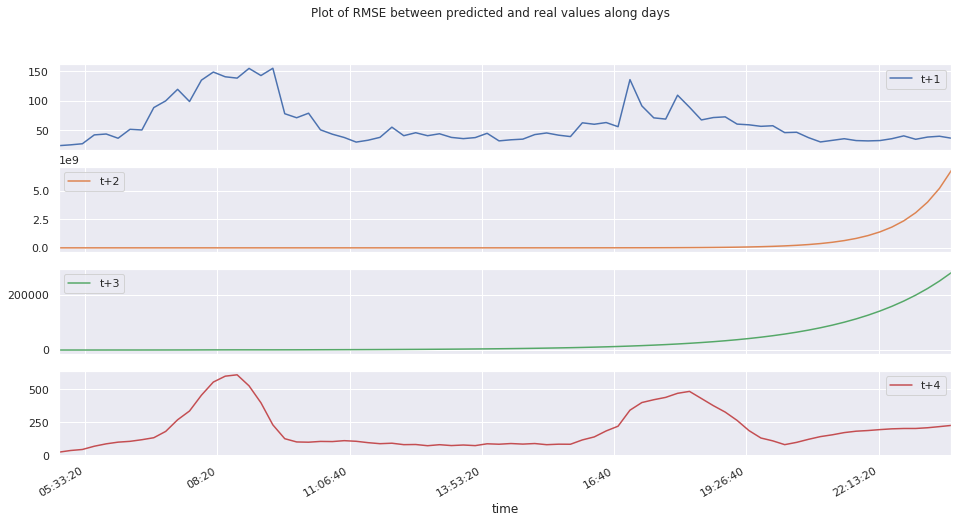

In [106]:
plot_diff_along_time(X_test, arma_preds_s)

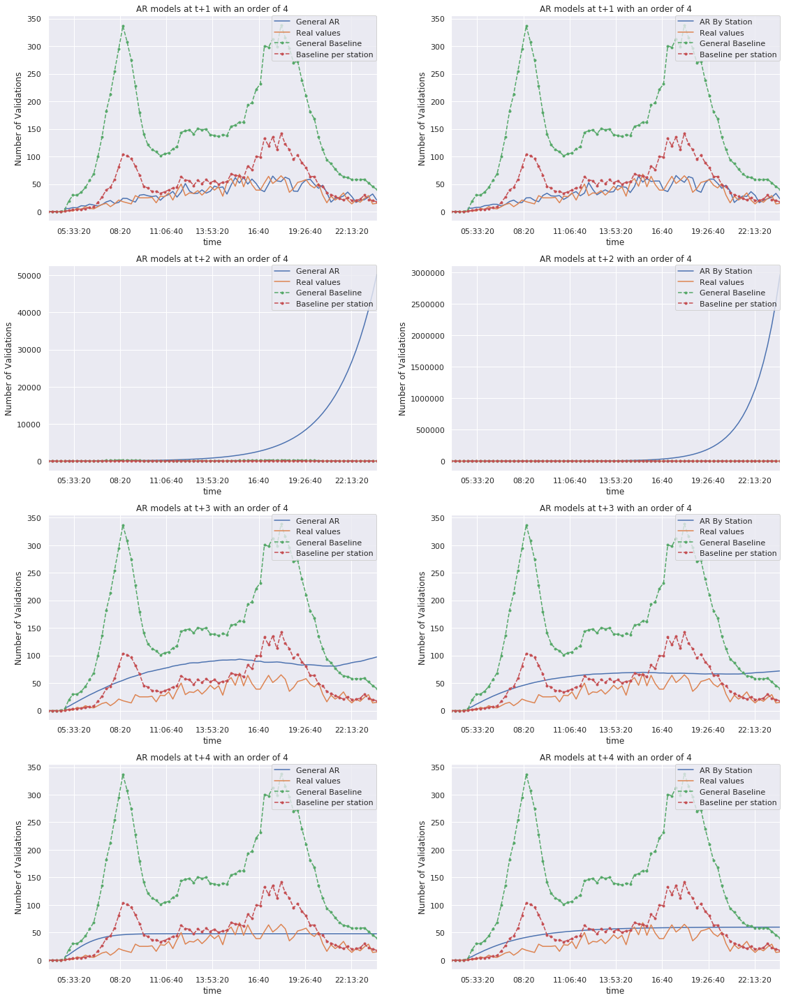

In [107]:
j, s = 2, 100
plot_bispecific(X_test, baseline_preds, arma_preds, arma_preds_s, order, limit_t, j, s)

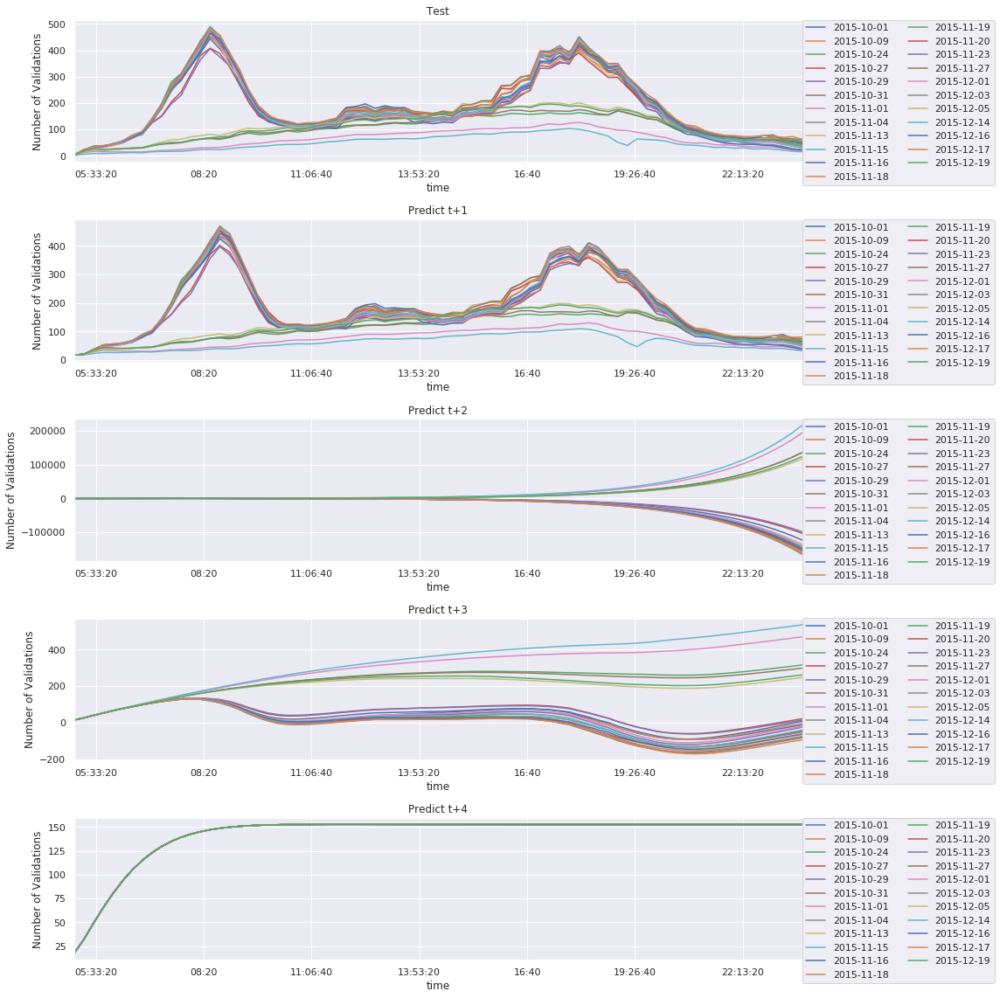

In [108]:
plot_qualitative_analysis(arma_preds, X_test, limit_t, order, subway_stations, del_hours)

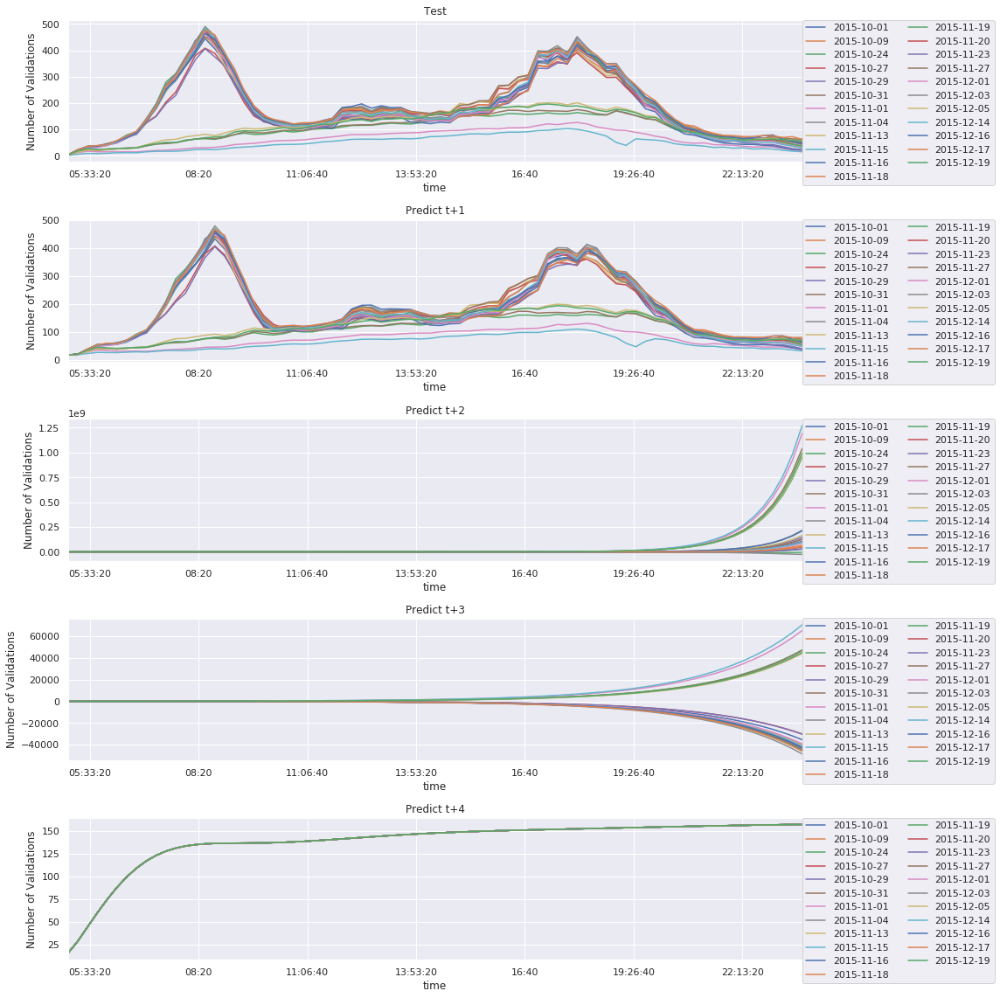

In [109]:
plot_qualitative_analysis(arma_preds_s, X_test, limit_t, order, subway_stations, del_hours)

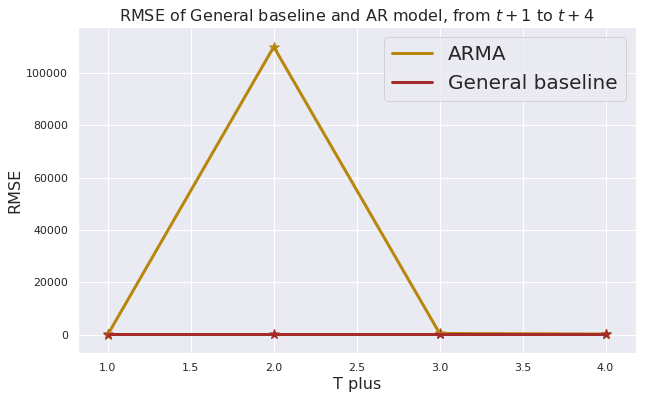

In [110]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 'None'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(arma_scores).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="ARMA")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="General baseline")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.legend(prop={'size': 20})
plt.title("RMSE of General baseline and AR model, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

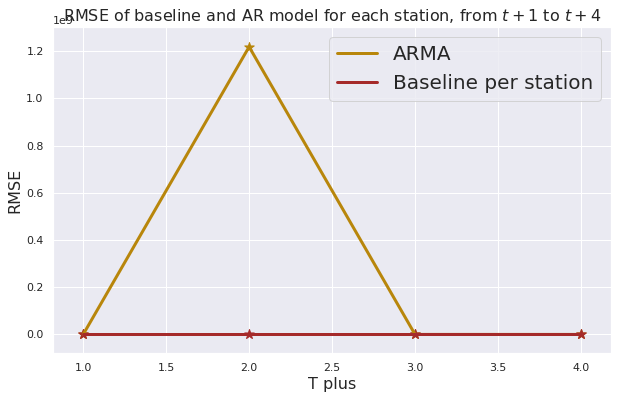

In [111]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.set_prop_cycle(color=['darkgoldenrod', 'brown'])
x = range(1, limit_t+1)
baseline_score = df_baseline_scores.loc['RMSE', 's'].repeat(limit_t).reshape(-1, limit_t).T
model_score = np.array(arma_scores_s).T[1]

ax = plt.plot(x, model_score, linewidth=3, label="ARMA")
ax = plt.scatter(x, model_score, marker='*', s=100)
ax = plt.plot(x, baseline_score, linewidth=3, label="Baseline per station")
ax = plt.scatter(x, baseline_score, marker='*', s=100)

plt.legend(prop={'size': 20})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

#### Compute and Compare 

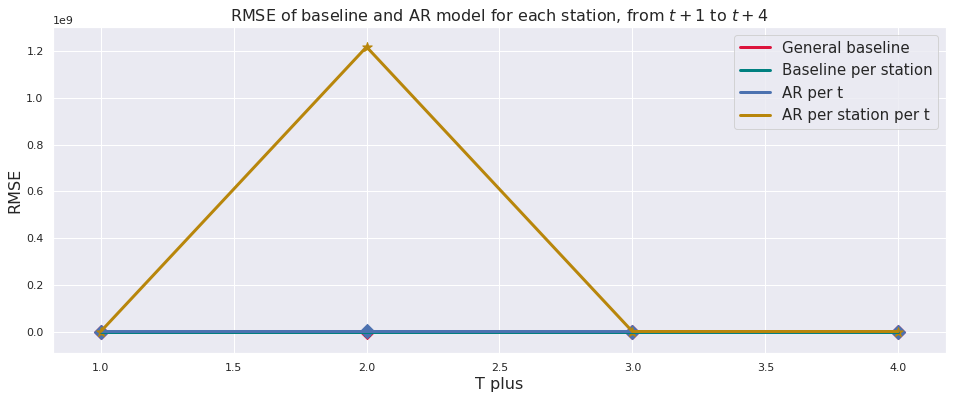

In [112]:
fig, ax = plt.subplots(1, figsize=(16, 6))
ax.set_prop_cycle(color=['crimson', 'teal', 'b', 'darkgoldenrod'])
x = range(1, limit_t+1)
baseline_scores = df_baseline_scores.loc['RMSE'].values.repeat(limit_t).reshape(-1, limit_t).T
model_scores = np.vstack((np.array(arma_scores).T[1], np.array(arma_scores_s).T[1])).T
baselineObjects = plt.plot(x, baseline_scores, linewidth=3)
labels = ["General baseline", "Baseline per station", "AR per t", "AR per station per t"]
arlineObjects = plt.plot(x, model_scores, linewidth=3)

# ['D', '*', '|', 'X']
# labels = ["Full baseline", "Baseline per station", "Baseline per day",
#                    "Baseline per station and day", "Full AR", "AR per station"]
for i, m in zip(range(4), ['D', '*']):
    ax = plt.scatter(x, baseline_scores[:, i], marker=m, s=100)

for i, m in zip(range(2), ['D', '*']):
    ax = plt.scatter(x, model_scores[:, i], marker=m, s=100)
    
plt.legend(baselineObjects+arlineObjects, labels, prop={'size': 15})
plt.title("RMSE of baseline and AR model for each station, from $t+1$ to $t+{}$".format(limit_t), fontsize=16)
plt.xlabel("T plus", fontsize=16); plt.ylabel("RMSE", fontsize=16);

# Recurrent Neural Networks

In [113]:
import torch.nn as nn

In [114]:
class UnivariateRNN():
    def __init__(self):
        pass

## Brouillon 

In [115]:
ar_preds_s

[<class 'pandas.core.panel.Panel'>
 Dimensions: 23 (items) x 301 (major_axis) x 76 (minor_axis)
 Items axis: 2015-10-01 to 2015-12-19
 Major_axis axis: 198 to 60982
 Minor_axis axis: 05:00:00 to 23:45:00, <class 'pandas.core.panel.Panel'>
 Dimensions: 23 (items) x 301 (major_axis) x 76 (minor_axis)
 Items axis: 2015-10-01 to 2015-12-19
 Major_axis axis: 198 to 60982
 Minor_axis axis: 05:00:00 to 23:45:00, <class 'pandas.core.panel.Panel'>
 Dimensions: 23 (items) x 301 (major_axis) x 76 (minor_axis)
 Items axis: 2015-10-01 to 2015-12-19
 Major_axis axis: 198 to 60982
 Minor_axis axis: 05:00:00 to 23:45:00, <class 'pandas.core.panel.Panel'>
 Dimensions: 23 (items) x 301 (major_axis) x 76 (minor_axis)
 Items axis: 2015-10-01 to 2015-12-19
 Major_axis axis: 198 to 60982
 Minor_axis axis: 05:00:00 to 23:45:00]

In [116]:
arb_preds[0].minor_axis

Index([04:00:00, 04:15:00, 04:30:00, 04:45:00, 05:00:00, 05:15:00, 05:30:00,
       05:45:00, 06:00:00, 06:15:00, 06:30:00, 06:45:00, 07:00:00, 07:15:00,
       07:30:00, 07:45:00, 08:00:00, 08:15:00, 08:30:00, 08:45:00, 09:00:00,
       09:15:00, 09:30:00, 09:45:00, 10:00:00, 10:15:00, 10:30:00, 10:45:00,
       11:00:00, 11:15:00, 11:30:00, 11:45:00, 12:00:00, 12:15:00, 12:30:00,
       12:45:00, 13:00:00, 13:15:00, 13:30:00, 13:45:00, 14:00:00, 14:15:00,
       14:30:00, 14:45:00, 15:00:00, 15:15:00, 15:30:00, 15:45:00, 16:00:00,
       16:15:00, 16:30:00, 16:45:00, 17:00:00, 17:15:00, 17:30:00, 17:45:00,
       18:00:00, 18:15:00, 18:30:00, 18:45:00, 19:00:00, 19:15:00, 19:30:00,
       19:45:00, 20:00:00, 20:15:00, 20:30:00, 20:45:00, 21:00:00, 21:15:00,
       21:30:00, 21:45:00, 22:00:00, 22:15:00, 22:30:00, 22:45:00, 23:00:00,
       23:15:00, 23:30:00, 23:45:00],
      dtype='object')

In [117]:
len(generate_times("15min")[(del_hours * 4) + 4:])

76